


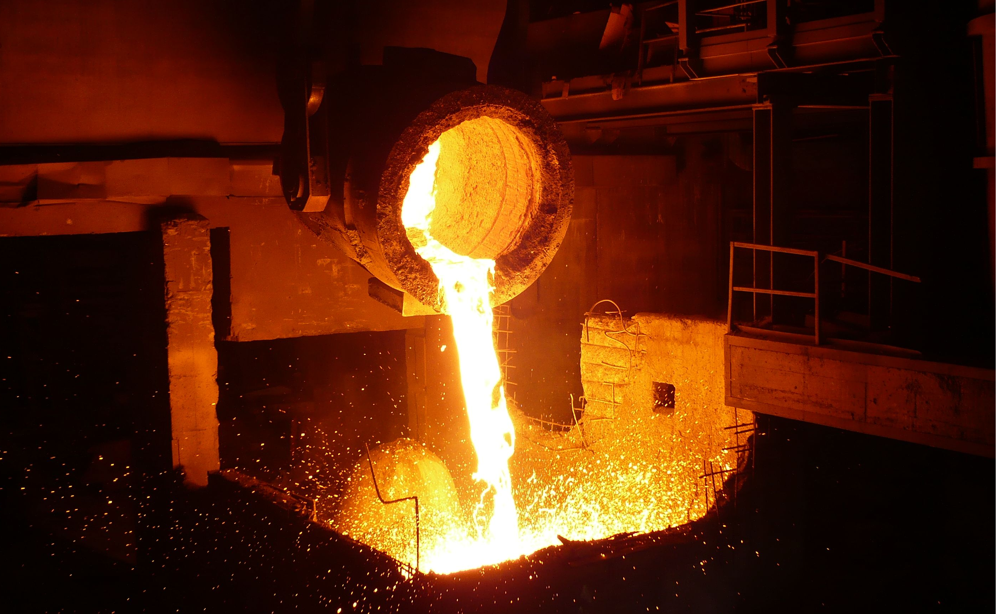

# Project: "Optimizing Production Costs in Steelmaking"

The goal of this project is to create a machine learning model for predicting the temperature in a steelmaking furnace during the steel production process. These predictions can be used by businesses to make managerial decisions aimed at optimizing the production process and identifying stages that have the most significant impact on energy consumption during the melting process.

In this project, the primary objective is to leverage machine learning techniques to develop a predictive model. This model will take various input parameters related to the steelmaking process, such as raw material composition, furnace settings, and operational variables, and use them to forecast the temperature inside the furnace at different time intervals.

### Task Solution Plan
- Familiarize Ourselves with the Data
- Conduct Exploratory Data Analysis (EDA):
    - Check for multicollinearity in the data.
    - Identify and handle any outliers in the dataset.
    - Normalize the data if necessary.

- Since our task is regression, we will consider the following models:
    - Linear regression with regularization.
    - Random Forest for regression.
    - Boosting model (Most likely CatBoost).

- Select an appropriate quality metric (Most likely MSE or MAE).

- Utilize cross-validation and RandomizedSearchCV to tune hyperparameters and determine the best-performing model.

- Test the final model on the test dataset.

- Perform an analysis of errors and feature importance and Shapley Values via SHAP.

### Loading Libraries

In [1]:
!pip install shap

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import optuna
import shap

from sklearn.model_selection import (train_test_split, 
                                     RandomizedSearchCV,
                                     cross_val_score,
                                     GridSearchCV,
                                     KFold)

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_absolute_error

from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor


shap.initjs()
RANDOM_STATE = 10823

### Helper Functions

In [3]:
def data_overview(data_list, data_info):
    """
    Display an overview of the provided dataframes.

    Args:
        data_list (list of pd.DataFrame): A list of dataframes to be analyzed.
        data_info (list of str): A list of corresponding information or descriptions for the dataframes.

    Returns:
        None
    """
    for df, info in zip(data_list, data_info):
        print(f'\n {"# " * 42} \n{" "*25}{info}\n {"# " * 42} \n')
        display(df.info(),
                df.describe(),
                df.head(5))

def corr_heatmap(df, target=None, absolute=False):
    """
    Generate a heatmap of the correlation matrix for a dataframe.

    Args:
        df (pd.DataFrame): The dataframe for which the correlation heatmap is generated.
        target (str, optional): A target variable name to highlight its correlations with other features.
        absolute (bool, optional): If True, use the absolute values of correlations.

    Returns:
        None
    """
    from matplotlib.colors import TwoSlopeNorm

    if absolute:
        corr_matrix = df.corr().abs()
    else:
        corr_matrix = df.corr()

    corr_matrix = round(corr_matrix, 1).replace(-0.0, 0)

    if target:
        target_rows = corr_matrix.index[corr_matrix.index.str.contains(target)]
        target_columns = corr_matrix.columns[corr_matrix.columns.str.contains(target)]

        fig, ax = plt.subplots(figsize=(20, 15))
        norm = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
        ax = sns.heatmap(corr_matrix, annot=True, fmt='0.1f', cmap='bwr', ax=ax, lw=0.5, linecolor='black', norm=norm)

        for i, row_name in enumerate(corr_matrix.index):
            if row_name in target_rows:
                ax.add_patch(plt.Rectangle((i, 0), 1, df.shape[1], fill=False, edgecolor='black', lw=4))
        for j, col_name in enumerate(corr_matrix.columns):
            if col_name in target_columns:
                ax.add_patch(plt.Rectangle((0, j), df.shape[0], 1, fill=False, edgecolor='black', lw=4))

    ax.add_patch(plt.Rectangle((corr_matrix.shape[1], 0), 1, corr_matrix.shape[0], fill=False, edgecolor='black', lw=2))
    ax.add_patch(plt.Rectangle((0, corr_matrix.shape[0]), corr_matrix.shape[1], 1, fill=False, edgecolor='black', lw=2))

    plt.show()

def optuna_study_info(study):
    """
    Display information about an Optuna study.

    Args:
        study (optuna.study.Study): The Optuna study object to extract information from.

    Returns:
        None
    """
    trial = study.best_trial
    print("Study name:", study.study_name)
    print("Number of finished trials:", len(study.trials))
    print("Best trial:")
    print("  Value: ", trial.value)
    print("  Params: ")
    for key, value in trial.params.items():
        print("    {}: {}".format(key, value))


## Data Loading and Familiarization

In [4]:
# Data about electrodes
data1 = pd.read_csv('https://code.s3.yandex.net/datasets/data_arc_new.csv')

# Data about the bulk materials feed (volume)
data2 = pd.read_csv('https://code.s3.yandex.net/datasets/data_bulk_new.csv')

# Data about the bulk materials feed (time of feeding)
data3 = pd.read_csv('https://code.s3.yandex.net/datasets/data_bulk_time_new.csv')

# Data about gas blowing during alloy production
data4 = pd.read_csv('https://code.s3.yandex.net/datasets/data_gas_new.csv')

# Temperature measurement results
data5 = pd.read_csv('https://code.s3.yandex.net/datasets/data_temp_new.csv')

# Data about wire materials (volume)
data6 = pd.read_csv('https://code.s3.yandex.net/datasets/data_wire_new.csv')

# Data about wire materials (time of feeding)
data7 = pd.read_csv('https://code.s3.yandex.net/datasets/data_wire_time_new.csv')

# Compile the data into a list for use in the function
data_info = ['Data about electrodes', 'Data about the bulk materials feed (volume)', \
             'Data about the bulk materials feed (time of feeding)', 'Data about gas blowing during alloy production', \
             'Temperature measurement results', 'Data about wire materials (volume)', \
             'Data about wire materials (time of feeding)', 'Compile the data into a list for use in the function']

data_list = [data1, data2, data3, data4, data5, data6, data7]

In [5]:
data_overview(data_list, data_info)


 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  
                         Data about electrodes
 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


None

,key,Активная мощность,Реактивная мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.662752,0.438986
std,934.571502,0.258885,5.873485
min,1.000000,0.223120,-715.479924
25%,806.000000,0.467115,0.337175
50%,1617.000000,0.599587,0.441639
75%,2429.000000,0.830070,0.608201
max,3241.000000,1.463773,1.270284


,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691



 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  
                         Data about the bulk materials feed (volume)
 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 1

None

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0



 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  
                         Data about the bulk materials feed (time of feeding)
 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 

None

,key
count,3129.000000
mean,1624.383509
std,933.337642
min,1.000000
25%,816.000000
50%,1622.000000
75%,2431.000000
max,3241.000000


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:28:48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:24:31,NaN,2019-05-03 11:14:50,2019-05-03 11:10:43
1,2,NaN,NaN,NaN,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:53:30,NaN,2019-05-03 11:48:37,2019-05-03 11:44:39
2,3,NaN,NaN,NaN,2019-05-03 12:32:39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:27:13,NaN,2019-05-03 12:21:01,2019-05-03 12:16:16
3,4,NaN,NaN,NaN,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:58:00,NaN,2019-05-03 12:51:11,2019-05-03 12:46:36
4,5,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,2019-05-03 13:34:12,2019-05-03 13:30:47



 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  
                         Data about gas blowing during alloy production
 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


None

,key,Газ 1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692



 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  
                         Temperature measurement results
 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           18092 non-null  int64  
 1   Время замера  18092 non-null  object 
 2   Температура   14665 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 424.2+ KB


None

,key,Температура
count,18092.000000,14665.000000
mean,1616.460977,1590.722741
std,934.641385,20.394381
min,1.000000,1191.000000
25%,807.750000,1580.000000
50%,1618.000000,1590.000000
75%,2429.000000,1599.000000
max,3241.000000,1705.000000


,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0



 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  
                         Data about wire materials (volume)
 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


None

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,3081.000000,3055.000000,1079.000000,63.000000,14.000000,1.000,73.000000,11.000000,19.000000,29.000000
mean,1623.426485,100.895853,50.577323,189.482681,57.442841,15.132,48.016974,10.039007,53.625193,34.155752
std,932.996726,42.012518,39.320216,99.513444,28.824667,NaN,33.919845,8.610584,16.881728,19.931616
min,1.000000,1.918800,0.030160,0.144144,24.148801,15.132,0.034320,0.234208,45.076721,4.622800
25%,823.000000,72.115684,20.193680,95.135044,40.807002,15.132,25.053600,6.762756,46.094879,22.058401
50%,1619.000000,100.158234,40.142956,235.194977,45.234282,15.132,42.076324,9.017009,46.279999,30.066399
75%,2434.000000,126.060483,70.227558,276.252014,76.124619,15.132,64.212723,11.886057,48.089603,43.862003
max,3241.000000,330.314424,282.780152,385.008668,113.231044,15.132,180.454575,32.847674,102.762401,90.053604


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN



 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  
                         Data about wire materials (time of feeding)
 # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


None

,key
count,3081.000000
mean,1623.426485
std,932.996726
min,1.000000
25%,823.000000
50%,1619.000000
75%,2434.000000
max,3241.000000


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:06:19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:11:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN


As we can see, in almost all tables, the data is already grouped by a key (except for the tables with data about electrodes and temperature), and this key will be our modeling object.

For the target variable, we will take the temperature value at the final stage for each ladle. Therefore, we will be solving a regression problem.

There are missing values and outliers in the data, and we will determine their nature and processing strategy as we work.

From the columns with date/time, we may be able to extract/create additional features. However, we won't directly use the date/time information for modeling.

Our task is to study and preprocess the data in each table and ultimately compile them into a single table for more in-depth analysis and preparation for modeling.

Before we embark on exploratory data analysis, let's study and process each table separately, and subsequently, we will perform merging based on the modeling object (the key).

## Electrode Data

Calculate and add to the table the total power using the formula: $$\text{Apparent Power} = \sqrt{\text{Active Power}^2 + \text{Reactive Power}^2}$$

Then, sum the results of calculations for each row corresponding to the observation object - ladle (**key**).

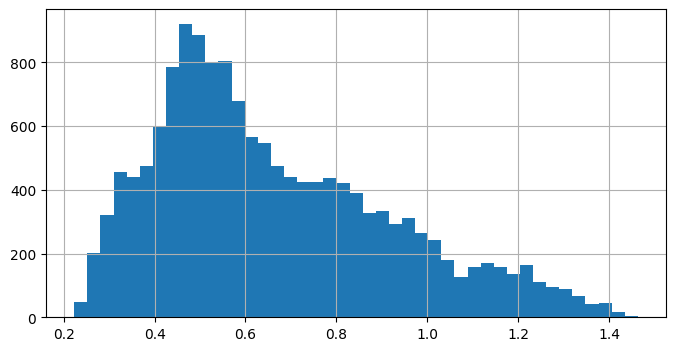

In [6]:
data1['Активная мощность'].hist(figsize=(8,4), bins='auto');

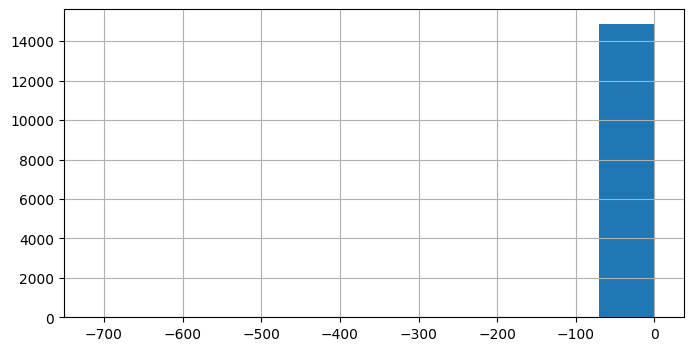

In [7]:
data1['Реактивная мощность'].hist(figsize=(8,4));

Based on the histogram, it appears that we have extremely negative values for Reactive Power. Let's take a closer look at them.

In [8]:
data1[data1['Реактивная мощность'] <= 0]

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
9780,2116,2019-07-28 02:22:08,2019-07-28 02:23:57,0.705344,-715.479924


Reactive Power = -715 appears to be a clear error. Let's replace it with the mean value of reactive power.

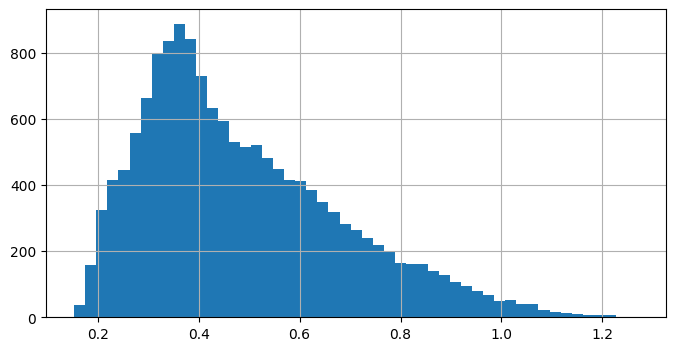

In [9]:
data1.loc[9780, 'Реактивная мощность'] = data1['Реактивная мощность'].mean()

# Посмотрим как выглядят данные после преобразования
data1['Реактивная мощность'].hist(figsize=(8,4), bins='auto');

Now, "Active Power" and "Reactive Power" have a roughly normal distribution with a slight right skew.

Next, let's add a column for apparent power.

**Let's add an additional feature: total heating time.**

In [10]:
# Let's create a new column 'heat_time_delta' with the difference between
# the end time of arc heating and the start time
data1['heat_time_delta'] = (pd.to_datetime(data1['Конец нагрева дугой']) - pd.to_datetime(data1['Начало нагрева дугой'])) \
                           .dt.total_seconds()

# Sum the values for each object ('key')
sum_heat_time_delta = data1.groupby('key')['heat_time_delta'].sum().reset_index()

# Join the calculation results back to the original table using the 'key' column
data1 = data1.merge(sum_heat_time_delta.rename(columns={'heat_time_delta': 'total_heat_time'}), how='left', on='key')

**Let's add an additional feature: total power.**

In [11]:
# Let's create a new column 'apparent_power' with the calculation result
data1['apparent_power'] = np.sqrt(data1['Активная мощность']**2 + data1['Реактивная мощность']**2)

# Perform summation
sum_apparent_power = data1.groupby('key')['apparent_power'].sum().reset_index()

# Join the calculation results back to the original table using the 'key' column
data1 = data1.merge(sum_apparent_power.rename(columns={'apparent_power': 'apparent_power_sum'}), how='left', on='key')

**Let's add an additional feature: work.**

In [12]:
data1['work_done'] = data1['apparent_power'] * data1['total_heat_time']

**Let's clean up the table.**

In [13]:
# Let's remove active, reactive, apparent power, and heating time as we no longer need them.
data1 = data1.drop(['Начало нагрева дугой', 'Конец нагрева дугой',\
                    'Активная мощность', 'Реактивная мощность', 'apparent_power', 'heat_time_delta'], axis=1)

# Let's remove complete duplicates
data1 = data1.drop_duplicates(subset=['apparent_power_sum'])

# Let's check the result of the transformations
data1.head(5)

,key,total_heat_time,apparent_power_sum,work_done
0,1,1098.0,3.718736,407.492855
5,2,811.0,2.588349,357.033543
9,3,655.0,5.019223,899.880133
14,4,741.0,3.400038,610.913421
18,5,869.0,2.816980,371.987899


Now, each modeling object corresponds to a single value of apparent power.

## Bulk Material Feed Data (Volume)

As we observed during the initial inspection, this table contains many missing values. It is reasonable to assume that these gaps occur when bulk materials were not added to the ladle.

Based on this assumption, we will replace all missing values in this table with zeros.

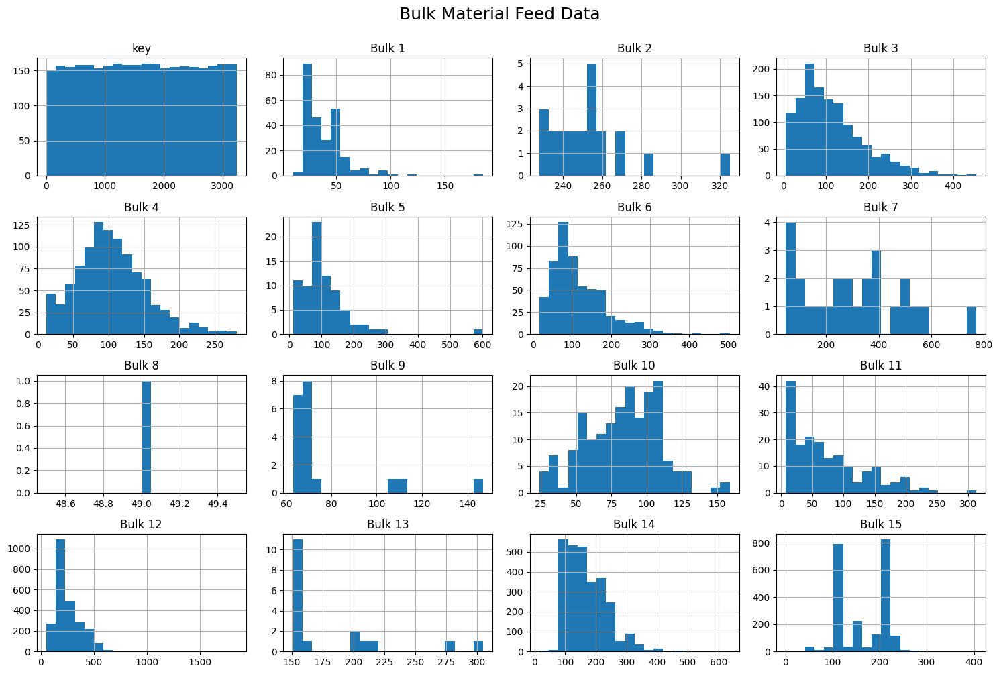

In [14]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 10))
data2.hist(figsize=(25,15), bins=20, ax=axes)
plt.suptitle('Bulk Material Feed Data', size=18, y=1)
plt.tight_layout()
plt.show()


In [15]:
data2 = data2.fillna(0)
display(data2.head(5))

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0
1,2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0
2,3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0
3,4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0
4,5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0


Now, this table contains information about the volumes of bulk material feed for each ladle.

Missing values have been replaced with '$0$'. The data is now suitable for input into the model.

## Bulk Material Feed Data (Time)

In [16]:
data3.head(5)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:28:48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:24:31,NaN,2019-05-03 11:14:50,2019-05-03 11:10:43
1,2,NaN,NaN,NaN,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:53:30,NaN,2019-05-03 11:48:37,2019-05-03 11:44:39
2,3,NaN,NaN,NaN,2019-05-03 12:32:39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:27:13,NaN,2019-05-03 12:21:01,2019-05-03 12:16:16
3,4,NaN,NaN,NaN,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:58:00,NaN,2019-05-03 12:51:11,2019-05-03 12:46:36
4,5,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,2019-05-03 13:34:12,2019-05-03 13:30:47


In this table, we have information about the timing of bulk material feed into the ladle. This information is not needed for modeling, and we will not use it.

## Gas Blowing Data

During the initial inspection of the data, it was apparent that this table may contain anomalous values.

Let's take a closer look at the data.

In [17]:
data4.describe()

,key,Газ 1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


In this table, each modeling object corresponds to a value representing the volume of gas used during the process.

Let's create a boxplot to visualize outliers in the data.

<Axes: title={'center': 'Gas Delivery Data'}>

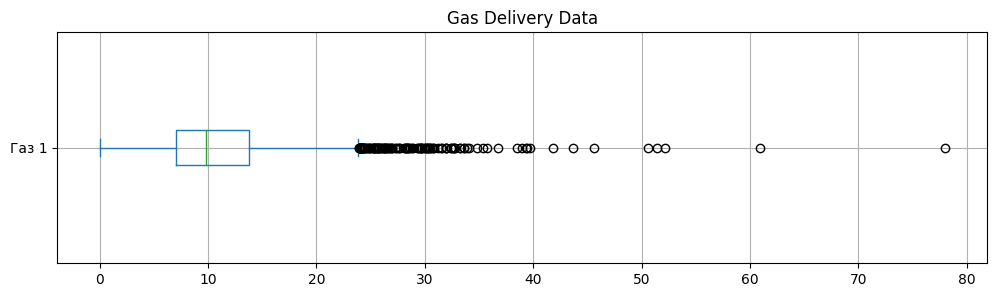

In [18]:
data4['Газ 1'].plot.box(figsize=(12, 3), vert=False, grid=True, title='Gas Delivery Data')


There are a significant number of anomalous values in the data. However, considering that the client provided us with real data from the technical process, it would be impractical to delete or modify these data points. We will leave the data unchanged and use it for model training.

## Temperature Measurement Results

Since the melting temperature of steel is 1500 degrees, we will keep only those observations where the temperature is greater than or equal to 1500.

For modeling purposes, we will retain only the temperature at the first and last stages for each modeling object. The measurement time will not be needed for modeling.

We also need to decide on a strategy for handling missing temperature values.

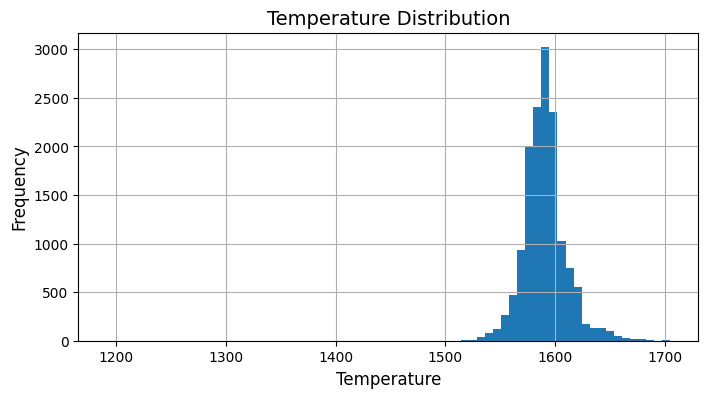

In [19]:
data5['Температура'].hist(bins=70, figsize=(8, 4))
plt.title('Temperature Distribution', size=14)
plt.xlabel('Temperature', size=12)
plt.ylabel('Frequency', size=12)
plt.show()

In [20]:
#Let's see in which objects the temperature is less than 1500 degrees.
data5.query('Температура < 1500')

,key,Время замера,Температура
4883,867,2019-06-06 08:03:39,1191.0
6784,1214,2019-06-18 08:01:03,1208.0
9050,1619,2019-07-03 02:34:41,1218.0
11495,2052,2019-07-25 08:49:15,1227.0
14283,2561,2019-08-12 18:49:29,1204.0


In [21]:
# Let's record the keys of objects with temperatures below 1500 for subsequent removal
keys_to_drop = data5.query('Температура < 1500')['key'].tolist()

# Let's check the result
display(keys_to_drop)

[867, 1214, 1619, 2052, 2561]

In [22]:
# Let's check how many missing values we have in the temperature column.
data5['Температура'].isna().sum()

3427

Since our temperature data is not grouped by keys, let's group it and see which stages of the process have missing values.

In [23]:
# Let's group the data without using aggregation functions.
# We'll store the GroupBy object in a variable.
grouped_data = data5.groupby('key')

# Filter the groups, keeping only those groups with missing data.
filtered_groups = grouped_data.filter(lambda x: x['Температура'].isna().any())

# Save the unique keys of objects without temperature data for subsequent removal.
key_no_temp = filtered_groups['key'].unique()

# Let's see how many objects have missing temperature data.
display(len(key_no_temp))

739

In [24]:
# Let's filter the data by removing objects (keys) that had missing temperature values or where the temperature value was less than 1500.
data5 = data5.query('key not in @key_no_temp and key not in @keys_to_drop')

In [25]:
# Let's check the result
data5['Температура'].isna().sum()

0

Let's take a look at how the data distribution looks now.

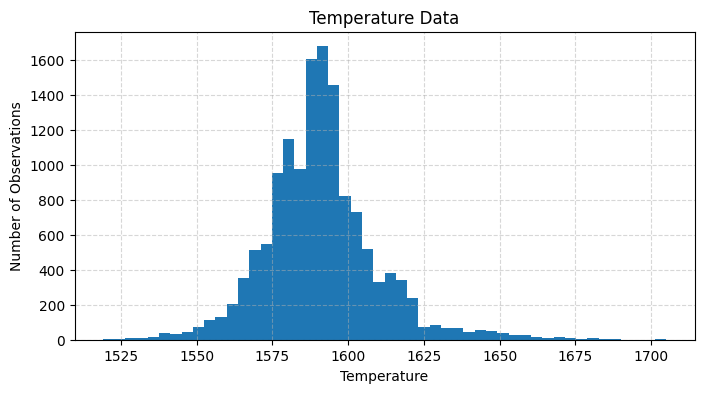

In [26]:
data5['Температура'].hist(bins=50, figsize=(8, 4))
plt.grid(True, ls='--', alpha=0.5)
plt.ylabel('Number of Observations')
plt.xlabel('Temperature')
plt.title('Temperature Data')
plt.show()


We can see that the temperature data distribution resembles a normal distribution (bell-shaped). 

We will not process outliers for the same reason as before.

In [27]:
# Let's keep only the temperature at the first and last stages for each observation object (ladle/key).
first_temp = data5.groupby('key')['Температура'].first().reset_index()
last_temp = data5.groupby('key')['Температура'].last().reset_index()

# Add the results of 'first_temp' and 'last_temp' calculations to the table.
data5 = data5.merge(first_temp.rename(columns={'Температура': 'first_temp'}), how='left', on='key')
data5 = data5.merge(last_temp.rename(columns={'Температура': 'last_temp'}), how='left', on='key')

# Check the result of the transformations.
display(data5.head(7))

,key,Время замера,Температура,first_temp,last_temp
0,1,2019-05-03 11:02:04,1571.0,1571.0,1613.0
1,1,2019-05-03 11:07:18,1604.0,1571.0,1613.0
2,1,2019-05-03 11:11:34,1618.0,1571.0,1613.0
3,1,2019-05-03 11:18:04,1601.0,1571.0,1613.0
4,1,2019-05-03 11:25:59,1606.0,1571.0,1613.0
5,1,2019-05-03 11:30:38,1613.0,1571.0,1613.0
6,2,2019-05-03 11:34:04,1581.0,1581.0,1602.0


Great! The addition of the `first_temp` and `last_temp` features, corresponding to each ladle, has been successful.

***
Also, at this stage, we attempted to create an additional feature, `temp_delta`, as the difference between the final and initial temperatures. This was incorrect. Creating additional features based on target variables is not allowed. It leads to data leakage: overly optimistic results during model training and an inability to make meaningful inferences.
***

Let's create an additional feature, `time_delta`, as the difference in minutes between the time of the last and first temperature measurements.

In [28]:
data5['Время замера'] = pd.to_datetime(data5['Время замера'])

time_diff_minutes = ((data5.groupby('key')['Время замера'].last() - data5.groupby('key')['Время замера'].first())\
                     .dt.total_seconds() / 60).astype(float)

In [29]:
# Let's remove the measurement time and temperature from the table
data5 = data5.drop(['Время замера', 'Температура'], axis=1)

# Remove complete duplicates from the table
data5 = data5.drop_duplicates(subset='key')

# Create a new column 'time_delta' using 'map' on 'key'
time_diff_dict = time_diff_minutes.to_dict()
data5['time_delta'] = data5['key'].map(time_diff_dict)

# Check the result of the transformations.
display(data5.head(7))

,key,first_temp,last_temp,time_delta
0,1,1571.0,1613.0,28.566667
6,2,1581.0,1602.0,21.083333
11,3,1596.0,1599.0,29.216667
17,4,1601.0,1625.0,20.333333
22,5,1576.0,1602.0,25.600000
27,6,1543.0,1596.0,24.950000
32,7,1586.0,1599.0,29.066667


Great! The addition of the `first_temp` and `last_temp` features, corresponding to each ladle, has been successful.

## Data on wire materials (Volume)

As we could see during our initial exploration of the data, there are many missing values in this table. It's reasonable to assume that these gaps occur when wire materials were not supplied to the ladle.

Based on this assumption, we will replace all missing values in this table with zeros.

In [30]:
data6 = data6.fillna(0)
data6.head(5)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Let's plot histograms for each of the 'Wire n' columns.

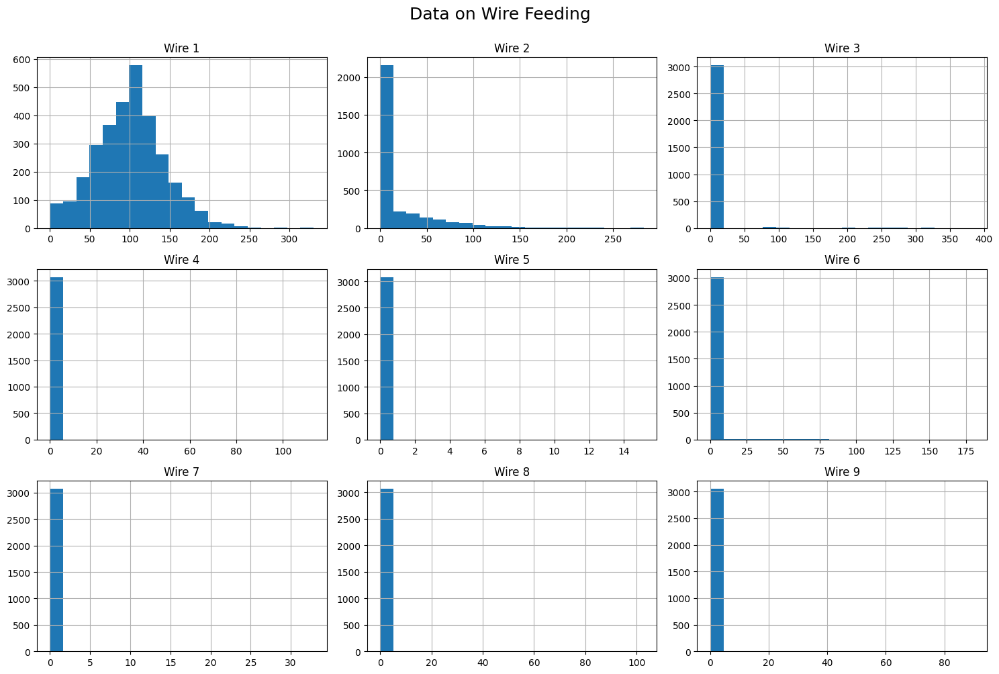

In [31]:
wire_data = data6.drop('key', axis=1)

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 10))
wire_data.hist(figsize=(15,10), bins=20, ax=axes.flatten())
plt.suptitle('Data on Wire Feeding', size=18, y=1)
plt.tight_layout()
plt.show()


Based on the graphs, it is evident that there are outliers in the data. We will not remove or process these outliers, considering that they are real production data.

In the table, for each modeling object (ladle), the value of the wire material volume is indicated.

## Data on Wire Materials (Feeding Time)

We will not be using information about the feeding time of wire materials into the ladle for modeling purposes.

# Let's Combine the Data into a Single Table

We will combine the data and remove any obvious duplicates.

In [32]:
data1_5 = pd.merge(data1, data5, how='inner', on='key')
data1_5_2 = pd.merge(data1_5, data2, how='inner', on='key')
data1_5_2_4 = pd.merge(data1_5_2, data4, how='inner', on='key')
data1_5_2_4_6 = pd.merge(data1_5_2_4, data6, how='inner', on='key')

data_merged = data1_5_2_4_6.copy()

Let's convert the column names to snake case.

In [33]:
# Rename the 'Газ 1' Column
data_merged = data_merged.rename(columns={'Газ 1': 'gas'})

# Convert Column Names to Lowercase
data_merged.rename(columns={col: col.lower() for col in data_merged.columns}, inplace=True)

# Replace Spaces with Underscores
data_merged.columns = data_merged.columns.str.replace(' ', '_')

# Remove the 'key' Column as it is not needed
data_merged = data_merged.drop('key', axis=1)

# Check the Result of the Merge
display(data_merged.shape, data_merged.head(10))

(2325, 31)

,total_heat_time,apparent_power_sum,work_done,first_temp,last_temp,time_delta,bulk_1,bulk_2,bulk_3,bulk_4,...,gas,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9
0,1098.0,3.718736,407.492855,1571.0,1613.0,28.566667,0.0,0.0,0.0,43.0,...,29.749986,60.059998,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,811.0,2.588349,357.033543,1581.0,1602.0,21.083333,0.0,0.0,0.0,73.0,...,12.555561,96.052315,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,655.0,5.019223,899.880133,1596.0,1599.0,29.216667,0.0,0.0,0.0,34.0,...,28.554793,91.160157,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,741.0,3.400038,610.913421,1601.0,1625.0,20.333333,0.0,0.0,0.0,81.0,...,18.841219,89.063515,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,869.0,2.816980,371.987899,1576.0,1602.0,25.600000,0.0,0.0,0.0,78.0,...,5.413692,89.238236,9.114560,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,952.0,3.313074,463.562002,1543.0,1596.0,24.950000,0.0,0.0,0.0,117.0,...,11.273392,99.109917,9.114560,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,673.0,3.283913,461.649454,1586.0,1599.0,29.066667,0.0,0.0,0.0,117.0,...,9.836267,98.061600,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,913.0,3.405956,454.096881,1577.0,1598.0,26.916667,0.0,0.0,0.0,99.0,...,15.171553,155.282394,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,625.0,4.335261,840.199234,1587.0,1592.0,30.183333,0.0,0.0,0.0,117.0,...,8.216623,113.393279,9.143681,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,825.0,3.791005,426.726736,1574.0,1593.0,25.850000,0.0,0.0,0.0,0.0,...,6.529891,81.244796,12.376000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Intermediate Result

In total, we have a table with 29 columns (28 features and the target variable) and 2,325 rows, each corresponding to a specific ladle modeling object.

During the preliminary data processing, we did the following:

- Removed objects with a melt temperature < 1500 and objects with missing temperature values.
- Added additional features such as `'time_delta'`, `'apparent_power'`, `'work_done'`, and `'total_heat_time'`.
- Removed columns related to the time of adding bulk and wire materials.
- Replaced missing values in the tables with information about the volume of bulk and wire materials with 0.
- Merged the original tables using the `key` field with an 'inner' method. When using the 'inner' method, the result of the merge includes only those observations where the values in the specified `on` field (in our case, the `key` field) match.

During the preliminary data processing, we chose not to:

- Process anomalous values based on the assumption that the provided data does not contain errors and truthfully describes the real technological process.

# Exploratory Data Analysis

In [34]:
# For convenience, let's rename the final table to 'df'
df = data_merged.copy()

# Let's take a look at the final table.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2325 entries, 0 to 2324
Data columns (total 31 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   total_heat_time     2325 non-null   float64
 1   apparent_power_sum  2325 non-null   float64
 2   work_done           2325 non-null   float64
 3   first_temp          2325 non-null   float64
 4   last_temp           2325 non-null   float64
 5   time_delta          2325 non-null   float64
 6   bulk_1              2325 non-null   float64
 7   bulk_2              2325 non-null   float64
 8   bulk_3              2325 non-null   float64
 9   bulk_4              2325 non-null   float64
 10  bulk_5              2325 non-null   float64
 11  bulk_6              2325 non-null   float64
 12  bulk_7              2325 non-null   float64
 13  bulk_8              2325 non-null   float64
 14  bulk_9              2325 non-null   float64
 15  bulk_10             2325 non-null   float64
 16  bulk_1

- There are no missing values in the data.
- The strategy for handling outliers has been defined.
- Additional features were created in the previous stage.

Our next steps are as follows:
- Conduct an analysis for multicollinearity in the data.
- Scale the data.
    - We will perform data normalization using **RobustScaler** from the **Sci-kit Learn** library within a pipeline to avoid data leakage during cross-validation.
        - **RobustScaler** will help us mitigate the negative impact of anomalous values on the model training process.
- Split the data into training features and the target variable.
- Split the data into training and testing sets.

### Multicollinearity Analysis

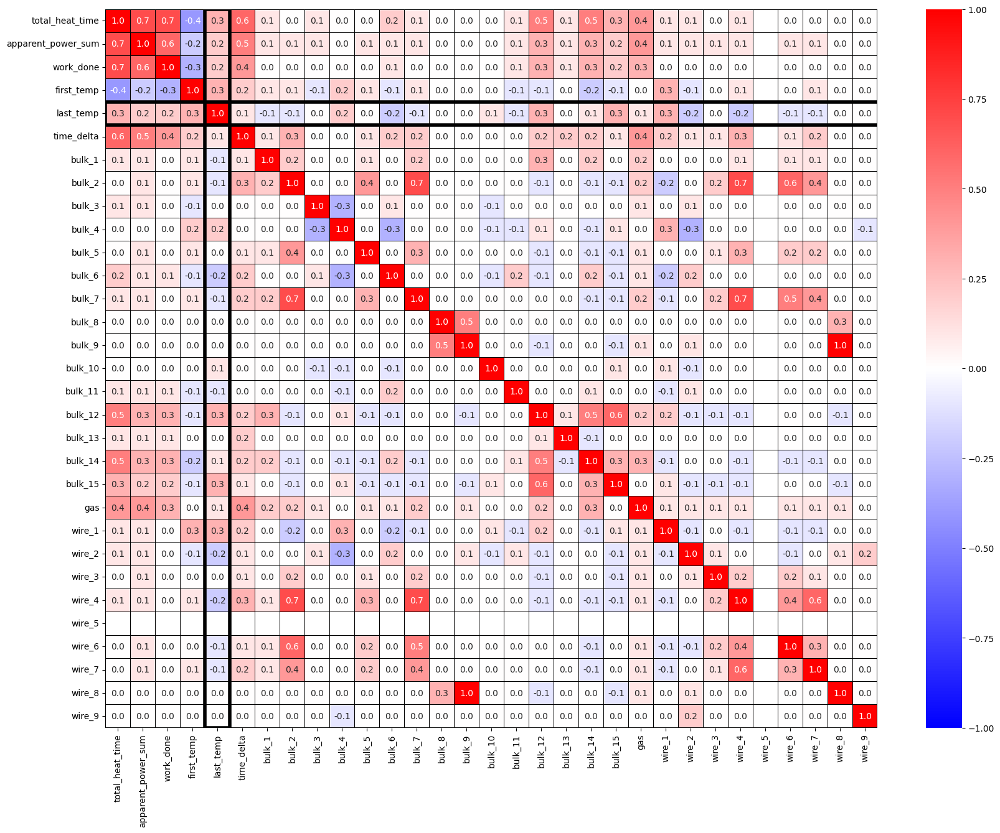

In [35]:
# Plot a correlation heatmap
corr_heatmap(df, target='last_temp', absolute=False)

**Insight:** Among all the wire materials, only "wire1" exhibits a positive correlation with the target feature, and it is quite strong. Meanwhile, the other wire materials either have a negative correlation or no correlation at all.

From the heatmap, we can observe that the feature "wire_5" has no correlation with other features (including the target) because it contains only zeros. We should remove this column.

The features "bulk_9" and "wire_8" both have a positive correlation of 1, but neither of them has any correlation with the target feature "last_temp." We should remove the "bulk_9" feature from the dataset.

Overall, based on the heatmap, the issue of multicollinearity in the data is nearly absent.

In [36]:
# Remove the features "wire_5" and "bulk_9"
df = df.drop(['wire_5', 'bulk_9'], axis=1)

### Data Splitting
Target Feature: $\text{"last_temp"}$ – the final temperature measurement in the ladle before casting slabs.

In [37]:
# Split data into features and target
features = df.drop('last_temp', axis=1)
target = df.last_temp

display(features.shape, target.shape)

(2325, 28)

(2325,)

In [38]:
# Split data in train and test sets
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.25, random_state=RANDOM_STATE)

# Check the result
print(x_train.shape, y_train.shape, '\n', x_test.shape, y_test.shape)

(1743, 28) (1743,) 
 (582, 28) (582,)


All Ok.

When choosing a model, we will proceed in increasing order of model complexity:

1. Ridge Linear Regression
2. Random Forest for Regression
3. Boosting Model (CatBoostRegressor)

As the quality metric for cross-validation, we will choose Mean Absolute Error (MAE) because it is less sensitive to outliers compared to Mean Squared Error (MSE).

### Linear Regression Ridge

When training Ridge Linear Regression, we can afford to use **GridSearch** because we only need to explore two hyperparameters, and building Ridge models during training is fast.

In [39]:
%%time 
# Execution time ~ 15 sec.

# Dictionary of parameters for grid search
param_dict = {'alpha':    [x for x in np.logspace(-3, 2, num=100)],
              'max_iter': [int(x) for x in np.linspace(1000, 2000, 5)]} 

# Adapting the dictionary for use in a Pipeline
param_dict_pipe = {'model__' + key: value for key, value in param_dict.items()}

# Feature scaling is performed using a Pipeline.
pipeline = Pipeline(steps=[('scaler', RobustScaler()),
                           ('model',  Ridge(random_state=RANDOM_STATE))],
                            verbose=False)

# Grid Search
gs_cv_ridge = GridSearchCV(estimator = pipeline,
                           param_grid = param_dict_pipe,
                           cv = 5, verbose = 10, n_jobs = -1,
                           scoring = 'neg_mean_absolute_error',)

# Training
gs_cv_ridge.fit(x_train, y_train)


Fitting 5 folds for each of 500 candidates, totalling 2500 fits
CPU times: total: 1.45 s
Wall time: 6.62 s


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', RobustScaler()),
                                       ('model', Ridge(random_state=10823))]),
             n_jobs=-1,
             param_grid={'model__alpha': [0.001, 0.0011233240329780276,
                                          0.0012618568830660211,
                                          0.0014174741629268048,
                                          0.0015922827933410922,
                                          0.001788649529057435,
                                          0.002009233002565048,
                                          0.002257019719633919,
                                          0.0025353644939701114,
                                          0.002848035868435802,
                                          0.00...
                                          0.007220809018385464,
                                          0.008111308307896872,
                                          0.009111627561154887,
                                          0.010235310218990263,
                                          0.011497569953977356,
                                          0.01291549665014884,
                                          0.014508287784959394,
                                          0.016297508346206444,
                                          0.01830738280295368,
                                          0.020565123083486514,
                                          0.02310129700083159,
                                          0.02595024211399736,
                                          0.029150530628251757, ...],
                         'model__max_iter': [1000, 1250, 1500, 1750, 2000]},
             scoring='neg_mean_absolute_error', verbose=10)

In [40]:
print(f'Best Ridge result during cross-validation: {-gs_cv_ridge.best_score_}\n')
print(f'Best Ridge parameters during cross-validation: {gs_cv_ridge.best_params_}')


Best Ridge result during cross-validation: 5.897803397158141

Best Ridge parameters during cross-validation: {'model__alpha': 12.32846739442066, 'model__max_iter': 1000}


### RandomForestRegressor
To tune hyperparameters for the Random Forest, we will use `RandomizedSearchCV` instead of GridSearchCV because building a Random Forest model is much more computationally intensive than a linear model like Ridge.

In [ ]:
%%time
# Execution time: 35 min.

param_dict = {
    'n_estimators':      [int(x) for x in np.linspace(50, 350, 61)],
    'max_depth':         [int(x) for x in np.linspace(3, 10, 8)],
    'min_samples_split': [int(x) for x in np.linspace(2, 10, 9)],
    'min_samples_leaf':  [int(x) for x in np.linspace(1, 10, 10)],
    'criterion':         ['absolute_error']
}

param_dict_pipe = {'model__' + key: value for key, value in param_dict.items()}

pipeline = Pipeline(steps=[('scaler', RobustScaler()),
                           ('model', RandomForestRegressor(random_state=RANDOM_STATE,
                                                           verbose=3))],
                           verbose=True)

rs_cv_rf = RandomizedSearchCV(estimator = pipeline,
                              param_distributions = param_dict_pipe,
                              n_iter = 100, cv = 5, verbose = 2, n_jobs = -1,
                              scoring = 'neg_mean_absolute_error',
                              random_state = RANDOM_STATE)

rs_cv_rf.fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


In [45]:
print(f'Лучший результат RandomForestRegressor при кросс-валидации: {-rs_cv_rf.best_score_}\n')
print(f'Лучшие параметры RandomForestRegressor при кросс-валидации:')
for parameter, value in rs_cv_rf.best_params_.items():
    print(f"{parameter.replace('model__', '')}: {value}")

Лучший результат RandomForestRegressor при кросс-валидации: 6.1706883863718955

Лучшие параметры RandomForestRegressor при кросс-валидации:
n_estimators: 305
min_samples_split: 6
min_samples_leaf: 4
max_depth: 10
criterion: absolute_error


### CatBoostRegressor
We will fine-tune hyperparameter for CatBoostRegressor with the help of **Optuna** library.

[I 2023-08-21 20:28:00,935] A new study created in memory with name: no-name-3c8cfa89-aa6d-4407-9c79-e05cba2c407a



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1441768	test: 7.6592664	best: 7.6592664 (0)	total: 7.56ms	remaining: 2.69s
100:	learn: 7.7526116	test: 7.3051940	best: 7.3051940 (100)	total: 554ms	remaining: 1.4s
200:	learn: 7.3289145	test: 7.0210898	best: 7.0210898 (200)	total: 1.16s	remaining: 901ms
300:	learn: 6.9850195	test: 6.7758726	best: 6.7758726 (300)	total: 1.76s	remaining: 328ms
356:	learn: 6.8366759	test: 6.6678736	best: 6.6678736 (356)	total: 2.11s	remaining: 0us
bestTest = 6.667873612
bestIteration = 356
Split 1, MAE : 6.66803083145922

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9916705	test: 8.2676768	best: 8.2676768 (0)	total: 6.99ms	remaining: 2.49s
100:	learn: 7.5908063	test: 7.8967894	best: 7.8967894 (100)	total: 595ms	remaining: 1.51s
200:	learn: 7.1801779	test: 7.5305281	best: 7.5305281 (200)	total: 1.2s	remaining: 928ms
300:	learn: 6.8668793	test: 7.2369703	best: 7.2369703 (300)	total: 1.75s	remaining: 326ms
356:	learn: 6.7004552	test: 7.0747602	best: 7.0747602 (356)	total: 2.09s	remaining: 0us
bestTest = 7.074760197
bestIteration = 356
Split 2, MAE : 7.074689628724572

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0150716	test: 8.1748250	best: 8.1748250 (0)	total: 4.44ms	remaining: 1.58s
100:	learn: 7.5863802	test: 7.8926404	best: 7.8926404 (100)	total: 512ms	remaining: 1.3s
200:	learn: 7.1670756	test: 7.5904593	best: 7.5904593 (200)	total: 1.04s	remaining: 804ms
300:	learn: 6.8120138	test: 7.3128694	best: 7.3128694 (300)	total: 1.63s	remaining: 304ms
356:	learn: 6.6466833	test: 7.2000862	best: 7.2000862 (356)	total: 1.98s	remaining: 0us
bestTest = 7.200086184
bestIteration = 356
Split 3, MAE : 7.200192498254078

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1021449	test: 7.8258674	best: 7.8258674 (0)	total: 6.89ms	remaining: 2.45s
100:	learn: 7.6564936	test: 7.4770873	best: 7.4770873 (100)	total: 578ms	remaining: 1.47s
200:	learn: 7.2405438	test: 7.1502391	best: 7.1502391 (200)	total: 1.18s	remaining: 912ms
300:	learn: 6.8814320	test: 6.8826582	best: 6.8826582 (300)	total: 1.75s	remaining: 326ms
356:	learn: 6.7223888	test: 6.7620569	best: 6.7620569 (356)	total: 2.1s	remaining: 0us
bestTest = 6.762056899
bestIteration = 356
Split 4, MAE : 6.76215282654979

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9814894	test: 8.3071485	best: 8.3071485 (0)	total: 8.9ms	remaining: 3.17s
100:	learn: 7.5827047	test: 8.0155135	best: 8.0155135 (100)	total: 696ms	remaining: 1.76s
200:	learn: 7.1371773	test: 7.6741116	best: 7.6741116 (200)	total: 1.4s	remaining: 1.08s
300:	learn: 6.7855532	test: 7.3822078	best: 7.3822078 (300)	total: 2.04s	remaining: 381ms
356:	learn: 6.6296490	test: 7.2857905	best: 7.2857905 (356)	total: 2.47s	remaining: 0us
bestTest = 7.285790454
bestIteration = 356
Split 5, MAE : 7.285818565392167
Average MAE: 6.998176870075966


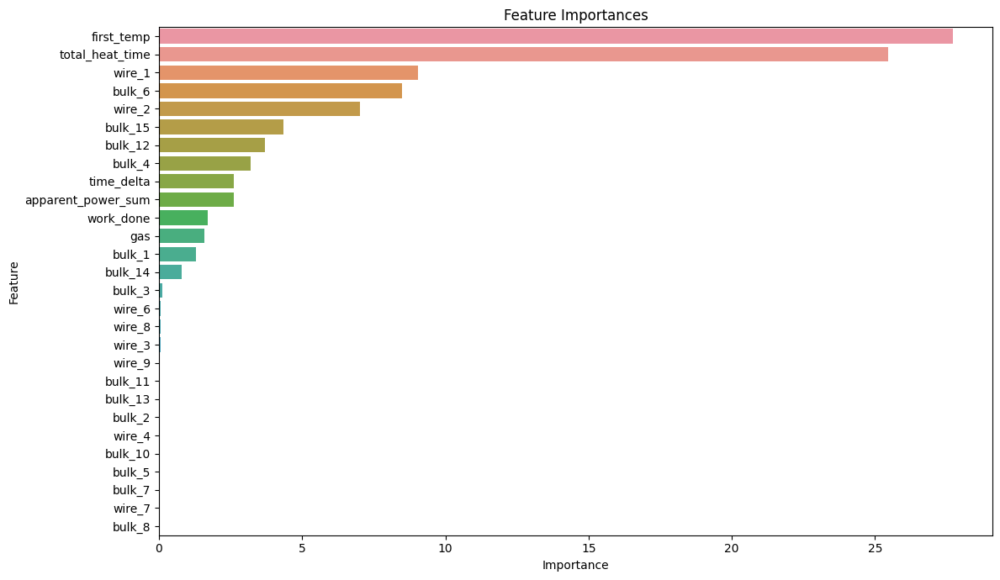

[I 2023-08-21 20:28:14,611] Trial 0 finished with value: 6.998176870075966 and parameters: {'depth': 6, 'iterations': 357, 'learning_rate': 0.19, 'l2_leaf_reg': 110, 'random_strength': 144, 'bootstrap_type': 'Bernoulli', 'border_count': 175, 'subsample': 0.53}. Best is trial 0 with value: 6.998176870075966.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1355635	test: 7.6494532	best: 7.6494532 (0)	total: 6.06ms	remaining: 2.47s
100:	learn: 7.1115180	test: 6.7499951	best: 6.7499951 (100)	total: 465ms	remaining: 1.42s
200:	learn: 6.5281774	test: 6.2966756	best: 6.2966756 (200)	total: 921ms	remaining: 953ms
300:	learn: 6.1573688	test: 5.9657252	best: 5.9657252 (300)	total: 1.38s	remaining: 494ms
400:	learn: 5.9128590	test: 5.7469500	best: 5.7469500 (400)	total: 1.83s	remaining: 36.6ms
408:	learn: 5.8971135	test: 5.7342340	best: 5.7342340 (408)	total: 1.87s	remaining: 0us
bestTest = 5.734234042
bestIteration = 408
Split 1, MAE : 5.734241177760736

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9827476	test: 8.2609059	best: 8.2609059 (0)	total: 6.1ms	remaining: 2.49s
100:	learn: 7.0157665	test: 7.2854543	best: 7.2854543 (100)	total: 466ms	remaining: 1.42s
200:	learn: 6.4420865	test: 6.6732083	best: 6.6732083 (200)	total: 917ms	remaining: 949ms
300:	learn: 6.1028704	test: 6.3207532	best: 6.3207532 (300)	total: 1.36s	remaining: 490ms
400:	learn: 5.8348671	test: 6.0693457	best: 6.0693457 (400)	total: 1.81s	remaining: 36.1ms
408:	learn: 5.8161169	test: 6.0522825	best: 6.0522825 (408)	total: 1.84s	remaining: 0us
bestTest = 6.05228247
bestIteration = 408
Split 2, MAE : 6.052285937845983

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0054250	test: 8.1684969	best: 8.1684969 (0)	total: 6.32ms	remaining: 2.58s
100:	learn: 6.9737519	test: 7.4031951	best: 7.4031951 (100)	total: 472ms	remaining: 1.44s
200:	learn: 6.3581722	test: 6.9802211	best: 6.9802211 (200)	total: 779ms	remaining: 806ms
300:	learn: 5.9424459	test: 6.7052264	best: 6.7052264 (300)	total: 1.24s	remaining: 444ms
400:	learn: 5.6858936	test: 6.5547169	best: 6.5543335 (398)	total: 1.68s	remaining: 33.6ms
408:	learn: 5.6689621	test: 6.5469296	best: 6.5468162 (407)	total: 1.72s	remaining: 0us
bestTest = 6.546816238
bestIteration = 407
Shrink model to first 408 iterations.
Split 3, MAE : 6.546734894104309

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0921441	test: 7.8181924	best: 7.8181924 (0)	total: 6.09ms	remaining: 2.48s
100:	learn: 7.0402841	test: 6.9571814	best: 6.9571814 (100)	total: 467ms	remaining: 1.42s
200:	learn: 6.4526973	test: 6.4975642	best: 6.4975642 (200)	total: 925ms	remaining: 957ms
300:	learn: 6.0645035	test: 6.2574407	best: 6.2571544 (299)	total: 1.38s	remaining: 496ms
400:	learn: 5.7620387	test: 6.0691353	best: 6.0691353 (400)	total: 1.83s	remaining: 36.5ms
408:	learn: 5.7418004	test: 6.0575091	best: 6.0575091 (408)	total: 1.87s	remaining: 0us
bestTest = 6.057509148
bestIteration = 408
Split 4, MAE : 6.057484952671577

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9743469	test: 8.3028607	best: 8.3028607 (0)	total: 7.12ms	remaining: 2.9s
100:	learn: 6.9398648	test: 7.4128544	best: 7.4128544 (100)	total: 532ms	remaining: 1.62s
200:	learn: 6.3795118	test: 6.9824064	best: 6.9824064 (200)	total: 1.05s	remaining: 1.09s
300:	learn: 5.9794208	test: 6.7064160	best: 6.7064160 (300)	total: 1.58s	remaining: 567ms
400:	learn: 5.6713178	test: 6.5319880	best: 6.5319880 (400)	total: 2.13s	remaining: 42.6ms
408:	learn: 5.6544589	test: 6.5243965	best: 6.5243965 (408)	total: 2.18s	remaining: 0us
bestTest = 6.524396524
bestIteration = 408
Split 5, MAE : 6.524485559524169
Average MAE: 6.1830465043813545


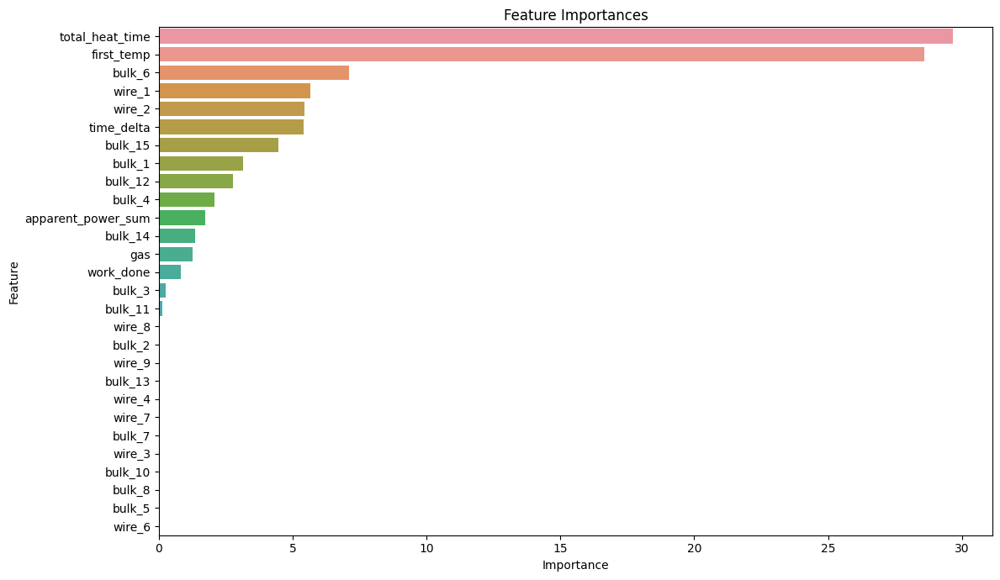

[I 2023-08-21 20:28:26,916] Trial 1 finished with value: 6.1830465043813545 and parameters: {'depth': 4, 'iterations': 409, 'learning_rate': 0.395, 'l2_leaf_reg': 88, 'random_strength': 11, 'bootstrap_type': 'Bernoulli', 'border_count': 47, 'subsample': 0.25}. Best is trial 1 with value: 6.1830465043813545.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1425207	test: 7.6580310	best: 7.6580310 (0)	total: 13.1ms	remaining: 7.59s
100:	learn: 7.4739025	test: 7.0579698	best: 7.0579698 (100)	total: 1.15s	remaining: 5.46s
200:	learn: 6.9421152	test: 6.6478611	best: 6.6478611 (200)	total: 2.31s	remaining: 4.34s
300:	learn: 6.6543936	test: 6.3990727	best: 6.3990727 (300)	total: 3.47s	remaining: 3.2s
400:	learn: 6.4446218	test: 6.2432382	best: 6.2432382 (400)	total: 4.65s	remaining: 2.06s
500:	learn: 6.2867157	test: 6.1067181	best: 6.1067181 (500)	total: 5.82s	remaining: 906ms
578:	learn: 6.1976285	test: 6.0503182	best: 6.0495025 (576)	total: 6.72s	remaining: 0us
bestTest = 6.049502485
bestIteration = 576
Shrink model to first 577 iterations.
Split 1, MAE : 6.049324962238776

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9900375	test: 8.2660223	best: 8.2660223 (0)	total: 8.96ms	remaining: 5.18s
100:	learn: 7.3212372	test: 7.6389251	best: 7.6389251 (100)	total: 1.04s	remaining: 4.91s
200:	learn: 6.8253312	test: 7.1304872	best: 7.1304872 (200)	total: 2.17s	remaining: 4.09s
300:	learn: 6.4987530	test: 6.7975941	best: 6.7975941 (300)	total: 3.35s	remaining: 3.09s
400:	learn: 6.2801894	test: 6.5882698	best: 6.5882698 (400)	total: 4.51s	remaining: 2s
500:	learn: 6.1241285	test: 6.4166648	best: 6.4166648 (500)	total: 5.77s	remaining: 899ms
578:	learn: 6.0200581	test: 6.3108169	best: 6.3108169 (578)	total: 6.75s	remaining: 0us
bestTest = 6.310816899
bestIteration = 578
Split 2, MAE : 6.310849736769631

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0138064	test: 8.1730950	best: 8.1730950 (0)	total: 13.5ms	remaining: 7.79s
100:	learn: 7.2968330	test: 7.6911376	best: 7.6911376 (100)	total: 1.21s	remaining: 5.73s
200:	learn: 6.7911768	test: 7.3053982	best: 7.3053982 (200)	total: 2.44s	remaining: 4.59s
300:	learn: 6.4730387	test: 7.0424427	best: 7.0424427 (300)	total: 3.67s	remaining: 3.39s
400:	learn: 6.2315007	test: 6.8782921	best: 6.8782921 (400)	total: 4.84s	remaining: 2.15s
500:	learn: 5.9867912	test: 6.6969613	best: 6.6969613 (500)	total: 6.03s	remaining: 939ms
578:	learn: 5.8323045	test: 6.6024817	best: 6.6024817 (578)	total: 6.87s	remaining: 0us
bestTest = 6.6024817
bestIteration = 578
Split 3, MAE : 6.602440983634596

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1008135	test: 7.8234498	best: 7.8234498 (0)	total: 9.49ms	remaining: 5.49s
100:	learn: 7.3808622	test: 7.2210343	best: 7.2210343 (100)	total: 1.11s	remaining: 5.26s
200:	learn: 6.8820677	test: 6.8016245	best: 6.8016245 (200)	total: 2.23s	remaining: 4.2s
300:	learn: 6.5899194	test: 6.5919035	best: 6.5919035 (300)	total: 3.39s	remaining: 3.13s
400:	learn: 6.3695270	test: 6.4410120	best: 6.4410120 (400)	total: 4.57s	remaining: 2.03s
500:	learn: 6.1538054	test: 6.2899387	best: 6.2899387 (500)	total: 5.75s	remaining: 896ms
578:	learn: 6.0186009	test: 6.2020797	best: 6.2020797 (578)	total: 6.67s	remaining: 0us
bestTest = 6.202079685
bestIteration = 578
Split 4, MAE : 6.202123606507516

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9800291	test: 8.3065747	best: 8.3065747 (0)	total: 13.8ms	remaining: 7.99s
100:	learn: 7.3013679	test: 7.7780664	best: 7.7780664 (100)	total: 1.24s	remaining: 5.85s
200:	learn: 6.8021169	test: 7.3671209	best: 7.3671209 (200)	total: 2.49s	remaining: 4.68s
300:	learn: 6.4704581	test: 7.1048780	best: 7.1048780 (300)	total: 3.76s	remaining: 3.48s
400:	learn: 6.2239429	test: 6.9198293	best: 6.9198293 (400)	total: 5.05s	remaining: 2.24s
500:	learn: 6.0431550	test: 6.7917277	best: 6.7917277 (500)	total: 6.32s	remaining: 984ms
578:	learn: 5.9527918	test: 6.7469090	best: 6.7469090 (578)	total: 7.31s	remaining: 0us
bestTest = 6.746908955
bestIteration = 578
Split 5, MAE : 6.746928105852366
Average MAE: 6.382333479000577


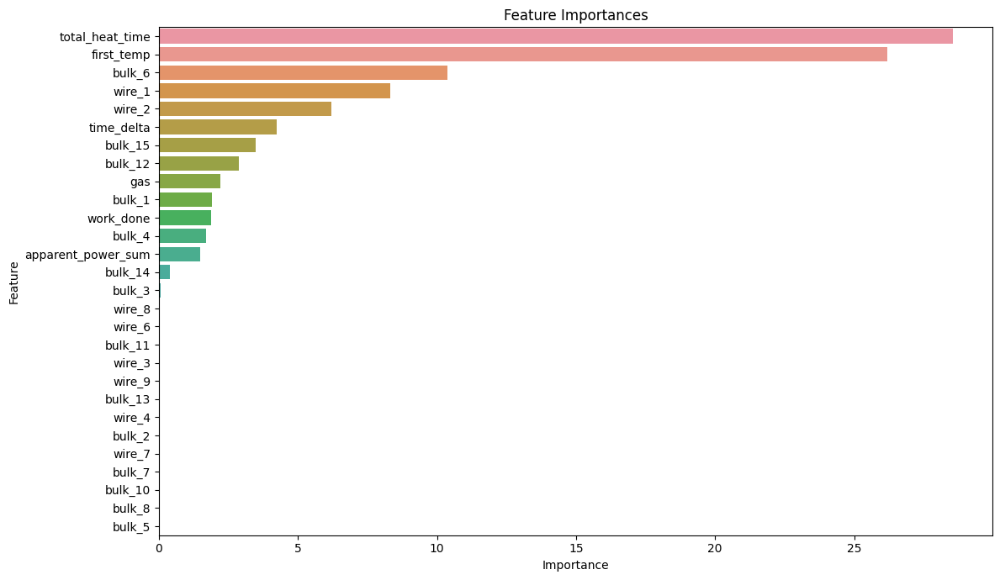

[I 2023-08-21 20:29:04,086] Trial 2 finished with value: 6.382333479000577 and parameters: {'depth': 5, 'iterations': 579, 'learning_rate': 0.355, 'l2_leaf_reg': 170, 'random_strength': 145, 'bootstrap_type': 'Bernoulli', 'border_count': 83, 'subsample': 0.42000000000000004}. Best is trial 1 with value: 6.1830465043813545.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1458294	test: 7.6616295	best: 7.6616295 (0)	total: 5.48ms	remaining: 1.99s
100:	learn: 7.0221499	test: 6.6607886	best: 6.6607886 (100)	total: 393ms	remaining: 1.02s
200:	learn: 6.3485389	test: 6.1121277	best: 6.1121277 (200)	total: 804ms	remaining: 652ms
300:	learn: 5.9618944	test: 5.7900803	best: 5.7900803 (300)	total: 1.06s	remaining: 221ms
363:	learn: 5.8022464	test: 5.6968809	best: 5.6968809 (363)	total: 1.31s	remaining: 0us
bestTest = 5.696880876
bestIteration = 363
Split 1, MAE : 5.6968796914977915

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9935620	test: 8.2688205	best: 8.2688205 (0)	total: 4.64ms	remaining: 1.69s
100:	learn: 6.9515859	test: 7.1951544	best: 7.1951544 (100)	total: 397ms	remaining: 1.03s
200:	learn: 6.3049250	test: 6.5210185	best: 6.5210185 (200)	total: 780ms	remaining: 632ms
300:	learn: 5.9411232	test: 6.1662773	best: 6.1662773 (300)	total: 1.17s	remaining: 246ms
363:	learn: 5.7741289	test: 6.0316683	best: 6.0316683 (363)	total: 1.43s	remaining: 0us
bestTest = 6.031668327
bestIteration = 363
Split 2, MAE : 6.031655841705616

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0165315	test: 8.1782101	best: 8.1782101 (0)	total: 5.14ms	remaining: 1.86s
100:	learn: 6.8721509	test: 7.3234528	best: 7.3234528 (100)	total: 395ms	remaining: 1.03s
200:	learn: 6.1783698	test: 6.8357640	best: 6.8357640 (200)	total: 792ms	remaining: 642ms
300:	learn: 5.7545115	test: 6.5520362	best: 6.5520362 (300)	total: 1.2s	remaining: 251ms
363:	learn: 5.5640720	test: 6.4266606	best: 6.4266606 (363)	total: 1.45s	remaining: 0us
bestTest = 6.426660576
bestIteration = 363
Split 3, MAE : 6.426679250002042

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1043004	test: 7.8267899	best: 7.8267899 (0)	total: 5.65ms	remaining: 2.05s
100:	learn: 6.9321713	test: 6.8884418	best: 6.8884418 (100)	total: 399ms	remaining: 1.04s
200:	learn: 6.2668963	test: 6.3531578	best: 6.3531578 (200)	total: 792ms	remaining: 642ms
300:	learn: 5.8296028	test: 6.0657903	best: 6.0632928 (298)	total: 1.19s	remaining: 248ms
363:	learn: 5.6323914	test: 5.9396383	best: 5.9396383 (363)	total: 1.44s	remaining: 0us
bestTest = 5.939638335
bestIteration = 363
Split 4, MAE : 5.939660581794606

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9832521	test: 8.3101161	best: 8.3101161 (0)	total: 6.07ms	remaining: 2.2s
100:	learn: 6.8331555	test: 7.3136954	best: 7.3136954 (100)	total: 457ms	remaining: 1.19s
200:	learn: 6.1476696	test: 6.8170966	best: 6.8170966 (200)	total: 917ms	remaining: 744ms
300:	learn: 5.7038607	test: 6.5738722	best: 6.5738722 (300)	total: 1.39s	remaining: 291ms
363:	learn: 5.5020448	test: 6.5078960	best: 6.5078960 (363)	total: 1.66s	remaining: 0us
bestTest = 6.507895985
bestIteration = 363
Split 5, MAE : 6.507939590712005
Average MAE: 6.120562991142412


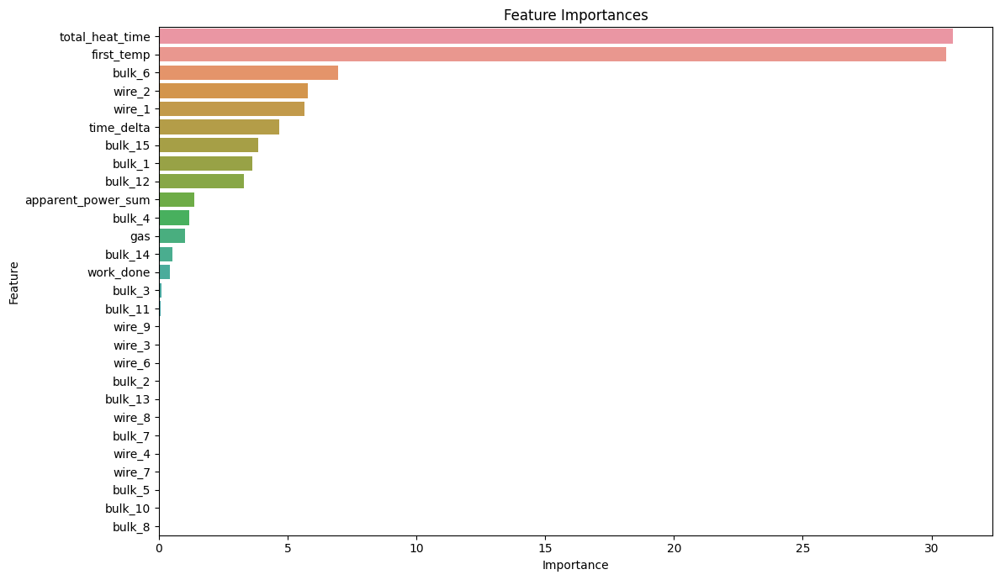

[I 2023-08-21 20:29:13,838] Trial 3 finished with value: 6.120562991142412 and parameters: {'depth': 3, 'iterations': 364, 'learning_rate': 0.355, 'l2_leaf_reg': 18, 'random_strength': 87, 'bootstrap_type': 'Bernoulli', 'border_count': 109, 'subsample': 0.38}. Best is trial 3 with value: 6.120562991142412.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1408317	test: 7.6548894	best: 7.6548894 (0)	total: 11ms	remaining: 9.9s
100:	learn: 7.0714054	test: 6.7113062	best: 6.7113062 (100)	total: 1.02s	remaining: 8.14s
200:	learn: 6.5037710	test: 6.2371452	best: 6.2371452 (200)	total: 2.06s	remaining: 7.21s
300:	learn: 6.2276399	test: 6.0541475	best: 6.0541475 (300)	total: 3.16s	remaining: 6.33s
400:	learn: 6.0089754	test: 5.9081206	best: 5.9081206 (400)	total: 4.17s	remaining: 5.23s
500:	learn: 5.7750340	test: 5.7137420	best: 5.7137420 (500)	total: 5.22s	remaining: 4.2s
600:	learn: 5.6483895	test: 5.6081445	best: 5.6081445 (600)	total: 6.3s	remaining: 3.18s
700:	learn: 5.5258894	test: 5.5201640	best: 5.5201640 (700)	total: 7.38s	remaining: 2.14s
800:	learn: 5.4283235	test: 5.4640875	best: 5.4640875 (800)	total: 8.5s	remaining: 1.09s
900:	learn: 5.3585175	test: 5.4213454	best: 5.4200383 (888)	total: 9.56s	remaining: 31.8ms
903:	learn: 5.3558096	test: 5.4221457	best: 5.4200383 (888)	total: 9.59s	remaining: 0us
bestTest = 5.4200383

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9875779	test: 8.2643434	best: 8.2643434 (0)	total: 12ms	remaining: 10.8s
100:	learn: 6.9457258	test: 7.2394565	best: 7.2394565 (100)	total: 1.04s	remaining: 8.25s
200:	learn: 6.4104505	test: 6.6903835	best: 6.6903835 (200)	total: 2.09s	remaining: 7.3s
300:	learn: 6.0895005	test: 6.3737996	best: 6.3737996 (300)	total: 3.19s	remaining: 6.39s
400:	learn: 5.8600692	test: 6.1629264	best: 6.1629264 (400)	total: 4.28s	remaining: 5.37s
500:	learn: 5.6825394	test: 6.0270387	best: 6.0270387 (500)	total: 5.37s	remaining: 4.32s
600:	learn: 5.5062927	test: 5.9323388	best: 5.9323388 (600)	total: 6.49s	remaining: 3.27s
700:	learn: 5.4092795	test: 5.8922927	best: 5.8922927 (700)	total: 7.59s	remaining: 2.2s
800:	learn: 5.2975391	test: 5.8567783	best: 5.8567783 (800)	total: 8.72s	remaining: 1.12s
900:	learn: 5.2102342	test: 5.8061828	best: 5.8061828 (900)	total: 9.78s	remaining: 32.6ms
903:	learn: 5.2094149	test: 5.8055203	best: 5.8055203 (903)	total: 9.81s	remaining: 0us
bestTest = 5.80552

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0119485	test: 8.1714651	best: 8.1714651 (0)	total: 11ms	remaining: 9.95s
100:	learn: 6.9093800	test: 7.3675030	best: 7.3675030 (100)	total: 1.04s	remaining: 8.25s
200:	learn: 6.3052591	test: 6.9072923	best: 6.9072923 (200)	total: 2.07s	remaining: 7.25s
300:	learn: 5.9277778	test: 6.6504844	best: 6.6504844 (300)	total: 3.13s	remaining: 6.28s
400:	learn: 5.6540678	test: 6.4608955	best: 6.4608955 (400)	total: 4.2s	remaining: 5.26s
500:	learn: 5.4792473	test: 6.3431967	best: 6.3431967 (500)	total: 5.27s	remaining: 4.24s
600:	learn: 5.3673672	test: 6.2756446	best: 6.2753452 (599)	total: 6.34s	remaining: 3.19s
700:	learn: 5.2828241	test: 6.2224940	best: 6.2224940 (700)	total: 7.42s	remaining: 2.15s
800:	learn: 5.1972110	test: 6.1534714	best: 6.1534714 (800)	total: 8.53s	remaining: 1.1s
900:	learn: 5.1142914	test: 6.1165936	best: 6.1165936 (900)	total: 9.59s	remaining: 31.9ms
903:	learn: 5.1121134	test: 6.1163439	best: 6.1163439 (903)	total: 9.62s	remaining: 0us
bestTest = 6.11634

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0986055	test: 7.8220502	best: 7.8220502 (0)	total: 11.7ms	remaining: 10.5s
100:	learn: 6.9790470	test: 6.8814992	best: 6.8814992 (100)	total: 1.03s	remaining: 8.19s
200:	learn: 6.4323169	test: 6.4525925	best: 6.4525925 (200)	total: 2.06s	remaining: 7.22s
300:	learn: 6.1430374	test: 6.2197357	best: 6.2197357 (300)	total: 3.15s	remaining: 6.31s
400:	learn: 5.8867944	test: 6.0394322	best: 6.0394322 (400)	total: 4.24s	remaining: 5.31s
500:	learn: 5.6783490	test: 5.9259763	best: 5.9259763 (500)	total: 5.3s	remaining: 4.26s
600:	learn: 5.5083291	test: 5.8609079	best: 5.8609079 (600)	total: 6.33s	remaining: 3.19s
700:	learn: 5.3761278	test: 5.8093883	best: 5.8093883 (700)	total: 7.36s	remaining: 2.13s
800:	learn: 5.2668487	test: 5.7838696	best: 5.7832277 (796)	total: 8.45s	remaining: 1.09s
900:	learn: 5.1880551	test: 5.7761315	best: 5.7761315 (900)	total: 9.6s	remaining: 31.9ms
903:	learn: 5.1869018	test: 5.7758526	best: 5.7758526 (903)	total: 9.63s	remaining: 0us
bestTest = 5.775

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9835769	test: 8.3113635	best: 8.3113635 (0)	total: 11.9ms	remaining: 10.7s
100:	learn: 6.9091132	test: 7.4201892	best: 7.4201892 (100)	total: 1.12s	remaining: 8.89s
200:	learn: 6.3507406	test: 7.0016879	best: 7.0016879 (200)	total: 2.23s	remaining: 7.82s
300:	learn: 5.9906880	test: 6.7376421	best: 6.7376421 (300)	total: 3.42s	remaining: 6.85s
400:	learn: 5.7212229	test: 6.5526390	best: 6.5526390 (400)	total: 4.58s	remaining: 5.75s
500:	learn: 5.5152197	test: 6.4362028	best: 6.4353504 (499)	total: 5.79s	remaining: 4.66s
600:	learn: 5.3944168	test: 6.3822007	best: 6.3822007 (600)	total: 6.98s	remaining: 3.52s
bestTest = 6.371035521
bestIteration = 619
Shrink model to first 620 iterations.
Split 5, MAE : 6.37113567735546
Average MAE: 5.897737147953644


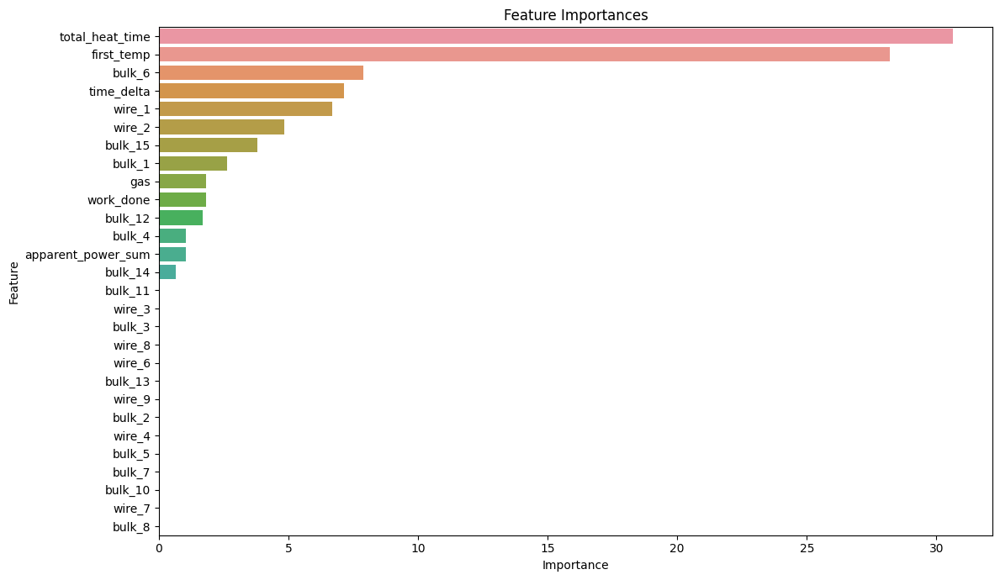

[I 2023-08-21 20:30:03,337] Trial 4 finished with value: 5.897737147953644 and parameters: {'depth': 4, 'iterations': 904, 'learning_rate': 0.48, 'l2_leaf_reg': 100, 'random_strength': 125, 'bootstrap_type': 'Bernoulli', 'border_count': 106, 'subsample': 0.88}. Best is trial 4 with value: 5.897737147953644.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1464858	test: 7.6624473	best: 7.6624473 (0)	total: 11.1ms	remaining: 5.95s
100:	learn: 7.1013033	test: 6.7198161	best: 6.7198161 (100)	total: 957ms	remaining: 4.11s
200:	learn: 6.5934929	test: 6.3480354	best: 6.3480354 (200)	total: 1.91s	remaining: 3.18s
300:	learn: 6.3341791	test: 6.1420675	best: 6.1420675 (300)	total: 2.88s	remaining: 2.24s
400:	learn: 6.1430034	test: 5.9458903	best: 5.9458903 (400)	total: 3.87s	remaining: 1.29s
500:	learn: 5.9616941	test: 5.7723389	best: 5.7723389 (500)	total: 4.87s	remaining: 331ms
534:	learn: 5.8858480	test: 5.6936434	best: 5.6936434 (534)	total: 5.17s	remaining: 0us
bestTest = 5.69364339
bestIteration = 534
Split 1, MAE : 5.693676111901259

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9938296	test: 8.2687750	best: 8.2687750 (0)	total: 11ms	remaining: 5.86s
100:	learn: 7.0018018	test: 7.2835361	best: 7.2835361 (100)	total: 971ms	remaining: 4.17s
200:	learn: 6.5003286	test: 6.7453592	best: 6.7453592 (200)	total: 1.91s	remaining: 3.17s
300:	learn: 6.2083763	test: 6.3996785	best: 6.3996785 (300)	total: 2.88s	remaining: 2.23s
400:	learn: 5.9586803	test: 6.1081550	best: 6.1081550 (400)	total: 3.88s	remaining: 1.3s
500:	learn: 5.7910167	test: 5.9795922	best: 5.9793138 (498)	total: 4.86s	remaining: 330ms
534:	learn: 5.7563582	test: 5.9615741	best: 5.9615741 (534)	total: 5.2s	remaining: 0us
bestTest = 5.961574084
bestIteration = 534
Split 2, MAE : 5.961483067282875

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0166002	test: 8.1784157	best: 8.1784157 (0)	total: 10.4ms	remaining: 5.57s
100:	learn: 6.9405138	test: 7.3800157	best: 7.3800157 (100)	total: 940ms	remaining: 4.04s
200:	learn: 6.4106354	test: 6.9662372	best: 6.9662372 (200)	total: 1.88s	remaining: 3.12s
300:	learn: 6.0151774	test: 6.7197706	best: 6.7197706 (300)	total: 2.86s	remaining: 2.23s
400:	learn: 5.7848848	test: 6.5509268	best: 6.5509268 (400)	total: 3.83s	remaining: 1.28s
500:	learn: 5.6177045	test: 6.4240688	best: 6.4240688 (500)	total: 4.84s	remaining: 329ms
534:	learn: 5.5676854	test: 6.3932952	best: 6.3932952 (534)	total: 5.18s	remaining: 0us
bestTest = 6.393295157
bestIteration = 534
Split 3, MAE : 6.393375120770498

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1048989	test: 7.8276718	best: 7.8276718 (0)	total: 10.3ms	remaining: 5.49s
100:	learn: 7.0353922	test: 6.9476809	best: 6.9476809 (100)	total: 976ms	remaining: 4.19s
200:	learn: 6.5383513	test: 6.5121439	best: 6.5121439 (200)	total: 1.92s	remaining: 3.19s
300:	learn: 6.2685386	test: 6.2825668	best: 6.2825668 (300)	total: 2.85s	remaining: 2.22s
400:	learn: 5.9878108	test: 6.1074878	best: 6.1074878 (400)	total: 3.82s	remaining: 1.27s
500:	learn: 5.7928508	test: 6.0043174	best: 6.0043174 (500)	total: 4.78s	remaining: 324ms
534:	learn: 5.7280410	test: 5.9610862	best: 5.9610673 (533)	total: 5.11s	remaining: 0us
bestTest = 5.961067287
bestIteration = 533
Shrink model to first 534 iterations.
Split 4, MAE : 5.961083432455613

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9836274	test: 8.3112597	best: 8.3112597 (0)	total: 10.8ms	remaining: 5.76s
100:	learn: 6.9677545	test: 7.4566131	best: 7.4566131 (100)	total: 1.01s	remaining: 4.35s
200:	learn: 6.4056949	test: 7.0166324	best: 7.0166324 (200)	total: 2.01s	remaining: 3.35s
300:	learn: 6.0949023	test: 6.7881498	best: 6.7881498 (300)	total: 3.02s	remaining: 2.34s
400:	learn: 5.8395210	test: 6.5643198	best: 6.5643198 (400)	total: 4.04s	remaining: 1.35s
500:	learn: 5.6662872	test: 6.4742642	best: 6.4742642 (500)	total: 5.1s	remaining: 346ms
534:	learn: 5.6167682	test: 6.4574157	best: 6.4556983 (531)	total: 5.47s	remaining: 0us
bestTest = 6.455698298
bestIteration = 531
Shrink model to first 532 iterations.
Split 5, MAE : 6.455683877177124
Average MAE: 6.093060321917474


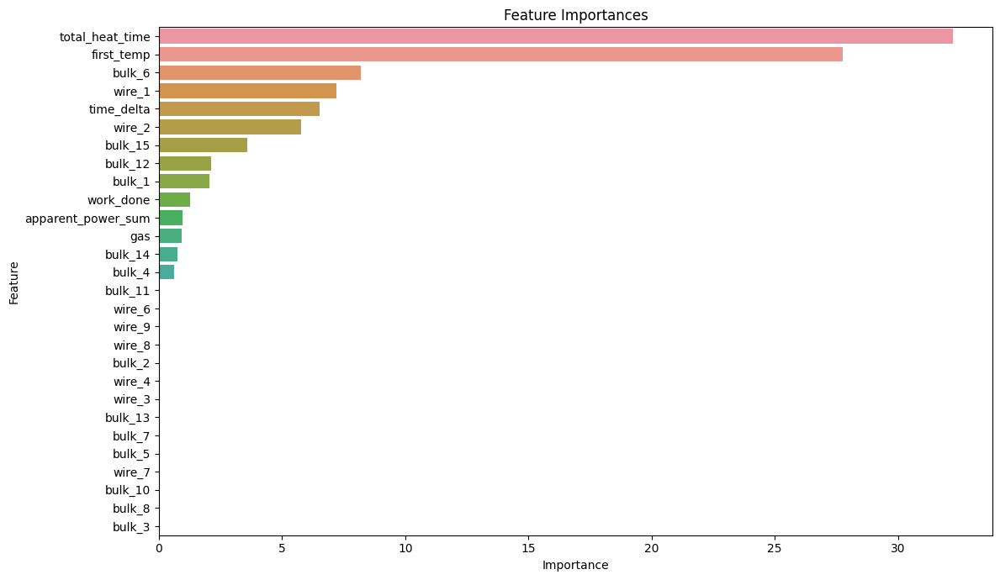

[I 2023-08-21 20:30:32,602] Trial 5 finished with value: 6.093060321917474 and parameters: {'depth': 3, 'iterations': 535, 'learning_rate': 0.495, 'l2_leaf_reg': 104, 'random_strength': 123, 'bootstrap_type': 'Bernoulli', 'border_count': 154, 'subsample': 0.59}. Best is trial 4 with value: 5.897737147953644.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1434818	test: 7.6584389	best: 7.6584389 (0)	total: 6.16ms	remaining: 2.3s
100:	learn: 7.5904876	test: 7.1362885	best: 7.1362885 (100)	total: 464ms	remaining: 1.25s
200:	learn: 7.0841112	test: 6.7536516	best: 6.7536516 (200)	total: 920ms	remaining: 791ms
300:	learn: 6.7467046	test: 6.4972501	best: 6.4972501 (300)	total: 1.39s	remaining: 338ms
373:	learn: 6.5837616	test: 6.3681116	best: 6.3681116 (373)	total: 1.73s	remaining: 0us
bestTest = 6.368111597
bestIteration = 373
Split 1, MAE : 6.368001330377622

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9908537	test: 8.2671136	best: 8.2671136 (0)	total: 6.12ms	remaining: 2.28s
100:	learn: 7.4486142	test: 7.7493158	best: 7.7493158 (100)	total: 459ms	remaining: 1.24s
200:	learn: 6.9670904	test: 7.2526946	best: 7.2526946 (200)	total: 914ms	remaining: 786ms
300:	learn: 6.5899418	test: 6.8682018	best: 6.8682018 (300)	total: 1.37s	remaining: 333ms
373:	learn: 6.4418420	test: 6.7009046	best: 6.7009046 (373)	total: 1.71s	remaining: 0us
bestTest = 6.700904649
bestIteration = 373
Split 2, MAE : 6.700795913646101

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0144060	test: 8.1739659	best: 8.1739659 (0)	total: 6.33ms	remaining: 2.36s
100:	learn: 7.4260306	test: 7.7578978	best: 7.7578978 (100)	total: 478ms	remaining: 1.29s
200:	learn: 6.9266044	test: 7.3565992	best: 7.3565992 (200)	total: 925ms	remaining: 796ms
300:	learn: 6.5960212	test: 7.1003159	best: 7.1003159 (300)	total: 1.39s	remaining: 336ms
373:	learn: 6.3856777	test: 6.9652327	best: 6.9652327 (373)	total: 1.72s	remaining: 0us
bestTest = 6.965232696
bestIteration = 373
Split 3, MAE : 6.96515632317051

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1013385	test: 7.8253062	best: 7.8253062 (0)	total: 6.1ms	remaining: 2.27s
100:	learn: 7.5379900	test: 7.3814487	best: 7.3814487 (100)	total: 461ms	remaining: 1.25s
200:	learn: 7.0160562	test: 6.9438940	best: 6.9438940 (200)	total: 911ms	remaining: 784ms
300:	learn: 6.6947735	test: 6.6959306	best: 6.6959306 (300)	total: 1.37s	remaining: 333ms
373:	learn: 6.4833046	test: 6.5373844	best: 6.5373844 (373)	total: 1.71s	remaining: 0us
bestTest = 6.537384384
bestIteration = 373
Split 4, MAE : 6.537362132203626

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9839396	test: 8.3104402	best: 8.3104402 (0)	total: 7.01ms	remaining: 2.61s
100:	learn: 7.4054358	test: 7.8602674	best: 7.8602674 (100)	total: 544ms	remaining: 1.47s
200:	learn: 6.8910254	test: 7.4039152	best: 7.4039152 (200)	total: 1.09s	remaining: 943ms
300:	learn: 6.5572455	test: 7.1464984	best: 7.1464984 (300)	total: 1.64s	remaining: 397ms
373:	learn: 6.3706149	test: 7.0200644	best: 7.0200644 (373)	total: 2.04s	remaining: 0us
bestTest = 7.020064431
bestIteration = 373
Split 5, MAE : 7.020062629609703
Average MAE: 6.718275665801512


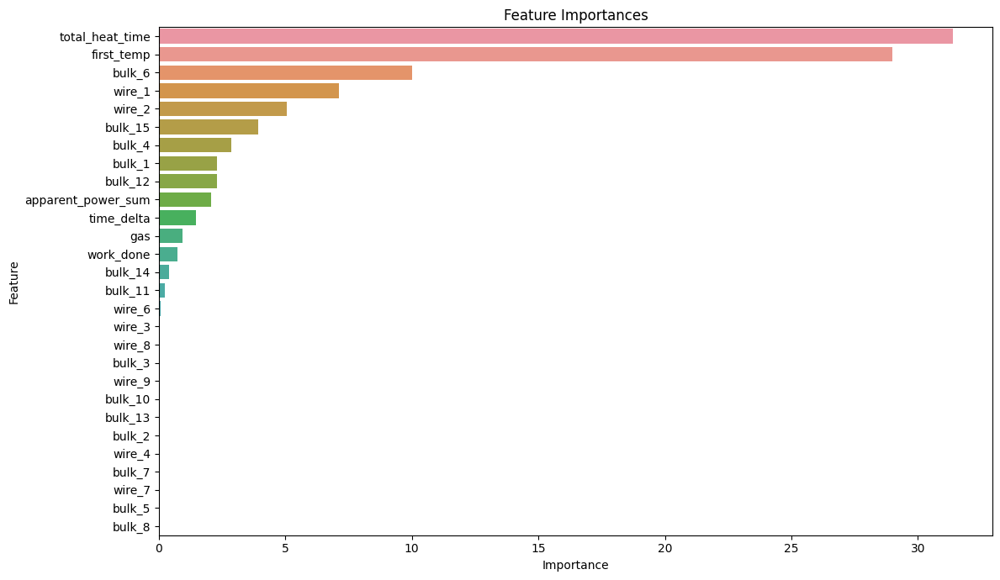

[I 2023-08-21 20:30:44,362] Trial 6 finished with value: 6.718275665801512 and parameters: {'depth': 4, 'iterations': 374, 'learning_rate': 0.265, 'l2_leaf_reg': 136, 'random_strength': 175, 'bootstrap_type': 'Bernoulli', 'border_count': 150, 'subsample': 0.66}. Best is trial 4 with value: 5.897737147953644.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1450707	test: 7.6603780	best: 7.6603780 (0)	total: 13.1ms	remaining: 11.2s
100:	learn: 7.9133704	test: 7.4336595	best: 7.4336595 (100)	total: 1.21s	remaining: 9.06s
200:	learn: 7.6343523	test: 7.2129452	best: 7.2129452 (200)	total: 2.47s	remaining: 8.08s
300:	learn: 7.3852882	test: 7.0074096	best: 7.0074096 (300)	total: 3.79s	remaining: 7.02s
400:	learn: 7.1738926	test: 6.8346944	best: 6.8346944 (400)	total: 5.11s	remaining: 5.82s
500:	learn: 6.9875324	test: 6.6838218	best: 6.6838218 (500)	total: 6.33s	remaining: 4.51s
600:	learn: 6.8337259	test: 6.5585350	best: 6.5585350 (600)	total: 7.64s	remaining: 3.27s
700:	learn: 6.7220762	test: 6.4695181	best: 6.4695181 (700)	total: 8.99s	remaining: 2.01s
800:	learn: 6.6192086	test: 6.3954015	best: 6.3954015 (800)	total: 10.2s	remaining: 729ms
857:	learn: 6.5677303	test: 6.3535492	best: 6.3535492 (857)	total: 10.9s	remaining: 0us
bestTest = 6.353549203
bestIteration = 857
Split 1, MAE : 6.353477693481416

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9928068	test: 8.2683812	best: 8.2683812 (0)	total: 12.2ms	remaining: 10.5s
100:	learn: 7.7496077	test: 8.0473346	best: 8.0473346 (100)	total: 1.14s	remaining: 8.51s
200:	learn: 7.4502352	test: 7.7765407	best: 7.7765407 (200)	total: 2.38s	remaining: 7.76s
300:	learn: 7.2054858	test: 7.5419012	best: 7.5419012 (300)	total: 3.67s	remaining: 6.78s
400:	learn: 7.0182661	test: 7.3812217	best: 7.3812217 (400)	total: 5s	remaining: 5.7s
500:	learn: 6.8602248	test: 7.2442805	best: 7.2442805 (500)	total: 6.33s	remaining: 4.51s
600:	learn: 6.7312506	test: 7.1307195	best: 7.1307195 (600)	total: 7.71s	remaining: 3.3s
700:	learn: 6.6314345	test: 7.0320398	best: 7.0320398 (700)	total: 9.02s	remaining: 2.02s
800:	learn: 6.5351955	test: 6.9297393	best: 6.9297393 (800)	total: 10.3s	remaining: 735ms
857:	learn: 6.4836044	test: 6.8786005	best: 6.8786005 (857)	total: 11.1s	remaining: 0us
bestTest = 6.87860055
bestIteration = 857
Split 2, MAE : 6.878483791745334

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0159332	test: 8.1759722	best: 8.1759722 (0)	total: 12.6ms	remaining: 10.8s
100:	learn: 7.7557431	test: 7.9936041	best: 7.9936041 (100)	total: 1.1s	remaining: 8.26s
200:	learn: 7.4448095	test: 7.7836508	best: 7.7836508 (200)	total: 2.4s	remaining: 7.84s
300:	learn: 7.1912395	test: 7.6191112	best: 7.6191112 (300)	total: 3.77s	remaining: 6.97s
400:	learn: 6.9990837	test: 7.4793908	best: 7.4793908 (400)	total: 5.13s	remaining: 5.85s
500:	learn: 6.8323080	test: 7.3617870	best: 7.3617870 (500)	total: 6.42s	remaining: 4.58s
600:	learn: 6.6794605	test: 7.2404498	best: 7.2404498 (600)	total: 7.69s	remaining: 3.29s
700:	learn: 6.5427411	test: 7.1281200	best: 7.1281200 (700)	total: 8.95s	remaining: 2s
800:	learn: 6.4424683	test: 7.0471072	best: 7.0471072 (800)	total: 10.3s	remaining: 732ms
857:	learn: 6.3853975	test: 6.9998937	best: 6.9998937 (857)	total: 11s	remaining: 0us
bestTest = 6.999893669
bestIteration = 857
Split 3, MAE : 7.000133643785459

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1031838	test: 7.8262308	best: 7.8262308 (0)	total: 13ms	remaining: 11.1s
100:	learn: 7.8498978	test: 7.6183324	best: 7.6183324 (100)	total: 1.12s	remaining: 8.36s
200:	learn: 7.5235271	test: 7.3456231	best: 7.3456231 (200)	total: 2.34s	remaining: 7.65s
300:	learn: 7.2687178	test: 7.1143883	best: 7.1143883 (300)	total: 3.66s	remaining: 6.78s
400:	learn: 7.0697749	test: 6.9560463	best: 6.9560463 (400)	total: 4.98s	remaining: 5.68s
500:	learn: 6.9217322	test: 6.8394390	best: 6.8394390 (500)	total: 6.23s	remaining: 4.44s
600:	learn: 6.8077677	test: 6.7505220	best: 6.7505220 (600)	total: 7.52s	remaining: 3.21s
700:	learn: 6.7002478	test: 6.6863663	best: 6.6863663 (700)	total: 8.83s	remaining: 1.98s
800:	learn: 6.5917479	test: 6.6118276	best: 6.6118276 (800)	total: 10.1s	remaining: 721ms
857:	learn: 6.5416331	test: 6.5655616	best: 6.5655616 (857)	total: 10.9s	remaining: 0us
bestTest = 6.56556158
bestIteration = 857
Split 4, MAE : 6.565490062739649

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9824730	test: 8.3087355	best: 8.3087355 (0)	total: 13.8ms	remaining: 11.9s
100:	learn: 7.7477823	test: 8.1200526	best: 8.1200526 (100)	total: 1.41s	remaining: 10.5s
200:	learn: 7.4562794	test: 7.8930959	best: 7.8930959 (200)	total: 2.88s	remaining: 9.43s
300:	learn: 7.2365640	test: 7.7237858	best: 7.7237858 (300)	total: 4.3s	remaining: 7.96s
400:	learn: 7.0498166	test: 7.5834301	best: 7.5834301 (400)	total: 5.76s	remaining: 6.56s
500:	learn: 6.8830645	test: 7.4384962	best: 7.4384962 (500)	total: 7.27s	remaining: 5.18s
600:	learn: 6.7465740	test: 7.3256261	best: 7.3256261 (600)	total: 9.03s	remaining: 3.86s
700:	learn: 6.6281642	test: 7.2268894	best: 7.2268894 (700)	total: 10.7s	remaining: 2.4s
800:	learn: 6.5260018	test: 7.1398842	best: 7.1398842 (800)	total: 12.2s	remaining: 871ms
857:	learn: 6.4673709	test: 7.0992333	best: 7.0992333 (857)	total: 13.1s	remaining: 0us
bestTest = 7.099233342
bestIteration = 857
Split 5, MAE : 7.099093126405201
Average MAE: 6.779335663631412


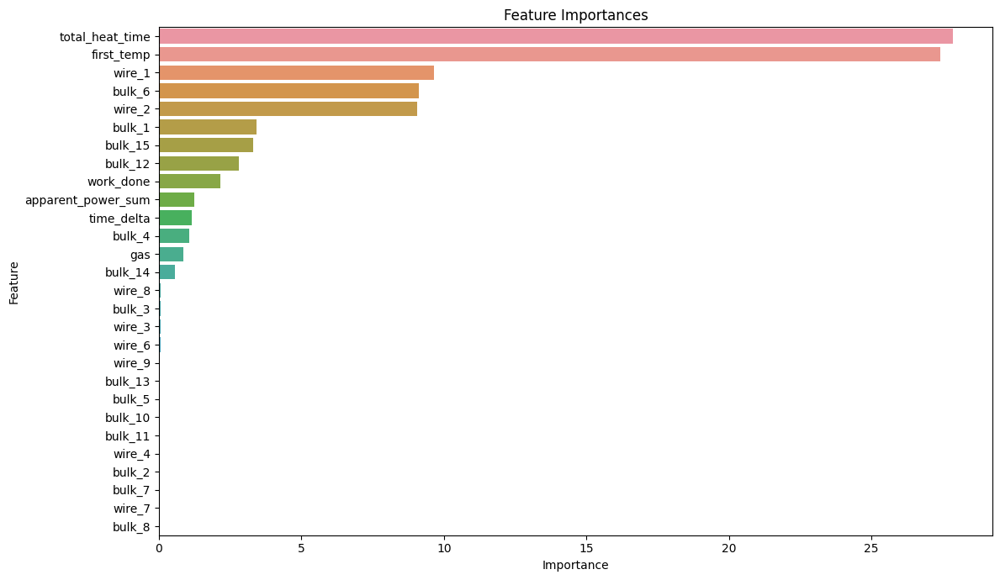

[I 2023-08-21 20:31:44,432] Trial 7 finished with value: 6.779335663631412 and parameters: {'depth': 6, 'iterations': 858, 'learning_rate': 0.13, 'l2_leaf_reg': 153, 'random_strength': 48, 'bootstrap_type': 'Bernoulli', 'border_count': 25, 'subsample': 0.9}. Best is trial 4 with value: 5.897737147953644.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1447792	test: 7.6599352	best: 7.6599352 (0)	total: 12.3ms	remaining: 9.24s
100:	learn: 8.0216357	test: 7.5369443	best: 7.5369443 (100)	total: 1.18s	remaining: 7.59s
200:	learn: 7.9160710	test: 7.4440253	best: 7.4440253 (200)	total: 2.36s	remaining: 6.46s
300:	learn: 7.8118268	test: 7.3492862	best: 7.3492862 (300)	total: 3.57s	remaining: 5.34s
400:	learn: 7.7175310	test: 7.2627653	best: 7.2627653 (400)	total: 4.76s	remaining: 4.15s
500:	learn: 7.6343537	test: 7.1878288	best: 7.1878288 (500)	total: 5.97s	remaining: 2.98s
600:	learn: 7.5556711	test: 7.1216534	best: 7.1216534 (600)	total: 7.17s	remaining: 1.79s
700:	learn: 7.4769730	test: 7.0524035	best: 7.0524035 (700)	total: 8.36s	remaining: 597ms
750:	learn: 7.4423296	test: 7.0235942	best: 7.0235942 (750)	total: 8.97s	remaining: 0us
bestTest = 7.023594198
bestIteration = 750
Split 1, MAE : 7.023570470671213

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9931557	test: 8.2678978	best: 8.2678978 (0)	total: 12.4ms	remaining: 9.3s
100:	learn: 7.8950076	test: 8.1748634	best: 8.1748634 (100)	total: 1.18s	remaining: 7.62s
200:	learn: 7.7966985	test: 8.0769603	best: 8.0769603 (200)	total: 2.38s	remaining: 6.5s
300:	learn: 7.7084758	test: 7.9889794	best: 7.9889794 (300)	total: 3.62s	remaining: 5.42s
400:	learn: 7.6229250	test: 7.8989866	best: 7.8989866 (400)	total: 4.78s	remaining: 4.17s
500:	learn: 7.5431810	test: 7.8182586	best: 7.8182586 (500)	total: 6s	remaining: 2.99s
600:	learn: 7.4719515	test: 7.7409031	best: 7.7409031 (600)	total: 7.26s	remaining: 1.81s
700:	learn: 7.3967716	test: 7.6627676	best: 7.6627676 (700)	total: 8.52s	remaining: 607ms
750:	learn: 7.3684849	test: 7.6346985	best: 7.6346985 (750)	total: 9.1s	remaining: 0us
bestTest = 7.634698469
bestIteration = 750
Split 2, MAE : 7.634922436636224

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0157035	test: 8.1768536	best: 8.1768536 (0)	total: 12.8ms	remaining: 9.59s
100:	learn: 7.9232186	test: 8.1097220	best: 8.1097220 (100)	total: 1.16s	remaining: 7.49s
200:	learn: 7.8263470	test: 8.0390723	best: 8.0390723 (200)	total: 2.3s	remaining: 6.29s
300:	learn: 7.7270431	test: 7.9670809	best: 7.9670809 (300)	total: 3.56s	remaining: 5.32s
400:	learn: 7.6472347	test: 7.9043151	best: 7.9043151 (400)	total: 4.7s	remaining: 4.1s
500:	learn: 7.5638654	test: 7.8427650	best: 7.8427650 (500)	total: 5.84s	remaining: 2.92s
600:	learn: 7.4820856	test: 7.7806064	best: 7.7806064 (600)	total: 7.04s	remaining: 1.76s
700:	learn: 7.4073877	test: 7.7247794	best: 7.7247794 (700)	total: 8.28s	remaining: 591ms
750:	learn: 7.3760599	test: 7.7000211	best: 7.7000211 (750)	total: 8.9s	remaining: 0us
bestTest = 7.700021126
bestIteration = 750
Split 3, MAE : 7.70000125086269

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1026021	test: 7.8260652	best: 7.8260652 (0)	total: 15.6ms	remaining: 11.7s
100:	learn: 7.9970836	test: 7.7299749	best: 7.7299749 (100)	total: 1.18s	remaining: 7.57s
200:	learn: 7.8892487	test: 7.6384684	best: 7.6384684 (200)	total: 2.36s	remaining: 6.46s
300:	learn: 7.7818226	test: 7.5503905	best: 7.5503905 (300)	total: 3.52s	remaining: 5.26s
400:	learn: 7.6838206	test: 7.4734097	best: 7.4734097 (400)	total: 4.71s	remaining: 4.11s
500:	learn: 7.5973944	test: 7.4011855	best: 7.4011855 (500)	total: 5.91s	remaining: 2.95s
600:	learn: 7.5171399	test: 7.3389808	best: 7.3389808 (600)	total: 7.14s	remaining: 1.78s
700:	learn: 7.4467819	test: 7.2803380	best: 7.2803380 (700)	total: 8.38s	remaining: 597ms
750:	learn: 7.4169712	test: 7.2558257	best: 7.2558257 (750)	total: 8.98s	remaining: 0us
bestTest = 7.2558257
bestIteration = 750
Split 4, MAE : 7.255889506725427

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9825675	test: 8.3091985	best: 8.3091985 (0)	total: 13.2ms	remaining: 9.91s
100:	learn: 7.8792843	test: 8.2160350	best: 8.2160350 (100)	total: 1.28s	remaining: 8.22s
200:	learn: 7.7641661	test: 8.1155438	best: 8.1155438 (200)	total: 2.51s	remaining: 6.86s
300:	learn: 7.6610628	test: 8.0221088	best: 8.0221088 (300)	total: 3.75s	remaining: 5.61s
400:	learn: 7.5605721	test: 7.9309615	best: 7.9309615 (400)	total: 5.06s	remaining: 4.42s
500:	learn: 7.4768327	test: 7.8569574	best: 7.8569574 (500)	total: 6.41s	remaining: 3.2s
600:	learn: 7.3948939	test: 7.7811321	best: 7.7811321 (600)	total: 7.7s	remaining: 1.92s
700:	learn: 7.3169271	test: 7.7102528	best: 7.7102528 (700)	total: 8.96s	remaining: 639ms
750:	learn: 7.2842896	test: 7.6809868	best: 7.6809868 (750)	total: 9.63s	remaining: 0us
bestTest = 7.680986777
bestIteration = 750
Split 5, MAE : 7.681016614969713
Average MAE: 7.459080055973054


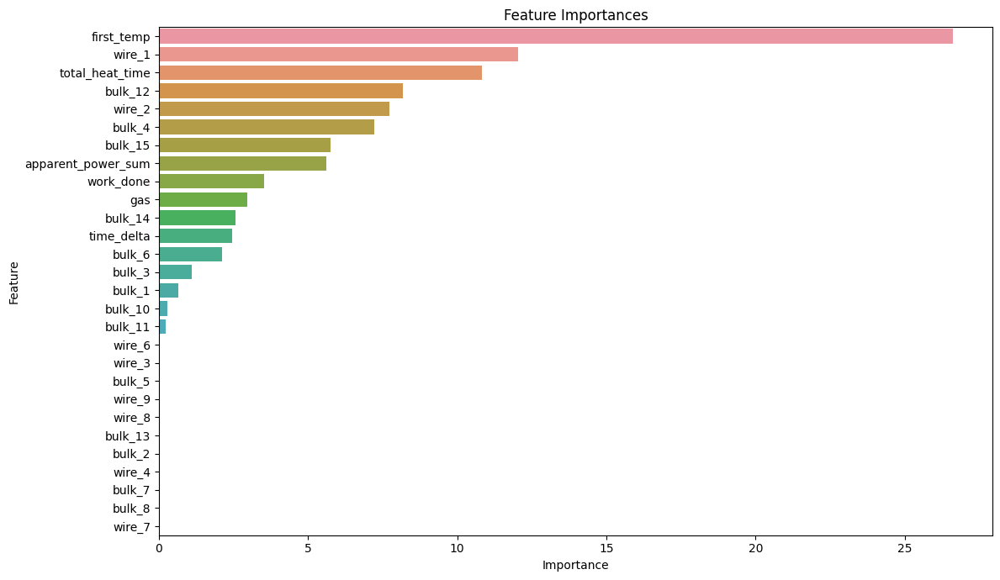

[I 2023-08-21 20:32:32,888] Trial 8 finished with value: 7.459080055973054 and parameters: {'depth': 5, 'iterations': 751, 'learning_rate': 0.10500000000000001, 'l2_leaf_reg': 119, 'random_strength': 111, 'bootstrap_type': 'Bayesian', 'border_count': 178, 'bagging_temperature': 15.94513365483}. Best is trial 4 with value: 5.897737147953644.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1425494	test: 7.6574042	best: 7.6574042 (0)	total: 13.4ms	remaining: 8.03s
100:	learn: 7.9461910	test: 7.4692348	best: 7.4692348 (100)	total: 1.27s	remaining: 6.28s
200:	learn: 7.7697043	test: 7.3109722	best: 7.3109722 (200)	total: 2.57s	remaining: 5.09s
300:	learn: 7.6260284	test: 7.1777666	best: 7.1777666 (300)	total: 3.87s	remaining: 3.83s
400:	learn: 7.4887912	test: 7.0541558	best: 7.0541558 (400)	total: 5.21s	remaining: 2.57s
500:	learn: 7.3835558	test: 6.9675860	best: 6.9675860 (500)	total: 6.53s	remaining: 1.28s
598:	learn: 7.3001227	test: 6.9079149	best: 6.9079149 (598)	total: 7.83s	remaining: 0us
bestTest = 6.907914913
bestIteration = 598
Split 1, MAE : 6.9079668124176425

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9919094	test: 8.2667820	best: 8.2667820 (0)	total: 13.5ms	remaining: 8.05s
100:	learn: 7.8234418	test: 8.0953114	best: 8.0953114 (100)	total: 1.31s	remaining: 6.47s
200:	learn: 7.6697916	test: 7.9520631	best: 7.9520631 (200)	total: 2.6s	remaining: 5.16s
300:	learn: 7.5412440	test: 7.8137984	best: 7.8137984 (300)	total: 3.93s	remaining: 3.9s
400:	learn: 7.4262744	test: 7.6955042	best: 7.6955042 (400)	total: 5.24s	remaining: 2.59s
500:	learn: 7.3177499	test: 7.5859270	best: 7.5858857 (499)	total: 6.6s	remaining: 1.29s
598:	learn: 7.2297325	test: 7.4950116	best: 7.4950116 (598)	total: 7.9s	remaining: 0us
bestTest = 7.495011556
bestIteration = 598
Split 2, MAE : 7.495066694481156

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0150926	test: 8.1767319	best: 8.1767319 (0)	total: 13.4ms	remaining: 8.02s
100:	learn: 7.8501222	test: 8.0591912	best: 8.0591912 (100)	total: 1.3s	remaining: 6.39s
200:	learn: 7.6790430	test: 7.9373321	best: 7.9373321 (200)	total: 2.59s	remaining: 5.12s
300:	learn: 7.5343828	test: 7.8302992	best: 7.8302992 (300)	total: 3.9s	remaining: 3.86s
400:	learn: 7.4022155	test: 7.7273852	best: 7.7273852 (400)	total: 5.22s	remaining: 2.58s
500:	learn: 7.2946199	test: 7.6496477	best: 7.6496477 (500)	total: 6.51s	remaining: 1.27s
598:	learn: 7.1991914	test: 7.5860886	best: 7.5860886 (598)	total: 7.6s	remaining: 0us
bestTest = 7.586088601
bestIteration = 598
Split 3, MAE : 7.5860323820330775

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1023066	test: 7.8260610	best: 7.8260610 (0)	total: 13.5ms	remaining: 8.1s
100:	learn: 7.9119232	test: 7.6591292	best: 7.6591292 (100)	total: 1.28s	remaining: 6.32s
200:	learn: 7.7218414	test: 7.5021608	best: 7.5021608 (200)	total: 2.61s	remaining: 5.17s
300:	learn: 7.5686968	test: 7.3734552	best: 7.3734552 (300)	total: 3.98s	remaining: 3.94s
400:	learn: 7.4408224	test: 7.2642051	best: 7.2642051 (400)	total: 5.32s	remaining: 2.63s
500:	learn: 7.3375504	test: 7.1820630	best: 7.1820630 (500)	total: 6.65s	remaining: 1.3s
598:	learn: 7.2419943	test: 7.1002843	best: 7.1002843 (598)	total: 7.99s	remaining: 0us
bestTest = 7.100284269
bestIteration = 598
Split 4, MAE : 7.1002690898438585

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9801124	test: 8.3070630	best: 8.3070630 (0)	total: 15ms	remaining: 8.95s
100:	learn: 7.7814166	test: 8.1346485	best: 8.1346485 (100)	total: 1.4s	remaining: 6.92s
200:	learn: 7.5955841	test: 7.9700886	best: 7.9700886 (200)	total: 2.84s	remaining: 5.62s
300:	learn: 7.4441217	test: 7.8334807	best: 7.8334807 (300)	total: 4.26s	remaining: 4.22s
400:	learn: 7.3180976	test: 7.7105418	best: 7.7105418 (400)	total: 5.74s	remaining: 2.84s
500:	learn: 7.2286430	test: 7.6271411	best: 7.6271411 (500)	total: 7.22s	remaining: 1.41s
598:	learn: 7.1503955	test: 7.5646874	best: 7.5646874 (598)	total: 8.64s	remaining: 0us
bestTest = 7.564687444
bestIteration = 598
Split 5, MAE : 7.5647133163535845
Average MAE: 7.3308096590258645


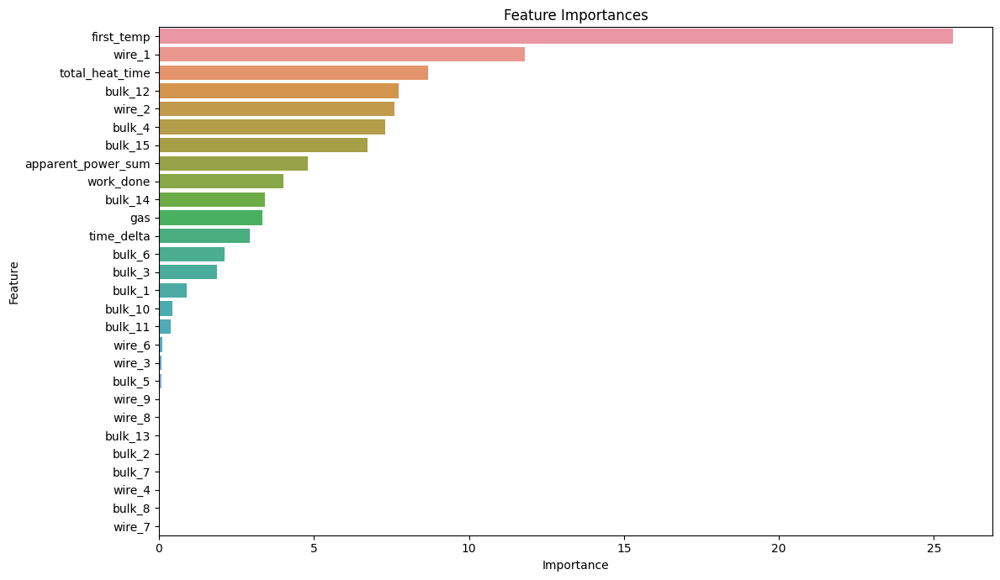

[I 2023-08-21 20:33:15,738] Trial 9 finished with value: 7.3308096590258645 and parameters: {'depth': 6, 'iterations': 599, 'learning_rate': 0.255, 'l2_leaf_reg': 185, 'random_strength': 169, 'bootstrap_type': 'Bayesian', 'border_count': 78, 'bagging_temperature': 19.91530223907987}. Best is trial 4 with value: 5.897737147953644.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1422279	test: 7.6587544	best: 7.6587544 (0)	total: 9.08ms	remaining: 9.06s
100:	learn: 8.0966741	test: 7.6158094	best: 7.6153778 (85)	total: 860ms	remaining: 7.64s
bestTest = 7.615377781
bestIteration = 85
Shrink model to first 86 iterations.
Split 1, MAE : 7.615361217294124

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9942009	test: 8.2677796	best: 8.2677796 (0)	total: 9.16ms	remaining: 9.13s
bestTest = 8.255982495
bestIteration = 38
Shrink model to first 39 iterations.
Split 2, MAE : 8.25598273245

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0156383	test: 8.1752482	best: 8.1752482 (0)	total: 9.01ms	remaining: 8.98s
100:	learn: 7.9081730	test: 8.0760117	best: 8.0756745 (93)	total: 851ms	remaining: 7.55s
200:	learn: 7.8913886	test: 8.0544329	best: 8.0543587 (194)	total: 1.69s	remaining: 6.71s
300:	learn: 7.8860266	test: 8.0503196	best: 8.0500523 (260)	total: 2.57s	remaining: 5.94s
bestTest = 8.041060396
bestIteration = 331
Shrink model to first 332 iterations.
Split 3, MAE : 8.041064387283763

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1018271	test: 7.8259516	best: 7.8259516 (0)	total: 10.3ms	remaining: 10.3s
100:	learn: 8.0253822	test: 7.7658130	best: 7.7657681 (87)	total: 852ms	remaining: 7.57s
bestTest = 7.765768117
bestIteration = 87
Shrink model to first 88 iterations.
Split 4, MAE : 7.765763058527687

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9812850	test: 8.3052817	best: 8.3052817 (0)	total: 9.93ms	remaining: 9.9s
100:	learn: 7.9257028	test: 8.2099532	best: 8.2099532 (100)	total: 731ms	remaining: 6.5s
200:	learn: 7.9212639	test: 8.2007103	best: 8.2005075 (183)	total: 1.62s	remaining: 6.43s
bestTest = 8.200507504
bestIteration = 183
Shrink model to first 184 iterations.
Split 5, MAE : 8.20053830465576
Average MAE: 7.975741940042266


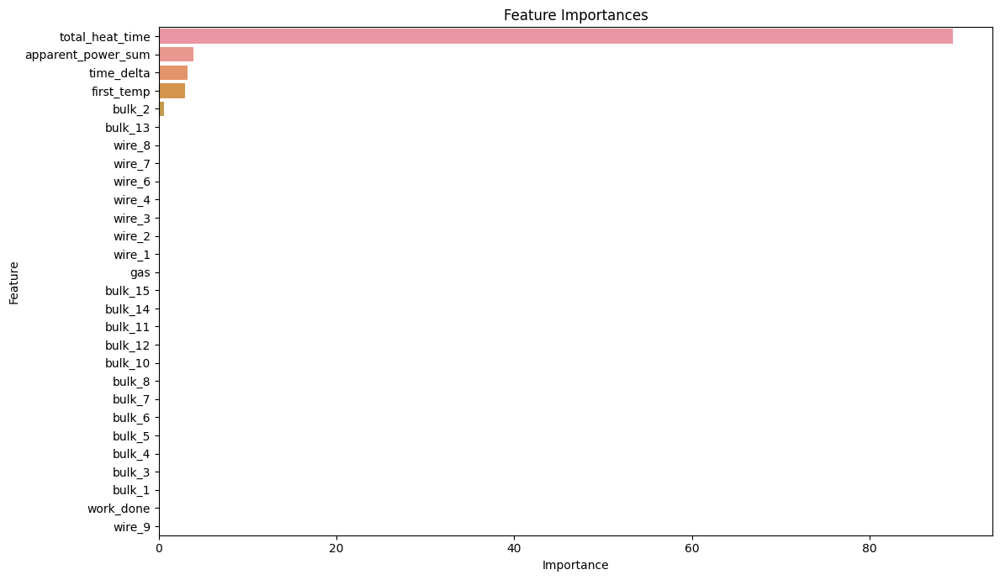

[I 2023-08-21 20:33:26,560] Trial 10 finished with value: 7.975741940042266 and parameters: {'depth': 2, 'iterations': 998, 'learning_rate': 0.5, 'l2_leaf_reg': 54, 'random_strength': 75, 'bootstrap_type': 'Bayesian', 'border_count': 241, 'bagging_temperature': 47.51258534615362}. Best is trial 4 with value: 5.897737147953644.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1460346	test: 7.6617778	best: 7.6617778 (0)	total: 4.42ms	remaining: 611ms
100:	learn: 7.1121478	test: 6.7489899	best: 6.7489899 (100)	total: 196ms	remaining: 73.9ms
138:	learn: 6.8584209	test: 6.5496403	best: 6.5496403 (138)	total: 242ms	remaining: 0us
bestTest = 6.549640295
bestIteration = 138
Split 1, MAE : 6.549689520939979

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9937721	test: 8.2686848	best: 8.2686848 (0)	total: 6.04ms	remaining: 833ms
100:	learn: 7.0476477	test: 7.3023244	best: 7.3023244 (100)	total: 321ms	remaining: 121ms
138:	learn: 6.8109238	test: 7.0382300	best: 7.0382300 (138)	total: 439ms	remaining: 0us
bestTest = 7.038230043
bestIteration = 138
Split 2, MAE : 7.038240688073083

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0164839	test: 8.1780037	best: 8.1780037 (0)	total: 4.81ms	remaining: 663ms
100:	learn: 6.9652487	test: 7.3735408	best: 7.3735408 (100)	total: 318ms	remaining: 120ms
138:	learn: 6.7219662	test: 7.1767305	best: 7.1767305 (138)	total: 387ms	remaining: 0us
bestTest = 7.17673053
bestIteration = 138
Split 3, MAE : 7.176736509236961

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1043466	test: 7.8277258	best: 7.8277258 (0)	total: 4.87ms	remaining: 671ms
100:	learn: 7.0618714	test: 6.9742347	best: 6.9742347 (100)	total: 339ms	remaining: 128ms
138:	learn: 6.8280130	test: 6.7961959	best: 6.7961959 (138)	total: 461ms	remaining: 0us
bestTest = 6.796195896
bestIteration = 138
Split 4, MAE : 6.796169301841526

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9834705	test: 8.3104108	best: 8.3104108 (0)	total: 5.58ms	remaining: 771ms
100:	learn: 6.9792003	test: 7.4341283	best: 7.4341283 (100)	total: 380ms	remaining: 143ms
138:	learn: 6.7419789	test: 7.2317077	best: 7.2317077 (138)	total: 521ms	remaining: 0us
bestTest = 7.231707694
bestIteration = 138
Split 5, MAE : 7.231727135504346
Average MAE: 6.958512631119179


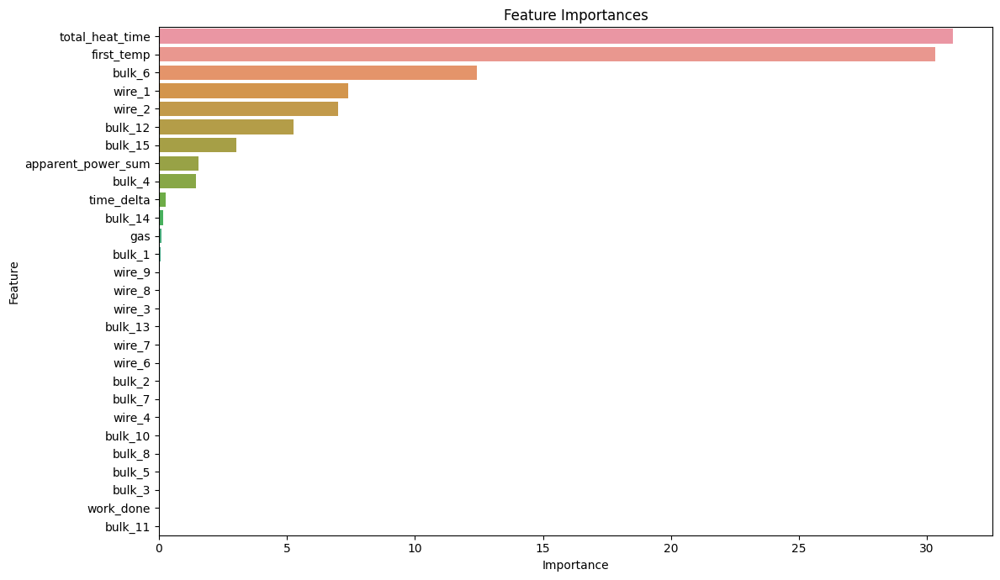

[I 2023-08-21 20:33:31,143] Trial 11 finished with value: 6.958512631119179 and parameters: {'depth': 2, 'iterations': 139, 'learning_rate': 0.5, 'l2_leaf_reg': 76, 'random_strength': 124, 'bootstrap_type': 'Bernoulli', 'border_count': 223, 'subsample': 0.98}. Best is trial 4 with value: 5.897737147953644.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1464634	test: 7.6624088	best: 7.6624088 (0)	total: 9.92ms	remaining: 7.26s
100:	learn: 6.9828408	test: 6.6208727	best: 6.6208727 (100)	total: 958ms	remaining: 6s
200:	learn: 6.4381655	test: 6.2332585	best: 6.2332585 (200)	total: 1.91s	remaining: 5.06s
300:	learn: 6.1598165	test: 5.9722512	best: 5.9722512 (300)	total: 2.88s	remaining: 4.13s
400:	learn: 5.9294871	test: 5.7590066	best: 5.7590066 (400)	total: 3.86s	remaining: 3.19s
500:	learn: 5.7609005	test: 5.6104705	best: 5.6104705 (500)	total: 4.83s	remaining: 2.24s
600:	learn: 5.6340658	test: 5.5182931	best: 5.5182931 (600)	total: 5.82s	remaining: 1.28s
700:	learn: 5.5297417	test: 5.4656741	best: 5.4656741 (700)	total: 6.85s	remaining: 313ms
732:	learn: 5.4988091	test: 5.4462866	best: 5.4462737 (731)	total: 7.14s	remaining: 0us
bestTest = 5.446273673
bestIteration = 731
Shrink model to first 732 iterations.
Split 1, MAE : 5.446319481189146

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9936334	test: 8.2687548	best: 8.2687548 (0)	total: 12.1ms	remaining: 8.88s
100:	learn: 6.9052125	test: 7.1768222	best: 7.1768222 (100)	total: 890ms	remaining: 5.57s
200:	learn: 6.3666537	test: 6.5932351	best: 6.5932351 (200)	total: 1.83s	remaining: 4.85s
300:	learn: 6.0436147	test: 6.2333928	best: 6.2333928 (300)	total: 2.8s	remaining: 4.02s
400:	learn: 5.8442957	test: 6.0931344	best: 6.0931344 (400)	total: 3.81s	remaining: 3.15s
500:	learn: 5.7173888	test: 6.0003253	best: 6.0003253 (500)	total: 4.77s	remaining: 2.21s
600:	learn: 5.5859056	test: 5.8968188	best: 5.8968188 (600)	total: 5.75s	remaining: 1.26s
700:	learn: 5.4457573	test: 5.7800597	best: 5.7800597 (700)	total: 6.76s	remaining: 308ms
732:	learn: 5.4120344	test: 5.7584736	best: 5.7584736 (732)	total: 7.08s	remaining: 0us
bestTest = 5.758473568
bestIteration = 732
Split 2, MAE : 5.758320084853227

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0164958	test: 8.1784262	best: 8.1784262 (0)	total: 10ms	remaining: 7.33s
100:	learn: 6.8302750	test: 7.2413033	best: 7.2413033 (100)	total: 971ms	remaining: 6.07s
200:	learn: 6.2308435	test: 6.7755977	best: 6.7755977 (200)	total: 1.91s	remaining: 5.05s
300:	learn: 5.8779003	test: 6.5769281	best: 6.5769281 (300)	total: 2.88s	remaining: 4.14s
400:	learn: 5.6511889	test: 6.3981178	best: 6.3981178 (400)	total: 3.84s	remaining: 3.18s
500:	learn: 5.4890935	test: 6.2843322	best: 6.2821524 (495)	total: 4.83s	remaining: 2.24s
600:	learn: 5.3795437	test: 6.1852468	best: 6.1852468 (600)	total: 5.92s	remaining: 1.3s
700:	learn: 5.2936921	test: 6.1306971	best: 6.1305348 (695)	total: 6.91s	remaining: 315ms
732:	learn: 5.2711814	test: 6.1197024	best: 6.1188804 (730)	total: 7.22s	remaining: 0us
bestTest = 6.118880395
bestIteration = 730
Shrink model to first 731 iterations.
Split 3, MAE : 6.1188211155781635

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1043095	test: 7.8273154	best: 7.8273154 (0)	total: 10.2ms	remaining: 7.46s
100:	learn: 6.9179631	test: 6.8659598	best: 6.8659598 (100)	total: 946ms	remaining: 5.92s
200:	learn: 6.3678973	test: 6.3654266	best: 6.3654266 (200)	total: 1.9s	remaining: 5.03s
300:	learn: 5.9814334	test: 6.1208412	best: 6.1208412 (300)	total: 2.87s	remaining: 4.12s
400:	learn: 5.7568562	test: 5.9657544	best: 5.9657544 (400)	total: 3.9s	remaining: 3.23s
500:	learn: 5.6115371	test: 5.8886557	best: 5.8886557 (500)	total: 4.87s	remaining: 2.25s
600:	learn: 5.4450731	test: 5.8151000	best: 5.8151000 (600)	total: 5.85s	remaining: 1.28s
700:	learn: 5.3532955	test: 5.7699497	best: 5.7699497 (700)	total: 6.88s	remaining: 314ms
732:	learn: 5.3307243	test: 5.7663325	best: 5.7663325 (732)	total: 7.2s	remaining: 0us
bestTest = 5.766332517
bestIteration = 732
Split 4, MAE : 5.766267469384844

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9767081	test: 8.3055195	best: 8.3055195 (0)	total: 11.2ms	remaining: 8.22s
100:	learn: 6.8028100	test: 7.3166230	best: 7.3166230 (100)	total: 1.01s	remaining: 6.33s
200:	learn: 6.2144216	test: 6.8639211	best: 6.8639211 (200)	total: 2.02s	remaining: 5.35s
300:	learn: 5.8378892	test: 6.6096767	best: 6.6096767 (300)	total: 3.08s	remaining: 4.42s
400:	learn: 5.6013357	test: 6.4452901	best: 6.4452901 (400)	total: 4.14s	remaining: 3.43s
500:	learn: 5.4748176	test: 6.4042821	best: 6.4042821 (500)	total: 5.21s	remaining: 2.41s
bestTest = 6.403366615
bestIteration = 504
Shrink model to first 505 iterations.
Split 5, MAE : 6.403372955878809
Average MAE: 5.898620221376838


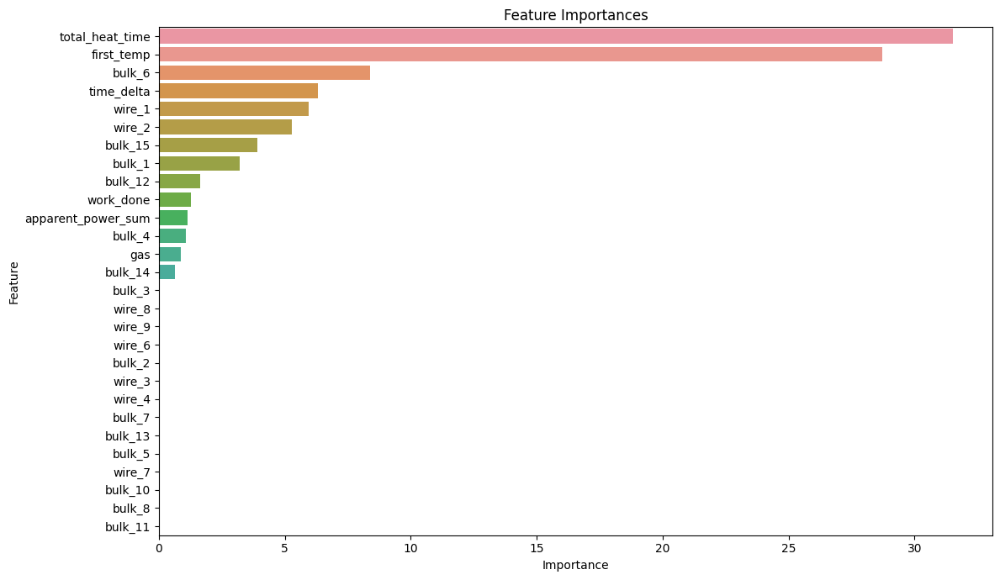

[I 2023-08-21 20:34:08,610] Trial 12 finished with value: 5.898620221376838 and parameters: {'depth': 3, 'iterations': 733, 'learning_rate': 0.43500000000000005, 'l2_leaf_reg': 44, 'random_strength': 64, 'bootstrap_type': 'Bernoulli', 'border_count': 137, 'subsample': 0.74}. Best is trial 4 with value: 5.897737147953644.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1461761	test: 7.6624549	best: 7.6624549 (0)	total: 10.1ms	remaining: 8.13s
100:	learn: 6.7453203	test: 6.4326242	best: 6.4326242 (100)	total: 932ms	remaining: 6.51s
200:	learn: 6.1080124	test: 5.9402086	best: 5.9402086 (200)	total: 1.85s	remaining: 5.57s
300:	learn: 5.7532807	test: 5.7011551	best: 5.7011551 (300)	total: 2.81s	remaining: 4.71s
400:	learn: 5.5210907	test: 5.5766101	best: 5.5766101 (400)	total: 3.82s	remaining: 3.85s
500:	learn: 5.3463462	test: 5.4845891	best: 5.4845891 (500)	total: 4.78s	remaining: 2.91s
600:	learn: 5.2141495	test: 5.4429876	best: 5.4426140 (599)	total: 5.8s	remaining: 1.98s
700:	learn: 5.0793390	test: 5.4012647	best: 5.3987939 (693)	total: 6.79s	remaining: 1.02s
800:	learn: 4.9575391	test: 5.3781140	best: 5.3781140 (800)	total: 7.8s	remaining: 48.7ms
805:	learn: 4.9520798	test: 5.3770962	best: 5.3762585 (803)	total: 7.85s	remaining: 0us
bestTest = 5.376258478
bestIteration = 803
Shrink model to first 804 iterations.
Split 1, MAE : 5.37622268

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9932691	test: 8.2684078	best: 8.2684078 (0)	total: 14.2ms	remaining: 11.5s
100:	learn: 6.6957062	test: 6.9505829	best: 6.9505829 (100)	total: 956ms	remaining: 6.67s
200:	learn: 6.1120063	test: 6.3595359	best: 6.3595359 (200)	total: 1.89s	remaining: 5.68s
300:	learn: 5.7323735	test: 5.9999440	best: 5.9999440 (300)	total: 2.85s	remaining: 4.78s
400:	learn: 5.5211667	test: 5.9053938	best: 5.9053938 (400)	total: 3.82s	remaining: 3.86s
500:	learn: 5.3223697	test: 5.7926816	best: 5.7926816 (500)	total: 4.8s	remaining: 2.92s
600:	learn: 5.1695401	test: 5.7420486	best: 5.7420486 (600)	total: 5.82s	remaining: 1.98s
700:	learn: 5.0471822	test: 5.7027682	best: 5.7000106 (691)	total: 6.8s	remaining: 1.02s
800:	learn: 4.9303040	test: 5.6834640	best: 5.6834640 (800)	total: 7.81s	remaining: 48.7ms
805:	learn: 4.9258835	test: 5.6850404	best: 5.6833667 (801)	total: 7.86s	remaining: 0us
bestTest = 5.683366748
bestIteration = 801
Shrink model to first 802 iterations.
Split 2, MAE : 5.68348419

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0161812	test: 8.1788089	best: 8.1788089 (0)	total: 9.74ms	remaining: 7.84s
100:	learn: 6.6018988	test: 7.0900200	best: 7.0900200 (100)	total: 948ms	remaining: 6.62s
200:	learn: 5.9258548	test: 6.5929036	best: 6.5929036 (200)	total: 1.92s	remaining: 5.77s
300:	learn: 5.5456056	test: 6.3479717	best: 6.3479717 (300)	total: 2.87s	remaining: 4.81s
400:	learn: 5.2959573	test: 6.2218644	best: 6.2218644 (400)	total: 3.82s	remaining: 3.86s
500:	learn: 5.1172267	test: 6.1549789	best: 6.1538268 (496)	total: 4.79s	remaining: 2.91s
600:	learn: 4.9892816	test: 6.1161704	best: 6.1161704 (600)	total: 5.77s	remaining: 1.97s
700:	learn: 4.8796691	test: 6.0979193	best: 6.0975639 (698)	total: 6.83s	remaining: 1.02s
800:	learn: 4.7978046	test: 6.0765727	best: 6.0765727 (800)	total: 7.81s	remaining: 48.8ms
805:	learn: 4.7921340	test: 6.0757046	best: 6.0757046 (805)	total: 7.86s	remaining: 0us
bestTest = 6.07570458
bestIteration = 805
Split 3, MAE : 6.075636421665009

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1039805	test: 7.8271968	best: 7.8271968 (0)	total: 10.1ms	remaining: 8.11s
100:	learn: 6.6690580	test: 6.6977665	best: 6.6977665 (100)	total: 940ms	remaining: 6.56s
200:	learn: 6.0291086	test: 6.1586584	best: 6.1586584 (200)	total: 1.88s	remaining: 5.65s
300:	learn: 5.6798475	test: 5.9278789	best: 5.9278789 (300)	total: 2.87s	remaining: 4.81s
400:	learn: 5.4623729	test: 5.8176690	best: 5.8176690 (400)	total: 3.89s	remaining: 3.93s
500:	learn: 5.2631496	test: 5.7648414	best: 5.7648414 (500)	total: 4.86s	remaining: 2.96s
600:	learn: 5.1004879	test: 5.7333325	best: 5.7333325 (600)	total: 5.84s	remaining: 1.99s
700:	learn: 4.9677759	test: 5.7055829	best: 5.7051756 (696)	total: 6.86s	remaining: 1.03s
bestTest = 5.689511354
bestIteration = 740
Shrink model to first 741 iterations.
Split 4, MAE : 5.689512865835355

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9752310	test: 8.3041501	best: 8.3041501 (0)	total: 11.6ms	remaining: 9.37s
100:	learn: 6.5653520	test: 7.1328953	best: 7.1328953 (100)	total: 1000ms	remaining: 6.98s
200:	learn: 5.8987126	test: 6.7021407	best: 6.7021407 (200)	total: 2s	remaining: 6.01s
300:	learn: 5.5563270	test: 6.5474938	best: 6.5474938 (300)	total: 3.03s	remaining: 5.08s
400:	learn: 5.3405249	test: 6.4996983	best: 6.4981984 (398)	total: 4.05s	remaining: 4.1s
bestTest = 6.493604638
bestIteration = 410
Shrink model to first 411 iterations.
Split 5, MAE : 6.493572123630761
Average MAE: 5.8636856573626375


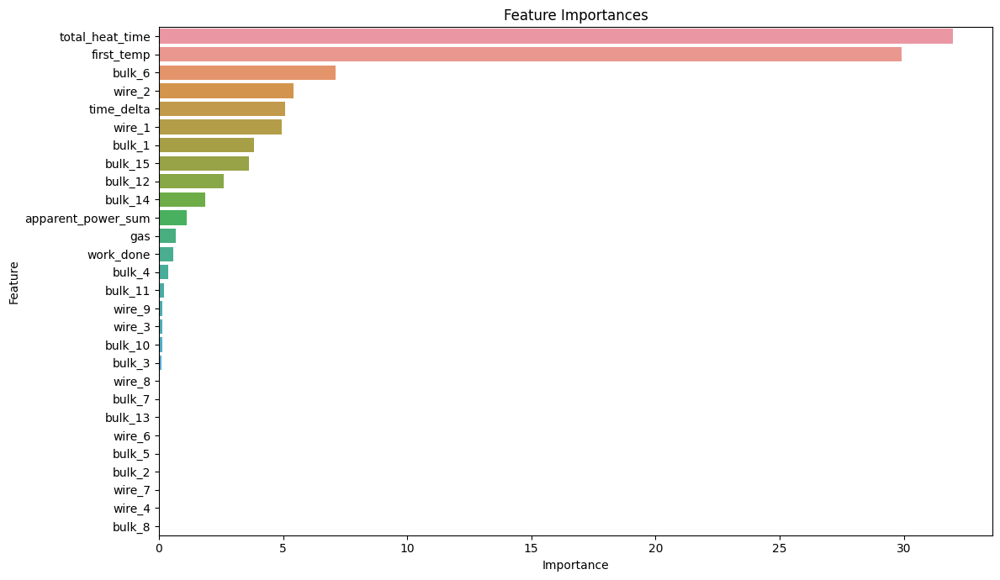

[I 2023-08-21 20:34:47,677] Trial 13 finished with value: 5.8636856573626375 and parameters: {'depth': 3, 'iterations': 806, 'learning_rate': 0.41500000000000004, 'l2_leaf_reg': 3, 'random_strength': 54, 'bootstrap_type': 'Bernoulli', 'border_count': 119, 'subsample': 0.77}. Best is trial 13 with value: 5.8636856573626375.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1384589	test: 7.6539037	best: 7.6539037 (0)	total: 11.1ms	remaining: 10.5s
100:	learn: 6.4919402	test: 6.2378056	best: 6.2378056 (100)	total: 1.04s	remaining: 8.73s
200:	learn: 5.7364528	test: 5.6947620	best: 5.6947620 (200)	total: 2.08s	remaining: 7.74s
300:	learn: 5.3557500	test: 5.5050822	best: 5.5050822 (300)	total: 3.15s	remaining: 6.77s
400:	learn: 5.0527817	test: 5.4072710	best: 5.4072710 (400)	total: 4.24s	remaining: 5.78s
500:	learn: 4.8419408	test: 5.3577842	best: 5.3577842 (500)	total: 5.36s	remaining: 4.77s
600:	learn: 4.6509556	test: 5.3360151	best: 5.3358042 (597)	total: 6.4s	remaining: 3.69s
700:	learn: 4.4802849	test: 5.3192982	best: 5.3190260 (688)	total: 7.47s	remaining: 2.62s
bestTest = 5.317608765
bestIteration = 710
Shrink model to first 711 iterations.
Split 1, MAE : 5.317605796539221

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9841873	test: 8.2630472	best: 8.2630472 (0)	total: 11.2ms	remaining: 10.6s
100:	learn: 6.4191422	test: 6.7384121	best: 6.7384121 (100)	total: 1.06s	remaining: 8.91s
200:	learn: 5.7412533	test: 6.1313449	best: 6.1313449 (200)	total: 2.1s	remaining: 7.79s
300:	learn: 5.3440765	test: 5.9021521	best: 5.9021521 (300)	total: 3.14s	remaining: 6.74s
400:	learn: 5.0751007	test: 5.7793616	best: 5.7790562 (398)	total: 4.2s	remaining: 5.72s
500:	learn: 4.8524266	test: 5.7049966	best: 5.7047514 (496)	total: 5.27s	remaining: 4.69s
600:	learn: 4.6624975	test: 5.6571318	best: 5.6554644 (596)	total: 6.37s	remaining: 3.67s
700:	learn: 4.5174590	test: 5.6339304	best: 5.6334568 (699)	total: 7.42s	remaining: 2.6s
800:	learn: 4.3733467	test: 5.6291018	best: 5.6235296 (794)	total: 8.51s	remaining: 1.55s
900:	learn: 4.2501023	test: 5.6059007	best: 5.6059007 (900)	total: 9.61s	remaining: 490ms
946:	learn: 4.2017400	test: 5.5962026	best: 5.5955597 (933)	total: 10.1s	remaining: 0us
bestTest = 5.59555

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0006445	test: 8.1640590	best: 8.1640590 (0)	total: 12.5ms	remaining: 11.8s
100:	learn: 6.3116790	test: 6.8752938	best: 6.8752938 (100)	total: 1.05s	remaining: 8.8s
200:	learn: 5.5485934	test: 6.3830846	best: 6.3825229 (199)	total: 2.07s	remaining: 7.69s
300:	learn: 5.1823836	test: 6.2253243	best: 6.2253243 (300)	total: 3.14s	remaining: 6.73s
400:	learn: 4.9036170	test: 6.1758456	best: 6.1758456 (400)	total: 4.18s	remaining: 5.69s
500:	learn: 4.6981917	test: 6.1438583	best: 6.1421010 (497)	total: 5.3s	remaining: 4.72s
600:	learn: 4.5260516	test: 6.1252211	best: 6.1252211 (600)	total: 6.36s	remaining: 3.66s
700:	learn: 4.3711862	test: 6.0884656	best: 6.0873142 (698)	total: 7.45s	remaining: 2.61s
800:	learn: 4.2344451	test: 6.0771848	best: 6.0753891 (761)	total: 8.55s	remaining: 1.56s
900:	learn: 4.0968268	test: 6.0540425	best: 6.0521020 (889)	total: 9.65s	remaining: 493ms
946:	learn: 4.0335219	test: 6.0365071	best: 6.0365071 (946)	total: 10.2s	remaining: 0us
bestTest = 6.0365

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0965068	test: 7.8218882	best: 7.8218882 (0)	total: 11.2ms	remaining: 10.6s
100:	learn: 6.3826151	test: 6.4578366	best: 6.4578366 (100)	total: 1.04s	remaining: 8.68s
200:	learn: 5.6726461	test: 5.9676065	best: 5.9676065 (200)	total: 2.07s	remaining: 7.67s
300:	learn: 5.3058772	test: 5.7714686	best: 5.7714686 (300)	total: 3.1s	remaining: 6.66s
400:	learn: 5.0218974	test: 5.6892753	best: 5.6885586 (397)	total: 4.17s	remaining: 5.68s
500:	learn: 4.7991715	test: 5.6501475	best: 5.6501475 (500)	total: 5.27s	remaining: 4.69s
600:	learn: 4.6159726	test: 5.6323060	best: 5.6319212 (599)	total: 6.37s	remaining: 3.67s
700:	learn: 4.4627569	test: 5.6117368	best: 5.6099173 (697)	total: 7.49s	remaining: 2.63s
bestTest = 5.609917301
bestIteration = 697
Shrink model to first 698 iterations.
Split 4, MAE : 5.609954963381803

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9703636	test: 8.3004606	best: 8.3004606 (0)	total: 11.7ms	remaining: 11s
100:	learn: 6.2573890	test: 6.9283616	best: 6.9283616 (100)	total: 1.15s	remaining: 9.61s
200:	learn: 5.5332721	test: 6.5306361	best: 6.5306361 (200)	total: 2.27s	remaining: 8.41s
300:	learn: 5.1641784	test: 6.4540525	best: 6.4540525 (300)	total: 3.4s	remaining: 7.29s
400:	learn: 4.8986587	test: 6.4195122	best: 6.4099893 (387)	total: 4.52s	remaining: 6.16s
bestTest = 6.40998928
bestIteration = 387
Shrink model to first 388 iterations.
Split 5, MAE : 6.4099040572719606
Average MAE: 5.793887755949863


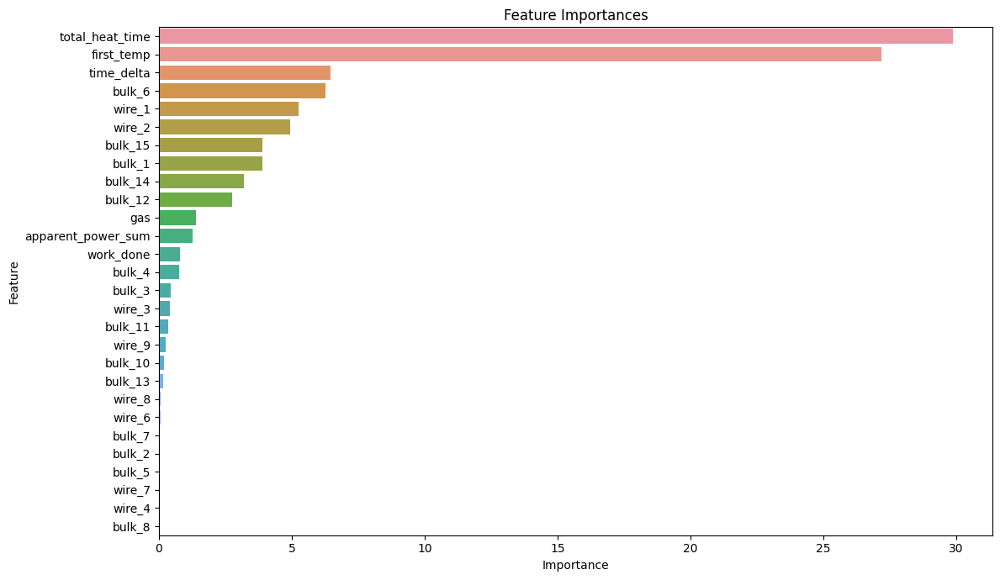

[I 2023-08-21 20:35:32,199] Trial 14 finished with value: 5.793887755949863 and parameters: {'depth': 4, 'iterations': 947, 'learning_rate': 0.43000000000000005, 'l2_leaf_reg': 1, 'random_strength': 30, 'bootstrap_type': 'Bayesian', 'border_count': 97, 'bagging_temperature': 0.2570245987912969}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1306849	test: 7.6474106	best: 7.6474106 (0)	total: 10.1ms	remaining: 7.94s
100:	learn: 6.7554376	test: 6.4467088	best: 6.4467088 (100)	total: 872ms	remaining: 5.91s
200:	learn: 6.2843527	test: 6.0949287	best: 6.0949287 (200)	total: 1.74s	remaining: 5.04s
300:	learn: 6.0583310	test: 5.9590403	best: 5.9590403 (300)	total: 2.61s	remaining: 4.2s
400:	learn: 5.8852210	test: 5.8920017	best: 5.8920017 (400)	total: 3.43s	remaining: 3.28s
500:	learn: 5.7587729	test: 5.8448710	best: 5.8448710 (500)	total: 4.33s	remaining: 2.45s
600:	learn: 5.6506740	test: 5.8095290	best: 5.8074776 (578)	total: 5.24s	remaining: 1.6s
bestTest = 5.799259743
bestIteration = 638
Shrink model to first 639 iterations.
Split 1, MAE : 5.799308541976299

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9828513	test: 8.2538846	best: 8.2538846 (0)	total: 9.33ms	remaining: 7.32s
100:	learn: 6.7496546	test: 6.8971070	best: 6.8971070 (100)	total: 877ms	remaining: 5.94s
200:	learn: 6.3216113	test: 6.4369607	best: 6.4369607 (200)	total: 1.76s	remaining: 5.12s
300:	learn: 6.1117120	test: 6.2527758	best: 6.2527758 (300)	total: 2.68s	remaining: 4.32s
400:	learn: 5.9495193	test: 6.1028609	best: 6.1027328 (399)	total: 3.64s	remaining: 3.49s
500:	learn: 5.8251382	test: 6.0089066	best: 6.0089066 (500)	total: 4.55s	remaining: 2.58s
600:	learn: 5.7053139	test: 5.9420526	best: 5.9420526 (600)	total: 5.47s	remaining: 1.67s
700:	learn: 5.6152733	test: 5.9132510	best: 5.9125998 (696)	total: 6.4s	remaining: 767ms
784:	learn: 5.5411105	test: 5.8786628	best: 5.8786285 (783)	total: 7.2s	remaining: 0us
bestTest = 5.878628531
bestIteration = 783
Shrink model to first 784 iterations.
Split 2, MAE : 5.878701201122788

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0023104	test: 8.1682430	best: 8.1682430 (0)	total: 9.53ms	remaining: 7.47s
100:	learn: 6.6466567	test: 7.0731366	best: 7.0731366 (100)	total: 884ms	remaining: 5.99s
200:	learn: 6.1654272	test: 6.8015661	best: 6.8015661 (200)	total: 1.73s	remaining: 5.03s
300:	learn: 5.9255851	test: 6.6601101	best: 6.6601101 (300)	total: 2.62s	remaining: 4.22s
400:	learn: 5.7526193	test: 6.5744902	best: 6.5744902 (400)	total: 3.51s	remaining: 3.36s
500:	learn: 5.6146613	test: 6.5358628	best: 6.5358628 (500)	total: 4.44s	remaining: 2.52s
600:	learn: 5.5280699	test: 6.5037202	best: 6.5037139 (599)	total: 5.36s	remaining: 1.64s
700:	learn: 5.4365676	test: 6.4793411	best: 6.4793019 (698)	total: 6.26s	remaining: 751ms
784:	learn: 5.3701974	test: 6.4680924	best: 6.4656720 (774)	total: 7.02s	remaining: 0us
bestTest = 6.465672009
bestIteration = 774
Shrink model to first 775 iterations.
Split 3, MAE : 6.465694330877109

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0926075	test: 7.8184239	best: 7.8184239 (0)	total: 9.45ms	remaining: 7.41s
100:	learn: 6.7341384	test: 6.6137779	best: 6.6137779 (100)	total: 850ms	remaining: 5.76s
200:	learn: 6.2854727	test: 6.2613932	best: 6.2613932 (200)	total: 1.63s	remaining: 4.75s
300:	learn: 6.0266927	test: 6.1094887	best: 6.1088544 (297)	total: 2.47s	remaining: 3.97s
400:	learn: 5.8696940	test: 6.0222084	best: 6.0222084 (400)	total: 3.41s	remaining: 3.26s
500:	learn: 5.7432754	test: 5.9931121	best: 5.9913653 (498)	total: 4.32s	remaining: 2.45s
600:	learn: 5.6415921	test: 5.9781663	best: 5.9781663 (600)	total: 5.21s	remaining: 1.59s
bestTest = 5.973781542
bestIteration = 621
Shrink model to first 622 iterations.
Split 4, MAE : 5.973834505547185

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9686058	test: 8.2974699	best: 8.2974699 (0)	total: 10.6ms	remaining: 8.31s
100:	learn: 6.6580001	test: 7.0538793	best: 7.0538793 (100)	total: 935ms	remaining: 6.33s
200:	learn: 6.1753864	test: 6.7017682	best: 6.7017682 (200)	total: 1.87s	remaining: 5.43s
300:	learn: 5.9127842	test: 6.5617606	best: 6.5617606 (300)	total: 2.8s	remaining: 4.5s
400:	learn: 5.7318205	test: 6.4799398	best: 6.4799398 (400)	total: 3.72s	remaining: 3.56s
500:	learn: 5.6050281	test: 6.4528310	best: 6.4523238 (497)	total: 4.67s	remaining: 2.64s
600:	learn: 5.5007018	test: 6.4066036	best: 6.4048574 (596)	total: 5.62s	remaining: 1.72s
700:	learn: 5.4109893	test: 6.3768781	best: 6.3768781 (700)	total: 6.61s	remaining: 793ms
784:	learn: 5.3418616	test: 6.3621139	best: 6.3616754 (780)	total: 7.46s	remaining: 0us
bestTest = 6.361675394
bestIteration = 780
Shrink model to first 781 iterations.
Split 5, MAE : 6.361639129876013
Average MAE: 6.095835541879879


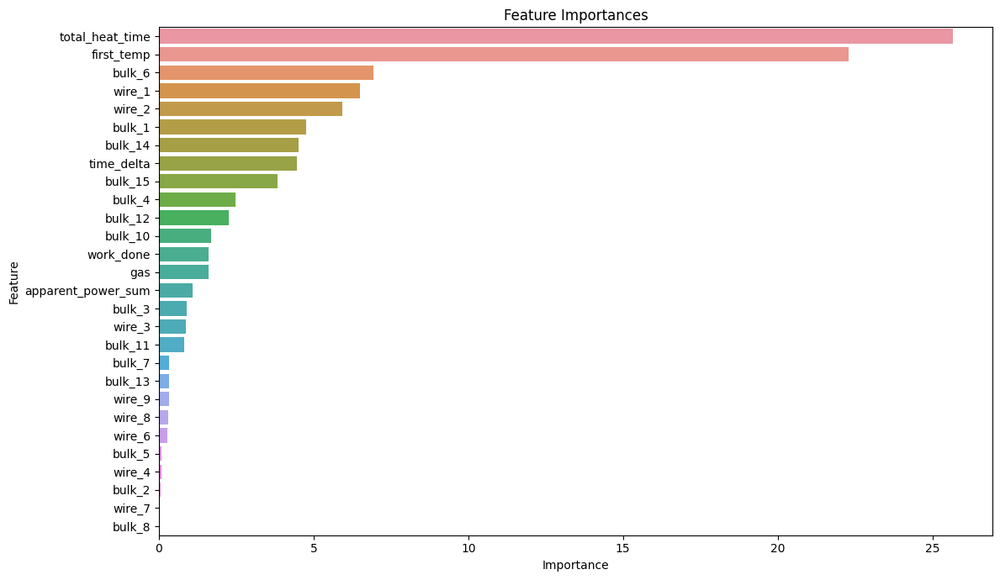

[I 2023-08-21 20:36:08,771] Trial 15 finished with value: 6.095835541879879 and parameters: {'depth': 3, 'iterations': 785, 'learning_rate': 0.42000000000000004, 'l2_leaf_reg': 1, 'random_strength': 18, 'bootstrap_type': 'Bayesian', 'border_count': 6, 'bagging_temperature': 0.318440185688722}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1373724	test: 7.6500800	best: 7.6500800 (0)	total: 15.5ms	remaining: 15.3s
100:	learn: 6.8960654	test: 6.5817913	best: 6.5817913 (100)	total: 1.45s	remaining: 12.8s
200:	learn: 6.2140752	test: 6.0796178	best: 6.0796178 (200)	total: 2.83s	remaining: 11.1s
300:	learn: 5.8048752	test: 5.7614739	best: 5.7614739 (300)	total: 4.32s	remaining: 9.88s
400:	learn: 5.5300317	test: 5.5928612	best: 5.5928612 (400)	total: 5.75s	remaining: 8.45s
500:	learn: 5.3086813	test: 5.4965561	best: 5.4965561 (500)	total: 7.16s	remaining: 6.99s
600:	learn: 5.1404359	test: 5.4258694	best: 5.4258694 (600)	total: 8.61s	remaining: 5.57s
700:	learn: 5.0066314	test: 5.3879790	best: 5.3878866 (699)	total: 10.1s	remaining: 4.17s
800:	learn: 4.8777539	test: 5.3537465	best: 5.3528871 (796)	total: 11.6s	remaining: 2.74s
900:	learn: 4.7675312	test: 5.3327266	best: 5.3320662 (895)	total: 13.2s	remaining: 1.3s
bestTest = 5.327567814
bestIteration = 917
Shrink model to first 918 iterations.
Split 1, MAE : 5.327530

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9838062	test: 8.2599076	best: 8.2599076 (0)	total: 15.2ms	remaining: 15s
100:	learn: 6.8181226	test: 7.1996196	best: 7.1996196 (100)	total: 1.43s	remaining: 12.6s
200:	learn: 6.1286863	test: 6.5563678	best: 6.5563678 (200)	total: 2.94s	remaining: 11.5s
300:	learn: 5.7013750	test: 6.1900687	best: 6.1900687 (300)	total: 4.47s	remaining: 10.2s
400:	learn: 5.4152888	test: 5.9914698	best: 5.9909486 (399)	total: 6.01s	remaining: 8.84s
500:	learn: 5.1617640	test: 5.8618650	best: 5.8618650 (500)	total: 7.54s	remaining: 7.36s
600:	learn: 4.9860780	test: 5.7791619	best: 5.7791619 (600)	total: 9.1s	remaining: 5.89s
700:	learn: 4.8544894	test: 5.7105230	best: 5.7105230 (700)	total: 10.6s	remaining: 4.38s
800:	learn: 4.7458577	test: 5.6801447	best: 5.6801447 (800)	total: 12s	remaining: 2.83s
900:	learn: 4.6342707	test: 5.6638642	best: 5.6635340 (899)	total: 13.5s	remaining: 1.33s
989:	learn: 4.5470186	test: 5.6461217	best: 5.6461217 (989)	total: 14.9s	remaining: 0us
bestTest = 5.6461216

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0068710	test: 8.1683143	best: 8.1683143 (0)	total: 14.8ms	remaining: 14.7s
100:	learn: 6.7341410	test: 7.2421833	best: 7.2421833 (100)	total: 1.43s	remaining: 12.6s
200:	learn: 5.9977400	test: 6.6515393	best: 6.6515393 (200)	total: 2.94s	remaining: 11.6s
300:	learn: 5.5558024	test: 6.3624362	best: 6.3624362 (300)	total: 4.46s	remaining: 10.2s
400:	learn: 5.2610021	test: 6.2520413	best: 6.2520413 (400)	total: 5.98s	remaining: 8.78s
500:	learn: 5.0268036	test: 6.1358359	best: 6.1357226 (499)	total: 7.49s	remaining: 7.31s
600:	learn: 4.8734129	test: 6.0667966	best: 6.0665427 (599)	total: 8.96s	remaining: 5.8s
700:	learn: 4.7495509	test: 6.0269646	best: 6.0263182 (696)	total: 10.4s	remaining: 4.29s
800:	learn: 4.6102265	test: 5.9830375	best: 5.9830375 (800)	total: 11.9s	remaining: 2.8s
900:	learn: 4.4564183	test: 5.9578973	best: 5.9569487 (884)	total: 13.3s	remaining: 1.32s
989:	learn: 4.3379733	test: 5.9384332	best: 5.9383450 (988)	total: 14.7s	remaining: 0us
bestTest = 5.9383

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0993294	test: 7.8236014	best: 7.8236014 (0)	total: 11.8ms	remaining: 11.7s
100:	learn: 6.8521841	test: 6.8056991	best: 6.8056991 (100)	total: 1.43s	remaining: 12.6s
200:	learn: 6.2082059	test: 6.3339858	best: 6.3339858 (200)	total: 2.99s	remaining: 11.7s
300:	learn: 5.7124275	test: 6.0349079	best: 6.0349079 (300)	total: 4.52s	remaining: 10.3s
400:	learn: 5.3791303	test: 5.9125724	best: 5.9125724 (400)	total: 5.92s	remaining: 8.7s
500:	learn: 5.1602420	test: 5.8360792	best: 5.8343993 (499)	total: 7.35s	remaining: 7.17s
600:	learn: 4.9695337	test: 5.7978298	best: 5.7978298 (600)	total: 8.85s	remaining: 5.73s
700:	learn: 4.8309028	test: 5.7678689	best: 5.7678689 (700)	total: 10.4s	remaining: 4.28s
bestTest = 5.762196157
bestIteration = 739
Shrink model to first 740 iterations.
Split 4, MAE : 5.762217144477196

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9750616	test: 8.3013278	best: 8.3013278 (0)	total: 16.6ms	remaining: 16.5s
100:	learn: 6.7459243	test: 7.3362462	best: 7.3362462 (100)	total: 1.61s	remaining: 14.2s
200:	learn: 6.0412970	test: 6.8311852	best: 6.8311852 (200)	total: 3.26s	remaining: 12.8s
300:	learn: 5.5449527	test: 6.5894993	best: 6.5894993 (300)	total: 4.96s	remaining: 11.4s
400:	learn: 5.2334471	test: 6.4725454	best: 6.4720655 (399)	total: 6.62s	remaining: 9.73s
500:	learn: 4.9974970	test: 6.4178039	best: 6.4153541 (479)	total: 8.18s	remaining: 7.98s
bestTest = 6.41535406
bestIteration = 479
Shrink model to first 480 iterations.
Split 5, MAE : 6.415329148131824
Average MAE: 5.817908952249162


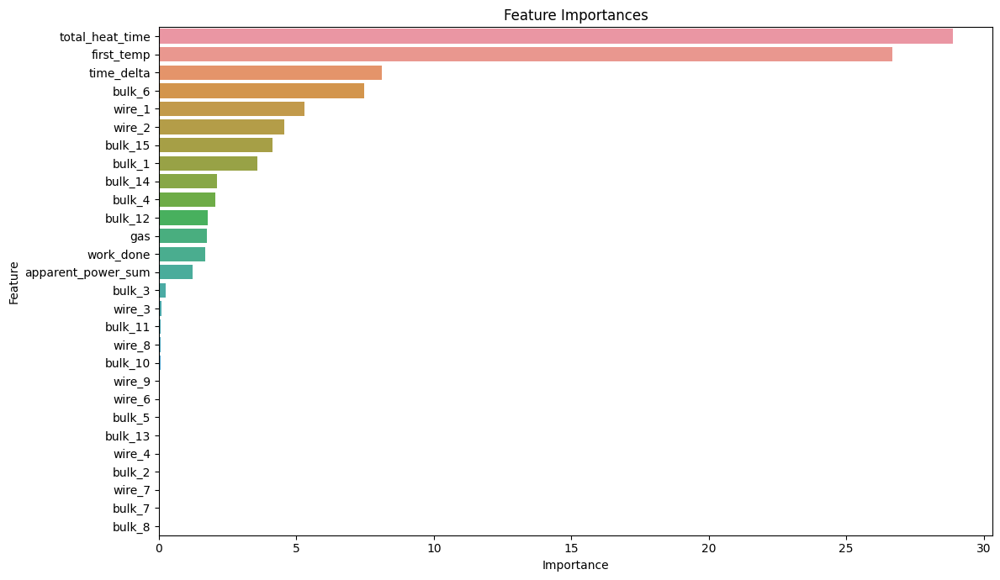

[I 2023-08-21 20:37:16,162] Trial 16 finished with value: 5.817908952249162 and parameters: {'depth': 7, 'iterations': 990, 'learning_rate': 0.33, 'l2_leaf_reg': 33, 'random_strength': 32, 'bootstrap_type': 'Bayesian', 'border_count': 56, 'bagging_temperature': 0.38214399645466557}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1375986	test: 7.6507572	best: 7.6507572 (0)	total: 16.3ms	remaining: 16.2s
100:	learn: 6.9595231	test: 6.6669558	best: 6.6669558 (100)	total: 1.65s	remaining: 14.6s
200:	learn: 6.3102519	test: 6.1813720	best: 6.1813720 (200)	total: 3.13s	remaining: 12.3s
300:	learn: 5.8829778	test: 5.8233303	best: 5.8233303 (300)	total: 4.65s	remaining: 10.7s
400:	learn: 5.5978209	test: 5.6600632	best: 5.6590440 (399)	total: 6.21s	remaining: 9.18s
500:	learn: 5.3739555	test: 5.5174305	best: 5.5174172 (499)	total: 7.71s	remaining: 7.58s
600:	learn: 5.2066782	test: 5.4421576	best: 5.4421576 (600)	total: 9.21s	remaining: 6.01s
700:	learn: 5.0568998	test: 5.3714162	best: 5.3714162 (700)	total: 10.7s	remaining: 4.47s
800:	learn: 4.9543376	test: 5.3257207	best: 5.3257067 (799)	total: 12.3s	remaining: 2.94s
900:	learn: 4.8373386	test: 5.2961492	best: 5.2944878 (897)	total: 13.8s	remaining: 1.41s
bestTest = 5.294487808
bestIteration = 897
Shrink model to first 898 iterations.
Split 1, MAE : 5.29452

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9842468	test: 8.2604169	best: 8.2604169 (0)	total: 14.9ms	remaining: 14.8s
100:	learn: 6.8728956	test: 7.2363050	best: 7.2363050 (100)	total: 1.46s	remaining: 12.9s
200:	learn: 6.2081381	test: 6.6138171	best: 6.6138171 (200)	total: 2.96s	remaining: 11.7s
300:	learn: 5.7737300	test: 6.2569612	best: 6.2569612 (300)	total: 4.47s	remaining: 10.3s
400:	learn: 5.5037682	test: 6.1000529	best: 6.1000529 (400)	total: 5.95s	remaining: 8.79s
500:	learn: 5.2388427	test: 5.9419253	best: 5.9419253 (500)	total: 7.43s	remaining: 7.3s
600:	learn: 5.0464060	test: 5.8275629	best: 5.8275629 (600)	total: 8.94s	remaining: 5.83s
700:	learn: 4.8817634	test: 5.7641658	best: 5.7641658 (700)	total: 10.5s	remaining: 4.36s
800:	learn: 4.7516193	test: 5.7232008	best: 5.7231536 (797)	total: 12s	remaining: 2.89s
900:	learn: 4.6456118	test: 5.7000596	best: 5.7000596 (900)	total: 13.6s	remaining: 1.38s
992:	learn: 4.5566651	test: 5.6749257	best: 5.6744539 (991)	total: 14.9s	remaining: 0us
bestTest = 5.67445

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0073277	test: 8.1683122	best: 8.1683122 (0)	total: 19ms	remaining: 18.9s
100:	learn: 6.7958445	test: 7.2898418	best: 7.2898418 (100)	total: 1.46s	remaining: 12.9s
200:	learn: 6.0748562	test: 6.7237489	best: 6.7237489 (200)	total: 2.9s	remaining: 11.4s
300:	learn: 5.6619987	test: 6.4270124	best: 6.4270124 (300)	total: 4.35s	remaining: 10s
400:	learn: 5.3684478	test: 6.2911975	best: 6.2911975 (400)	total: 5.74s	remaining: 8.48s
500:	learn: 5.1542380	test: 6.2244100	best: 6.2228871 (495)	total: 7.16s	remaining: 7.03s
600:	learn: 4.9903776	test: 6.1515715	best: 6.1515715 (600)	total: 8.61s	remaining: 5.62s
700:	learn: 4.8512360	test: 6.0975779	best: 6.0965797 (697)	total: 10.1s	remaining: 4.19s
800:	learn: 4.7253674	test: 6.0559649	best: 6.0559649 (800)	total: 11.5s	remaining: 2.76s
900:	learn: 4.5689100	test: 6.0060916	best: 6.0059881 (898)	total: 13s	remaining: 1.33s
992:	learn: 4.4496689	test: 5.9727493	best: 5.9721813 (990)	total: 14.3s	remaining: 0us
bestTest = 5.97218126


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0995352	test: 7.8237515	best: 7.8237515 (0)	total: 12ms	remaining: 11.9s
100:	learn: 6.8894237	test: 6.8821797	best: 6.8821797 (100)	total: 1.48s	remaining: 13s
200:	learn: 6.2439362	test: 6.3958025	best: 6.3958025 (200)	total: 2.98s	remaining: 11.7s
300:	learn: 5.7854433	test: 6.0910841	best: 6.0910841 (300)	total: 4.44s	remaining: 10.2s
400:	learn: 5.4369046	test: 5.9373681	best: 5.9373681 (400)	total: 5.88s	remaining: 8.69s
500:	learn: 5.2237616	test: 5.8676169	best: 5.8667083 (498)	total: 7.37s	remaining: 7.24s
600:	learn: 5.0674028	test: 5.8243713	best: 5.8243713 (600)	total: 8.91s	remaining: 5.81s
700:	learn: 4.9077320	test: 5.8021696	best: 5.8021696 (700)	total: 10.5s	remaining: 4.36s
bestTest = 5.800942607
bestIteration = 732
Shrink model to first 733 iterations.
Split 4, MAE : 5.801018013222765

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9755579	test: 8.3018062	best: 8.3018062 (0)	total: 18.1ms	remaining: 18s
100:	learn: 6.8023346	test: 7.3826834	best: 7.3826834 (100)	total: 1.6s	remaining: 14.2s
200:	learn: 6.1219121	test: 6.9004650	best: 6.9004650 (200)	total: 3.28s	remaining: 12.9s
300:	learn: 5.6397380	test: 6.6485729	best: 6.6485729 (300)	total: 4.91s	remaining: 11.3s
400:	learn: 5.3188137	test: 6.5074049	best: 6.5074049 (400)	total: 6.46s	remaining: 9.54s
500:	learn: 5.0977893	test: 6.4448509	best: 6.4448509 (500)	total: 8.09s	remaining: 7.94s
600:	learn: 4.9004725	test: 6.4118442	best: 6.4116393 (599)	total: 9.76s	remaining: 6.37s
bestTest = 6.410730121
bestIteration = 649
Shrink model to first 650 iterations.
Split 5, MAE : 6.410688875339997
Average MAE: 5.8305278949489345


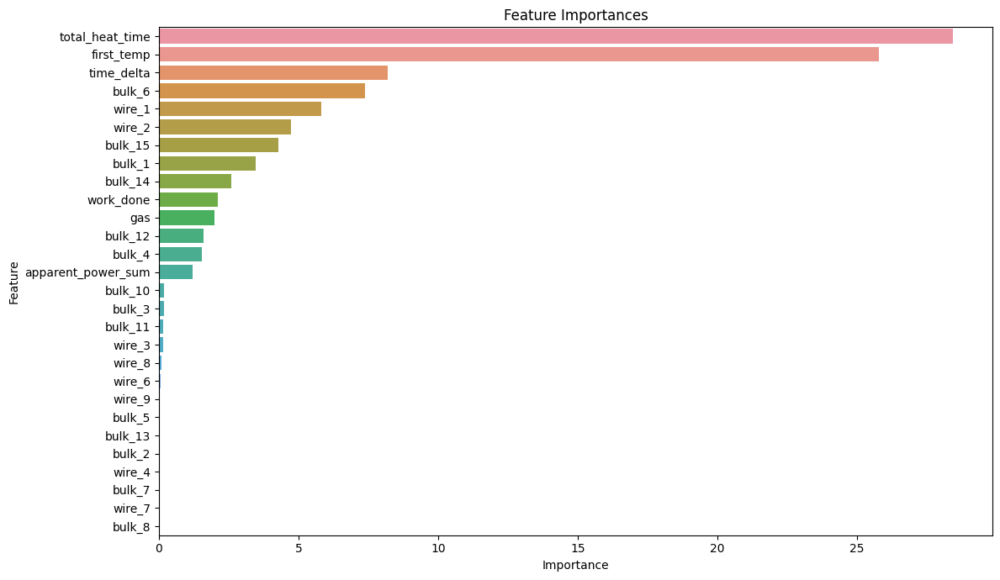

[I 2023-08-21 20:38:26,129] Trial 17 finished with value: 5.8305278949489345 and parameters: {'depth': 7, 'iterations': 993, 'learning_rate': 0.32, 'l2_leaf_reg': 36, 'random_strength': 33, 'bootstrap_type': 'Bayesian', 'border_count': 62, 'bagging_temperature': 0.3813168774143004}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1345302	test: 7.6498702	best: 7.6498702 (0)	total: 15.5ms	remaining: 10.5s
100:	learn: 7.1132252	test: 6.7797684	best: 6.7797684 (100)	total: 1.44s	remaining: 8.14s
200:	learn: 6.5342799	test: 6.3447448	best: 6.3447448 (200)	total: 2.83s	remaining: 6.66s
300:	learn: 6.1611286	test: 6.0834527	best: 6.0834527 (300)	total: 4.27s	remaining: 5.29s
400:	learn: 5.8915932	test: 5.8957331	best: 5.8957331 (400)	total: 5.79s	remaining: 3.94s
500:	learn: 5.6894097	test: 5.7591640	best: 5.7591640 (500)	total: 7.34s	remaining: 2.53s
600:	learn: 5.5181645	test: 5.6506890	best: 5.6506890 (600)	total: 8.87s	remaining: 1.08s
673:	learn: 5.3883367	test: 5.5711764	best: 5.5711764 (673)	total: 9.99s	remaining: 0us
bestTest = 5.571176436
bestIteration = 673
Split 1, MAE : 5.571127602810515

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9805549	test: 8.2570892	best: 8.2570892 (0)	total: 22.2ms	remaining: 14.9s
100:	learn: 6.9817157	test: 7.3880122	best: 7.3880122 (100)	total: 1.49s	remaining: 8.46s
200:	learn: 6.4239220	test: 6.8800857	best: 6.8800857 (200)	total: 2.89s	remaining: 6.8s
300:	learn: 6.0373490	test: 6.5461125	best: 6.5461125 (300)	total: 4.33s	remaining: 5.37s
400:	learn: 5.7601705	test: 6.3061006	best: 6.3061006 (400)	total: 5.75s	remaining: 3.91s
500:	learn: 5.5549590	test: 6.1489398	best: 6.1489398 (500)	total: 7.18s	remaining: 2.48s
600:	learn: 5.3951866	test: 6.0346008	best: 6.0346008 (600)	total: 8.55s	remaining: 1.04s
673:	learn: 5.2913715	test: 5.9706647	best: 5.9706647 (673)	total: 9.57s	remaining: 0us
bestTest = 5.97066465
bestIteration = 673
Split 2, MAE : 5.970691084074409

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0043168	test: 8.1675399	best: 8.1675399 (0)	total: 15.3ms	remaining: 10.3s
100:	learn: 6.9410952	test: 7.4093000	best: 7.4093000 (100)	total: 1.49s	remaining: 8.46s
200:	learn: 6.3450040	test: 6.9638490	best: 6.9638490 (200)	total: 3.01s	remaining: 7.08s
300:	learn: 5.9230148	test: 6.6624829	best: 6.6624829 (300)	total: 4.5s	remaining: 5.57s
400:	learn: 5.6447596	test: 6.4734278	best: 6.4734278 (400)	total: 6s	remaining: 4.09s
500:	learn: 5.4392843	test: 6.3579766	best: 6.3579766 (500)	total: 7.56s	remaining: 2.61s
600:	learn: 5.2839089	test: 6.2790842	best: 6.2790842 (600)	total: 9.09s	remaining: 1.1s
673:	learn: 5.1791642	test: 6.2356552	best: 6.2356552 (673)	total: 10.2s	remaining: 0us
bestTest = 6.235655164
bestIteration = 673
Split 3, MAE : 6.2356717242025965

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0910835	test: 7.8186646	best: 7.8186646 (0)	total: 15.9ms	remaining: 10.7s
100:	learn: 7.0350162	test: 6.9501111	best: 6.9501111 (100)	total: 1.4s	remaining: 7.95s
200:	learn: 6.5254760	test: 6.5874851	best: 6.5874851 (200)	total: 2.89s	remaining: 6.8s
300:	learn: 6.1463948	test: 6.3261122	best: 6.3261122 (300)	total: 4.33s	remaining: 5.37s
400:	learn: 5.8397086	test: 6.1061450	best: 6.1061450 (400)	total: 5.88s	remaining: 4s
500:	learn: 5.5677864	test: 5.9725307	best: 5.9725307 (500)	total: 7.4s	remaining: 2.56s
600:	learn: 5.3421822	test: 5.8865869	best: 5.8865869 (600)	total: 8.93s	remaining: 1.08s
673:	learn: 5.2265842	test: 5.8537370	best: 5.8536514 (672)	total: 10s	remaining: 0us
bestTest = 5.853651376
bestIteration = 672
Shrink model to first 673 iterations.
Split 4, MAE : 5.8537356408194

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9711176	test: 8.3011699	best: 8.3011699 (0)	total: 16.8ms	remaining: 11.3s
100:	learn: 6.9518019	test: 7.5193474	best: 7.5193474 (100)	total: 1.62s	remaining: 9.21s
200:	learn: 6.3788908	test: 7.0770804	best: 7.0770804 (200)	total: 3.23s	remaining: 7.61s
300:	learn: 5.9934028	test: 6.8089677	best: 6.8089677 (300)	total: 4.91s	remaining: 6.09s
400:	learn: 5.7084492	test: 6.6506748	best: 6.6506748 (400)	total: 6.61s	remaining: 4.5s
500:	learn: 5.4514652	test: 6.5090977	best: 6.5090977 (500)	total: 8.3s	remaining: 2.87s
600:	learn: 5.2541506	test: 6.4382794	best: 6.4380486 (599)	total: 10s	remaining: 1.21s
673:	learn: 5.1340901	test: 6.4144028	best: 6.4127702 (669)	total: 11.2s	remaining: 0us
bestTest = 6.412770238
bestIteration = 669
Shrink model to first 670 iterations.
Split 5, MAE : 6.412796766718066
Average MAE: 6.008804563724998


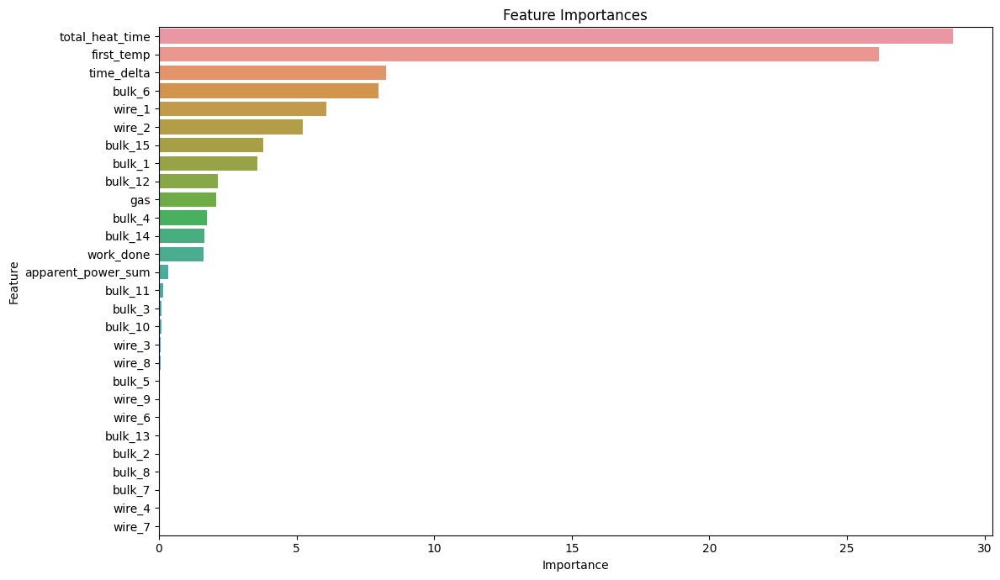

[I 2023-08-21 20:39:20,035] Trial 18 finished with value: 6.008804563724998 and parameters: {'depth': 7, 'iterations': 674, 'learning_rate': 0.29500000000000004, 'l2_leaf_reg': 58, 'random_strength': 0, 'bootstrap_type': 'Bayesian', 'border_count': 53, 'bagging_temperature': 0.49957048788834546}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1387139	test: 7.6544242	best: 7.6544242 (0)	total: 12.4ms	remaining: 11.3s
100:	learn: 7.4357865	test: 7.0402601	best: 7.0402601 (100)	total: 1.15s	remaining: 9.23s
200:	learn: 7.0692939	test: 6.7775095	best: 6.7775095 (200)	total: 2.31s	remaining: 8.15s
300:	learn: 6.7803414	test: 6.5760956	best: 6.5760956 (300)	total: 3.47s	remaining: 7.01s
400:	learn: 6.5661702	test: 6.4247711	best: 6.4247711 (400)	total: 4.66s	remaining: 5.91s
500:	learn: 6.3861044	test: 6.3101929	best: 6.3101929 (500)	total: 5.86s	remaining: 4.77s
600:	learn: 6.2120486	test: 6.1858994	best: 6.1858994 (600)	total: 7.05s	remaining: 3.61s
700:	learn: 6.0745172	test: 6.0801593	best: 6.0801593 (700)	total: 8.22s	remaining: 2.44s
800:	learn: 5.9573717	test: 6.0061392	best: 6.0061392 (800)	total: 9.4s	remaining: 1.27s
900:	learn: 5.8448765	test: 5.9359120	best: 5.9359120 (900)	total: 10.6s	remaining: 94ms
908:	learn: 5.8339248	test: 5.9295021	best: 5.9295021 (908)	total: 10.7s	remaining: 0us
bestTest = 5.9295

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9881748	test: 8.2603106	best: 8.2603106 (0)	total: 12ms	remaining: 10.9s
100:	learn: 7.4078297	test: 7.7111516	best: 7.7111516 (100)	total: 1.17s	remaining: 9.35s
200:	learn: 7.0383073	test: 7.3510658	best: 7.3510658 (200)	total: 2.35s	remaining: 8.27s
300:	learn: 6.7787021	test: 7.0829344	best: 7.0829344 (300)	total: 3.48s	remaining: 7.03s
400:	learn: 6.5634499	test: 6.8696415	best: 6.8696415 (400)	total: 4.63s	remaining: 5.86s
500:	learn: 6.3896456	test: 6.7091145	best: 6.7091145 (500)	total: 5.82s	remaining: 4.74s
600:	learn: 6.2383772	test: 6.5877507	best: 6.5877507 (600)	total: 7s	remaining: 3.58s
700:	learn: 6.1136343	test: 6.4727556	best: 6.4727556 (700)	total: 8.18s	remaining: 2.43s
800:	learn: 5.9837403	test: 6.3725712	best: 6.3725712 (800)	total: 9.4s	remaining: 1.27s
900:	learn: 5.8662908	test: 6.2897012	best: 6.2897012 (900)	total: 10.6s	remaining: 93.9ms
908:	learn: 5.8594955	test: 6.2854585	best: 6.2852521 (907)	total: 10.7s	remaining: 0us
bestTest = 6.2852520

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0058215	test: 8.1713853	best: 8.1713853 (0)	total: 12.1ms	remaining: 11s
100:	learn: 7.3652568	test: 7.7062715	best: 7.7062715 (100)	total: 1.16s	remaining: 9.29s
200:	learn: 6.9525099	test: 7.4373111	best: 7.4373111 (200)	total: 2.3s	remaining: 8.1s
300:	learn: 6.6568581	test: 7.2644903	best: 7.2644903 (300)	total: 3.48s	remaining: 7.03s
400:	learn: 6.4358733	test: 7.1455925	best: 7.1452308 (399)	total: 4.64s	remaining: 5.88s
500:	learn: 6.2389573	test: 7.0366183	best: 7.0366183 (500)	total: 5.85s	remaining: 4.76s
600:	learn: 6.0789951	test: 6.9606528	best: 6.9606528 (600)	total: 7.04s	remaining: 3.61s
700:	learn: 5.9306984	test: 6.8941108	best: 6.8931469 (698)	total: 8.21s	remaining: 2.44s
800:	learn: 5.7991959	test: 6.8251044	best: 6.8251044 (800)	total: 9.27s	remaining: 1.25s
900:	learn: 5.6885070	test: 6.7619818	best: 6.7619818 (900)	total: 10.3s	remaining: 91.8ms
908:	learn: 5.6817513	test: 6.7583190	best: 6.7583190 (908)	total: 10.4s	remaining: 0us
bestTest = 6.75831

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0966986	test: 7.8220916	best: 7.8220916 (0)	total: 12.5ms	remaining: 11.4s
100:	learn: 7.4019741	test: 7.2634067	best: 7.2634067 (100)	total: 1.1s	remaining: 8.83s
200:	learn: 7.0149810	test: 6.9639212	best: 6.9639212 (200)	total: 2.16s	remaining: 7.63s
300:	learn: 6.7251232	test: 6.7342375	best: 6.7342375 (300)	total: 3.4s	remaining: 6.87s
400:	learn: 6.5154024	test: 6.5879327	best: 6.5879327 (400)	total: 4.62s	remaining: 5.86s
500:	learn: 6.3385907	test: 6.4572186	best: 6.4572186 (500)	total: 5.82s	remaining: 4.74s
600:	learn: 6.1570425	test: 6.3498100	best: 6.3496929 (598)	total: 7.02s	remaining: 3.6s
700:	learn: 6.0100442	test: 6.2629240	best: 6.2629240 (700)	total: 8.21s	remaining: 2.44s
800:	learn: 5.8748943	test: 6.1966328	best: 6.1954163 (798)	total: 9.44s	remaining: 1.27s
900:	learn: 5.7554726	test: 6.1329795	best: 6.1323418 (899)	total: 10.6s	remaining: 94.4ms
908:	learn: 5.7439394	test: 6.1284011	best: 6.1280707 (907)	total: 10.7s	remaining: 0us
bestTest = 6.1280

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9814705	test: 8.3067529	best: 8.3067529 (0)	total: 13.1ms	remaining: 11.9s
100:	learn: 7.2811660	test: 7.7242376	best: 7.7242376 (100)	total: 1.24s	remaining: 9.93s
200:	learn: 6.8641605	test: 7.3614074	best: 7.3614074 (200)	total: 2.49s	remaining: 8.76s
300:	learn: 6.5620121	test: 7.1644947	best: 7.1644947 (300)	total: 3.79s	remaining: 7.67s
400:	learn: 6.3569528	test: 7.0436689	best: 7.0427653 (399)	total: 5.09s	remaining: 6.45s
500:	learn: 6.1786899	test: 6.9579005	best: 6.9578815 (499)	total: 6.38s	remaining: 5.2s
600:	learn: 6.0007756	test: 6.8682033	best: 6.8682033 (600)	total: 7.72s	remaining: 3.96s
700:	learn: 5.8504781	test: 6.8083215	best: 6.8083215 (700)	total: 9s	remaining: 2.67s
800:	learn: 5.7011442	test: 6.7398878	best: 6.7398878 (800)	total: 10.3s	remaining: 1.38s
900:	learn: 5.5778317	test: 6.7016658	best: 6.7015704 (898)	total: 11.6s	remaining: 103ms
908:	learn: 5.5708113	test: 6.6984639	best: 6.6984639 (908)	total: 11.7s	remaining: 0us
bestTest = 6.698463

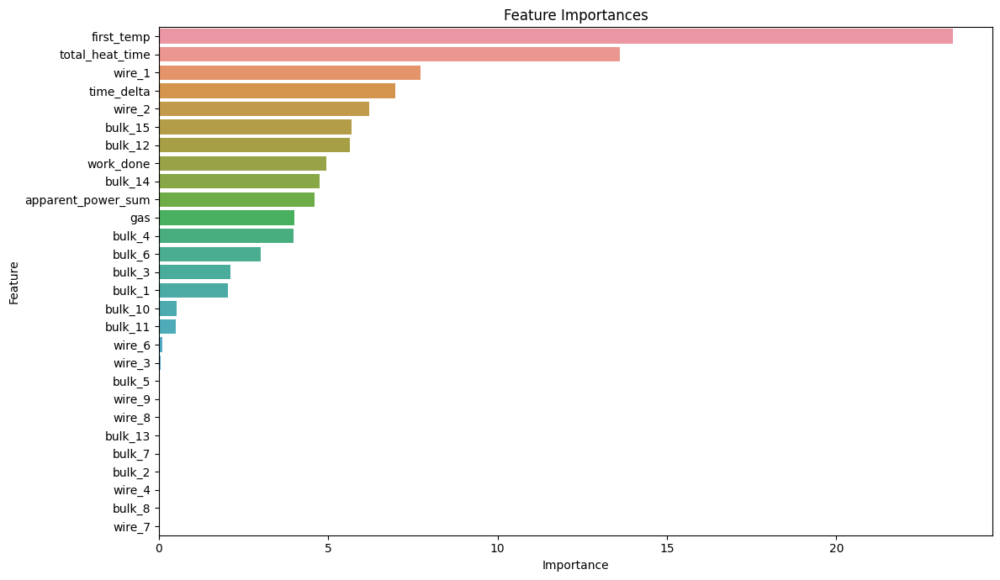

[I 2023-08-21 20:40:17,104] Trial 19 finished with value: 6.3599942729506145 and parameters: {'depth': 5, 'iterations': 909, 'learning_rate': 0.365, 'l2_leaf_reg': 25, 'random_strength': 34, 'bootstrap_type': 'Bayesian', 'border_count': 28, 'bagging_temperature': 11.54118558506002}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1426776	test: 7.6593714	best: 7.6593714 (0)	total: 8.1ms	remaining: 875ms
100:	learn: 7.8034994	test: 7.3885516	best: 7.3885516 (100)	total: 657ms	remaining: 52ms
108:	learn: 7.7744932	test: 7.3646999	best: 7.3646999 (108)	total: 709ms	remaining: 0us
bestTest = 7.364699924
bestIteration = 108
Split 1, MAE : 7.364690486223882

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9911269	test: 8.2664728	best: 8.2664728 (0)	total: 7.62ms	remaining: 823ms
100:	learn: 7.6577506	test: 8.0021490	best: 8.0021490 (100)	total: 529ms	remaining: 41.9ms
108:	learn: 7.6300650	test: 7.9796160	best: 7.9796160 (108)	total: 581ms	remaining: 0us
bestTest = 7.979616007
bestIteration = 108
Split 2, MAE : 7.979634970457498

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0139969	test: 8.1756315	best: 8.1756315 (0)	total: 7.58ms	remaining: 818ms
100:	learn: 7.6401598	test: 7.9299981	best: 7.9299981 (100)	total: 658ms	remaining: 52.1ms
108:	learn: 7.6151195	test: 7.9118953	best: 7.9118953 (108)	total: 710ms	remaining: 0us
bestTest = 7.911895315
bestIteration = 108
Split 3, MAE : 7.911903571185604

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1008737	test: 7.8236954	best: 7.8236954 (0)	total: 6.88ms	remaining: 743ms
100:	learn: 7.7368693	test: 7.5498875	best: 7.5498875 (100)	total: 649ms	remaining: 51.4ms
108:	learn: 7.7077901	test: 7.5296294	best: 7.5296294 (108)	total: 699ms	remaining: 0us
bestTest = 7.529629411
bestIteration = 108
Split 4, MAE : 7.529633447482222

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9816917	test: 8.3081714	best: 8.3081714 (0)	total: 9.63ms	remaining: 1.04s
100:	learn: 7.6285226	test: 8.0473254	best: 8.0473254 (100)	total: 613ms	remaining: 48.5ms
108:	learn: 7.6023851	test: 8.0297346	best: 8.0297346 (108)	total: 643ms	remaining: 0us
bestTest = 8.029734644
bestIteration = 108
Split 5, MAE : 8.029716539277459
Average MAE: 7.763115802925332


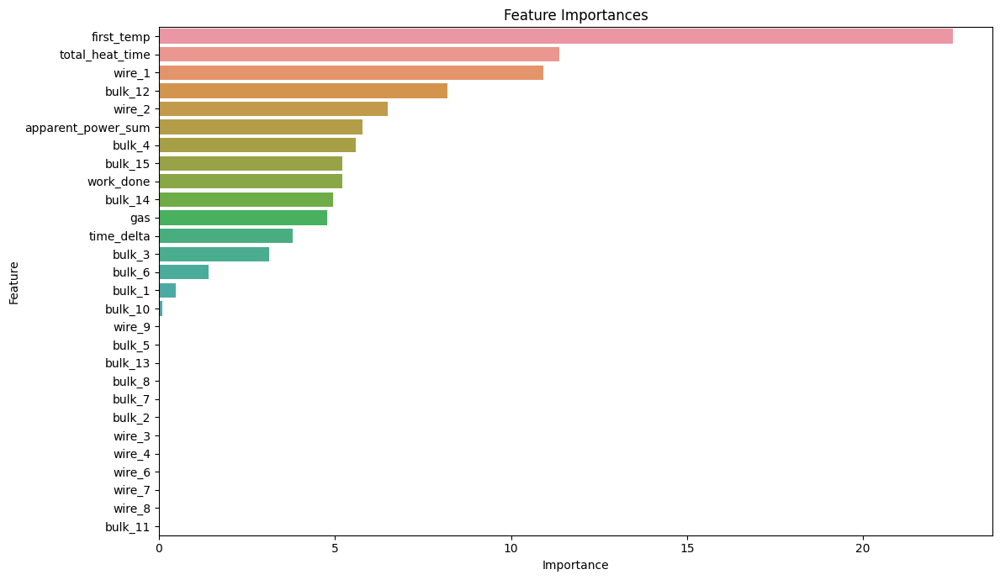

[I 2023-08-21 20:40:22,988] Trial 20 finished with value: 7.763115802925332 and parameters: {'depth': 7, 'iterations': 109, 'learning_rate': 0.21000000000000002, 'l2_leaf_reg': 76, 'random_strength': 92, 'bootstrap_type': 'Bayesian', 'border_count': 88, 'bagging_temperature': 10.09327237817602}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1382459	test: 7.6512916	best: 7.6512916 (0)	total: 15.6ms	remaining: 15.1s
100:	learn: 7.0091379	test: 6.6911194	best: 6.6911194 (100)	total: 1.3s	remaining: 11.1s
200:	learn: 6.3328341	test: 6.1847956	best: 6.1847956 (200)	total: 2.75s	remaining: 10.5s
300:	learn: 5.9185887	test: 5.8607870	best: 5.8607870 (300)	total: 4.29s	remaining: 9.5s
400:	learn: 5.6288530	test: 5.6646704	best: 5.6645141 (399)	total: 5.84s	remaining: 8.25s
500:	learn: 5.4140212	test: 5.5594238	best: 5.5594238 (500)	total: 7.37s	remaining: 6.87s
600:	learn: 5.2250125	test: 5.4484419	best: 5.4484412 (599)	total: 8.91s	remaining: 5.44s
700:	learn: 5.0800441	test: 5.3813200	best: 5.3813200 (700)	total: 10.5s	remaining: 3.99s
800:	learn: 4.9615365	test: 5.3486538	best: 5.3486538 (800)	total: 12s	remaining: 2.51s
900:	learn: 4.8528578	test: 5.3167494	best: 5.3167494 (900)	total: 13.5s	remaining: 1s
967:	learn: 4.7886576	test: 5.3046092	best: 5.3046092 (967)	total: 14.5s	remaining: 0us
bestTest = 5.304609151

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9818012	test: 8.2558999	best: 8.2558999 (0)	total: 15ms	remaining: 14.5s
100:	learn: 6.9084483	test: 7.2621874	best: 7.2621874 (100)	total: 1.38s	remaining: 11.9s
200:	learn: 6.2309059	test: 6.6485256	best: 6.6485256 (200)	total: 2.8s	remaining: 10.7s
300:	learn: 5.8043807	test: 6.2750157	best: 6.2750157 (300)	total: 4.29s	remaining: 9.5s
400:	learn: 5.5232266	test: 6.0660929	best: 6.0660929 (400)	total: 5.82s	remaining: 8.23s
500:	learn: 5.2740098	test: 5.9241723	best: 5.9241723 (500)	total: 7.36s	remaining: 6.86s
600:	learn: 5.0834120	test: 5.8246332	best: 5.8246332 (600)	total: 8.96s	remaining: 5.47s
700:	learn: 4.9447906	test: 5.7549570	best: 5.7549570 (700)	total: 10.5s	remaining: 4.01s
800:	learn: 4.8101623	test: 5.6991397	best: 5.6991397 (800)	total: 12s	remaining: 2.51s
900:	learn: 4.7082407	test: 5.6659401	best: 5.6659401 (900)	total: 13.5s	remaining: 1s
967:	learn: 4.6320650	test: 5.6435739	best: 5.6434655 (966)	total: 14.5s	remaining: 0us
bestTest = 5.643465496
b

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0034824	test: 8.1671279	best: 8.1671279 (0)	total: 14.4ms	remaining: 13.9s
100:	learn: 6.8385849	test: 7.3056878	best: 7.3056878 (100)	total: 1.43s	remaining: 12.2s
200:	learn: 6.1130767	test: 6.7480749	best: 6.7480749 (200)	total: 2.88s	remaining: 11s
300:	learn: 5.6771624	test: 6.4332314	best: 6.4332314 (300)	total: 4.19s	remaining: 9.28s
400:	learn: 5.3880494	test: 6.2660412	best: 6.2660412 (400)	total: 5.66s	remaining: 8s
500:	learn: 5.1592988	test: 6.1610817	best: 6.1610817 (500)	total: 7.17s	remaining: 6.68s
600:	learn: 4.9781377	test: 6.0814618	best: 6.0814618 (600)	total: 8.64s	remaining: 5.27s
700:	learn: 4.8426606	test: 6.0271339	best: 6.0271339 (700)	total: 10.1s	remaining: 3.84s
800:	learn: 4.7248847	test: 5.9888136	best: 5.9888136 (800)	total: 11.5s	remaining: 2.39s
900:	learn: 4.5905310	test: 5.9520253	best: 5.9517455 (899)	total: 12.9s	remaining: 960ms
967:	learn: 4.5087856	test: 5.9309956	best: 5.9305983 (956)	total: 13.8s	remaining: 0us
bestTest = 5.9305983

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0914525	test: 7.8162267	best: 7.8162267 (0)	total: 15.1ms	remaining: 14.6s
100:	learn: 6.9332227	test: 6.9102271	best: 6.9102271 (100)	total: 1.45s	remaining: 12.4s
200:	learn: 6.2759150	test: 6.4158381	best: 6.4158381 (200)	total: 2.92s	remaining: 11.1s
300:	learn: 5.8172355	test: 6.0969807	best: 6.0969807 (300)	total: 4.43s	remaining: 9.81s
400:	learn: 5.4883009	test: 5.9137791	best: 5.9137791 (400)	total: 5.96s	remaining: 8.42s
500:	learn: 5.2681217	test: 5.8323978	best: 5.8323978 (500)	total: 7.5s	remaining: 6.99s
600:	learn: 5.0750179	test: 5.7863748	best: 5.7863748 (600)	total: 8.93s	remaining: 5.45s
700:	learn: 4.9249209	test: 5.7629482	best: 5.7624954 (696)	total: 10.4s	remaining: 3.95s
bestTest = 5.760897932
bestIteration = 707
Shrink model to first 708 iterations.
Split 4, MAE : 5.760920689018965

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9755362	test: 8.3028656	best: 8.3028656 (0)	total: 16.5ms	remaining: 16s
100:	learn: 6.8395476	test: 7.4030537	best: 7.4030537 (100)	total: 1.56s	remaining: 13.4s
200:	learn: 6.1427293	test: 6.8957856	best: 6.8957856 (200)	total: 3.22s	remaining: 12.3s
300:	learn: 5.6652862	test: 6.6374919	best: 6.6374919 (300)	total: 4.92s	remaining: 10.9s
400:	learn: 5.3556249	test: 6.5260669	best: 6.5260669 (400)	total: 6.6s	remaining: 9.33s
500:	learn: 5.1273581	test: 6.4351610	best: 6.4351610 (500)	total: 8.29s	remaining: 7.73s
600:	learn: 4.9437542	test: 6.3993565	best: 6.3993565 (600)	total: 9.98s	remaining: 6.09s
700:	learn: 4.8099133	test: 6.3853970	best: 6.3851725 (699)	total: 11.4s	remaining: 4.33s
bestTest = 6.379640777
bestIteration = 731
Shrink model to first 732 iterations.
Split 5, MAE : 6.379641394137283
Average MAE: 5.803900766867124


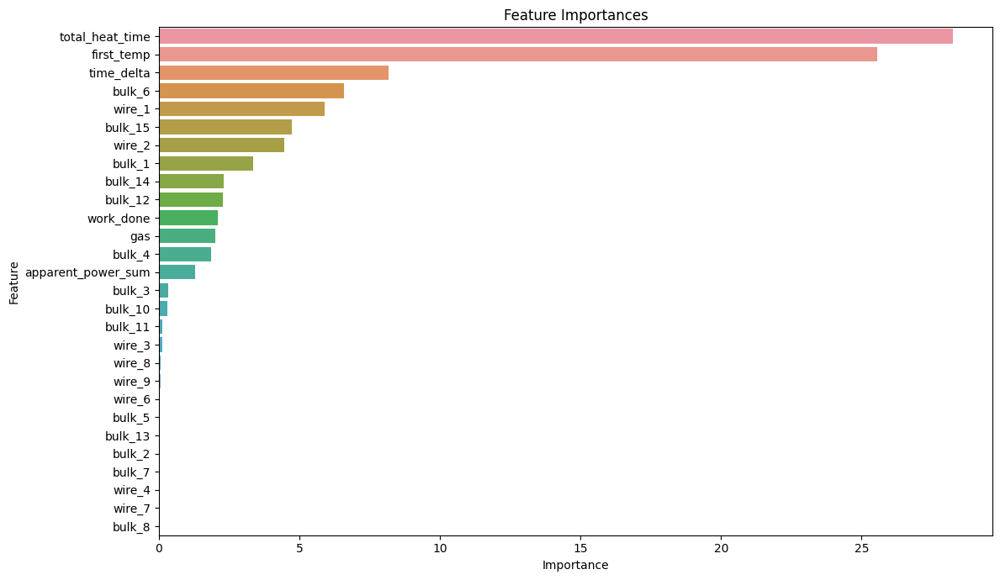

[I 2023-08-21 20:41:32,648] Trial 21 finished with value: 5.803900766867124 and parameters: {'depth': 7, 'iterations': 968, 'learning_rate': 0.29500000000000004, 'l2_leaf_reg': 32, 'random_strength': 34, 'bootstrap_type': 'Bayesian', 'border_count': 57, 'bagging_temperature': 0.9799558118856029}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1394397	test: 7.6545501	best: 7.6545501 (0)	total: 10.6ms	remaining: 9.78s
100:	learn: 7.4144982	test: 7.0449666	best: 7.0449666 (100)	total: 1.26s	remaining: 10.3s
200:	learn: 6.9158419	test: 6.6788047	best: 6.6788047 (200)	total: 2.56s	remaining: 9.24s
300:	learn: 6.6099109	test: 6.4518043	best: 6.4518043 (300)	total: 3.89s	remaining: 8.06s
400:	learn: 6.3952430	test: 6.3051821	best: 6.3051821 (400)	total: 5.18s	remaining: 6.76s
500:	learn: 6.1889571	test: 6.1832929	best: 6.1832929 (500)	total: 6.46s	remaining: 5.46s
600:	learn: 6.0101096	test: 6.0762474	best: 6.0762474 (600)	total: 7.76s	remaining: 4.18s
700:	learn: 5.8519278	test: 5.9775363	best: 5.9775363 (700)	total: 9.08s	remaining: 2.9s
800:	learn: 5.7229676	test: 5.9009419	best: 5.9009419 (800)	total: 10.4s	remaining: 1.61s
900:	learn: 5.6116083	test: 5.8504079	best: 5.8504079 (900)	total: 11.7s	remaining: 312ms
924:	learn: 5.5854254	test: 5.8395569	best: 5.8395569 (924)	total: 12.1s	remaining: 0us
bestTest = 5.839

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9862875	test: 8.2625617	best: 8.2625617 (0)	total: 13.4ms	remaining: 12.4s
100:	learn: 7.3263449	test: 7.6330916	best: 7.6330916 (100)	total: 1.26s	remaining: 10.3s
200:	learn: 6.9075894	test: 7.2370312	best: 7.2370312 (200)	total: 2.56s	remaining: 9.22s
300:	learn: 6.6090878	test: 6.9485584	best: 6.9485584 (300)	total: 3.92s	remaining: 8.13s
400:	learn: 6.3646837	test: 6.7430913	best: 6.7430913 (400)	total: 5.23s	remaining: 6.83s
500:	learn: 6.1685719	test: 6.5795675	best: 6.5795675 (500)	total: 6.54s	remaining: 5.54s
600:	learn: 5.9875303	test: 6.4294692	best: 6.4294692 (600)	total: 7.85s	remaining: 4.23s
700:	learn: 5.8328299	test: 6.3210596	best: 6.3210596 (700)	total: 9.18s	remaining: 2.93s
800:	learn: 5.6961290	test: 6.2368906	best: 6.2368906 (800)	total: 10.5s	remaining: 1.62s
900:	learn: 5.5692025	test: 6.1688355	best: 6.1683703 (896)	total: 11.8s	remaining: 314ms
924:	learn: 5.5433754	test: 6.1526194	best: 6.1525361 (923)	total: 12.1s	remaining: 0us
bestTest = 6.15

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0048954	test: 8.1695693	best: 8.1695693 (0)	total: 13.4ms	remaining: 12.3s
100:	learn: 7.3156721	test: 7.6888151	best: 7.6888151 (100)	total: 1.32s	remaining: 10.8s
200:	learn: 6.8673430	test: 7.3944417	best: 7.3944417 (200)	total: 2.6s	remaining: 9.36s
300:	learn: 6.5327940	test: 7.2169941	best: 7.2166808 (299)	total: 3.89s	remaining: 8.06s
400:	learn: 6.2887360	test: 7.0775472	best: 7.0774912 (399)	total: 5.22s	remaining: 6.82s
500:	learn: 6.0823640	test: 6.9648451	best: 6.9648451 (500)	total: 6.55s	remaining: 5.55s
600:	learn: 5.9130600	test: 6.8790636	best: 6.8790636 (600)	total: 7.91s	remaining: 4.26s
700:	learn: 5.7484931	test: 6.7963238	best: 6.7963238 (700)	total: 9.24s	remaining: 2.95s
800:	learn: 5.6154834	test: 6.7393844	best: 6.7389318 (798)	total: 10.6s	remaining: 1.64s
900:	learn: 5.4805570	test: 6.6705676	best: 6.6705676 (900)	total: 11.9s	remaining: 318ms
924:	learn: 5.4439696	test: 6.6527005	best: 6.6527005 (924)	total: 12.2s	remaining: 0us
bestTest = 6.652

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0950703	test: 7.8198537	best: 7.8198537 (0)	total: 13.3ms	remaining: 12.3s
100:	learn: 7.3567596	test: 7.2379199	best: 7.2379199 (100)	total: 1.26s	remaining: 10.3s
200:	learn: 6.8916233	test: 6.8998371	best: 6.8998371 (200)	total: 2.55s	remaining: 9.2s
300:	learn: 6.5642963	test: 6.6517194	best: 6.6517194 (300)	total: 3.89s	remaining: 8.06s
400:	learn: 6.3118616	test: 6.4768628	best: 6.4764762 (398)	total: 5.14s	remaining: 6.71s
500:	learn: 6.1227445	test: 6.3483311	best: 6.3483311 (500)	total: 6.45s	remaining: 5.46s
600:	learn: 5.9267991	test: 6.2308911	best: 6.2305621 (599)	total: 7.76s	remaining: 4.18s
700:	learn: 5.7663061	test: 6.1539082	best: 6.1539082 (700)	total: 9.06s	remaining: 2.9s
800:	learn: 5.6290466	test: 6.1063597	best: 6.1063597 (800)	total: 10.4s	remaining: 1.61s
900:	learn: 5.5070544	test: 6.0493802	best: 6.0493802 (900)	total: 11.8s	remaining: 313ms
924:	learn: 5.4729163	test: 6.0341250	best: 6.0341250 (924)	total: 12.1s	remaining: 0us
bestTest = 6.0341

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9726506	test: 8.3029897	best: 8.3029897 (0)	total: 14.2ms	remaining: 13.1s
100:	learn: 7.2469191	test: 7.7317947	best: 7.7317947 (100)	total: 1.34s	remaining: 11s
200:	learn: 6.7771372	test: 7.3476506	best: 7.3476506 (200)	total: 2.74s	remaining: 9.87s
300:	learn: 6.4328370	test: 7.1439672	best: 7.1439672 (300)	total: 4.17s	remaining: 8.65s
400:	learn: 6.1791793	test: 6.9933402	best: 6.9933402 (400)	total: 5.64s	remaining: 7.37s
500:	learn: 5.9814530	test: 6.8919088	best: 6.8919088 (500)	total: 7.09s	remaining: 6s
600:	learn: 5.7997928	test: 6.8179539	best: 6.8179539 (600)	total: 8.53s	remaining: 4.6s
700:	learn: 5.6290645	test: 6.7496113	best: 6.7496113 (700)	total: 10s	remaining: 3.21s
800:	learn: 5.4741498	test: 6.6989395	best: 6.6989395 (800)	total: 11.5s	remaining: 1.78s
900:	learn: 5.3403205	test: 6.6625731	best: 6.6625731 (900)	total: 13s	remaining: 347ms
924:	learn: 5.3114905	test: 6.6533196	best: 6.6533196 (924)	total: 13.4s	remaining: 0us
bestTest = 6.653319611
be

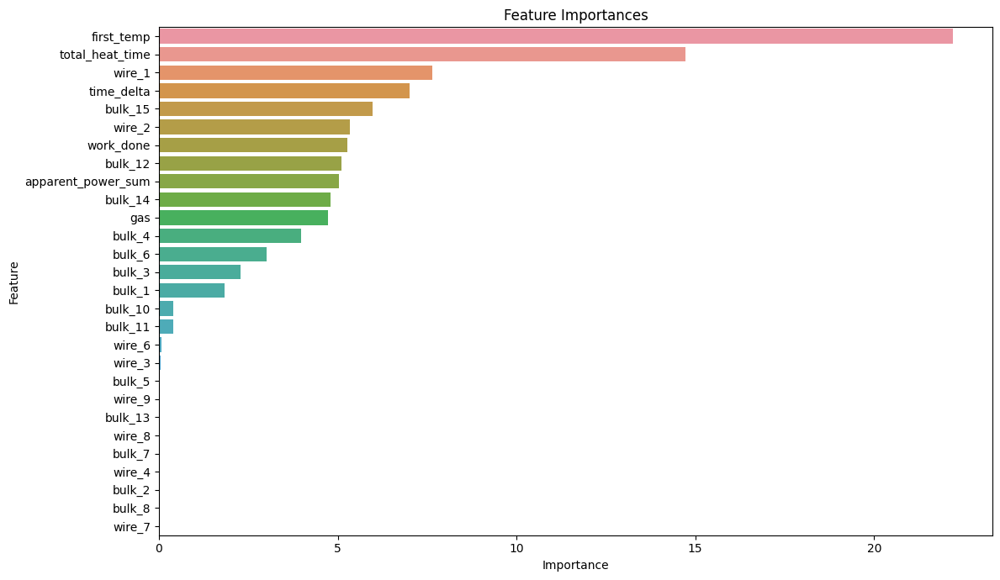

[I 2023-08-21 20:42:37,637] Trial 22 finished with value: 6.266452838523832 and parameters: {'depth': 6, 'iterations': 925, 'learning_rate': 0.31, 'l2_leaf_reg': 24, 'random_strength': 32, 'bootstrap_type': 'Bayesian', 'border_count': 67, 'bagging_temperature': 7.717686020103025}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1373296	test: 7.6548047	best: 7.6548047 (0)	total: 14.8ms	remaining: 14.4s
100:	learn: 7.3188694	test: 6.9980860	best: 6.9980860 (100)	total: 1.43s	remaining: 12.4s
200:	learn: 6.7430050	test: 6.6001746	best: 6.6001746 (200)	total: 2.88s	remaining: 11.1s
300:	learn: 6.3638207	test: 6.3430477	best: 6.3430477 (300)	total: 4.38s	remaining: 9.84s
400:	learn: 6.0780760	test: 6.1717491	best: 6.1717491 (400)	total: 5.88s	remaining: 8.45s
500:	learn: 5.8482517	test: 6.0438488	best: 6.0438488 (500)	total: 7.39s	remaining: 7.02s
600:	learn: 5.6391567	test: 5.9255133	best: 5.9255133 (600)	total: 8.9s	remaining: 5.57s
700:	learn: 5.4570123	test: 5.8491393	best: 5.8491393 (700)	total: 10.4s	remaining: 4.1s
800:	learn: 5.3071464	test: 5.7872458	best: 5.7872458 (800)	total: 11.9s	remaining: 2.62s
900:	learn: 5.1683796	test: 5.7344778	best: 5.7344778 (900)	total: 13.5s	remaining: 1.13s
976:	learn: 5.0673730	test: 5.6899085	best: 5.6899085 (976)	total: 14.6s	remaining: 0us
bestTest = 5.6899

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9868956	test: 8.2637852	best: 8.2637852 (0)	total: 14.4ms	remaining: 14s
100:	learn: 7.2273751	test: 7.5970183	best: 7.5970183 (100)	total: 1.44s	remaining: 12.5s
200:	learn: 6.7203767	test: 7.1296086	best: 7.1296086 (200)	total: 2.93s	remaining: 11.3s
300:	learn: 6.3465844	test: 6.8245391	best: 6.8245391 (300)	total: 4.45s	remaining: 10s
400:	learn: 6.0370071	test: 6.5803985	best: 6.5803985 (400)	total: 5.96s	remaining: 8.56s
500:	learn: 5.8268353	test: 6.4241527	best: 6.4241527 (500)	total: 7.48s	remaining: 7.11s
600:	learn: 5.6255531	test: 6.3070925	best: 6.3070925 (600)	total: 9.03s	remaining: 5.65s
700:	learn: 5.4396384	test: 6.1855126	best: 6.1855126 (700)	total: 10.6s	remaining: 4.16s
800:	learn: 5.2848312	test: 6.1061081	best: 6.1061081 (800)	total: 12.1s	remaining: 2.66s
900:	learn: 5.1283066	test: 6.0296019	best: 6.0296019 (900)	total: 13.7s	remaining: 1.15s
976:	learn: 5.0168555	test: 5.9827087	best: 5.9827087 (976)	total: 14.8s	remaining: 0us
bestTest = 5.982708

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0052877	test: 8.1716595	best: 8.1716595 (0)	total: 15.1ms	remaining: 14.7s
100:	learn: 7.1863763	test: 7.6392532	best: 7.6392532 (100)	total: 1.49s	remaining: 12.9s
200:	learn: 6.6152134	test: 7.2930303	best: 7.2930303 (200)	total: 2.99s	remaining: 11.6s
300:	learn: 6.2508974	test: 7.1016576	best: 7.1013386 (299)	total: 4.53s	remaining: 10.2s
400:	learn: 5.9500692	test: 6.9421848	best: 6.9421848 (400)	total: 6.06s	remaining: 8.7s
500:	learn: 5.6874009	test: 6.8236857	best: 6.8236857 (500)	total: 7.59s	remaining: 7.21s
600:	learn: 5.4808954	test: 6.7311123	best: 6.7311123 (600)	total: 9.13s	remaining: 5.71s
700:	learn: 5.2941096	test: 6.6540129	best: 6.6540129 (700)	total: 10.7s	remaining: 4.21s
800:	learn: 5.1315407	test: 6.5975912	best: 6.5975429 (799)	total: 12.2s	remaining: 2.69s
900:	learn: 4.9930208	test: 6.5354808	best: 6.5354808 (900)	total: 13.8s	remaining: 1.16s
976:	learn: 4.8876400	test: 6.4892340	best: 6.4892340 (976)	total: 14.9s	remaining: 0us
bestTest = 6.489

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0919453	test: 7.8178564	best: 7.8178564 (0)	total: 16ms	remaining: 15.6s
100:	learn: 7.2860236	test: 7.2373180	best: 7.2373180 (100)	total: 1.45s	remaining: 12.6s
200:	learn: 6.6791793	test: 6.8040119	best: 6.8040119 (200)	total: 2.93s	remaining: 11.3s
300:	learn: 6.2944955	test: 6.5425275	best: 6.5425275 (300)	total: 4.45s	remaining: 9.99s
400:	learn: 6.0074667	test: 6.3772941	best: 6.3772941 (400)	total: 5.96s	remaining: 8.55s
500:	learn: 5.7515919	test: 6.2334819	best: 6.2334819 (500)	total: 7.49s	remaining: 7.12s
600:	learn: 5.5254249	test: 6.1298744	best: 6.1298744 (600)	total: 9.02s	remaining: 5.64s
700:	learn: 5.3565804	test: 6.0485798	best: 6.0485798 (700)	total: 10.5s	remaining: 4.15s
800:	learn: 5.1867482	test: 5.9933661	best: 5.9933661 (800)	total: 12s	remaining: 2.64s
900:	learn: 5.0378010	test: 5.9344328	best: 5.9344328 (900)	total: 13.6s	remaining: 1.14s
976:	learn: 4.9323876	test: 5.8977044	best: 5.8977044 (976)	total: 14.8s	remaining: 0us
bestTest = 5.897704

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9719436	test: 8.3018588	best: 8.3018588 (0)	total: 16.9ms	remaining: 16.5s
100:	learn: 7.1382756	test: 7.6360958	best: 7.6360958 (100)	total: 1.6s	remaining: 13.9s
200:	learn: 6.5969464	test: 7.2365295	best: 7.2365295 (200)	total: 3.29s	remaining: 12.7s
300:	learn: 6.1704679	test: 6.9665836	best: 6.9665836 (300)	total: 5.01s	remaining: 11.3s
400:	learn: 5.8547239	test: 6.8177834	best: 6.8177834 (400)	total: 6.71s	remaining: 9.64s
500:	learn: 5.6021414	test: 6.7184469	best: 6.7184469 (500)	total: 8.34s	remaining: 7.92s
600:	learn: 5.3679533	test: 6.6333878	best: 6.6331633 (599)	total: 10s	remaining: 6.28s
700:	learn: 5.1776266	test: 6.5755727	best: 6.5754472 (699)	total: 11.6s	remaining: 4.55s
800:	learn: 5.0146152	test: 6.5375963	best: 6.5374265 (799)	total: 13.2s	remaining: 2.9s
900:	learn: 4.8763021	test: 6.4981269	best: 6.4981269 (900)	total: 14.8s	remaining: 1.25s
976:	learn: 4.7761435	test: 6.4684960	best: 6.4684960 (976)	total: 16.1s	remaining: 0us
bestTest = 6.468496

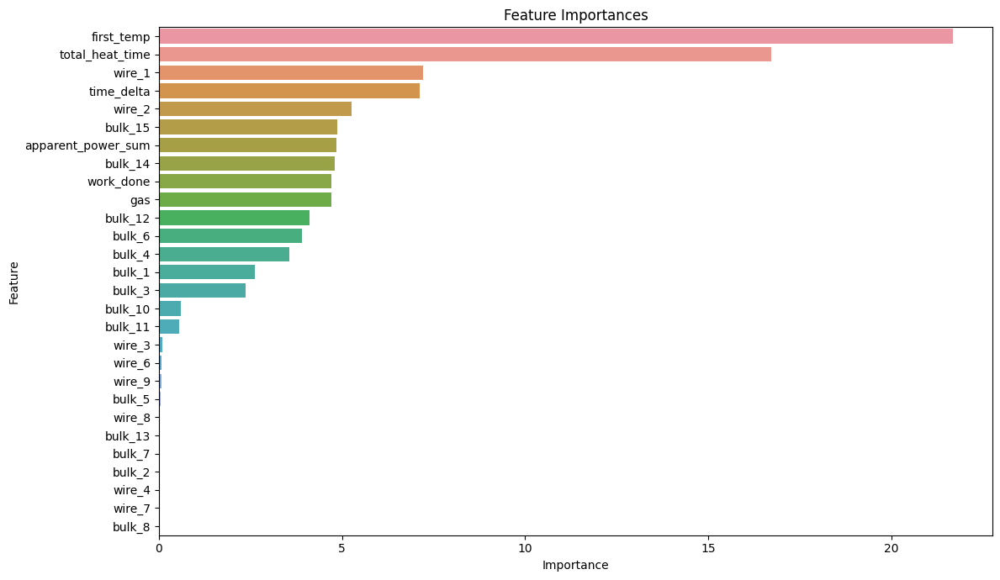

[I 2023-08-21 20:43:55,736] Trial 23 finished with value: 6.105549456646024 and parameters: {'depth': 7, 'iterations': 977, 'learning_rate': 0.255, 'l2_leaf_reg': 12, 'random_strength': 50, 'bootstrap_type': 'Bayesian', 'border_count': 37, 'bagging_temperature': 5.781181343157293}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1385002	test: 7.6535470	best: 7.6535470 (0)	total: 11.8ms	remaining: 10.2s
100:	learn: 7.3829708	test: 6.9882141	best: 6.9882141 (100)	total: 1.19s	remaining: 9.04s
200:	learn: 6.8739436	test: 6.6434749	best: 6.6434749 (200)	total: 2.37s	remaining: 7.86s
300:	learn: 6.5753144	test: 6.4472712	best: 6.4472712 (300)	total: 3.58s	remaining: 6.72s
400:	learn: 6.3690993	test: 6.3267609	best: 6.3267609 (400)	total: 4.76s	remaining: 5.54s
500:	learn: 6.2147835	test: 6.2498517	best: 6.2498517 (500)	total: 5.95s	remaining: 4.35s
600:	learn: 6.0848559	test: 6.1911754	best: 6.1911754 (600)	total: 7.12s	remaining: 3.15s
700:	learn: 5.9699774	test: 6.1494022	best: 6.1492832 (699)	total: 8.29s	remaining: 1.96s
800:	learn: 5.8764151	test: 6.1172337	best: 6.1172337 (800)	total: 9.52s	remaining: 784ms
866:	learn: 5.8111024	test: 6.0973394	best: 6.0973394 (866)	total: 10.3s	remaining: 0us
bestTest = 6.097339357
bestIteration = 866
Split 1, MAE : 6.097298347091811

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9838860	test: 8.2603448	best: 8.2603448 (0)	total: 12.2ms	remaining: 10.5s
100:	learn: 7.2622603	test: 7.5742726	best: 7.5742726 (100)	total: 1.16s	remaining: 8.79s
200:	learn: 6.8669542	test: 7.1571482	best: 7.1571482 (200)	total: 2.3s	remaining: 7.62s
300:	learn: 6.6247786	test: 6.9548851	best: 6.9548851 (300)	total: 3.48s	remaining: 6.54s
400:	learn: 6.4103846	test: 6.7464708	best: 6.7464708 (400)	total: 4.68s	remaining: 5.44s
500:	learn: 6.2480777	test: 6.5964726	best: 6.5964726 (500)	total: 5.92s	remaining: 4.32s
600:	learn: 6.0984941	test: 6.4640309	best: 6.4640309 (600)	total: 7.13s	remaining: 3.16s
700:	learn: 5.9714009	test: 6.3633883	best: 6.3633680 (698)	total: 8.33s	remaining: 1.97s
800:	learn: 5.8642701	test: 6.2995682	best: 6.2995682 (800)	total: 9.55s	remaining: 787ms
866:	learn: 5.8093069	test: 6.2725498	best: 6.2725498 (866)	total: 10.4s	remaining: 0us
bestTest = 6.27254978
bestIteration = 866
Split 2, MAE : 6.272470421227577

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0084591	test: 8.1696253	best: 8.1696253 (0)	total: 13ms	remaining: 11.3s
100:	learn: 7.3091514	test: 7.6806627	best: 7.6806627 (100)	total: 1.14s	remaining: 8.65s
200:	learn: 6.8375488	test: 7.3993707	best: 7.3993707 (200)	total: 2.31s	remaining: 7.64s
300:	learn: 6.5169567	test: 7.2362722	best: 7.2354873 (299)	total: 3.5s	remaining: 6.58s
400:	learn: 6.2776604	test: 7.1092253	best: 7.1090371 (399)	total: 4.72s	remaining: 5.49s
500:	learn: 6.1188576	test: 7.0237747	best: 7.0237747 (500)	total: 5.92s	remaining: 4.32s
600:	learn: 5.9894308	test: 6.9701099	best: 6.9700134 (597)	total: 7.1s	remaining: 3.14s
700:	learn: 5.8779563	test: 6.9187977	best: 6.9187977 (700)	total: 8.32s	remaining: 1.97s
800:	learn: 5.7947555	test: 6.8824382	best: 6.8824382 (800)	total: 9.51s	remaining: 783ms
866:	learn: 5.7328888	test: 6.8492582	best: 6.8492582 (866)	total: 10.3s	remaining: 0us
bestTest = 6.849258204
bestIteration = 866
Split 3, MAE : 6.849195505860815

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0914637	test: 7.8147141	best: 7.8147141 (0)	total: 12.6ms	remaining: 10.9s
100:	learn: 7.3495898	test: 7.1791880	best: 7.1791880 (100)	total: 1.14s	remaining: 8.67s
200:	learn: 6.9016612	test: 6.7979336	best: 6.7979336 (200)	total: 2.29s	remaining: 7.6s
300:	learn: 6.6034302	test: 6.5794804	best: 6.5794804 (300)	total: 3.5s	remaining: 6.57s
400:	learn: 6.4118896	test: 6.4412028	best: 6.4407896 (399)	total: 4.7s	remaining: 5.46s
500:	learn: 6.2350498	test: 6.3231762	best: 6.3231762 (500)	total: 5.88s	remaining: 4.3s
600:	learn: 6.0772464	test: 6.2461113	best: 6.2461113 (600)	total: 7.1s	remaining: 3.14s
700:	learn: 5.9524572	test: 6.2007559	best: 6.2007559 (700)	total: 8.3s	remaining: 1.97s
800:	learn: 5.8392599	test: 6.1683728	best: 6.1668757 (798)	total: 9.53s	remaining: 786ms
866:	learn: 5.7720259	test: 6.1425402	best: 6.1424154 (864)	total: 10.3s	remaining: 0us
bestTest = 6.142415365
bestIteration = 864
Shrink model to first 865 iterations.
Split 4, MAE : 6.1423274957689

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9733122	test: 8.3021121	best: 8.3021121 (0)	total: 13.3ms	remaining: 11.5s
100:	learn: 7.2464382	test: 7.6714590	best: 7.6714590 (100)	total: 1.29s	remaining: 9.76s
200:	learn: 6.7977956	test: 7.3044805	best: 7.3044805 (200)	total: 2.58s	remaining: 8.56s
300:	learn: 6.5012951	test: 7.1191364	best: 7.1191364 (300)	total: 3.92s	remaining: 7.38s
400:	learn: 6.2866935	test: 7.0091125	best: 7.0091125 (400)	total: 5.25s	remaining: 6.11s
500:	learn: 6.1160639	test: 6.9196223	best: 6.9196223 (500)	total: 6.63s	remaining: 4.84s
600:	learn: 5.9619183	test: 6.8485465	best: 6.8485465 (600)	total: 7.98s	remaining: 3.53s
700:	learn: 5.8431777	test: 6.8025541	best: 6.8014519 (697)	total: 9.28s	remaining: 2.2s
800:	learn: 5.7357243	test: 6.7641630	best: 6.7637406 (799)	total: 10.6s	remaining: 873ms
866:	learn: 5.6763759	test: 6.7442213	best: 6.7438053 (865)	total: 11.5s	remaining: 0us
bestTest = 6.743805282
bestIteration = 865
Shrink model to first 866 iterations.
Split 5, MAE : 6.74375536

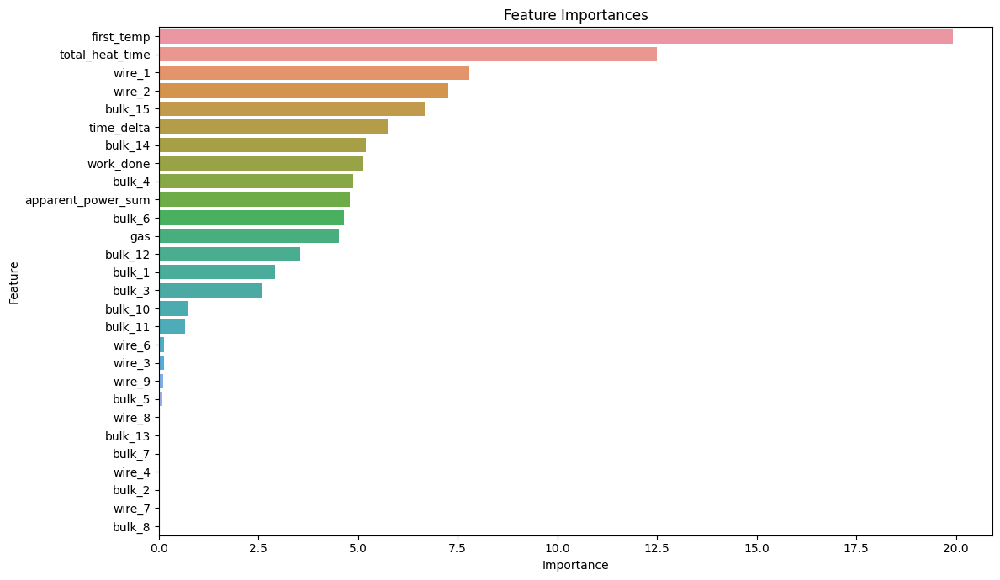

[I 2023-08-21 20:44:51,488] Trial 24 finished with value: 6.421009426256736 and parameters: {'depth': 6, 'iterations': 867, 'learning_rate': 0.45499999999999996, 'l2_leaf_reg': 61, 'random_strength': 69, 'bootstrap_type': 'Bayesian', 'border_count': 5, 'bagging_temperature': 6.539726625576666}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1424072	test: 7.6585732	best: 7.6585732 (0)	total: 15.6ms	remaining: 10.6s
100:	learn: 7.8065341	test: 7.3683466	best: 7.3683466 (100)	total: 1.49s	remaining: 8.6s
200:	learn: 7.5761621	test: 7.1760981	best: 7.1760981 (200)	total: 2.99s	remaining: 7.21s
300:	learn: 7.3891020	test: 7.0231899	best: 7.0231899 (300)	total: 4.46s	remaining: 5.68s
400:	learn: 7.2440678	test: 6.9200002	best: 6.9200002 (400)	total: 5.95s	remaining: 4.21s
500:	learn: 7.1256865	test: 6.8419221	best: 6.8419221 (500)	total: 7.46s	remaining: 2.74s
600:	learn: 7.0153924	test: 6.7680664	best: 6.7680664 (600)	total: 8.89s	remaining: 1.24s
684:	learn: 6.9139644	test: 6.6977511	best: 6.6977511 (684)	total: 10.1s	remaining: 0us
bestTest = 6.697751108
bestIteration = 684
Split 1, MAE : 6.697823254450822

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9911724	test: 8.2656383	best: 8.2656383 (0)	total: 16.4ms	remaining: 11.2s
100:	learn: 7.7197896	test: 8.0096922	best: 8.0096922 (100)	total: 1.47s	remaining: 8.51s
200:	learn: 7.4739186	test: 7.7853577	best: 7.7853577 (200)	total: 2.93s	remaining: 7.06s
300:	learn: 7.2828963	test: 7.6044054	best: 7.6044054 (300)	total: 4.34s	remaining: 5.54s
400:	learn: 7.1379629	test: 7.4746646	best: 7.4746646 (400)	total: 5.77s	remaining: 4.09s
500:	learn: 7.0223790	test: 7.3596975	best: 7.3596884 (499)	total: 7.2s	remaining: 2.64s
600:	learn: 6.9126488	test: 7.2607002	best: 7.2607002 (600)	total: 8.61s	remaining: 1.2s
684:	learn: 6.8344362	test: 7.1874678	best: 7.1874678 (684)	total: 9.77s	remaining: 0us
bestTest = 7.187467821
bestIteration = 684
Split 2, MAE : 7.187499442882635

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0132165	test: 8.1757729	best: 8.1757729 (0)	total: 13.7ms	remaining: 9.36s
100:	learn: 7.7475047	test: 7.9928017	best: 7.9928017 (100)	total: 1.41s	remaining: 8.16s
200:	learn: 7.5100367	test: 7.8119530	best: 7.8119530 (200)	total: 2.85s	remaining: 6.86s
300:	learn: 7.2989248	test: 7.6670593	best: 7.6670593 (300)	total: 4.32s	remaining: 5.5s
400:	learn: 7.1496544	test: 7.5755885	best: 7.5755885 (400)	total: 5.72s	remaining: 4.05s
500:	learn: 6.9908291	test: 7.4718140	best: 7.4718140 (500)	total: 7.15s	remaining: 2.63s
600:	learn: 6.8687637	test: 7.4042857	best: 7.4042857 (600)	total: 8.57s	remaining: 1.2s
684:	learn: 6.7672124	test: 7.3506517	best: 7.3506517 (684)	total: 9.83s	remaining: 0us
bestTest = 7.350651695
bestIteration = 684
Split 3, MAE : 7.350758289857719

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1008226	test: 7.8245548	best: 7.8245548 (0)	total: 16.2ms	remaining: 11.1s
100:	learn: 7.8056361	test: 7.5717016	best: 7.5717016 (100)	total: 1.46s	remaining: 8.44s
200:	learn: 7.5473342	test: 7.3752624	best: 7.3752624 (200)	total: 2.91s	remaining: 7.01s
300:	learn: 7.3486713	test: 7.2243947	best: 7.2243947 (300)	total: 4.44s	remaining: 5.67s
400:	learn: 7.1957605	test: 7.1084974	best: 7.1084974 (400)	total: 5.99s	remaining: 4.24s
500:	learn: 7.0671231	test: 7.0142373	best: 7.0142373 (500)	total: 7.53s	remaining: 2.77s
600:	learn: 6.9561100	test: 6.9438743	best: 6.9438743 (600)	total: 9.09s	remaining: 1.27s
684:	learn: 6.8849014	test: 6.8994288	best: 6.8994288 (684)	total: 10.3s	remaining: 0us
bestTest = 6.899428795
bestIteration = 684
Split 4, MAE : 6.899547834246011

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9791170	test: 8.3063775	best: 8.3063775 (0)	total: 17.3ms	remaining: 11.9s
100:	learn: 7.6641129	test: 8.0445718	best: 8.0445718 (100)	total: 1.59s	remaining: 9.18s
200:	learn: 7.4010662	test: 7.8209923	best: 7.8209923 (200)	total: 3.22s	remaining: 7.75s
300:	learn: 7.2194710	test: 7.6640541	best: 7.6640541 (300)	total: 4.9s	remaining: 6.25s
400:	learn: 7.0626904	test: 7.5238977	best: 7.5238977 (400)	total: 6.58s	remaining: 4.66s
500:	learn: 6.9433111	test: 7.4273962	best: 7.4273962 (500)	total: 8.24s	remaining: 3.03s
600:	learn: 6.8338248	test: 7.3480800	best: 7.3480800 (600)	total: 9.91s	remaining: 1.39s
684:	learn: 6.7474721	test: 7.2924033	best: 7.2924033 (684)	total: 11.3s	remaining: 0us
bestTest = 7.292403298
bestIteration = 684
Split 5, MAE : 7.292545620917799
Average MAE: 7.085634888470997


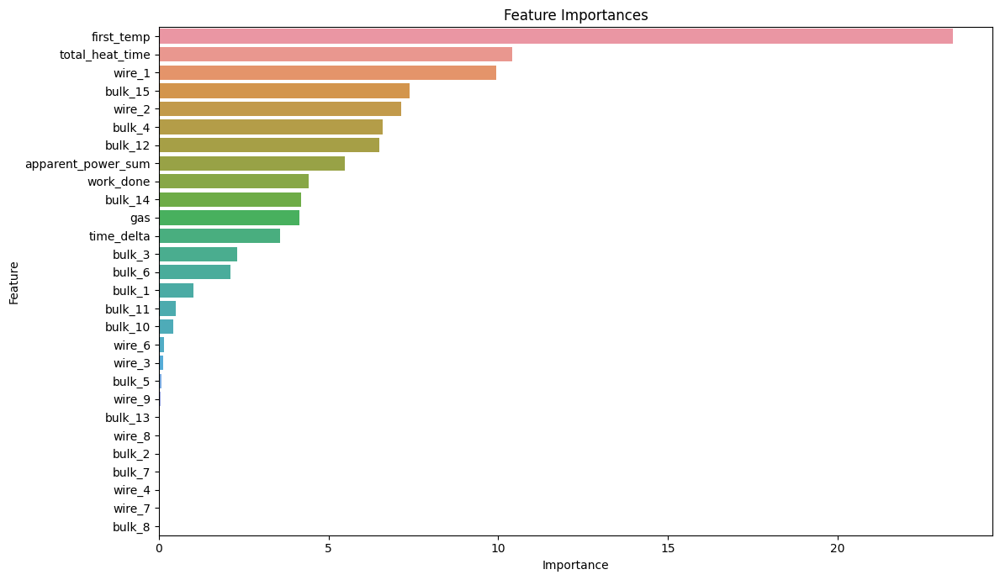

[I 2023-08-21 20:45:45,597] Trial 25 finished with value: 7.085634888470997 and parameters: {'depth': 7, 'iterations': 685, 'learning_rate': 0.20500000000000002, 'l2_leaf_reg': 34, 'random_strength': 19, 'bootstrap_type': 'Bayesian', 'border_count': 94, 'bagging_temperature': 25.840636315613605}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1309035	test: 7.6462927	best: 7.6462927 (0)	total: 12.1ms	remaining: 10.1s
100:	learn: 6.9290318	test: 6.6094939	best: 6.6094939 (100)	total: 1.16s	remaining: 8.41s
200:	learn: 6.3244906	test: 6.1166440	best: 6.1166440 (200)	total: 2.34s	remaining: 7.38s
300:	learn: 5.9842013	test: 5.8365192	best: 5.8365192 (300)	total: 3.49s	remaining: 6.18s
400:	learn: 5.7521724	test: 5.6739051	best: 5.6739051 (400)	total: 4.67s	remaining: 5.04s
500:	learn: 5.5732061	test: 5.5551604	best: 5.5551604 (500)	total: 5.85s	remaining: 3.89s
600:	learn: 5.4461626	test: 5.4745076	best: 5.4742963 (599)	total: 7.05s	remaining: 2.73s
700:	learn: 5.3033221	test: 5.3930195	best: 5.3927257 (699)	total: 8.22s	remaining: 1.56s
800:	learn: 5.1877147	test: 5.3336129	best: 5.3336129 (800)	total: 9.43s	remaining: 388ms
833:	learn: 5.1573660	test: 5.3214577	best: 5.3214577 (833)	total: 9.84s	remaining: 0us
bestTest = 5.321457652
bestIteration = 833
Split 1, MAE : 5.3214034648470125

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9801829	test: 8.2520944	best: 8.2520944 (0)	total: 12.5ms	remaining: 10.4s
100:	learn: 6.8442432	test: 7.1691790	best: 7.1691790 (100)	total: 1.09s	remaining: 7.92s
200:	learn: 6.2635444	test: 6.6204977	best: 6.6204977 (200)	total: 2.08s	remaining: 6.57s
300:	learn: 5.8991093	test: 6.2841839	best: 6.2841839 (300)	total: 3.21s	remaining: 5.69s
400:	learn: 5.6650762	test: 6.0993072	best: 6.0993072 (400)	total: 4.39s	remaining: 4.74s
500:	learn: 5.4544490	test: 5.9651376	best: 5.9651376 (500)	total: 5.56s	remaining: 3.69s
600:	learn: 5.2747601	test: 5.8453810	best: 5.8453810 (600)	total: 6.79s	remaining: 2.63s
700:	learn: 5.1436233	test: 5.7550668	best: 5.7542179 (698)	total: 7.99s	remaining: 1.52s
800:	learn: 5.0577125	test: 5.7245338	best: 5.7245338 (800)	total: 9.27s	remaining: 382ms
833:	learn: 5.0330168	test: 5.7115164	best: 5.7115164 (833)	total: 9.69s	remaining: 0us
bestTest = 5.711516372
bestIteration = 833
Split 2, MAE : 5.711400170260759

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0017850	test: 8.1654917	best: 8.1654917 (0)	total: 11.9ms	remaining: 9.89s
100:	learn: 6.7668594	test: 7.2246353	best: 7.2246353 (100)	total: 1.17s	remaining: 8.49s
200:	learn: 6.1016227	test: 6.7276062	best: 6.7276062 (200)	total: 2.31s	remaining: 7.26s
300:	learn: 5.7091161	test: 6.4593957	best: 6.4593957 (300)	total: 3.47s	remaining: 6.14s
400:	learn: 5.4682074	test: 6.3116116	best: 6.3116116 (400)	total: 4.64s	remaining: 5.02s
500:	learn: 5.2970046	test: 6.2066381	best: 6.2064198 (499)	total: 5.85s	remaining: 3.88s
600:	learn: 5.1707688	test: 6.1438401	best: 6.1438401 (600)	total: 7.07s	remaining: 2.74s
700:	learn: 5.0677685	test: 6.0936577	best: 6.0935653 (699)	total: 8.27s	remaining: 1.57s
800:	learn: 4.9655348	test: 6.0460411	best: 6.0459670 (799)	total: 9.49s	remaining: 391ms
833:	learn: 4.9352239	test: 6.0290576	best: 6.0290576 (833)	total: 9.9s	remaining: 0us
bestTest = 6.029057631
bestIteration = 833
Split 3, MAE : 6.02901870784694

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0889218	test: 7.8157285	best: 7.8157285 (0)	total: 12.5ms	remaining: 10.4s
100:	learn: 6.8733752	test: 6.8264876	best: 6.8264876 (100)	total: 1.17s	remaining: 8.52s
200:	learn: 6.2924899	test: 6.3882916	best: 6.3882916 (200)	total: 2.33s	remaining: 7.34s
300:	learn: 5.8823316	test: 6.1002625	best: 6.1002625 (300)	total: 3.52s	remaining: 6.23s
400:	learn: 5.5932131	test: 5.9491430	best: 5.9491430 (400)	total: 4.72s	remaining: 5.1s
500:	learn: 5.3958295	test: 5.8836803	best: 5.8834193 (499)	total: 5.94s	remaining: 3.95s
600:	learn: 5.2397772	test: 5.8281310	best: 5.8281215 (599)	total: 7.15s	remaining: 2.77s
700:	learn: 5.1140418	test: 5.8136228	best: 5.8115298 (685)	total: 8.35s	remaining: 1.58s
800:	learn: 5.0178000	test: 5.7969238	best: 5.7969238 (800)	total: 9.57s	remaining: 395ms
833:	learn: 4.9878290	test: 5.7955168	best: 5.7943617 (828)	total: 9.97s	remaining: 0us
bestTest = 5.794361685
bestIteration = 828
Shrink model to first 829 iterations.
Split 4, MAE : 5.79429368

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9695270	test: 8.3009833	best: 8.3009833 (0)	total: 13.5ms	remaining: 11.2s
100:	learn: 6.7585216	test: 7.3244699	best: 7.3244699 (100)	total: 1.27s	remaining: 9.2s
200:	learn: 6.1551355	test: 6.8768900	best: 6.8768900 (200)	total: 2.54s	remaining: 7.99s
300:	learn: 5.7214854	test: 6.5787788	best: 6.5787788 (300)	total: 3.81s	remaining: 6.75s
400:	learn: 5.4434924	test: 6.4142505	best: 6.4142505 (400)	total: 5.13s	remaining: 5.54s
500:	learn: 5.2418620	test: 6.3438679	best: 6.3430990 (499)	total: 6.42s	remaining: 4.26s
600:	learn: 5.1218106	test: 6.3165185	best: 6.3165185 (600)	total: 7.72s	remaining: 2.99s
700:	learn: 5.0113456	test: 6.2933027	best: 6.2931245 (699)	total: 9.05s	remaining: 1.72s
800:	learn: 4.9263199	test: 6.2857694	best: 6.2852573 (763)	total: 10.4s	remaining: 430ms
833:	learn: 4.8981148	test: 6.2867277	best: 6.2838317 (812)	total: 10.8s	remaining: 0us
bestTest = 6.283831717
bestIteration = 812
Shrink model to first 813 iterations.
Split 5, MAE : 6.28380492

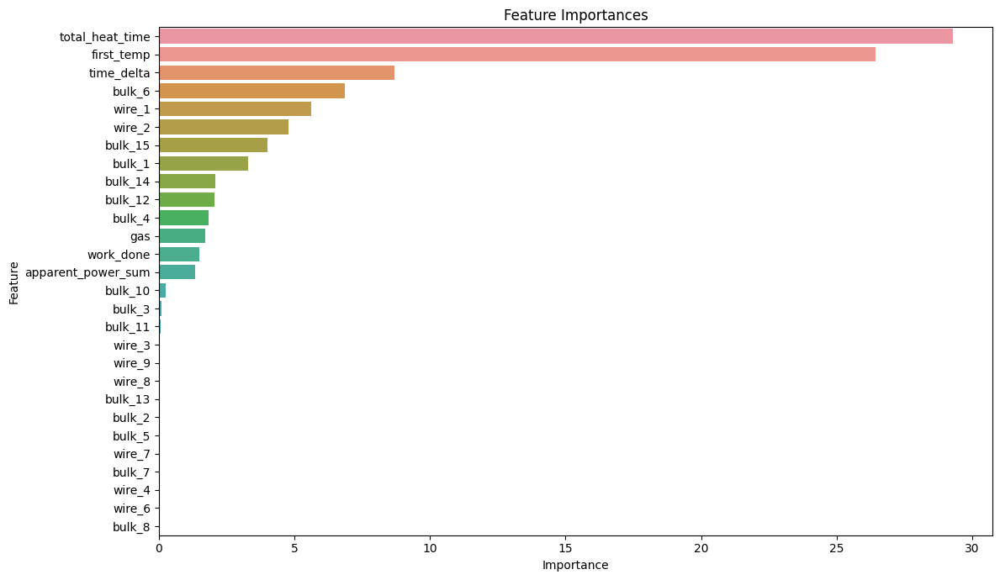

[I 2023-08-21 20:46:38,867] Trial 26 finished with value: 5.827984190042644 and parameters: {'depth': 5, 'iterations': 834, 'learning_rate': 0.37, 'l2_leaf_reg': 49, 'random_strength': 4, 'bootstrap_type': 'Bayesian', 'border_count': 68, 'bagging_temperature': 0.5682878132517413}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1410691	test: 7.6549663	best: 7.6549663 (0)	total: 11.2ms	remaining: 10.6s
100:	learn: 7.4996763	test: 7.0764818	best: 7.0764818 (100)	total: 1.05s	remaining: 8.76s
200:	learn: 7.0710144	test: 6.7191914	best: 6.7191914 (200)	total: 2.09s	remaining: 7.7s
300:	learn: 6.7914500	test: 6.4848122	best: 6.4848122 (300)	total: 3.16s	remaining: 6.73s
400:	learn: 6.5827080	test: 6.3059614	best: 6.3059614 (400)	total: 4.23s	remaining: 5.72s
500:	learn: 6.4189824	test: 6.1828284	best: 6.1828284 (500)	total: 5.31s	remaining: 4.69s
600:	learn: 6.2811596	test: 6.0819767	best: 6.0819767 (600)	total: 6.39s	remaining: 3.64s
700:	learn: 6.1770843	test: 6.0099027	best: 6.0099027 (700)	total: 7.51s	remaining: 2.59s
800:	learn: 6.0879873	test: 5.9439820	best: 5.9439820 (800)	total: 8.65s	remaining: 1.53s
900:	learn: 5.9997506	test: 5.8933252	best: 5.8933252 (900)	total: 9.74s	remaining: 454ms
942:	learn: 5.9649117	test: 5.8714610	best: 5.8714610 (942)	total: 10.2s	remaining: 0us
bestTest = 5.871

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9882413	test: 8.2623050	best: 8.2623050 (0)	total: 11ms	remaining: 10.4s
100:	learn: 7.4113892	test: 7.6744325	best: 7.6744325 (100)	total: 1.05s	remaining: 8.76s
200:	learn: 7.0301375	test: 7.2823889	best: 7.2823889 (200)	total: 2.1s	remaining: 7.74s
300:	learn: 6.7786916	test: 6.9946065	best: 6.9946065 (300)	total: 3.21s	remaining: 6.85s
400:	learn: 6.5912343	test: 6.7953682	best: 6.7953682 (400)	total: 4.29s	remaining: 5.8s
500:	learn: 6.4385704	test: 6.6371679	best: 6.6371077 (499)	total: 5.37s	remaining: 4.74s
600:	learn: 6.2913820	test: 6.4888220	best: 6.4888220 (600)	total: 6.47s	remaining: 3.68s
700:	learn: 6.1604617	test: 6.3542054	best: 6.3542054 (700)	total: 7.6s	remaining: 2.62s
800:	learn: 6.0565040	test: 6.2550234	best: 6.2550234 (800)	total: 8.69s	remaining: 1.54s
900:	learn: 5.9563608	test: 6.1661947	best: 6.1661947 (900)	total: 9.78s	remaining: 456ms
942:	learn: 5.9204970	test: 6.1396219	best: 6.1396219 (942)	total: 10.2s	remaining: 0us
bestTest = 6.1396218

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0060051	test: 8.1707837	best: 8.1707837 (0)	total: 11.3ms	remaining: 10.6s
100:	learn: 7.4047796	test: 7.7118525	best: 7.7118525 (100)	total: 1.05s	remaining: 8.73s
200:	learn: 7.0099737	test: 7.4365752	best: 7.4365752 (200)	total: 2.1s	remaining: 7.75s
300:	learn: 6.7163065	test: 7.2538909	best: 7.2538909 (300)	total: 3.16s	remaining: 6.74s
400:	learn: 6.4904291	test: 7.1087272	best: 7.1081494 (399)	total: 4.22s	remaining: 5.71s
500:	learn: 6.3408553	test: 7.0139881	best: 7.0139881 (500)	total: 5.29s	remaining: 4.66s
600:	learn: 6.1984215	test: 6.9205417	best: 6.9205417 (600)	total: 6.39s	remaining: 3.64s
700:	learn: 6.0868762	test: 6.8563810	best: 6.8563810 (700)	total: 7.51s	remaining: 2.59s
800:	learn: 5.9999005	test: 6.8066462	best: 6.8066462 (800)	total: 8.6s	remaining: 1.52s
900:	learn: 5.9106599	test: 6.7536628	best: 6.7536628 (900)	total: 9.72s	remaining: 453ms
942:	learn: 5.8784607	test: 6.7379273	best: 6.7379273 (942)	total: 10.2s	remaining: 0us
bestTest = 6.7379

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0921812	test: 7.8209495	best: 7.8209495 (0)	total: 11.3ms	remaining: 10.6s
100:	learn: 7.4816084	test: 7.3049892	best: 7.3049892 (100)	total: 1.05s	remaining: 8.8s
200:	learn: 7.0371612	test: 6.9631165	best: 6.9631165 (200)	total: 2.09s	remaining: 7.71s
300:	learn: 6.7484921	test: 6.7198963	best: 6.7198963 (300)	total: 3.16s	remaining: 6.73s
400:	learn: 6.5286220	test: 6.5443522	best: 6.5443522 (400)	total: 4.22s	remaining: 5.7s
500:	learn: 6.3608689	test: 6.4190484	best: 6.4190484 (500)	total: 5.32s	remaining: 4.69s
600:	learn: 6.2177272	test: 6.3212273	best: 6.3212273 (600)	total: 6.43s	remaining: 3.66s
700:	learn: 6.1142522	test: 6.2637982	best: 6.2637982 (700)	total: 7.53s	remaining: 2.6s
800:	learn: 6.0218855	test: 6.2065135	best: 6.2065135 (800)	total: 8.64s	remaining: 1.53s
900:	learn: 5.9361062	test: 6.1572588	best: 6.1572588 (900)	total: 9.76s	remaining: 455ms
942:	learn: 5.9058755	test: 6.1324224	best: 6.1322891 (939)	total: 10.2s	remaining: 0us
bestTest = 6.13228

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9747151	test: 8.3019949	best: 8.3019949 (0)	total: 12.7ms	remaining: 11.9s
100:	learn: 7.3635886	test: 7.7627795	best: 7.7627795 (100)	total: 1.13s	remaining: 9.45s
200:	learn: 6.9423450	test: 7.3847235	best: 7.3847235 (200)	total: 2.28s	remaining: 8.4s
300:	learn: 6.6565839	test: 7.1482705	best: 7.1482705 (300)	total: 3.42s	remaining: 7.3s
400:	learn: 6.4503416	test: 7.0089532	best: 7.0089532 (400)	total: 4.6s	remaining: 6.22s
500:	learn: 6.2721060	test: 6.8987546	best: 6.8987546 (500)	total: 5.81s	remaining: 5.12s
600:	learn: 6.1302251	test: 6.8000713	best: 6.8000713 (600)	total: 6.97s	remaining: 3.97s
700:	learn: 5.9920895	test: 6.7324780	best: 6.7321890 (699)	total: 8.17s	remaining: 2.82s
800:	learn: 5.8778506	test: 6.6775688	best: 6.6775688 (800)	total: 9.36s	remaining: 1.66s
900:	learn: 5.7772503	test: 6.6356734	best: 6.6356734 (900)	total: 10.6s	remaining: 494ms
942:	learn: 5.7414483	test: 6.6176772	best: 6.6176772 (942)	total: 11.1s	remaining: 0us
bestTest = 6.61767

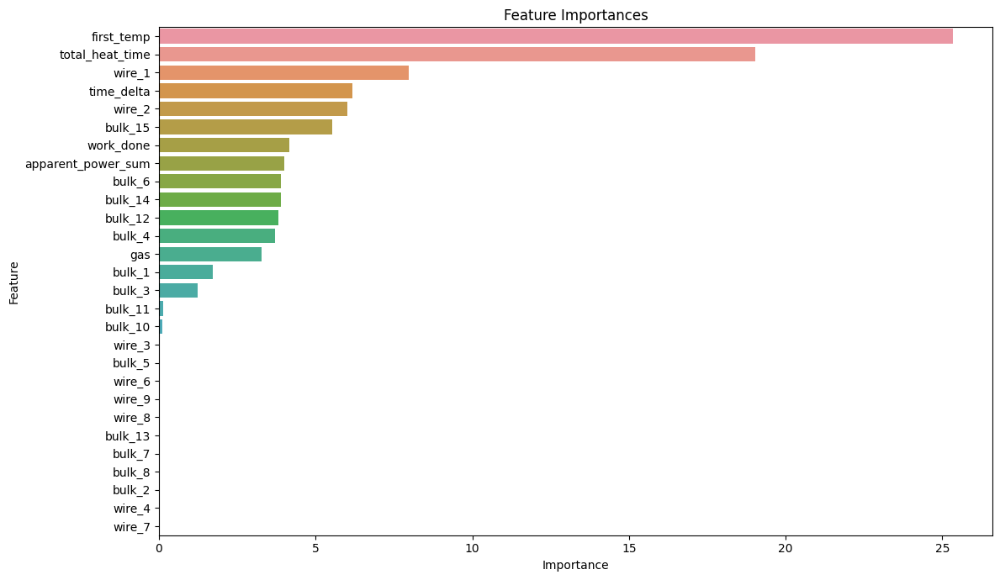

[I 2023-08-21 20:47:34,155] Trial 27 finished with value: 6.299756916978707 and parameters: {'depth': 4, 'iterations': 943, 'learning_rate': 0.33, 'l2_leaf_reg': 71, 'random_strength': 36, 'bootstrap_type': 'Bayesian', 'border_count': 125, 'bagging_temperature': 5.699229798732565}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1380190	test: 7.6556043	best: 7.6556043 (0)	total: 7.04ms	remaining: 1.56s
100:	learn: 7.2841271	test: 6.9668710	best: 6.9668710 (100)	total: 560ms	remaining: 677ms
200:	learn: 6.7483376	test: 6.6455148	best: 6.6455148 (200)	total: 1.11s	remaining: 122ms
222:	learn: 6.6435000	test: 6.5850785	best: 6.5850785 (222)	total: 1.23s	remaining: 0us
bestTest = 6.585078461
bestIteration = 222
Split 1, MAE : 6.585059138135164

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9836604	test: 8.2582189	best: 8.2582189 (0)	total: 7.13ms	remaining: 1.58s
100:	learn: 7.1705454	test: 7.5338817	best: 7.5338817 (100)	total: 559ms	remaining: 675ms
200:	learn: 6.6816827	test: 7.1364075	best: 7.1364075 (200)	total: 1.1s	remaining: 121ms
222:	learn: 6.5937108	test: 7.0760180	best: 7.0760180 (222)	total: 1.22s	remaining: 0us
bestTest = 7.076017975
bestIteration = 222
Split 2, MAE : 7.076020035315735

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0085299	test: 8.1722388	best: 8.1722388 (0)	total: 6.8ms	remaining: 1.51s
100:	learn: 7.1538317	test: 7.6141039	best: 7.6141039 (100)	total: 572ms	remaining: 691ms
200:	learn: 6.6017881	test: 7.2948414	best: 7.2948414 (200)	total: 1.13s	remaining: 124ms
222:	learn: 6.5039539	test: 7.2459371	best: 7.2459371 (222)	total: 1.26s	remaining: 0us
bestTest = 7.245937052
bestIteration = 222
Split 3, MAE : 7.245927554560074

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0964788	test: 7.8210169	best: 7.8210169 (0)	total: 6.26ms	remaining: 1.39s
100:	learn: 7.2173989	test: 7.1622735	best: 7.1622735 (100)	total: 551ms	remaining: 665ms
200:	learn: 6.6683790	test: 6.7860079	best: 6.7860079 (200)	total: 985ms	remaining: 108ms
222:	learn: 6.5658322	test: 6.7223967	best: 6.7223967 (222)	total: 1.09s	remaining: 0us
bestTest = 6.722396675
bestIteration = 222
Split 4, MAE : 6.7224512524065165

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9762167	test: 8.3051519	best: 8.3051519 (0)	total: 7.62ms	remaining: 1.69s
100:	learn: 7.1092588	test: 7.6591825	best: 7.6591825 (100)	total: 660ms	remaining: 797ms
200:	learn: 6.5989576	test: 7.3231145	best: 7.3231145 (200)	total: 1.34s	remaining: 147ms
222:	learn: 6.5087226	test: 7.2769523	best: 7.2769523 (222)	total: 1.49s	remaining: 0us
bestTest = 7.276952283
bestIteration = 222
Split 5, MAE : 7.276972995295213
Average MAE: 6.98128619514254


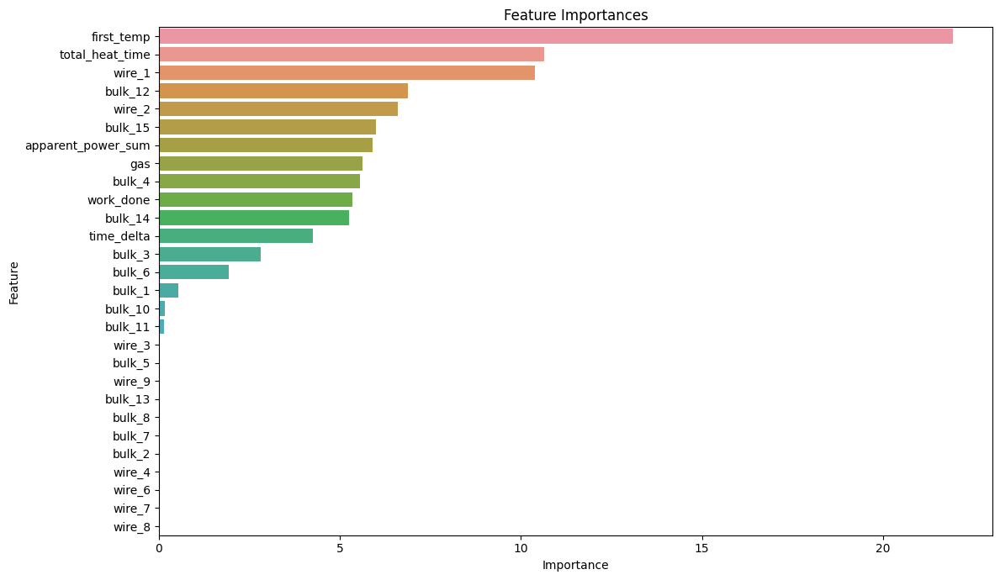

[I 2023-08-21 20:47:42,896] Trial 28 finished with value: 6.98128619514254 and parameters: {'depth': 6, 'iterations': 223, 'learning_rate': 0.28500000000000003, 'l2_leaf_reg': 12, 'random_strength': 24, 'bootstrap_type': 'Bayesian', 'border_count': 42, 'bagging_temperature': 14.175570496542274}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1404043	test: 7.6573553	best: 7.6573553 (0)	total: 15.6ms	remaining: 14.2s
100:	learn: 7.5918165	test: 7.1798967	best: 7.1798967 (100)	total: 1.52s	remaining: 12.2s
200:	learn: 7.1142676	test: 6.7953374	best: 6.7953374 (200)	total: 3.04s	remaining: 10.7s
300:	learn: 6.7794832	test: 6.5661614	best: 6.5661614 (300)	total: 4.64s	remaining: 9.37s
400:	learn: 6.5289438	test: 6.3990797	best: 6.3990797 (400)	total: 6.17s	remaining: 7.82s
500:	learn: 6.3192771	test: 6.2622784	best: 6.2622784 (500)	total: 7.73s	remaining: 6.3s
600:	learn: 6.1548139	test: 6.1581472	best: 6.1581472 (600)	total: 9.31s	remaining: 4.77s
700:	learn: 6.0053368	test: 6.0619928	best: 6.0619928 (700)	total: 10.8s	remaining: 3.22s
800:	learn: 5.8731309	test: 5.9946044	best: 5.9946044 (800)	total: 12.4s	remaining: 1.67s
900:	learn: 5.7513016	test: 5.9219310	best: 5.9219310 (900)	total: 13.9s	remaining: 124ms
908:	learn: 5.7412677	test: 5.9182388	best: 5.9182388 (908)	total: 14.1s	remaining: 0us
bestTest = 5.918

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9893755	test: 8.2638090	best: 8.2638090 (0)	total: 15.9ms	remaining: 14.4s
100:	learn: 7.4571174	test: 7.7572683	best: 7.7572683 (100)	total: 1.51s	remaining: 12.1s
200:	learn: 7.0344711	test: 7.3700794	best: 7.3700794 (200)	total: 3.04s	remaining: 10.7s
300:	learn: 6.7417784	test: 7.1020578	best: 7.1020578 (300)	total: 4.59s	remaining: 9.27s
400:	learn: 6.5129944	test: 6.9028061	best: 6.9028061 (400)	total: 6.13s	remaining: 7.76s
500:	learn: 6.3137834	test: 6.7311697	best: 6.7311697 (500)	total: 7.66s	remaining: 6.24s
600:	learn: 6.1307739	test: 6.5856276	best: 6.5856276 (600)	total: 9.23s	remaining: 4.73s
700:	learn: 5.9621438	test: 6.4464598	best: 6.4464598 (700)	total: 10.8s	remaining: 3.21s
800:	learn: 5.8268553	test: 6.3450218	best: 6.3450218 (800)	total: 12.3s	remaining: 1.66s
900:	learn: 5.7028374	test: 6.2630367	best: 6.2630297 (899)	total: 13.9s	remaining: 124ms
908:	learn: 5.6905670	test: 6.2555977	best: 6.2555977 (908)	total: 14.1s	remaining: 0us
bestTest = 6.25

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0081992	test: 8.1730922	best: 8.1730922 (0)	total: 16.7ms	remaining: 15.2s
100:	learn: 7.4681840	test: 7.8091114	best: 7.8091114 (100)	total: 1.55s	remaining: 12.4s
200:	learn: 7.0231363	test: 7.5123819	best: 7.5123819 (200)	total: 3.15s	remaining: 11.1s
300:	learn: 6.7034851	test: 7.3179047	best: 7.3179047 (300)	total: 4.81s	remaining: 9.72s
400:	learn: 6.4410167	test: 7.1655896	best: 7.1655896 (400)	total: 6.39s	remaining: 8.1s
500:	learn: 6.2263467	test: 7.0572408	best: 7.0572408 (500)	total: 7.93s	remaining: 6.46s
600:	learn: 6.0474494	test: 6.9581267	best: 6.9579931 (598)	total: 9.36s	remaining: 4.8s
700:	learn: 5.8942272	test: 6.8733260	best: 6.8733260 (700)	total: 11s	remaining: 3.25s
800:	learn: 5.7658071	test: 6.8032716	best: 6.8032716 (800)	total: 12.5s	remaining: 1.69s
900:	learn: 5.6531823	test: 6.7428101	best: 6.7428101 (900)	total: 14.2s	remaining: 126ms
908:	learn: 5.6430727	test: 6.7379707	best: 6.7379707 (908)	total: 14.3s	remaining: 0us
bestTest = 6.737970

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0957143	test: 7.8232941	best: 7.8232941 (0)	total: 15.6ms	remaining: 14.1s
100:	learn: 7.5596130	test: 7.4162836	best: 7.4162836 (100)	total: 1.47s	remaining: 11.8s
200:	learn: 7.0951228	test: 7.0824781	best: 7.0824781 (200)	total: 2.99s	remaining: 10.5s
300:	learn: 6.7539833	test: 6.8416706	best: 6.8416706 (300)	total: 4.52s	remaining: 9.14s
400:	learn: 6.5027253	test: 6.6618084	best: 6.6618084 (400)	total: 6.06s	remaining: 7.68s
500:	learn: 6.3066623	test: 6.5317551	best: 6.5317551 (500)	total: 7.59s	remaining: 6.18s
600:	learn: 6.1178735	test: 6.4213930	best: 6.4213930 (600)	total: 9.13s	remaining: 4.68s
700:	learn: 5.9556711	test: 6.3299827	best: 6.3299827 (700)	total: 10.7s	remaining: 3.17s
800:	learn: 5.8195151	test: 6.2573312	best: 6.2573312 (800)	total: 12.2s	remaining: 1.64s
900:	learn: 5.7034652	test: 6.1914133	best: 6.1914133 (900)	total: 13.7s	remaining: 122ms
908:	learn: 5.6930752	test: 6.1862961	best: 6.1862961 (908)	total: 13.8s	remaining: 0us
bestTest = 6.18

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9766794	test: 8.3047962	best: 8.3047962 (0)	total: 17.1ms	remaining: 15.5s
100:	learn: 7.3960265	test: 7.8405215	best: 7.8405215 (100)	total: 1.64s	remaining: 13.1s
200:	learn: 6.9469268	test: 7.4894009	best: 7.4894009 (200)	total: 3.26s	remaining: 11.5s
300:	learn: 6.6038201	test: 7.2249826	best: 7.2249826 (300)	total: 4.89s	remaining: 9.88s
400:	learn: 6.3388224	test: 7.0575260	best: 7.0575260 (400)	total: 6.62s	remaining: 8.38s
500:	learn: 6.1225498	test: 6.9282774	best: 6.9282774 (500)	total: 8.31s	remaining: 6.77s
600:	learn: 5.9365115	test: 6.8364917	best: 6.8364917 (600)	total: 10s	remaining: 5.13s
700:	learn: 5.7667003	test: 6.7576610	best: 6.7576610 (700)	total: 11.7s	remaining: 3.48s
800:	learn: 5.6189863	test: 6.7144354	best: 6.7144354 (800)	total: 13.4s	remaining: 1.81s
900:	learn: 5.4827425	test: 6.6661279	best: 6.6661279 (900)	total: 15.1s	remaining: 134ms
908:	learn: 5.4735110	test: 6.6642624	best: 6.6642624 (908)	total: 15.3s	remaining: 0us
bestTest = 6.6642

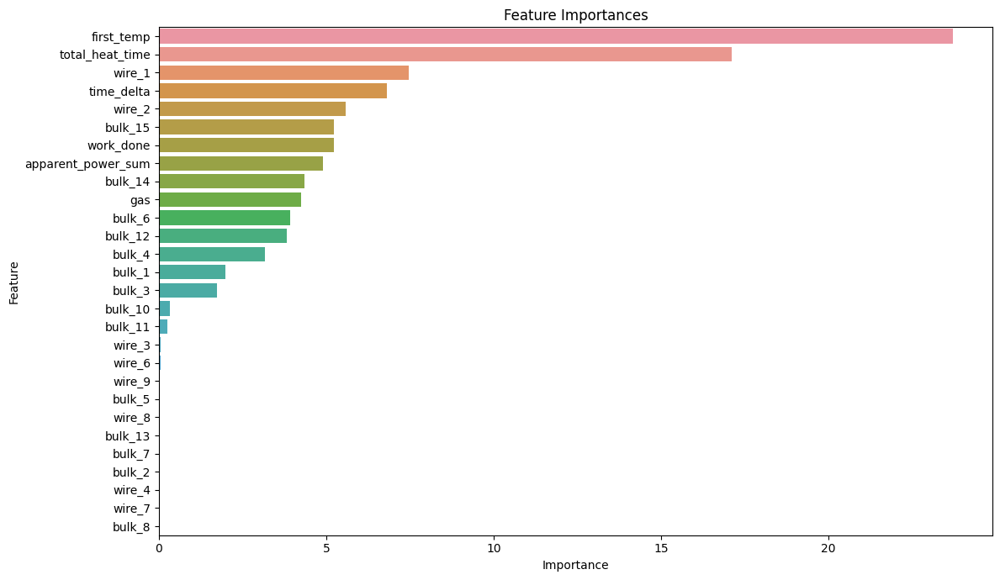

[I 2023-08-21 20:48:58,171] Trial 29 finished with value: 6.352391253285695 and parameters: {'depth': 7, 'iterations': 909, 'learning_rate': 0.225, 'l2_leaf_reg': 34, 'random_strength': 77, 'bootstrap_type': 'Bayesian', 'border_count': 179, 'bagging_temperature': 5.649324573895411}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1400814	test: 7.6550111	best: 7.6550111 (0)	total: 13.2ms	remaining: 8.68s
100:	learn: 7.6359467	test: 7.2596250	best: 7.2596250 (100)	total: 1.26s	remaining: 7s
200:	learn: 7.2932020	test: 7.0268135	best: 7.0268135 (200)	total: 2.55s	remaining: 5.84s
300:	learn: 7.0039826	test: 6.8395038	best: 6.8395038 (300)	total: 3.85s	remaining: 4.61s
400:	learn: 6.7836143	test: 6.7273103	best: 6.7273103 (400)	total: 5.15s	remaining: 3.34s
500:	learn: 6.5878318	test: 6.6252959	best: 6.6252959 (500)	total: 6.45s	remaining: 2.06s
600:	learn: 6.4084497	test: 6.5479523	best: 6.5479523 (600)	total: 7.74s	remaining: 773ms
660:	learn: 6.3068543	test: 6.4901504	best: 6.4896258 (659)	total: 8.53s	remaining: 0us
bestTest = 6.489625772
bestIteration = 659
Shrink model to first 660 iterations.
Split 1, MAE : 6.489576192224343

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9888193	test: 8.2648058	best: 8.2648058 (0)	total: 14.1ms	remaining: 9.33s
100:	learn: 7.5426451	test: 7.9118694	best: 7.9118694 (100)	total: 1.27s	remaining: 7.04s
200:	learn: 7.1800644	test: 7.6180570	best: 7.6180570 (200)	total: 2.53s	remaining: 5.8s
300:	learn: 6.9318319	test: 7.4450900	best: 7.4450900 (300)	total: 3.82s	remaining: 4.57s
400:	learn: 6.7181384	test: 7.2865246	best: 7.2865246 (400)	total: 5.14s	remaining: 3.33s
500:	learn: 6.4969498	test: 7.1216975	best: 7.1216975 (500)	total: 6.43s	remaining: 2.05s
600:	learn: 6.3310645	test: 7.0130227	best: 7.0127030 (599)	total: 7.72s	remaining: 771ms
660:	learn: 6.2329578	test: 6.9476840	best: 6.9476840 (660)	total: 8.5s	remaining: 0us
bestTest = 6.947683952
bestIteration = 660
Split 2, MAE : 6.947529457628873

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0122764	test: 8.1749754	best: 8.1749754 (0)	total: 14ms	remaining: 9.21s
100:	learn: 7.5635032	test: 7.8906334	best: 7.8903914 (99)	total: 1.29s	remaining: 7.18s
200:	learn: 7.2201259	test: 7.6757610	best: 7.6757610 (200)	total: 2.58s	remaining: 5.89s
300:	learn: 6.9277680	test: 7.5143252	best: 7.5143252 (300)	total: 3.86s	remaining: 4.62s
400:	learn: 6.6865900	test: 7.3909650	best: 7.3909650 (400)	total: 5.15s	remaining: 3.34s
500:	learn: 6.4799938	test: 7.2916193	best: 7.2916193 (500)	total: 6.46s	remaining: 2.06s
600:	learn: 6.2786124	test: 7.1972083	best: 7.1972083 (600)	total: 7.76s	remaining: 774ms
660:	learn: 6.1824343	test: 7.1539982	best: 7.1539982 (660)	total: 8.54s	remaining: 0us
bestTest = 7.15399817
bestIteration = 660
Split 3, MAE : 7.15400155370561

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0992188	test: 7.8230177	best: 7.8230177 (0)	total: 13.2ms	remaining: 8.71s
100:	learn: 7.6275643	test: 7.4811942	best: 7.4811942 (100)	total: 1.26s	remaining: 6.98s
200:	learn: 7.2417801	test: 7.2108337	best: 7.2108337 (200)	total: 2.57s	remaining: 5.88s
300:	learn: 6.9680955	test: 7.0219944	best: 7.0219944 (300)	total: 3.85s	remaining: 4.61s
400:	learn: 6.7650391	test: 6.8949066	best: 6.8949066 (400)	total: 5.14s	remaining: 3.33s
500:	learn: 6.5573820	test: 6.7697529	best: 6.7696744 (499)	total: 6.43s	remaining: 2.05s
600:	learn: 6.3774348	test: 6.6657027	best: 6.6657027 (600)	total: 7.76s	remaining: 775ms
660:	learn: 6.2728803	test: 6.6134019	best: 6.6134019 (660)	total: 8.54s	remaining: 0us
bestTest = 6.613401917
bestIteration = 660
Split 4, MAE : 6.613335901200932

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9811009	test: 8.3087032	best: 8.3087032 (0)	total: 15ms	remaining: 9.9s
100:	learn: 7.4617159	test: 7.9218771	best: 7.9218771 (100)	total: 1.38s	remaining: 7.63s
200:	learn: 7.1147443	test: 7.6672405	best: 7.6668757 (199)	total: 2.79s	remaining: 6.38s
300:	learn: 6.8348783	test: 7.4748058	best: 7.4748058 (300)	total: 4.26s	remaining: 5.09s
400:	learn: 6.6159652	test: 7.3351826	best: 7.3337164 (396)	total: 5.63s	remaining: 3.65s
500:	learn: 6.4345486	test: 7.2400057	best: 7.2399916 (499)	total: 6.99s	remaining: 2.23s
600:	learn: 6.2407538	test: 7.1571157	best: 7.1571157 (600)	total: 8.41s	remaining: 840ms
660:	learn: 6.1305794	test: 7.1116031	best: 7.1116031 (660)	total: 9.27s	remaining: 0us
bestTest = 7.111603134
bestIteration = 660
Split 5, MAE : 7.1114622083705505
Average MAE: 6.863181062626063


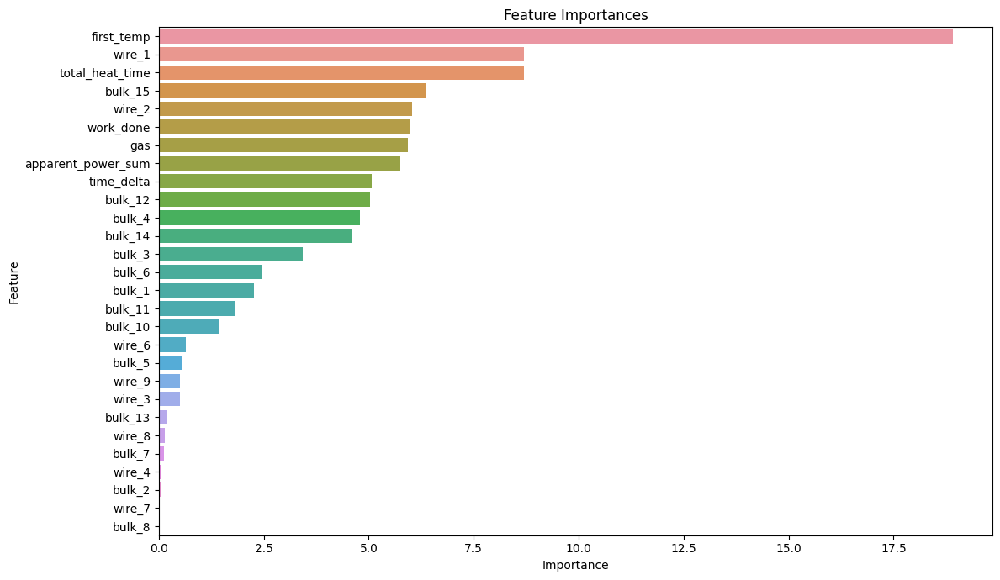

[I 2023-08-21 20:49:44,344] Trial 30 finished with value: 6.863181062626063 and parameters: {'depth': 6, 'iterations': 661, 'learning_rate': 0.175, 'l2_leaf_reg': 0, 'random_strength': 57, 'bootstrap_type': 'Bayesian', 'border_count': 97, 'bagging_temperature': 19.10850444034659}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1298450	test: 7.6452371	best: 7.6452371 (0)	total: 12.4ms	remaining: 10.3s
100:	learn: 6.8734798	test: 6.5830232	best: 6.5830232 (100)	total: 1.14s	remaining: 8.32s
200:	learn: 6.2778103	test: 6.1128559	best: 6.1128559 (200)	total: 2.27s	remaining: 7.2s
300:	learn: 5.9342915	test: 5.8365087	best: 5.8365087 (300)	total: 3.45s	remaining: 6.15s
400:	learn: 5.6786307	test: 5.6383375	best: 5.6383375 (400)	total: 4.62s	remaining: 5.02s
500:	learn: 5.4699616	test: 5.4877650	best: 5.4877650 (500)	total: 5.79s	remaining: 3.89s
600:	learn: 5.3166714	test: 5.3986439	best: 5.3986439 (600)	total: 6.97s	remaining: 2.74s
700:	learn: 5.1952134	test: 5.3409955	best: 5.3409955 (700)	total: 8.17s	remaining: 1.58s
800:	learn: 5.0876742	test: 5.3039579	best: 5.3023923 (788)	total: 9.34s	remaining: 420ms
836:	learn: 5.0541554	test: 5.2923245	best: 5.2918687 (834)	total: 9.76s	remaining: 0us
bestTest = 5.291868718
bestIteration = 834
Shrink model to first 835 iterations.
Split 1, MAE : 5.29180652

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9791538	test: 8.2508464	best: 8.2508464 (0)	total: 12.3ms	remaining: 10.3s
100:	learn: 6.7851864	test: 7.1054093	best: 7.1054093 (100)	total: 1.13s	remaining: 8.27s
200:	learn: 6.1877508	test: 6.5313046	best: 6.5313046 (200)	total: 2.27s	remaining: 7.18s
300:	learn: 5.8360174	test: 6.2030900	best: 6.2030900 (300)	total: 3.45s	remaining: 6.14s
400:	learn: 5.5709889	test: 6.0109381	best: 6.0109381 (400)	total: 4.61s	remaining: 5.01s
500:	learn: 5.3448940	test: 5.8698332	best: 5.8698332 (500)	total: 5.76s	remaining: 3.86s
600:	learn: 5.1851293	test: 5.7567702	best: 5.7567702 (600)	total: 6.92s	remaining: 2.72s
700:	learn: 5.0940288	test: 5.7005944	best: 5.6998169 (699)	total: 8.12s	remaining: 1.57s
800:	learn: 4.9898211	test: 5.6452350	best: 5.6450937 (799)	total: 9.29s	remaining: 417ms
836:	learn: 4.9550743	test: 5.6342483	best: 5.6342483 (836)	total: 9.71s	remaining: 0us
bestTest = 5.634248313
bestIteration = 836
Split 2, MAE : 5.6343436933908215

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0005920	test: 8.1645277	best: 8.1645277 (0)	total: 10.4ms	remaining: 8.7s
100:	learn: 6.7130679	test: 7.1990061	best: 7.1990061 (100)	total: 1.1s	remaining: 8.05s
200:	learn: 6.0326826	test: 6.6892370	best: 6.6892370 (200)	total: 2.25s	remaining: 7.12s
300:	learn: 5.6456710	test: 6.4288285	best: 6.4288285 (300)	total: 3.44s	remaining: 6.12s
400:	learn: 5.4051326	test: 6.2879138	best: 6.2879138 (400)	total: 4.6s	remaining: 5s
500:	learn: 5.2489359	test: 6.2064534	best: 6.2064534 (500)	total: 5.77s	remaining: 3.87s
600:	learn: 5.1297417	test: 6.1419220	best: 6.1419220 (600)	total: 6.94s	remaining: 2.73s
700:	learn: 5.0190941	test: 6.0828259	best: 6.0828259 (700)	total: 8.14s	remaining: 1.58s
800:	learn: 4.8977370	test: 6.0332717	best: 6.0332717 (800)	total: 9.3s	remaining: 418ms
836:	learn: 4.8641762	test: 6.0268569	best: 6.0255956 (823)	total: 9.73s	remaining: 0us
bestTest = 6.025595591
bestIteration = 823
Shrink model to first 824 iterations.
Split 3, MAE : 6.02565446153768

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0877114	test: 7.8147927	best: 7.8147927 (0)	total: 11.8ms	remaining: 9.88s
100:	learn: 6.8121668	test: 6.7754650	best: 6.7754650 (100)	total: 1.13s	remaining: 8.26s
200:	learn: 6.2189537	test: 6.3162912	best: 6.3162912 (200)	total: 2.28s	remaining: 7.22s
300:	learn: 5.8149425	test: 6.0367537	best: 6.0367537 (300)	total: 3.45s	remaining: 6.15s
400:	learn: 5.5136470	test: 5.8954713	best: 5.8945804 (399)	total: 4.61s	remaining: 5.02s
500:	learn: 5.3392554	test: 5.8248442	best: 5.8248442 (500)	total: 5.79s	remaining: 3.89s
600:	learn: 5.1673625	test: 5.7696449	best: 5.7696449 (600)	total: 7s	remaining: 2.75s
700:	learn: 5.0403891	test: 5.7346637	best: 5.7340074 (695)	total: 8.15s	remaining: 1.58s
800:	learn: 4.9268191	test: 5.7197006	best: 5.7197006 (800)	total: 9.32s	remaining: 419ms
836:	learn: 4.8927003	test: 5.7197080	best: 5.7182652 (824)	total: 9.75s	remaining: 0us
bestTest = 5.718265227
bestIteration = 824
Shrink model to first 825 iterations.
Split 4, MAE : 5.7182907258

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9683888	test: 8.3001800	best: 8.3001800 (0)	total: 13.3ms	remaining: 11.1s
100:	learn: 6.6984221	test: 7.2893010	best: 7.2893010 (100)	total: 1.24s	remaining: 9.02s
200:	learn: 6.0720752	test: 6.8237859	best: 6.8237859 (200)	total: 2.53s	remaining: 8.01s
300:	learn: 5.6276581	test: 6.5455841	best: 6.5455841 (300)	total: 3.77s	remaining: 6.72s
400:	learn: 5.3499132	test: 6.4067355	best: 6.4067355 (400)	total: 5.04s	remaining: 5.47s
500:	learn: 5.1650156	test: 6.3627411	best: 6.3627411 (500)	total: 6.32s	remaining: 4.24s
600:	learn: 5.0295937	test: 6.3444600	best: 6.3420158 (582)	total: 7.63s	remaining: 3s
bestTest = 6.34201576
bestIteration = 582
Shrink model to first 583 iterations.
Split 5, MAE : 6.342007940113976
Average MAE: 5.802420669989693


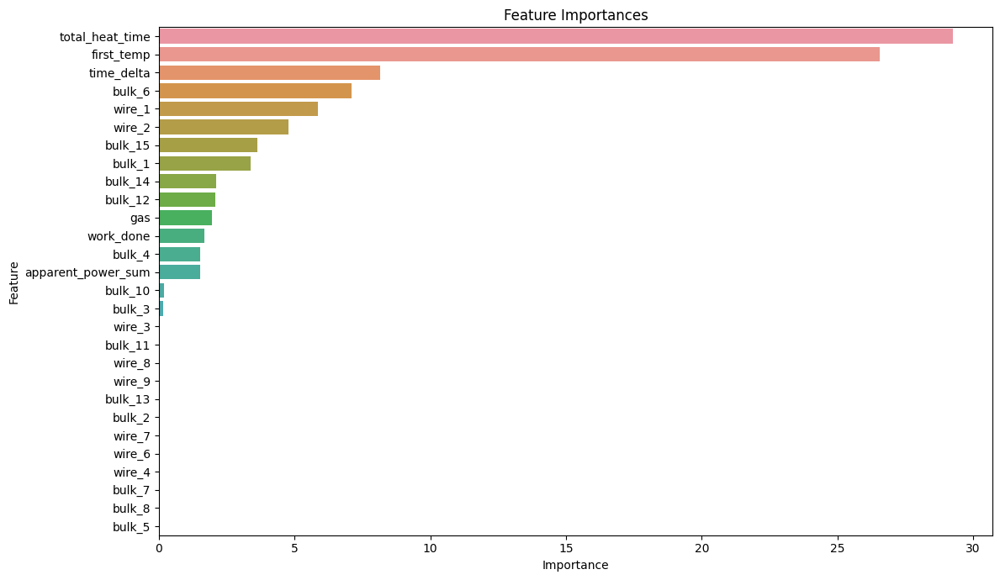

[I 2023-08-21 20:50:34,323] Trial 31 finished with value: 5.802420669989693 and parameters: {'depth': 5, 'iterations': 837, 'learning_rate': 0.385, 'l2_leaf_reg': 45, 'random_strength': 4, 'bootstrap_type': 'Bayesian', 'border_count': 70, 'bagging_temperature': 0.7338461184837843}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1422783	test: 7.6545501	best: 7.6545501 (0)	total: 12.1ms	remaining: 10.4s
100:	learn: 7.1106010	test: 6.7639251	best: 6.7639251 (100)	total: 1.14s	remaining: 8.52s
200:	learn: 6.4960994	test: 6.2978963	best: 6.2978963 (200)	total: 2.28s	remaining: 7.45s
300:	learn: 6.1497854	test: 6.0287680	best: 6.0287680 (300)	total: 3.47s	remaining: 6.42s
400:	learn: 5.9133563	test: 5.8453303	best: 5.8453303 (400)	total: 4.62s	remaining: 5.27s
500:	learn: 5.7404628	test: 5.7249371	best: 5.7249371 (500)	total: 5.79s	remaining: 4.12s
600:	learn: 5.5929069	test: 5.6393445	best: 5.6391304 (599)	total: 6.95s	remaining: 2.97s
700:	learn: 5.4643604	test: 5.5482636	best: 5.5482636 (700)	total: 8.16s	remaining: 1.83s
800:	learn: 5.3586808	test: 5.4922970	best: 5.4922970 (800)	total: 9.3s	remaining: 662ms
857:	learn: 5.2981829	test: 5.4719913	best: 5.4719913 (857)	total: 9.96s	remaining: 0us
bestTest = 5.471991334
bestIteration = 857
Split 1, MAE : 5.472079805890031

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9818103	test: 8.2542140	best: 8.2542140 (0)	total: 12.2ms	remaining: 10.4s
100:	learn: 7.0197239	test: 7.3051058	best: 7.3051058 (100)	total: 1.13s	remaining: 8.48s
200:	learn: 6.4562887	test: 6.7068787	best: 6.7068787 (200)	total: 2.27s	remaining: 7.41s
300:	learn: 6.1106920	test: 6.3705964	best: 6.3705964 (300)	total: 3.43s	remaining: 6.34s
400:	learn: 5.8586391	test: 6.1499429	best: 6.1499429 (400)	total: 4.58s	remaining: 5.22s
500:	learn: 5.6760758	test: 6.0097985	best: 6.0097985 (500)	total: 5.75s	remaining: 4.09s
600:	learn: 5.5328826	test: 5.9167760	best: 5.9167760 (600)	total: 6.93s	remaining: 2.96s
700:	learn: 5.4073978	test: 5.8258165	best: 5.8258165 (700)	total: 8.14s	remaining: 1.82s
800:	learn: 5.3004534	test: 5.7565949	best: 5.7565949 (800)	total: 9.3s	remaining: 662ms
857:	learn: 5.2481842	test: 5.7241183	best: 5.7237339 (856)	total: 9.98s	remaining: 0us
bestTest = 5.723733897
bestIteration = 856
Shrink model to first 857 iterations.
Split 2, MAE : 5.72381415

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0032386	test: 8.1659751	best: 8.1659751 (0)	total: 12.2ms	remaining: 10.5s
100:	learn: 6.9981155	test: 7.4329278	best: 7.4329278 (100)	total: 1.14s	remaining: 8.57s
200:	learn: 6.3756347	test: 7.0020734	best: 7.0020734 (200)	total: 2.28s	remaining: 7.45s
300:	learn: 6.0008659	test: 6.7455551	best: 6.7455551 (300)	total: 3.4s	remaining: 6.29s
400:	learn: 5.7485439	test: 6.5987755	best: 6.5983684 (399)	total: 4.47s	remaining: 5.09s
500:	learn: 5.5524874	test: 6.4847681	best: 6.4845625 (497)	total: 5.61s	remaining: 4s
600:	learn: 5.3937880	test: 6.3877555	best: 6.3877555 (600)	total: 6.8s	remaining: 2.91s
700:	learn: 5.2722315	test: 6.3184559	best: 6.3184559 (700)	total: 7.97s	remaining: 1.78s
800:	learn: 5.1647722	test: 6.2626338	best: 6.2621846 (795)	total: 9.13s	remaining: 650ms
857:	learn: 5.1037958	test: 6.2258881	best: 6.2258769 (856)	total: 9.8s	remaining: 0us
bestTest = 6.225876948
bestIteration = 856
Shrink model to first 857 iterations.
Split 3, MAE : 6.2259970098995

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0992019	test: 7.8224038	best: 7.8224038 (0)	total: 12ms	remaining: 10.3s
100:	learn: 7.0120247	test: 6.9422692	best: 6.9422692 (100)	total: 1.13s	remaining: 8.45s
200:	learn: 6.4330589	test: 6.5250721	best: 6.5250721 (200)	total: 2.29s	remaining: 7.47s
300:	learn: 6.0882000	test: 6.2576399	best: 6.2576399 (300)	total: 3.45s	remaining: 6.38s
400:	learn: 5.8590120	test: 6.0976324	best: 6.0976324 (400)	total: 4.6s	remaining: 5.25s
500:	learn: 5.6531786	test: 5.9886236	best: 5.9882665 (499)	total: 5.77s	remaining: 4.11s
600:	learn: 5.4769920	test: 5.8985315	best: 5.8985315 (600)	total: 6.95s	remaining: 2.97s
700:	learn: 5.3236692	test: 5.8249905	best: 5.8249905 (700)	total: 8.11s	remaining: 1.81s
800:	learn: 5.2169981	test: 5.7910233	best: 5.7910233 (800)	total: 9.28s	remaining: 661ms
857:	learn: 5.1559189	test: 5.7752317	best: 5.7752317 (857)	total: 9.96s	remaining: 0us
bestTest = 5.775231723
bestIteration = 857
Split 4, MAE : 5.775273136227963

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9750357	test: 8.3025688	best: 8.3025688 (0)	total: 13.3ms	remaining: 11.4s
100:	learn: 6.9749664	test: 7.4794922	best: 7.4794922 (100)	total: 1.26s	remaining: 9.43s
200:	learn: 6.3619575	test: 6.9914761	best: 6.9914761 (200)	total: 2.51s	remaining: 8.2s
300:	learn: 5.9576585	test: 6.7245834	best: 6.7245834 (300)	total: 3.76s	remaining: 6.96s
400:	learn: 5.6639652	test: 6.5556935	best: 6.5556107 (399)	total: 5.03s	remaining: 5.73s
500:	learn: 5.4519433	test: 6.4450978	best: 6.4450978 (500)	total: 6.33s	remaining: 4.51s
600:	learn: 5.2892974	test: 6.3886312	best: 6.3886312 (600)	total: 7.66s	remaining: 3.28s
700:	learn: 5.1657087	test: 6.3573559	best: 6.3573559 (700)	total: 8.96s	remaining: 2.01s
800:	learn: 5.0695432	test: 6.3367225	best: 6.3365079 (799)	total: 10.2s	remaining: 722ms
857:	learn: 5.0083851	test: 6.3260968	best: 6.3260968 (857)	total: 10.9s	remaining: 0us
bestTest = 6.326096809
bestIteration = 857
Split 5, MAE : 6.326126684384909
Average MAE: 5.904658158607948

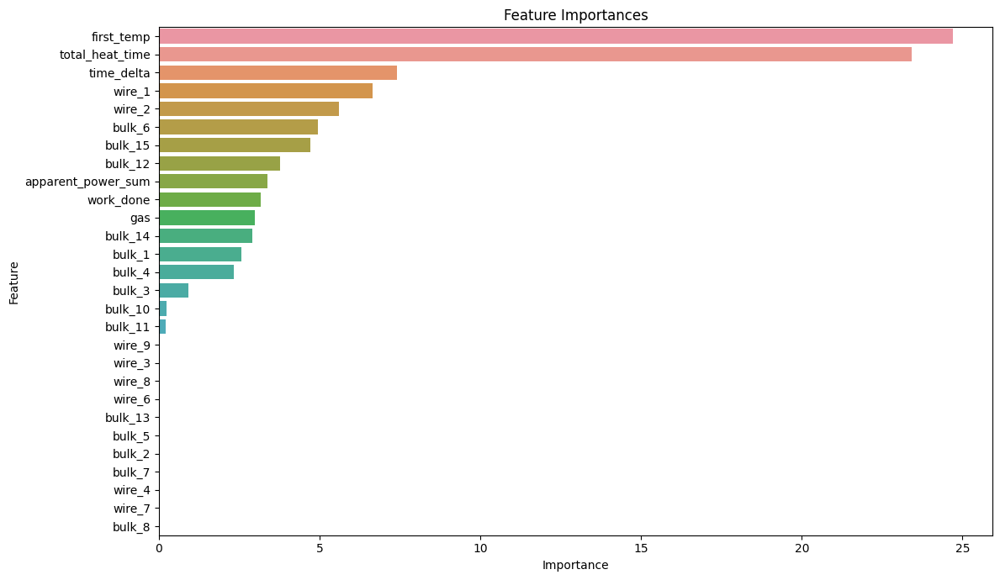

[I 2023-08-21 20:51:27,915] Trial 32 finished with value: 5.9046581586079485 and parameters: {'depth': 5, 'iterations': 858, 'learning_rate': 0.395, 'l2_leaf_reg': 41, 'random_strength': 198, 'bootstrap_type': 'Bayesian', 'border_count': 57, 'bagging_temperature': 3.502948482551942}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1364588	test: 7.6518646	best: 7.6518646 (0)	total: 10.8ms	remaining: 10.3s
100:	learn: 7.2903844	test: 6.8986781	best: 6.8986781 (100)	total: 1.05s	remaining: 8.86s
200:	learn: 6.7959643	test: 6.5033466	best: 6.5033466 (200)	total: 2.09s	remaining: 7.82s
300:	learn: 6.4733484	test: 6.2448863	best: 6.2448863 (300)	total: 3.15s	remaining: 6.82s
400:	learn: 6.2578755	test: 6.0838410	best: 6.0838410 (400)	total: 4.23s	remaining: 5.81s
500:	learn: 6.0868650	test: 5.9453825	best: 5.9453825 (500)	total: 5.3s	remaining: 4.77s
600:	learn: 5.9455626	test: 5.8308109	best: 5.8308109 (600)	total: 6.36s	remaining: 3.72s
700:	learn: 5.8245368	test: 5.7483582	best: 5.7483582 (700)	total: 7.43s	remaining: 2.66s
800:	learn: 5.7365614	test: 5.6862006	best: 5.6862006 (800)	total: 8.51s	remaining: 1.6s
900:	learn: 5.6593636	test: 5.6382350	best: 5.6382350 (900)	total: 9.64s	remaining: 546ms
951:	learn: 5.6117695	test: 5.6087398	best: 5.6087398 (951)	total: 10.2s	remaining: 0us
bestTest = 5.6087

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9871352	test: 8.2618279	best: 8.2618279 (0)	total: 10.8ms	remaining: 10.3s
100:	learn: 7.1793961	test: 7.4266249	best: 7.4266249 (100)	total: 1.06s	remaining: 8.91s
200:	learn: 6.7387359	test: 6.9646171	best: 6.9646171 (200)	total: 2.19s	remaining: 8.18s
300:	learn: 6.4441356	test: 6.6679261	best: 6.6679261 (300)	total: 3.35s	remaining: 7.26s
400:	learn: 6.2266403	test: 6.4536525	best: 6.4536525 (400)	total: 4.39s	remaining: 6.03s
500:	learn: 6.0715840	test: 6.2978432	best: 6.2978432 (500)	total: 5.45s	remaining: 4.91s
600:	learn: 5.9349360	test: 6.1861051	best: 6.1861051 (600)	total: 6.5s	remaining: 3.8s
700:	learn: 5.8121231	test: 6.0729638	best: 6.0729638 (700)	total: 7.58s	remaining: 2.71s
800:	learn: 5.7195101	test: 5.9971053	best: 5.9971053 (800)	total: 8.68s	remaining: 1.64s
900:	learn: 5.6430181	test: 5.9424206	best: 5.9424206 (900)	total: 9.84s	remaining: 557ms
951:	learn: 5.6098188	test: 5.9199331	best: 5.9199331 (951)	total: 10.4s	remaining: 0us
bestTest = 5.9199

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0043455	test: 8.1697694	best: 8.1697694 (0)	total: 11.1ms	remaining: 10.6s
100:	learn: 7.1449236	test: 7.5163092	best: 7.5163092 (100)	total: 1s	remaining: 8.44s
200:	learn: 6.6411770	test: 7.1612140	best: 7.1612140 (200)	total: 1.97s	remaining: 7.35s
300:	learn: 6.3430747	test: 6.9719245	best: 6.9719245 (300)	total: 3s	remaining: 6.48s
400:	learn: 6.1188646	test: 6.8297465	best: 6.8297465 (400)	total: 4.05s	remaining: 5.56s
500:	learn: 5.9478275	test: 6.7214929	best: 6.7214929 (500)	total: 5.12s	remaining: 4.61s
600:	learn: 5.8224856	test: 6.6362529	best: 6.6362529 (600)	total: 6.2s	remaining: 3.62s
700:	learn: 5.7110335	test: 6.5710078	best: 6.5710078 (700)	total: 7.29s	remaining: 2.61s
800:	learn: 5.6093589	test: 6.5027744	best: 6.5027744 (800)	total: 8.41s	remaining: 1.59s
900:	learn: 5.5181498	test: 6.4426549	best: 6.4426549 (900)	total: 9.56s	remaining: 541ms
951:	learn: 5.4773226	test: 6.4183689	best: 6.4183689 (951)	total: 10.3s	remaining: 0us
bestTest = 6.418368889

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0935890	test: 7.8179840	best: 7.8179840 (0)	total: 10.1ms	remaining: 9.64s
100:	learn: 7.2524642	test: 7.0856737	best: 7.0856737 (100)	total: 1.08s	remaining: 9.12s
200:	learn: 6.7301831	test: 6.6867430	best: 6.6867430 (200)	total: 2.27s	remaining: 8.49s
300:	learn: 6.4286381	test: 6.4532092	best: 6.4532092 (300)	total: 3.3s	remaining: 7.13s
400:	learn: 6.2274201	test: 6.3010008	best: 6.3010008 (400)	total: 4.37s	remaining: 6s
500:	learn: 6.0456583	test: 6.1766315	best: 6.1766315 (500)	total: 5.53s	remaining: 4.98s
600:	learn: 5.9019664	test: 6.0825771	best: 6.0825771 (600)	total: 6.62s	remaining: 3.87s
700:	learn: 5.7847656	test: 6.0188157	best: 6.0188157 (700)	total: 7.73s	remaining: 2.77s
800:	learn: 5.6845157	test: 5.9628850	best: 5.9628850 (800)	total: 8.82s	remaining: 1.66s
900:	learn: 5.5877604	test: 5.9118309	best: 5.9118309 (900)	total: 9.92s	remaining: 562ms
951:	learn: 5.5527295	test: 5.8908635	best: 5.8907779 (950)	total: 10.4s	remaining: 0us
bestTest = 5.890777

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9734319	test: 8.3027814	best: 8.3027814 (0)	total: 10ms	remaining: 9.52s
100:	learn: 7.1380488	test: 7.5633959	best: 7.5633959 (100)	total: 1.03s	remaining: 8.66s
200:	learn: 6.6357905	test: 7.1383821	best: 7.1383821 (200)	total: 2.08s	remaining: 7.77s
300:	learn: 6.3044089	test: 6.8940710	best: 6.8940710 (300)	total: 3.22s	remaining: 6.97s
400:	learn: 6.0680934	test: 6.7358469	best: 6.7358469 (400)	total: 4.36s	remaining: 5.99s
500:	learn: 5.8973468	test: 6.6362754	best: 6.6362754 (500)	total: 5.57s	remaining: 5.01s
600:	learn: 5.7532762	test: 6.5521563	best: 6.5521563 (600)	total: 6.8s	remaining: 3.97s
700:	learn: 5.6285779	test: 6.4978224	best: 6.4972976 (699)	total: 8.06s	remaining: 2.88s
800:	learn: 5.5126554	test: 6.4581341	best: 6.4577742 (799)	total: 9.29s	remaining: 1.75s
900:	learn: 5.4223136	test: 6.4272152	best: 6.4272152 (900)	total: 10.4s	remaining: 590ms
951:	learn: 5.3808002	test: 6.4075858	best: 6.4075858 (951)	total: 11s	remaining: 0us
bestTest = 6.4075857

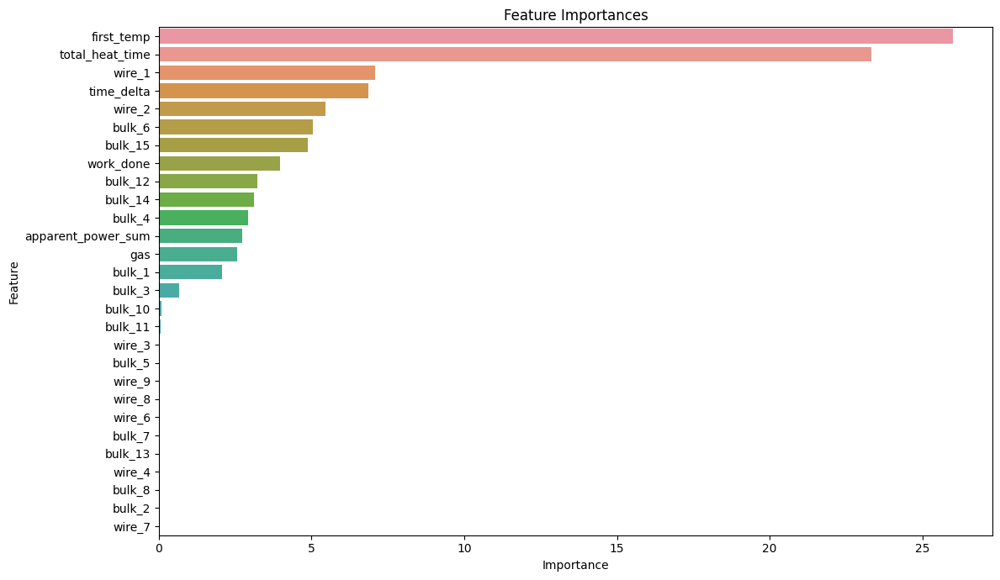

[I 2023-08-21 20:52:23,417] Trial 33 finished with value: 6.04903961852545 and parameters: {'depth': 4, 'iterations': 952, 'learning_rate': 0.395, 'l2_leaf_reg': 88, 'random_strength': 7, 'bootstrap_type': 'Bayesian', 'border_count': 82, 'bagging_temperature': 3.6984457471397927}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1383755	test: 7.6526082	best: 7.6526082 (0)	total: 12.6ms	remaining: 6.5s
100:	learn: 7.4432991	test: 7.0628008	best: 7.0628008 (100)	total: 1.11s	remaining: 4.57s
200:	learn: 7.0242193	test: 6.7476593	best: 6.7476593 (200)	total: 2.31s	remaining: 3.61s
300:	learn: 6.7554313	test: 6.5586105	best: 6.5586105 (300)	total: 3.54s	remaining: 2.53s
400:	learn: 6.5333713	test: 6.4104738	best: 6.4104738 (400)	total: 4.72s	remaining: 1.35s
500:	learn: 6.3611257	test: 6.3116717	best: 6.3116717 (500)	total: 5.93s	remaining: 177ms
515:	learn: 6.3381778	test: 6.2992199	best: 6.2992199 (515)	total: 6.12s	remaining: 0us
bestTest = 6.299219869
bestIteration = 515
Split 1, MAE : 6.299188451291586

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9854426	test: 8.2588898	best: 8.2588898 (0)	total: 12.4ms	remaining: 6.38s
100:	learn: 7.3242790	test: 7.6075478	best: 7.6075478 (100)	total: 1.14s	remaining: 4.69s
200:	learn: 6.9715830	test: 7.2577034	best: 7.2577034 (200)	total: 2.3s	remaining: 3.61s
300:	learn: 6.7283657	test: 7.0332829	best: 7.0332829 (300)	total: 3.44s	remaining: 2.46s
400:	learn: 6.4977568	test: 6.8200376	best: 6.8200376 (400)	total: 4.61s	remaining: 1.32s
500:	learn: 6.3260290	test: 6.6742409	best: 6.6742409 (500)	total: 5.83s	remaining: 175ms
515:	learn: 6.3036108	test: 6.6590713	best: 6.6590713 (515)	total: 6.02s	remaining: 0us
bestTest = 6.659071258
bestIteration = 515
Split 2, MAE : 6.659005914276808

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0072549	test: 8.1718204	best: 8.1718204 (0)	total: 12.9ms	remaining: 6.66s
100:	learn: 7.3778568	test: 7.7213138	best: 7.7213138 (100)	total: 1.19s	remaining: 4.88s
200:	learn: 6.9307229	test: 7.4178295	best: 7.4178295 (200)	total: 2.36s	remaining: 3.7s
300:	learn: 6.6413255	test: 7.2413928	best: 7.2413928 (300)	total: 3.54s	remaining: 2.53s
400:	learn: 6.3678061	test: 7.0942285	best: 7.0938263 (399)	total: 4.71s	remaining: 1.35s
500:	learn: 6.1834067	test: 6.9950179	best: 6.9950179 (500)	total: 5.91s	remaining: 177ms
515:	learn: 6.1570458	test: 6.9768934	best: 6.9768934 (515)	total: 6.1s	remaining: 0us
bestTest = 6.976893384
bestIteration = 515
Split 3, MAE : 6.976893011322125

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0945845	test: 7.8174944	best: 7.8174944 (0)	total: 12.5ms	remaining: 6.42s
100:	learn: 7.4059042	test: 7.2553795	best: 7.2553795 (100)	total: 1.19s	remaining: 4.9s
200:	learn: 6.9987616	test: 6.9494096	best: 6.9494096 (200)	total: 2.39s	remaining: 3.75s
300:	learn: 6.7009759	test: 6.7197266	best: 6.7197266 (300)	total: 3.54s	remaining: 2.52s
400:	learn: 6.4744554	test: 6.5566091	best: 6.5564161 (399)	total: 4.73s	remaining: 1.36s
500:	learn: 6.2907265	test: 6.4366637	best: 6.4366637 (500)	total: 5.94s	remaining: 178ms
515:	learn: 6.2559056	test: 6.4219620	best: 6.4219620 (515)	total: 6.13s	remaining: 0us
bestTest = 6.421961993
bestIteration = 515
Split 4, MAE : 6.421956087893558

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9764085	test: 8.3040077	best: 8.3040077 (0)	total: 14.3ms	remaining: 7.38s
100:	learn: 7.2904178	test: 7.7221904	best: 7.7221904 (100)	total: 1.22s	remaining: 5.02s
200:	learn: 6.8780424	test: 7.3768816	best: 7.3767637 (199)	total: 2.54s	remaining: 3.98s
300:	learn: 6.5843610	test: 7.1901091	best: 7.1901091 (300)	total: 3.81s	remaining: 2.72s
400:	learn: 6.3686716	test: 7.0599730	best: 7.0599730 (400)	total: 5.11s	remaining: 1.46s
500:	learn: 6.1941056	test: 6.9684034	best: 6.9684034 (500)	total: 6.41s	remaining: 192ms
515:	learn: 6.1659764	test: 6.9528205	best: 6.9528205 (515)	total: 6.61s	remaining: 0us
bestTest = 6.952820526
bestIteration = 515
Split 5, MAE : 6.95284230434197
Average MAE: 6.66197715382521


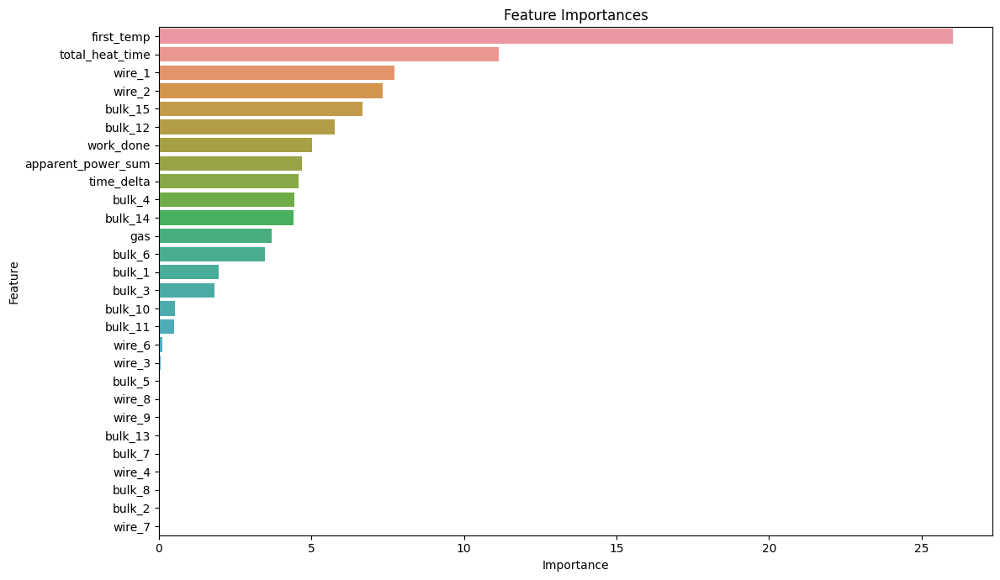

[I 2023-08-21 20:52:57,438] Trial 34 finished with value: 6.66197715382521 and parameters: {'depth': 5, 'iterations': 516, 'learning_rate': 0.335, 'l2_leaf_reg': 24, 'random_strength': 45, 'bootstrap_type': 'Bayesian', 'border_count': 21, 'bagging_temperature': 9.543174007488867}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1207211	test: 7.6371147	best: 7.6371147 (0)	total: 17.3ms	remaining: 17.2s
100:	learn: 6.5756395	test: 6.4249040	best: 6.4249040 (100)	total: 1.56s	remaining: 13.9s
200:	learn: 5.8806464	test: 5.9203514	best: 5.9203514 (200)	total: 3.07s	remaining: 12.2s
300:	learn: 5.4492394	test: 5.6825451	best: 5.6825451 (300)	total: 4.57s	remaining: 10.6s
400:	learn: 5.1190156	test: 5.5315291	best: 5.5312070 (398)	total: 6.03s	remaining: 8.99s
500:	learn: 4.8866893	test: 5.4689746	best: 5.4689746 (500)	total: 7.49s	remaining: 7.44s
600:	learn: 4.6739153	test: 5.4102902	best: 5.4102902 (600)	total: 9s	remaining: 5.96s
700:	learn: 4.4953372	test: 5.3871766	best: 5.3866551 (676)	total: 10.5s	remaining: 4.45s
800:	learn: 4.3273208	test: 5.3653033	best: 5.3651665 (796)	total: 12s	remaining: 2.96s
900:	learn: 4.1689460	test: 5.3416510	best: 5.3404433 (895)	total: 13.4s	remaining: 1.46s
998:	learn: 4.0137402	test: 5.3425534	best: 5.3393967 (969)	total: 14.9s	remaining: 0us
bestTest = 5.3393967

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9752595	test: 8.2501595	best: 8.2501595 (0)	total: 15.6ms	remaining: 15.6s
100:	learn: 6.5401750	test: 6.9615251	best: 6.9615251 (100)	total: 1.49s	remaining: 13.3s
200:	learn: 5.8198368	test: 6.3144559	best: 6.3135633 (199)	total: 3s	remaining: 11.9s
300:	learn: 5.3948391	test: 6.0248604	best: 6.0248604 (300)	total: 4.47s	remaining: 10.4s
400:	learn: 5.0764066	test: 5.8501543	best: 5.8494551 (399)	total: 5.97s	remaining: 8.9s
500:	learn: 4.8309762	test: 5.7615750	best: 5.7614903 (499)	total: 7.52s	remaining: 7.47s
600:	learn: 4.6315827	test: 5.6879893	best: 5.6879893 (600)	total: 9.06s	remaining: 6s
700:	learn: 4.4365108	test: 5.6565686	best: 5.6565686 (700)	total: 10.6s	remaining: 4.49s
800:	learn: 4.2682412	test: 5.6240430	best: 5.6237803 (799)	total: 12.1s	remaining: 2.98s
900:	learn: 4.1047381	test: 5.5999714	best: 5.5985394 (896)	total: 13.5s	remaining: 1.47s
bestTest = 5.598539423
bestIteration = 896
Shrink model to first 897 iterations.
Split 2, MAE : 5.598650427285

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9957316	test: 8.1623836	best: 8.1623836 (0)	total: 16.3ms	remaining: 16.2s
100:	learn: 6.4410966	test: 7.1220088	best: 7.1220088 (100)	total: 1.46s	remaining: 13s
200:	learn: 5.7284154	test: 6.6896693	best: 6.6896693 (200)	total: 2.96s	remaining: 11.8s
300:	learn: 5.2878446	test: 6.4886058	best: 6.4886058 (300)	total: 4.5s	remaining: 10.4s
400:	learn: 4.9471269	test: 6.3263649	best: 6.3263649 (400)	total: 6.06s	remaining: 9.03s
500:	learn: 4.6956001	test: 6.2154831	best: 6.2154831 (500)	total: 7.63s	remaining: 7.58s
600:	learn: 4.4853691	test: 6.1620611	best: 6.1615910 (599)	total: 9.14s	remaining: 6.05s
700:	learn: 4.3078943	test: 6.1237618	best: 6.1237618 (700)	total: 10.7s	remaining: 4.54s
800:	learn: 4.1521458	test: 6.0913310	best: 6.0913310 (800)	total: 12.2s	remaining: 3.03s
900:	learn: 3.9857579	test: 6.0810379	best: 6.0775787 (885)	total: 13.8s	remaining: 1.5s
bestTest = 6.077578657
bestIteration = 885
Shrink model to first 886 iterations.
Split 3, MAE : 6.077521586

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0781180	test: 7.8093865	best: 7.8093865 (0)	total: 16ms	remaining: 15.9s
100:	learn: 6.5286542	test: 6.6762387	best: 6.6762387 (100)	total: 1.49s	remaining: 13.3s
200:	learn: 5.7853404	test: 6.2147266	best: 6.2147266 (200)	total: 2.96s	remaining: 11.8s
300:	learn: 5.3435274	test: 5.9523575	best: 5.9523575 (300)	total: 4.46s	remaining: 10.3s
400:	learn: 5.0155095	test: 5.8376482	best: 5.8366871 (399)	total: 6s	remaining: 8.95s
500:	learn: 4.7609382	test: 5.7890358	best: 5.7889075 (499)	total: 7.55s	remaining: 7.51s
600:	learn: 4.5596116	test: 5.7563252	best: 5.7542904 (597)	total: 9.06s	remaining: 6s
700:	learn: 4.3621727	test: 5.7424239	best: 5.7416133 (698)	total: 10.6s	remaining: 4.49s
800:	learn: 4.1801348	test: 5.7362825	best: 5.7329617 (772)	total: 12.1s	remaining: 2.99s
bestTest = 5.73296172
bestIteration = 772
Shrink model to first 773 iterations.
Split 4, MAE : 5.732991581610919

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9615857	test: 8.2925226	best: 8.2925226 (0)	total: 17.4ms	remaining: 17.3s
100:	learn: 6.3927433	test: 7.1161955	best: 7.1161955 (100)	total: 1.62s	remaining: 14.4s
200:	learn: 5.6644958	test: 6.7311310	best: 6.7311310 (200)	total: 3.25s	remaining: 12.9s
300:	learn: 5.1797960	test: 6.5488351	best: 6.5488351 (300)	total: 4.95s	remaining: 11.5s
400:	learn: 4.8918851	test: 6.4607102	best: 6.4604541 (397)	total: 6.58s	remaining: 9.81s
500:	learn: 4.6527512	test: 6.4102004	best: 6.4102004 (500)	total: 8.25s	remaining: 8.2s
600:	learn: 4.4488239	test: 6.3849073	best: 6.3831093 (574)	total: 9.97s	remaining: 6.6s
700:	learn: 4.2694941	test: 6.3650892	best: 6.3642298 (698)	total: 11.6s	remaining: 4.95s
800:	learn: 4.1062104	test: 6.3493807	best: 6.3493807 (800)	total: 13.3s	remaining: 3.3s
900:	learn: 3.9624041	test: 6.3356709	best: 6.3356709 (900)	total: 15s	remaining: 1.63s
bestTest = 6.3317829
bestIteration = 914
Shrink model to first 915 iterations.
Split 5, MAE : 6.331791584183

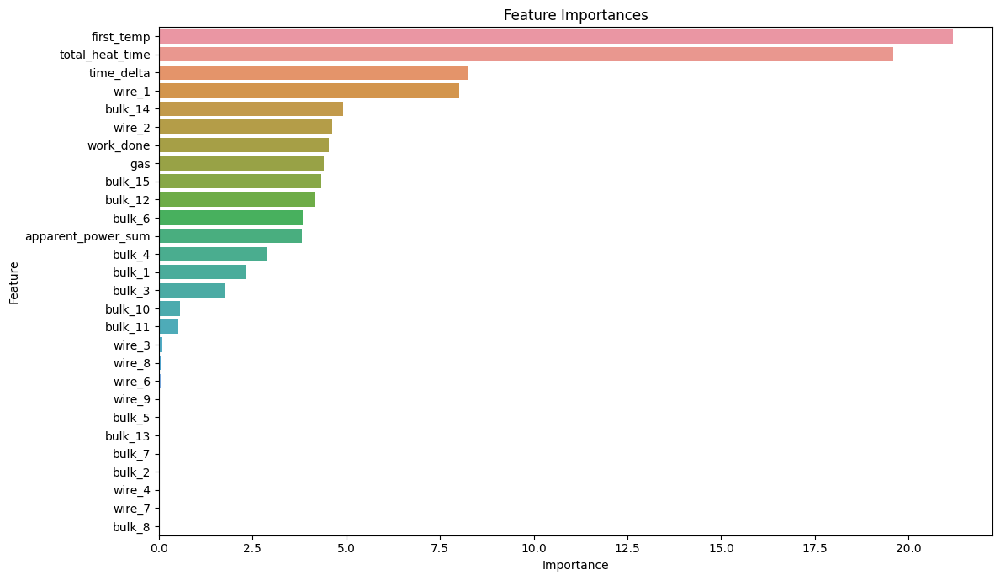

[I 2023-08-21 20:54:12,355] Trial 35 finished with value: 5.816066355458931 and parameters: {'depth': 7, 'iterations': 999, 'learning_rate': 0.45000000000000007, 'l2_leaf_reg': 13, 'random_strength': 17, 'bootstrap_type': 'Bayesian', 'border_count': 111, 'bagging_temperature': 3.6031901096190326}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1308902	test: 7.6479156	best: 7.6479156 (0)	total: 5.75ms	remaining: 2.66s
100:	learn: 7.1885887	test: 6.8641606	best: 6.8641606 (100)	total: 435ms	remaining: 1.56s
200:	learn: 6.7016756	test: 6.5163050	best: 6.5163050 (200)	total: 882ms	remaining: 1.15s
300:	learn: 6.3812230	test: 6.2973731	best: 6.2973731 (300)	total: 1.33s	remaining: 722ms
400:	learn: 6.1410565	test: 6.1394050	best: 6.1394050 (400)	total: 1.77s	remaining: 278ms
463:	learn: 6.0090973	test: 6.0724741	best: 6.0723608 (462)	total: 2.07s	remaining: 0us
bestTest = 6.072360763
bestIteration = 462
Shrink model to first 463 iterations.
Split 1, MAE : 6.072344221022109

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9839231	test: 8.2566065	best: 8.2566065 (0)	total: 5.97ms	remaining: 2.77s
100:	learn: 7.1007492	test: 7.3695666	best: 7.3695666 (100)	total: 441ms	remaining: 1.58s
200:	learn: 6.6237544	test: 6.8844445	best: 6.8844445 (200)	total: 792ms	remaining: 1.04s
300:	learn: 6.3217935	test: 6.6104439	best: 6.6104439 (300)	total: 1.24s	remaining: 674ms
400:	learn: 6.0885141	test: 6.4415650	best: 6.4411306 (397)	total: 1.69s	remaining: 265ms
463:	learn: 5.9604863	test: 6.3495198	best: 6.3485440 (462)	total: 1.97s	remaining: 0us
bestTest = 6.34854397
bestIteration = 462
Shrink model to first 463 iterations.
Split 2, MAE : 6.348611355603928

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0089474	test: 8.1723010	best: 8.1723010 (0)	total: 5.64ms	remaining: 2.61s
100:	learn: 7.0035980	test: 7.4522240	best: 7.4522240 (100)	total: 453ms	remaining: 1.63s
200:	learn: 6.5418563	test: 7.1855483	best: 7.1855483 (200)	total: 881ms	remaining: 1.15s
300:	learn: 6.1909537	test: 7.0098034	best: 7.0098034 (300)	total: 1.33s	remaining: 721ms
400:	learn: 5.9551804	test: 6.8974358	best: 6.8974358 (400)	total: 1.77s	remaining: 279ms
463:	learn: 5.8199458	test: 6.8248518	best: 6.8248518 (463)	total: 2.07s	remaining: 0us
bestTest = 6.824851837
bestIteration = 463
Split 3, MAE : 6.824839482135119

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0872865	test: 7.8109846	best: 7.8109846 (0)	total: 5.71ms	remaining: 2.64s
100:	learn: 7.0949583	test: 6.9859773	best: 6.9859773 (100)	total: 439ms	remaining: 1.58s
200:	learn: 6.5892781	test: 6.6154013	best: 6.6154013 (200)	total: 876ms	remaining: 1.15s
300:	learn: 6.2824443	test: 6.3984459	best: 6.3984459 (300)	total: 1.3s	remaining: 702ms
400:	learn: 6.0455974	test: 6.2709905	best: 6.2709694 (399)	total: 1.73s	remaining: 272ms
463:	learn: 5.9148108	test: 6.1988659	best: 6.1984891 (462)	total: 2.03s	remaining: 0us
bestTest = 6.198489134
bestIteration = 462
Shrink model to first 463 iterations.
Split 4, MAE : 6.1985627383275705

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9794901	test: 8.3097359	best: 8.3097359 (0)	total: 6.67ms	remaining: 3.09s
100:	learn: 7.0287998	test: 7.4808027	best: 7.4808027 (100)	total: 510ms	remaining: 1.83s
200:	learn: 6.5475617	test: 7.1409814	best: 7.1409814 (200)	total: 1.02s	remaining: 1.34s
300:	learn: 6.2049045	test: 6.9452627	best: 6.9452627 (300)	total: 1.54s	remaining: 833ms
400:	learn: 5.9527463	test: 6.8179090	best: 6.8179090 (400)	total: 2.06s	remaining: 323ms
463:	learn: 5.8162785	test: 6.7631934	best: 6.7631934 (463)	total: 2.39s	remaining: 0us
bestTest = 6.763193415
bestIteration = 463
Split 5, MAE : 6.763177365918668
Average MAE: 6.4415070326014785


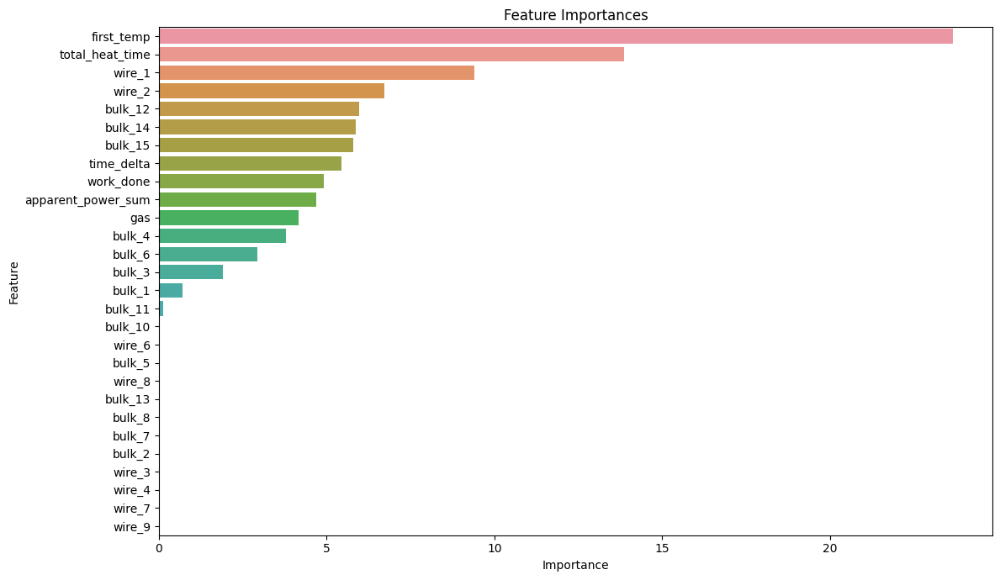

[I 2023-08-21 20:54:25,941] Trial 36 finished with value: 6.4415070326014785 and parameters: {'depth': 4, 'iterations': 464, 'learning_rate': 0.45999999999999996, 'l2_leaf_reg': 15, 'random_strength': 16, 'bootstrap_type': 'Bayesian', 'border_count': 110, 'bagging_temperature': 9.235935789712858}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1241215	test: 7.6408167	best: 7.6408167 (0)	total: 14.9ms	remaining: 13.1s
100:	learn: 6.6877536	test: 6.5073263	best: 6.5073263 (100)	total: 1.34s	remaining: 10.4s
200:	learn: 6.0640426	test: 6.0640936	best: 6.0640936 (200)	total: 2.68s	remaining: 9.1s
300:	learn: 5.6659428	test: 5.7918418	best: 5.7918418 (300)	total: 4.03s	remaining: 7.8s
400:	learn: 5.3684327	test: 5.6192277	best: 5.6192277 (400)	total: 5.41s	remaining: 6.5s
500:	learn: 5.1175847	test: 5.5071871	best: 5.5071871 (500)	total: 6.72s	remaining: 5.12s
600:	learn: 4.9408346	test: 5.4333797	best: 5.4333797 (600)	total: 8.05s	remaining: 3.77s
700:	learn: 4.7731103	test: 5.3918817	best: 5.3918817 (700)	total: 9.35s	remaining: 2.43s
800:	learn: 4.6281707	test: 5.3734998	best: 5.3722620 (784)	total: 10.7s	remaining: 1.09s
882:	learn: 4.5091047	test: 5.3516447	best: 5.3513943 (881)	total: 11.8s	remaining: 0us
bestTest = 5.35139426
bestIteration = 881
Shrink model to first 882 iterations.
Split 1, MAE : 5.35136738169

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9773051	test: 8.2575068	best: 8.2575068 (0)	total: 14.1ms	remaining: 12.5s
100:	learn: 6.6293364	test: 6.9928178	best: 6.9928178 (100)	total: 1.33s	remaining: 10.3s
200:	learn: 6.0358078	test: 6.4610375	best: 6.4610375 (200)	total: 2.65s	remaining: 8.99s
300:	learn: 5.6146130	test: 6.1387705	best: 6.1387705 (300)	total: 4s	remaining: 7.73s
400:	learn: 5.3228646	test: 5.9685513	best: 5.9685513 (400)	total: 5.33s	remaining: 6.41s
500:	learn: 5.0868542	test: 5.8653620	best: 5.8653620 (500)	total: 6.66s	remaining: 5.08s
600:	learn: 4.8836483	test: 5.7588611	best: 5.7588611 (600)	total: 8s	remaining: 3.75s
700:	learn: 4.7196390	test: 5.7055682	best: 5.7029109 (696)	total: 9.34s	remaining: 2.42s
800:	learn: 4.5643600	test: 5.6670982	best: 5.6648572 (797)	total: 10.7s	remaining: 1.09s
882:	learn: 4.4383624	test: 5.6258961	best: 5.6221000 (878)	total: 11.8s	remaining: 0us
bestTest = 5.622100043
bestIteration = 878
Shrink model to first 879 iterations.
Split 2, MAE : 5.6221101517263

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9958668	test: 8.1667306	best: 8.1667306 (0)	total: 13.6ms	remaining: 12s
100:	learn: 6.5807843	test: 7.1845689	best: 7.1845689 (100)	total: 1.32s	remaining: 10.2s
200:	learn: 5.9449496	test: 6.8318452	best: 6.8311121 (199)	total: 2.65s	remaining: 9s
300:	learn: 5.5022642	test: 6.6150077	best: 6.6150077 (300)	total: 4s	remaining: 7.73s
400:	learn: 5.2001883	test: 6.4632824	best: 6.4632824 (400)	total: 5.36s	remaining: 6.44s
500:	learn: 4.9641309	test: 6.3403558	best: 6.3403558 (500)	total: 6.71s	remaining: 5.12s
600:	learn: 4.7480535	test: 6.2572899	best: 6.2572899 (600)	total: 8.06s	remaining: 3.78s
700:	learn: 4.5825903	test: 6.2028298	best: 6.2028298 (700)	total: 9.42s	remaining: 2.44s
800:	learn: 4.4413148	test: 6.1723591	best: 6.1712062 (799)	total: 10.8s	remaining: 1.1s
882:	learn: 4.3191153	test: 6.1548201	best: 6.1496918 (860)	total: 11.9s	remaining: 0us
bestTest = 6.149691781
bestIteration = 860
Shrink model to first 861 iterations.
Split 3, MAE : 6.14973884915855



Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0869750	test: 7.8157545	best: 7.8157545 (0)	total: 13.7ms	remaining: 12.1s
100:	learn: 6.6854279	test: 6.7561653	best: 6.7561653 (100)	total: 1.31s	remaining: 10.1s
200:	learn: 5.9945193	test: 6.2901696	best: 6.2901696 (200)	total: 2.63s	remaining: 8.91s
300:	learn: 5.5459768	test: 6.0364303	best: 6.0364303 (300)	total: 3.96s	remaining: 7.67s
400:	learn: 5.2531950	test: 5.8984656	best: 5.8979268 (397)	total: 5.32s	remaining: 6.39s
500:	learn: 5.0044663	test: 5.8251024	best: 5.8243699 (498)	total: 6.66s	remaining: 5.07s
600:	learn: 4.7842945	test: 5.7803320	best: 5.7803320 (600)	total: 8s	remaining: 3.75s
700:	learn: 4.6109540	test: 5.7605707	best: 5.7596913 (696)	total: 9.35s	remaining: 2.43s
bestTest = 5.75969126
bestIteration = 696
Shrink model to first 697 iterations.
Split 4, MAE : 5.759661088395785

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9623166	test: 8.2972454	best: 8.2972454 (0)	total: 15.4ms	remaining: 13.6s
100:	learn: 6.4973349	test: 7.1580137	best: 7.1580137 (100)	total: 1.43s	remaining: 11.1s
200:	learn: 5.7984007	test: 6.7402540	best: 6.7402540 (200)	total: 2.87s	remaining: 9.75s
300:	learn: 5.3733297	test: 6.5583026	best: 6.5583026 (300)	total: 4.35s	remaining: 8.41s
400:	learn: 5.0778534	test: 6.4539192	best: 6.4539192 (400)	total: 5.76s	remaining: 6.92s
500:	learn: 4.8543539	test: 6.4137468	best: 6.4137061 (499)	total: 7.25s	remaining: 5.53s
600:	learn: 4.6816189	test: 6.3858376	best: 6.3858376 (600)	total: 8.74s	remaining: 4.1s
700:	learn: 4.5103733	test: 6.3561380	best: 6.3561380 (700)	total: 10.2s	remaining: 2.64s
800:	learn: 4.3686040	test: 6.3456210	best: 6.3456210 (800)	total: 11.6s	remaining: 1.19s
bestTest = 6.345571934
bestIteration = 803
Shrink model to first 804 iterations.
Split 5, MAE : 6.345593444803989
Average MAE: 5.845694183156664


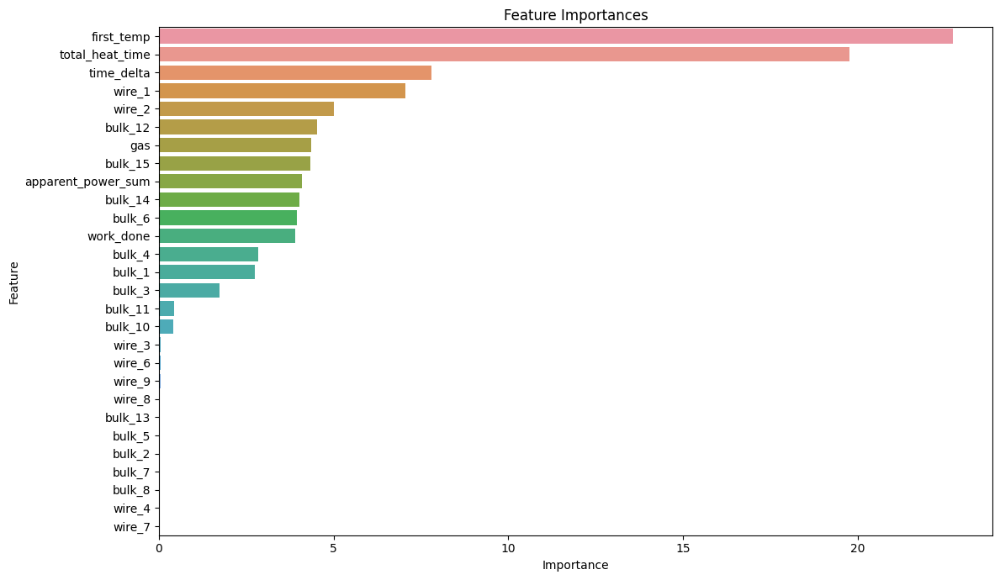

[I 2023-08-21 20:55:26,796] Trial 37 finished with value: 5.845694183156664 and parameters: {'depth': 6, 'iterations': 883, 'learning_rate': 0.43500000000000005, 'l2_leaf_reg': 11, 'random_strength': 11, 'bootstrap_type': 'Bayesian', 'border_count': 133, 'bagging_temperature': 4.102051455767538}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1340735	test: 7.6474400	best: 7.6474400 (0)	total: 12.4ms	remaining: 10s
100:	learn: 7.2247271	test: 6.8381802	best: 6.8381802 (100)	total: 1.17s	remaining: 8.21s
200:	learn: 6.6540377	test: 6.4149831	best: 6.4149831 (200)	total: 2.35s	remaining: 7.14s
300:	learn: 6.3317833	test: 6.1800729	best: 6.1800729 (300)	total: 3.52s	remaining: 5.98s
400:	learn: 6.1061280	test: 6.0145757	best: 6.0145757 (400)	total: 4.67s	remaining: 4.79s
500:	learn: 5.9376401	test: 5.9007656	best: 5.9007656 (500)	total: 5.87s	remaining: 3.64s
600:	learn: 5.7748067	test: 5.7813927	best: 5.7813927 (600)	total: 7.05s	remaining: 2.48s
700:	learn: 5.6496985	test: 5.7095912	best: 5.7095881 (699)	total: 8.23s	remaining: 1.3s
800:	learn: 5.5422094	test: 5.6428810	best: 5.6428810 (800)	total: 9.41s	remaining: 129ms
811:	learn: 5.5301151	test: 5.6366376	best: 5.6366376 (811)	total: 9.54s	remaining: 0us
bestTest = 5.636637603
bestIteration = 811
Split 1, MAE : 5.6365905495617845

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9858924	test: 8.2603365	best: 8.2603365 (0)	total: 9.28ms	remaining: 7.52s
100:	learn: 7.1050043	test: 7.3837527	best: 7.3837527 (100)	total: 1.16s	remaining: 8.14s
200:	learn: 6.6060362	test: 6.8623439	best: 6.8623439 (200)	total: 2.31s	remaining: 7.03s
300:	learn: 6.3005066	test: 6.5767539	best: 6.5767539 (300)	total: 3.47s	remaining: 5.89s
400:	learn: 6.0607248	test: 6.3694169	best: 6.3694169 (400)	total: 4.62s	remaining: 4.73s
500:	learn: 5.8870592	test: 6.2165241	best: 6.2165241 (500)	total: 5.77s	remaining: 3.58s
600:	learn: 5.7371765	test: 6.1042096	best: 6.1042096 (600)	total: 6.93s	remaining: 2.43s
700:	learn: 5.5980570	test: 5.9987289	best: 5.9987289 (700)	total: 8.1s	remaining: 1.28s
800:	learn: 5.4835666	test: 5.9239736	best: 5.9239736 (800)	total: 9.26s	remaining: 127ms
811:	learn: 5.4715946	test: 5.9162311	best: 5.9162311 (811)	total: 9.38s	remaining: 0us
bestTest = 5.916231084
bestIteration = 811
Split 2, MAE : 5.916295054560519

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0067470	test: 8.1698442	best: 8.1698442 (0)	total: 12.8ms	remaining: 10.4s
100:	learn: 7.0756261	test: 7.4898958	best: 7.4898958 (100)	total: 1.14s	remaining: 8.05s
200:	learn: 6.5497430	test: 7.1321248	best: 7.1321248 (200)	total: 2.29s	remaining: 6.95s
300:	learn: 6.2113312	test: 6.9170838	best: 6.9170838 (300)	total: 3.44s	remaining: 5.83s
400:	learn: 5.9827581	test: 6.7700237	best: 6.7700237 (400)	total: 4.59s	remaining: 4.71s
500:	learn: 5.7931113	test: 6.6523745	best: 6.6523745 (500)	total: 5.7s	remaining: 3.54s
600:	learn: 5.6544328	test: 6.5830204	best: 6.5830204 (600)	total: 6.85s	remaining: 2.4s
700:	learn: 5.5219142	test: 6.5074194	best: 6.5074194 (700)	total: 8.02s	remaining: 1.27s
800:	learn: 5.4124544	test: 6.4474657	best: 6.4474657 (800)	total: 9.2s	remaining: 126ms
811:	learn: 5.3980504	test: 6.4348131	best: 6.4348131 (811)	total: 9.33s	remaining: 0us
bestTest = 6.434813054
bestIteration = 811
Split 3, MAE : 6.434768769389301

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0906880	test: 7.8142104	best: 7.8142104 (0)	total: 12.3ms	remaining: 9.95s
100:	learn: 7.1576977	test: 7.0451632	best: 7.0451632 (100)	total: 1.12s	remaining: 7.88s
200:	learn: 6.5957731	test: 6.6083914	best: 6.6083914 (200)	total: 2.22s	remaining: 6.76s
300:	learn: 6.2690174	test: 6.3723748	best: 6.3723748 (300)	total: 3.4s	remaining: 5.77s
400:	learn: 6.0483465	test: 6.2130506	best: 6.2130506 (400)	total: 4.54s	remaining: 4.65s
500:	learn: 5.8435036	test: 6.0996262	best: 6.0996262 (500)	total: 5.69s	remaining: 3.53s
600:	learn: 5.6806070	test: 6.0132173	best: 6.0132173 (600)	total: 6.9s	remaining: 2.42s
700:	learn: 5.5487329	test: 5.9454388	best: 5.9454388 (700)	total: 8.05s	remaining: 1.27s
800:	learn: 5.4295958	test: 5.8992555	best: 5.8992555 (800)	total: 9.22s	remaining: 127ms
811:	learn: 5.4163481	test: 5.8934642	best: 5.8934642 (811)	total: 9.35s	remaining: 0us
bestTest = 5.893464187
bestIteration = 811
Split 4, MAE : 5.893538273535414

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9731834	test: 8.3014351	best: 8.3014351 (0)	total: 13.4ms	remaining: 10.9s
100:	learn: 7.0623810	test: 7.5385265	best: 7.5385265 (100)	total: 1.24s	remaining: 8.75s
200:	learn: 6.5002786	test: 7.0567269	best: 7.0567269 (200)	total: 2.44s	remaining: 7.4s
300:	learn: 6.1561492	test: 6.8442734	best: 6.8442734 (300)	total: 3.68s	remaining: 6.24s
400:	learn: 5.8939089	test: 6.6705301	best: 6.6704845 (399)	total: 4.96s	remaining: 5.08s
500:	learn: 5.7033900	test: 6.5642413	best: 6.5642413 (500)	total: 6.25s	remaining: 3.88s
600:	learn: 5.5343869	test: 6.4886187	best: 6.4886187 (600)	total: 7.48s	remaining: 2.63s
700:	learn: 5.4004830	test: 6.4249808	best: 6.4249808 (700)	total: 8.74s	remaining: 1.38s
800:	learn: 5.2935190	test: 6.3801143	best: 6.3799221 (799)	total: 10.1s	remaining: 138ms
811:	learn: 5.2844506	test: 6.3790353	best: 6.3785962 (808)	total: 10.2s	remaining: 0us
bestTest = 6.378596163
bestIteration = 808
Shrink model to first 809 iterations.
Split 5, MAE : 6.37859528

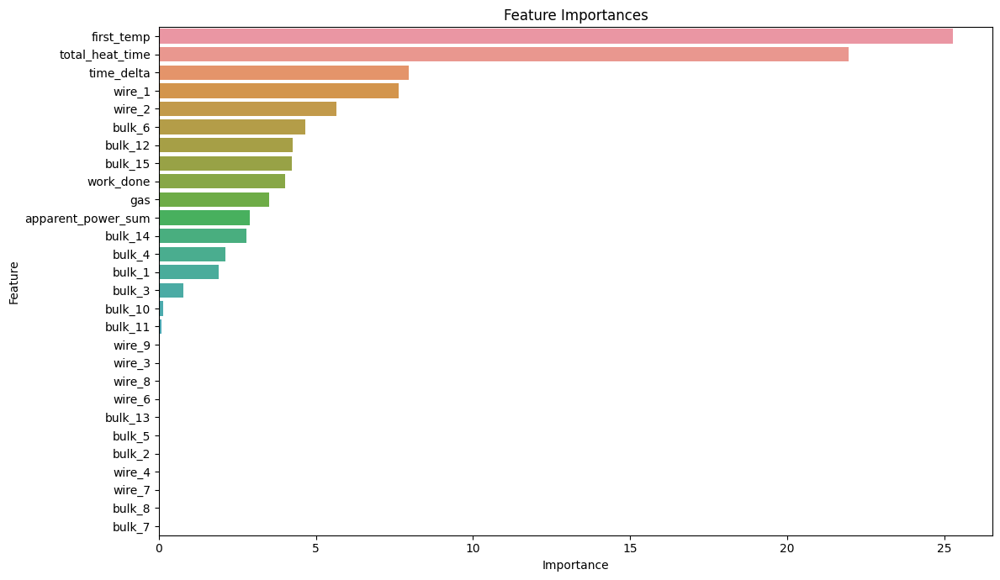

[I 2023-08-21 20:56:17,567] Trial 38 finished with value: 6.051957586012177 and parameters: {'depth': 5, 'iterations': 812, 'learning_rate': 0.45999999999999996, 'l2_leaf_reg': 90, 'random_strength': 23, 'bootstrap_type': 'Bayesian', 'border_count': 154, 'bagging_temperature': 3.7917629166352174}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1387433	test: 7.6526956	best: 7.6526956 (0)	total: 9.66ms	remaining: 7.37s
100:	learn: 7.6948109	test: 7.2301505	best: 7.2301505 (100)	total: 1.04s	remaining: 6.8s
200:	learn: 7.3816328	test: 6.9568172	best: 6.9568172 (200)	total: 2.07s	remaining: 5.79s
300:	learn: 7.1628029	test: 6.7806288	best: 6.7806288 (300)	total: 3.04s	remaining: 4.68s
400:	learn: 7.0079876	test: 6.6561968	best: 6.6561968 (400)	total: 4.08s	remaining: 3.69s
500:	learn: 6.8811676	test: 6.5673080	best: 6.5673080 (500)	total: 5.14s	remaining: 2.7s
600:	learn: 6.7775833	test: 6.4889542	best: 6.4889542 (600)	total: 6.2s	remaining: 1.68s
700:	learn: 6.6723500	test: 6.3923431	best: 6.3923431 (700)	total: 7.29s	remaining: 655ms
763:	learn: 6.6054982	test: 6.3461655	best: 6.3461655 (763)	total: 7.99s	remaining: 0us
bestTest = 6.346165523
bestIteration = 763
Split 1, MAE : 6.34606153907023

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9900340	test: 8.2637670	best: 8.2637670 (0)	total: 11.2ms	remaining: 8.58s
100:	learn: 7.6043472	test: 7.8657366	best: 7.8657366 (100)	total: 1.04s	remaining: 6.84s
200:	learn: 7.3359585	test: 7.5885650	best: 7.5885650 (200)	total: 2.1s	remaining: 5.87s
300:	learn: 7.1495233	test: 7.3883459	best: 7.3883459 (300)	total: 3.17s	remaining: 4.88s
400:	learn: 6.9892662	test: 7.2144660	best: 7.2144660 (400)	total: 4.25s	remaining: 3.85s
500:	learn: 6.8656659	test: 7.0802124	best: 7.0802124 (500)	total: 5.29s	remaining: 2.78s
600:	learn: 6.7507692	test: 6.9613922	best: 6.9613922 (600)	total: 6.32s	remaining: 1.71s
700:	learn: 6.6306520	test: 6.8252163	best: 6.8252163 (700)	total: 7.38s	remaining: 664ms
763:	learn: 6.5585363	test: 6.7499105	best: 6.7499105 (763)	total: 8.03s	remaining: 0us
bestTest = 6.749910458
bestIteration = 763
Split 2, MAE : 6.749874294705679

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0107786	test: 8.1743164	best: 8.1743164 (0)	total: 11.2ms	remaining: 8.53s
100:	learn: 7.6242861	test: 7.8794337	best: 7.8794337 (100)	total: 978ms	remaining: 6.42s
200:	learn: 7.3195153	test: 7.6548061	best: 7.6548061 (200)	total: 2.03s	remaining: 5.68s
300:	learn: 7.0891698	test: 7.4822386	best: 7.4822386 (300)	total: 3.08s	remaining: 4.74s
400:	learn: 6.9368366	test: 7.3864291	best: 7.3860836 (399)	total: 4.1s	remaining: 3.71s
500:	learn: 6.8040850	test: 7.2999432	best: 7.2999432 (500)	total: 5.21s	remaining: 2.73s
600:	learn: 6.6774626	test: 7.2147220	best: 7.2147220 (600)	total: 6.32s	remaining: 1.71s
700:	learn: 6.5766651	test: 7.1641164	best: 7.1641164 (700)	total: 7.44s	remaining: 669ms
763:	learn: 6.5219089	test: 7.1399506	best: 7.1399506 (763)	total: 8.12s	remaining: 0us
bestTest = 7.13995064
bestIteration = 763
Split 3, MAE : 7.139956806046462

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0989226	test: 7.8228465	best: 7.8228465 (0)	total: 11.2ms	remaining: 8.54s
100:	learn: 7.6962506	test: 7.4614153	best: 7.4614153 (100)	total: 1.01s	remaining: 6.65s
200:	learn: 7.3690195	test: 7.2056443	best: 7.2056443 (200)	total: 2.09s	remaining: 5.85s
300:	learn: 7.1485719	test: 7.0048358	best: 7.0048358 (300)	total: 3.15s	remaining: 4.84s
400:	learn: 7.0001134	test: 6.8874603	best: 6.8874603 (400)	total: 4.2s	remaining: 3.8s
500:	learn: 6.8728180	test: 6.7833112	best: 6.7833112 (500)	total: 5.27s	remaining: 2.77s
600:	learn: 6.7285135	test: 6.6773191	best: 6.6773191 (600)	total: 6.34s	remaining: 1.72s
700:	learn: 6.6265597	test: 6.5972655	best: 6.5972655 (700)	total: 7.41s	remaining: 666ms
763:	learn: 6.5699331	test: 6.5548292	best: 6.5546735 (761)	total: 8.06s	remaining: 0us
bestTest = 6.554673469
bestIteration = 761
Shrink model to first 762 iterations.
Split 4, MAE : 6.554641122690899

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9795370	test: 8.3075555	best: 8.3075555 (0)	total: 10.8ms	remaining: 8.22s
100:	learn: 7.5478047	test: 7.9254557	best: 7.9254557 (100)	total: 1.06s	remaining: 6.99s
200:	learn: 7.2284246	test: 7.6207703	best: 7.6207703 (200)	total: 2.17s	remaining: 6.08s
300:	learn: 7.0126064	test: 7.4250425	best: 7.4250425 (300)	total: 3.25s	remaining: 5s
400:	learn: 6.8259619	test: 7.2728005	best: 7.2728005 (400)	total: 4.39s	remaining: 3.98s
500:	learn: 6.7024614	test: 7.1851526	best: 7.1851526 (500)	total: 5.54s	remaining: 2.91s
600:	learn: 6.5815279	test: 7.1044620	best: 7.1044620 (600)	total: 6.72s	remaining: 1.82s
700:	learn: 6.4732527	test: 7.0406466	best: 7.0403281 (699)	total: 7.92s	remaining: 712ms
763:	learn: 6.4048359	test: 7.0094022	best: 7.0094022 (763)	total: 8.67s	remaining: 0us
bestTest = 7.00940222
bestIteration = 763
Split 5, MAE : 7.009263535284176
Average MAE: 6.759959459559489


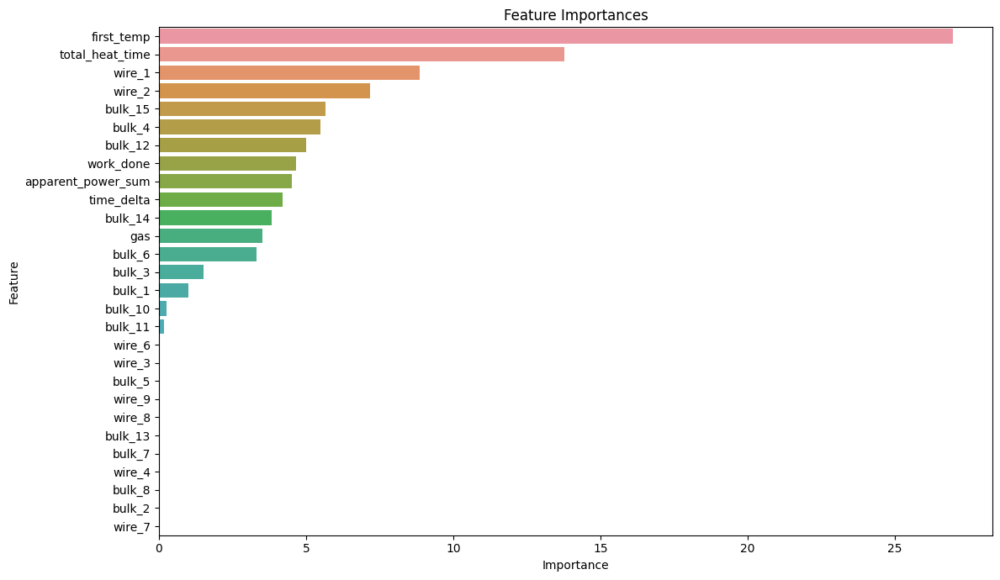

[I 2023-08-21 20:57:01,622] Trial 39 finished with value: 6.759959459559489 and parameters: {'depth': 4, 'iterations': 764, 'learning_rate': 0.39, 'l2_leaf_reg': 116, 'random_strength': 43, 'bootstrap_type': 'Bayesian', 'border_count': 103, 'bagging_temperature': 11.915919346506735}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1362606	test: 7.6485928	best: 7.6485928 (0)	total: 9.7ms	remaining: 9.12s
100:	learn: 7.3460324	test: 6.9199534	best: 6.9199534 (100)	total: 931ms	remaining: 7.75s
200:	learn: 6.9596107	test: 6.6250616	best: 6.6250616 (200)	total: 1.86s	remaining: 6.84s
300:	learn: 6.7254500	test: 6.4374804	best: 6.4374804 (300)	total: 2.8s	remaining: 5.95s
400:	learn: 6.5383998	test: 6.2955144	best: 6.2955144 (400)	total: 3.71s	remaining: 5s
500:	learn: 6.3723912	test: 6.1777610	best: 6.1777610 (500)	total: 4.67s	remaining: 4.1s
600:	learn: 6.2426807	test: 6.0770491	best: 6.0769526 (598)	total: 5.64s	remaining: 3.19s
700:	learn: 6.1268943	test: 5.9924617	best: 5.9924533 (699)	total: 6.64s	remaining: 2.27s
800:	learn: 6.0327772	test: 5.9229159	best: 5.9221128 (796)	total: 7.65s	remaining: 1.34s
900:	learn: 5.9499725	test: 5.8647741	best: 5.8646940 (899)	total: 8.65s	remaining: 384ms
940:	learn: 5.9272874	test: 5.8577024	best: 5.8573358 (934)	total: 9.05s	remaining: 0us
bestTest = 5.85733583

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9847001	test: 8.2572864	best: 8.2572864 (0)	total: 10.3ms	remaining: 9.65s
100:	learn: 7.3165478	test: 7.5742229	best: 7.5742229 (100)	total: 931ms	remaining: 7.74s
200:	learn: 6.9349682	test: 7.1465655	best: 7.1465655 (200)	total: 1.85s	remaining: 6.82s
300:	learn: 6.6917845	test: 6.8747873	best: 6.8737338 (297)	total: 2.76s	remaining: 5.86s
400:	learn: 6.4964987	test: 6.6731160	best: 6.6728320 (399)	total: 3.7s	remaining: 4.98s
500:	learn: 6.3429388	test: 6.5111032	best: 6.5111032 (500)	total: 4.65s	remaining: 4.08s
600:	learn: 6.1898749	test: 6.3691084	best: 6.3691084 (600)	total: 5.64s	remaining: 3.19s
700:	learn: 6.0748885	test: 6.2705379	best: 6.2705379 (700)	total: 6.6s	remaining: 2.26s
800:	learn: 5.9768546	test: 6.1734280	best: 6.1734280 (800)	total: 7.56s	remaining: 1.32s
900:	learn: 5.8833260	test: 6.0977493	best: 6.0972813 (899)	total: 8.56s	remaining: 380ms
940:	learn: 5.8463984	test: 6.0718179	best: 6.0717088 (933)	total: 8.96s	remaining: 0us
bestTest = 6.0717

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9998326	test: 8.1662856	best: 8.1662856 (0)	total: 10.5ms	remaining: 9.88s
100:	learn: 7.2821964	test: 7.6132029	best: 7.6129986 (99)	total: 934ms	remaining: 7.76s
200:	learn: 6.8627362	test: 7.3406706	best: 7.3402600 (199)	total: 1.82s	remaining: 6.7s
300:	learn: 6.6217509	test: 7.2045773	best: 7.2045773 (300)	total: 2.77s	remaining: 5.88s
400:	learn: 6.4203457	test: 7.0822082	best: 7.0819935 (399)	total: 3.7s	remaining: 4.99s
500:	learn: 6.2648376	test: 6.9822288	best: 6.9822288 (500)	total: 4.65s	remaining: 4.09s
600:	learn: 6.1131138	test: 6.8936918	best: 6.8936918 (600)	total: 5.61s	remaining: 3.17s
700:	learn: 5.9982136	test: 6.8275598	best: 6.8275598 (700)	total: 6.58s	remaining: 2.25s
800:	learn: 5.8959884	test: 6.7825281	best: 6.7823077 (799)	total: 7.57s	remaining: 1.32s
900:	learn: 5.8024009	test: 6.7353998	best: 6.7346422 (893)	total: 8.59s	remaining: 382ms
940:	learn: 5.7691025	test: 6.7183401	best: 6.7182100 (938)	total: 8.99s	remaining: 0us
bestTest = 6.71820

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0989555	test: 7.8238013	best: 7.8238013 (0)	total: 10.1ms	remaining: 9.54s
100:	learn: 7.3546238	test: 7.2031390	best: 7.2031390 (100)	total: 933ms	remaining: 7.76s
200:	learn: 6.9696811	test: 6.8813778	best: 6.8813778 (200)	total: 1.87s	remaining: 6.87s
300:	learn: 6.7318016	test: 6.6878859	best: 6.6878859 (300)	total: 2.82s	remaining: 5.99s
400:	learn: 6.5425109	test: 6.5323220	best: 6.5323220 (400)	total: 3.78s	remaining: 5.09s
500:	learn: 6.3762475	test: 6.4109939	best: 6.4109939 (500)	total: 4.75s	remaining: 4.17s
600:	learn: 6.2321902	test: 6.3337276	best: 6.3337276 (600)	total: 5.76s	remaining: 3.26s
700:	learn: 6.0954399	test: 6.2376344	best: 6.2376344 (700)	total: 6.78s	remaining: 2.32s
800:	learn: 5.9844107	test: 6.1726144	best: 6.1718715 (799)	total: 7.75s	remaining: 1.35s
900:	learn: 5.8820950	test: 6.1078723	best: 6.1078723 (900)	total: 8.71s	remaining: 387ms
940:	learn: 5.8457584	test: 6.0911402	best: 6.0910813 (939)	total: 9.11s	remaining: 0us
bestTest = 6.09

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9714368	test: 8.3015614	best: 8.3015614 (0)	total: 10.6ms	remaining: 9.99s
100:	learn: 7.2210888	test: 7.6272450	best: 7.6272450 (100)	total: 958ms	remaining: 7.97s
200:	learn: 6.7952929	test: 7.2599466	best: 7.2595117 (198)	total: 1.92s	remaining: 7.07s
300:	learn: 6.5502933	test: 7.0763185	best: 7.0763185 (300)	total: 2.92s	remaining: 6.2s
400:	learn: 6.3296273	test: 6.9405069	best: 6.9394889 (398)	total: 3.9s	remaining: 5.26s
500:	learn: 6.1604027	test: 6.8277854	best: 6.8277854 (500)	total: 4.94s	remaining: 4.34s
600:	learn: 6.0388637	test: 6.7622856	best: 6.7622758 (599)	total: 5.99s	remaining: 3.39s
700:	learn: 5.9078426	test: 6.6840294	best: 6.6840294 (700)	total: 7.03s	remaining: 2.4s
800:	learn: 5.8038828	test: 6.6363932	best: 6.6363932 (800)	total: 8.05s	remaining: 1.41s
900:	learn: 5.6985919	test: 6.5752977	best: 6.5750255 (899)	total: 9.07s	remaining: 403ms
940:	learn: 5.6593330	test: 6.5601779	best: 6.5599211 (939)	total: 9.48s	remaining: 0us
bestTest = 6.55992

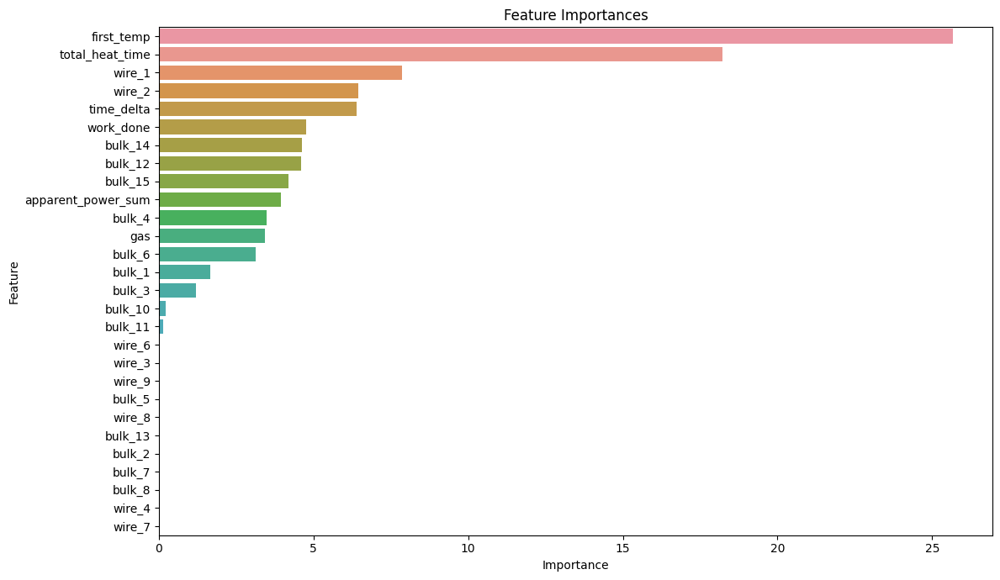

[I 2023-08-21 20:57:50,446] Trial 40 finished with value: 6.259641746995035 and parameters: {'depth': 3, 'iterations': 941, 'learning_rate': 0.43500000000000005, 'l2_leaf_reg': 24, 'random_strength': 106, 'bootstrap_type': 'Bayesian', 'border_count': 74, 'bagging_temperature': 7.919984009461313}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1317000	test: 7.6461500	best: 7.6461500 (0)	total: 15ms	remaining: 14.5s
100:	learn: 6.8389667	test: 6.5372031	best: 6.5372031 (100)	total: 1.42s	remaining: 12.2s
200:	learn: 6.1691275	test: 6.0419614	best: 6.0419614 (200)	total: 2.88s	remaining: 11s
300:	learn: 5.7793361	test: 5.7600014	best: 5.7600014 (300)	total: 4.37s	remaining: 9.68s
400:	learn: 5.5317274	test: 5.5975562	best: 5.5975562 (400)	total: 5.86s	remaining: 8.29s
500:	learn: 5.2916507	test: 5.4873428	best: 5.4867300 (496)	total: 7.38s	remaining: 6.87s
600:	learn: 5.1222083	test: 5.4176092	best: 5.4174675 (599)	total: 8.88s	remaining: 5.42s
700:	learn: 4.9820219	test: 5.3808321	best: 5.3808321 (700)	total: 10.3s	remaining: 3.94s
800:	learn: 4.8625271	test: 5.3348343	best: 5.3348343 (800)	total: 11.8s	remaining: 2.46s
900:	learn: 4.7432555	test: 5.3195388	best: 5.3193027 (898)	total: 13.2s	remaining: 982ms
967:	learn: 4.6624467	test: 5.3185976	best: 5.3174216 (958)	total: 14.2s	remaining: 0us
bestTest = 5.317421

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9833774	test: 8.2595201	best: 8.2595201 (0)	total: 15.8ms	remaining: 15.2s
100:	learn: 6.7538306	test: 7.1220088	best: 7.1220088 (100)	total: 1.41s	remaining: 12.1s
200:	learn: 6.0655474	test: 6.4797440	best: 6.4797440 (200)	total: 2.82s	remaining: 10.8s
300:	learn: 5.6563474	test: 6.1553770	best: 6.1553770 (300)	total: 4.23s	remaining: 9.38s
400:	learn: 5.3609341	test: 5.9721393	best: 5.9721393 (400)	total: 5.58s	remaining: 7.89s
500:	learn: 5.1179441	test: 5.8381652	best: 5.8381652 (500)	total: 6.99s	remaining: 6.51s
600:	learn: 4.9078823	test: 5.7436107	best: 5.7434764 (599)	total: 8.43s	remaining: 5.14s
700:	learn: 4.7664481	test: 5.6943177	best: 5.6943177 (700)	total: 9.93s	remaining: 3.78s
800:	learn: 4.6280614	test: 5.6533990	best: 5.6533990 (800)	total: 11.4s	remaining: 2.37s
900:	learn: 4.5091632	test: 5.6413865	best: 5.6401038 (892)	total: 12.8s	remaining: 951ms
bestTest = 5.638741829
bestIteration = 906
Shrink model to first 907 iterations.
Split 2, MAE : 5.63872

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0014004	test: 8.1644186	best: 8.1644186 (0)	total: 16.8ms	remaining: 16.2s
100:	learn: 6.6773183	test: 7.1824647	best: 7.1824647 (100)	total: 1.31s	remaining: 11.2s
200:	learn: 5.9484622	test: 6.6231196	best: 6.6231196 (200)	total: 2.68s	remaining: 10.2s
300:	learn: 5.5139150	test: 6.3708027	best: 6.3708027 (300)	total: 4.14s	remaining: 9.17s
400:	learn: 5.2236605	test: 6.2407492	best: 6.2407492 (400)	total: 5.57s	remaining: 7.88s
500:	learn: 4.9973043	test: 6.1480765	best: 6.1480765 (500)	total: 7.01s	remaining: 6.54s
600:	learn: 4.8320715	test: 6.0790050	best: 6.0790050 (600)	total: 8.48s	remaining: 5.18s
700:	learn: 4.6652324	test: 6.0368044	best: 6.0368044 (700)	total: 9.98s	remaining: 3.8s
800:	learn: 4.5155823	test: 6.0124743	best: 6.0124743 (800)	total: 11.5s	remaining: 2.4s
900:	learn: 4.3831768	test: 5.9990395	best: 5.9981588 (886)	total: 12.9s	remaining: 962ms
967:	learn: 4.3086337	test: 5.9872144	best: 5.9872144 (967)	total: 13.9s	remaining: 0us
bestTest = 5.9872

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0888805	test: 7.8142279	best: 7.8142279 (0)	total: 15.1ms	remaining: 14.6s
100:	learn: 6.7876015	test: 6.7527557	best: 6.7527557 (100)	total: 1.42s	remaining: 12.2s
200:	learn: 6.1087660	test: 6.2616816	best: 6.2616816 (200)	total: 2.79s	remaining: 10.6s
300:	learn: 5.6081121	test: 5.9673553	best: 5.9673553 (300)	total: 4.22s	remaining: 9.36s
400:	learn: 5.3193709	test: 5.8731251	best: 5.8731026 (399)	total: 5.68s	remaining: 8.03s
500:	learn: 5.0873092	test: 5.8184390	best: 5.8184390 (500)	total: 7.17s	remaining: 6.68s
600:	learn: 4.9203699	test: 5.7851664	best: 5.7851664 (600)	total: 8.66s	remaining: 5.29s
700:	learn: 4.7836921	test: 5.7576659	best: 5.7574137 (697)	total: 10.2s	remaining: 3.88s
bestTest = 5.746980864
bestIteration = 731
Shrink model to first 732 iterations.
Split 4, MAE : 5.747116455502859

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9719800	test: 8.3014758	best: 8.3014758 (0)	total: 11.8ms	remaining: 11.4s
100:	learn: 6.6910338	test: 7.2833034	best: 7.2833034 (100)	total: 1.5s	remaining: 12.8s
200:	learn: 5.9674717	test: 6.8310014	best: 6.8310014 (200)	total: 3.06s	remaining: 11.7s
300:	learn: 5.4804982	test: 6.5721506	best: 6.5721506 (300)	total: 4.66s	remaining: 10.3s
400:	learn: 5.2041961	test: 6.4905466	best: 6.4905466 (400)	total: 6.3s	remaining: 8.91s
500:	learn: 4.9712138	test: 6.4070512	best: 6.4070512 (500)	total: 7.94s	remaining: 7.4s
600:	learn: 4.8103320	test: 6.3881990	best: 6.3869867 (595)	total: 9.59s	remaining: 5.86s
700:	learn: 4.7053287	test: 6.3684138	best: 6.3674429 (689)	total: 11.2s	remaining: 4.26s
800:	learn: 4.6311219	test: 6.3543533	best: 6.3536124 (799)	total: 12.8s	remaining: 2.67s
900:	learn: 4.5393530	test: 6.3493849	best: 6.3472388 (861)	total: 14.5s	remaining: 1.07s
967:	learn: 4.4745061	test: 6.3363556	best: 6.3363528 (966)	total: 15.6s	remaining: 0us
bestTest = 6.33635

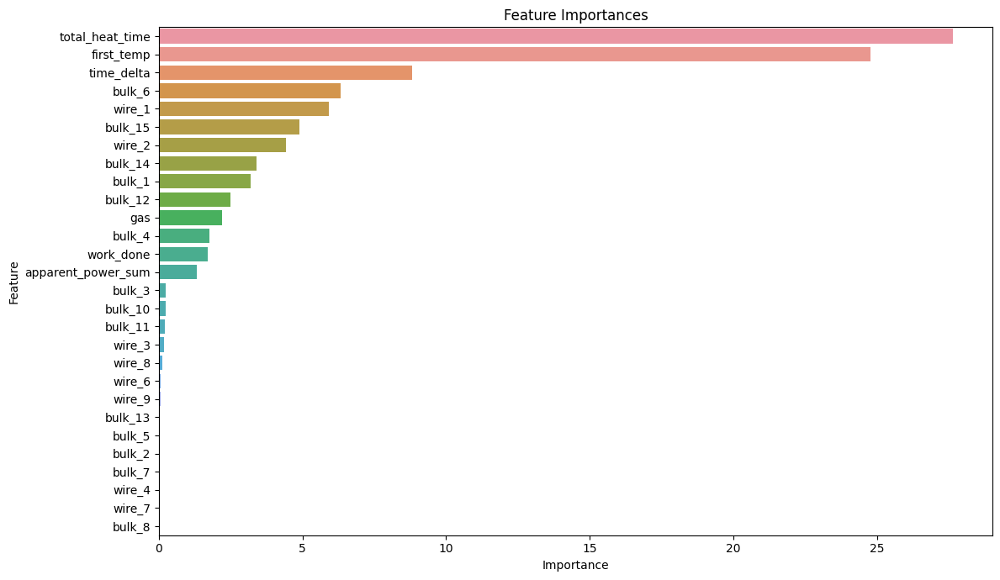

[I 2023-08-21 20:59:01,975] Trial 41 finished with value: 5.8053423861546465 and parameters: {'depth': 7, 'iterations': 968, 'learning_rate': 0.33999999999999997, 'l2_leaf_reg': 31, 'random_strength': 25, 'bootstrap_type': 'Bayesian', 'border_count': 52, 'bagging_temperature': 0.16068703926548367}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1354129	test: 7.6521570	best: 7.6521570 (0)	total: 15.5ms	remaining: 14.8s
100:	learn: 7.1317098	test: 6.8126679	best: 6.8126679 (100)	total: 1.44s	remaining: 12.1s
200:	learn: 6.5173371	test: 6.3455031	best: 6.3455031 (200)	total: 2.85s	remaining: 10.6s
300:	learn: 6.1506764	test: 6.0924810	best: 6.0924810 (300)	total: 4.31s	remaining: 9.31s
400:	learn: 5.8820027	test: 5.8992630	best: 5.8992630 (400)	total: 5.8s	remaining: 7.96s
500:	learn: 5.6812714	test: 5.7776886	best: 5.7776886 (500)	total: 7.31s	remaining: 6.57s
600:	learn: 5.4993429	test: 5.6669597	best: 5.6669597 (600)	total: 8.81s	remaining: 5.13s
700:	learn: 5.3531517	test: 5.5816822	best: 5.5816822 (700)	total: 10.3s	remaining: 3.68s
800:	learn: 5.2478045	test: 5.5264518	best: 5.5264518 (800)	total: 11.8s	remaining: 2.2s
900:	learn: 5.1521399	test: 5.4789994	best: 5.4789994 (900)	total: 13.2s	remaining: 735ms
950:	learn: 5.1029338	test: 5.4599018	best: 5.4599018 (950)	total: 14s	remaining: 0us
bestTest = 5.459901

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9825746	test: 8.2577467	best: 8.2577467 (0)	total: 15.5ms	remaining: 14.7s
100:	learn: 7.0019405	test: 7.3838268	best: 7.3838268 (100)	total: 1.45s	remaining: 12.2s
200:	learn: 6.4263032	test: 6.8322698	best: 6.8322698 (200)	total: 2.92s	remaining: 10.9s
300:	learn: 6.0696883	test: 6.5123854	best: 6.5123854 (300)	total: 4.42s	remaining: 9.56s
400:	learn: 5.8217301	test: 6.3023454	best: 6.3023454 (400)	total: 5.9s	remaining: 8.09s
500:	learn: 5.6119943	test: 6.1479702	best: 6.1479702 (500)	total: 7.3s	remaining: 6.56s
600:	learn: 5.4255508	test: 6.0160279	best: 6.0160279 (600)	total: 8.8s	remaining: 5.13s
700:	learn: 5.2744691	test: 5.9189628	best: 5.9189628 (700)	total: 10.3s	remaining: 3.67s
800:	learn: 5.1592694	test: 5.8487049	best: 5.8487049 (800)	total: 11.7s	remaining: 2.2s
900:	learn: 5.0588834	test: 5.8107389	best: 5.8107389 (900)	total: 13.2s	remaining: 731ms
950:	learn: 5.0165080	test: 5.7953084	best: 5.7953084 (950)	total: 13.8s	remaining: 0us
bestTest = 5.795308

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0047616	test: 8.1702003	best: 8.1702003 (0)	total: 15.6ms	remaining: 14.8s
100:	learn: 6.9598559	test: 7.4250866	best: 7.4250866 (100)	total: 1.44s	remaining: 12.1s
200:	learn: 6.3845807	test: 7.0224302	best: 7.0224302 (200)	total: 2.91s	remaining: 10.8s
300:	learn: 5.9864815	test: 6.7677544	best: 6.7677544 (300)	total: 4.42s	remaining: 9.53s
400:	learn: 5.7131999	test: 6.6010364	best: 6.6010364 (400)	total: 5.93s	remaining: 8.13s
500:	learn: 5.4973099	test: 6.4819511	best: 6.4819511 (500)	total: 7.47s	remaining: 6.71s
600:	learn: 5.3232723	test: 6.3933329	best: 6.3933329 (600)	total: 8.93s	remaining: 5.2s
700:	learn: 5.1731826	test: 6.3181502	best: 6.3181502 (700)	total: 10.4s	remaining: 3.7s
800:	learn: 5.0527235	test: 6.2541385	best: 6.2541385 (800)	total: 11.9s	remaining: 2.23s
900:	learn: 4.9477525	test: 6.1986689	best: 6.1986689 (900)	total: 13.4s	remaining: 744ms
950:	learn: 4.8998099	test: 6.1826158	best: 6.1826158 (950)	total: 14.2s	remaining: 0us
bestTest = 6.1826

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0918123	test: 7.8173856	best: 7.8173856 (0)	total: 15.2ms	remaining: 14.4s
100:	learn: 7.0618735	test: 6.9995279	best: 6.9995279 (100)	total: 1.46s	remaining: 12.3s
200:	learn: 6.4948645	test: 6.5922838	best: 6.5922838 (200)	total: 2.93s	remaining: 10.9s
300:	learn: 6.1597355	test: 6.3470354	best: 6.3470354 (300)	total: 4.44s	remaining: 9.6s
400:	learn: 5.8848055	test: 6.1694743	best: 6.1694743 (400)	total: 5.9s	remaining: 8.1s
500:	learn: 5.6637552	test: 6.0278615	best: 6.0278615 (500)	total: 7.4s	remaining: 6.64s
600:	learn: 5.4641826	test: 5.9288590	best: 5.9288590 (600)	total: 8.91s	remaining: 5.19s
700:	learn: 5.2970581	test: 5.8625239	best: 5.8625239 (700)	total: 10.4s	remaining: 3.72s
800:	learn: 5.1667370	test: 5.8220608	best: 5.8216437 (798)	total: 12s	remaining: 2.24s
900:	learn: 5.0476296	test: 5.8062190	best: 5.8062190 (900)	total: 13.5s	remaining: 748ms
950:	learn: 4.9937472	test: 5.7970157	best: 5.7968161 (944)	total: 14.2s	remaining: 0us
bestTest = 5.79681607

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9690958	test: 8.2998510	best: 8.2998510 (0)	total: 17.7ms	remaining: 16.8s
100:	learn: 6.9713591	test: 7.5147312	best: 7.5147312 (100)	total: 1.6s	remaining: 13.4s
200:	learn: 6.3778142	test: 7.0662442	best: 7.0662442 (200)	total: 3.1s	remaining: 11.6s
300:	learn: 5.9502821	test: 6.7854621	best: 6.7854621 (300)	total: 4.7s	remaining: 10.1s
400:	learn: 5.6504715	test: 6.6214747	best: 6.6214747 (400)	total: 6.34s	remaining: 8.7s
500:	learn: 5.4156691	test: 6.5167187	best: 6.5166907 (499)	total: 8.02s	remaining: 7.2s
600:	learn: 5.2385697	test: 6.4577412	best: 6.4561697 (597)	total: 9.63s	remaining: 5.61s
700:	learn: 5.0995849	test: 6.4052278	best: 6.4052278 (700)	total: 11.3s	remaining: 4.02s
800:	learn: 4.9759339	test: 6.3695265	best: 6.3695265 (800)	total: 13s	remaining: 2.43s
900:	learn: 4.8701886	test: 6.3410659	best: 6.3410659 (900)	total: 14.6s	remaining: 812ms
950:	learn: 4.8273388	test: 6.3280696	best: 6.3280128 (943)	total: 15.5s	remaining: 0us
bestTest = 6.328012751

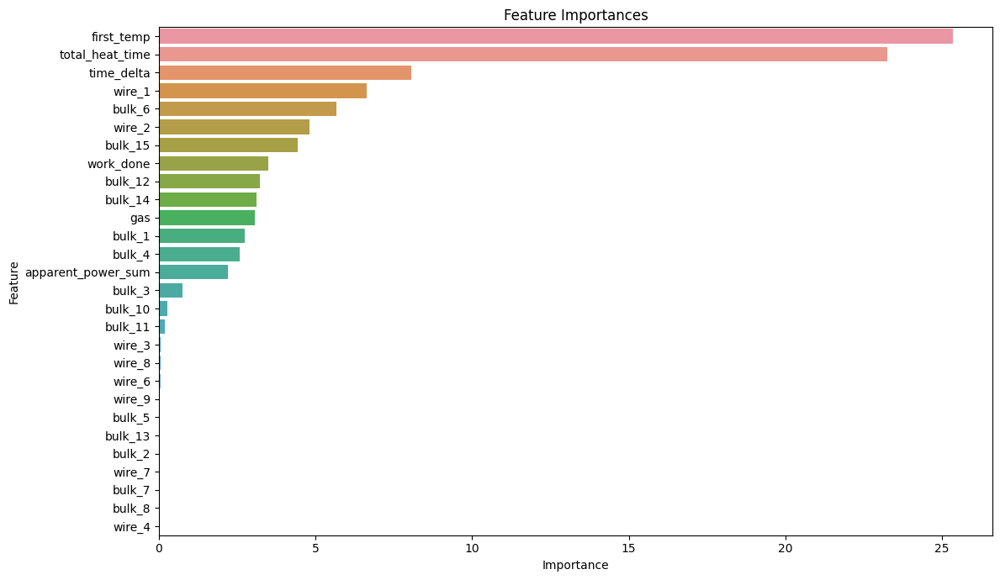

[I 2023-08-21 21:00:16,554] Trial 42 finished with value: 5.912555957516605 and parameters: {'depth': 7, 'iterations': 951, 'learning_rate': 0.355, 'l2_leaf_reg': 63, 'random_strength': 1, 'bootstrap_type': 'Bayesian', 'border_count': 44, 'bagging_temperature': 2.565165650764713}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1320377	test: 7.6477380	best: 7.6477380 (0)	total: 16.1ms	remaining: 14.3s
100:	learn: 7.1600505	test: 6.8354450	best: 6.8354450 (100)	total: 1.45s	remaining: 11.3s
200:	learn: 6.5301249	test: 6.3721249	best: 6.3721249 (200)	total: 2.93s	remaining: 9.99s
300:	learn: 6.1495205	test: 6.0928077	best: 6.0928077 (300)	total: 4.44s	remaining: 8.64s
400:	learn: 5.8806688	test: 5.9149313	best: 5.9149313 (400)	total: 5.96s	remaining: 7.23s
500:	learn: 5.6621363	test: 5.7761251	best: 5.7761251 (500)	total: 7.5s	remaining: 5.78s
600:	learn: 5.4924695	test: 5.6749621	best: 5.6743262 (599)	total: 9.04s	remaining: 4.3s
700:	learn: 5.3457725	test: 5.5916745	best: 5.5916745 (700)	total: 10.6s	remaining: 2.81s
800:	learn: 5.2168613	test: 5.5301745	best: 5.5301745 (800)	total: 12.1s	remaining: 1.29s
886:	learn: 5.1186548	test: 5.4993176	best: 5.4983945 (881)	total: 13.4s	remaining: 0us
bestTest = 5.498394548
bestIteration = 881
Shrink model to first 882 iterations.
Split 1, MAE : 5.498350120

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9854721	test: 8.2621756	best: 8.2621756 (0)	total: 15.2ms	remaining: 13.5s
100:	learn: 7.0646388	test: 7.4197708	best: 7.4197708 (100)	total: 1.44s	remaining: 11.2s
200:	learn: 6.4875120	test: 6.8465118	best: 6.8465118 (200)	total: 2.9s	remaining: 9.9s
300:	learn: 6.1216780	test: 6.5467883	best: 6.5467883 (300)	total: 4.39s	remaining: 8.54s
400:	learn: 5.8506952	test: 6.3318718	best: 6.3318718 (400)	total: 5.88s	remaining: 7.12s
500:	learn: 5.6391349	test: 6.1902408	best: 6.1902408 (500)	total: 7.36s	remaining: 5.67s
600:	learn: 5.4559622	test: 6.0717298	best: 6.0717298 (600)	total: 8.88s	remaining: 4.22s
700:	learn: 5.2995626	test: 5.9856083	best: 5.9856083 (700)	total: 10.4s	remaining: 2.76s
800:	learn: 5.1583818	test: 5.9273454	best: 5.9265633 (798)	total: 11.9s	remaining: 1.28s
886:	learn: 5.0447541	test: 5.8771280	best: 5.8768811 (884)	total: 13.2s	remaining: 0us
bestTest = 5.876881072
bestIteration = 884
Shrink model to first 885 iterations.
Split 2, MAE : 5.876905791

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0068640	test: 8.1703108	best: 8.1703108 (0)	total: 15.5ms	remaining: 13.8s
100:	learn: 7.0127142	test: 7.4643765	best: 7.4643765 (100)	total: 1.46s	remaining: 11.3s
200:	learn: 6.4065127	test: 7.0642195	best: 7.0642195 (200)	total: 2.91s	remaining: 9.92s
300:	learn: 6.0219565	test: 6.8363600	best: 6.8363600 (300)	total: 4.41s	remaining: 8.58s
400:	learn: 5.7536985	test: 6.6784591	best: 6.6784591 (400)	total: 5.93s	remaining: 7.18s
500:	learn: 5.5356915	test: 6.5567281	best: 6.5567281 (500)	total: 7.46s	remaining: 5.75s
600:	learn: 5.3611488	test: 6.4587095	best: 6.4587095 (600)	total: 9s	remaining: 4.29s
700:	learn: 5.2016546	test: 6.3858016	best: 6.3858016 (700)	total: 10.5s	remaining: 2.79s
800:	learn: 5.0576235	test: 6.3176207	best: 6.3176207 (800)	total: 12s	remaining: 1.29s
886:	learn: 4.9521723	test: 6.2786211	best: 6.2786211 (886)	total: 13.4s	remaining: 0us
bestTest = 6.278621116
bestIteration = 886
Split 3, MAE : 6.278547245322628

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0909715	test: 7.8152767	best: 7.8152767 (0)	total: 14.3ms	remaining: 12.7s
100:	learn: 7.1010627	test: 7.0411468	best: 7.0411468 (100)	total: 1.38s	remaining: 10.8s
200:	learn: 6.4951263	test: 6.6221264	best: 6.6221264 (200)	total: 2.72s	remaining: 9.28s
300:	learn: 6.1208893	test: 6.3690059	best: 6.3690059 (300)	total: 4.17s	remaining: 8.11s
400:	learn: 5.8350208	test: 6.2093436	best: 6.2093436 (400)	total: 5.68s	remaining: 6.89s
500:	learn: 5.5903625	test: 6.0749287	best: 6.0749287 (500)	total: 7.13s	remaining: 5.49s
600:	learn: 5.3725897	test: 5.9725679	best: 5.9725679 (600)	total: 8.62s	remaining: 4.1s
700:	learn: 5.2254900	test: 5.9059441	best: 5.9059441 (700)	total: 10.1s	remaining: 2.69s
800:	learn: 5.0845406	test: 5.8519466	best: 5.8519466 (800)	total: 11.7s	remaining: 1.25s
886:	learn: 4.9788964	test: 5.8348006	best: 5.8348006 (886)	total: 13s	remaining: 0us
bestTest = 5.834800633
bestIteration = 886
Split 4, MAE : 5.834867403336955

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9711904	test: 8.3000011	best: 8.3000011 (0)	total: 18.9ms	remaining: 16.7s
100:	learn: 6.9994246	test: 7.5224694	best: 7.5224694 (100)	total: 1.62s	remaining: 12.6s
200:	learn: 6.3779031	test: 7.0552424	best: 7.0552424 (200)	total: 3.29s	remaining: 11.2s
300:	learn: 5.9497823	test: 6.7925604	best: 6.7925604 (300)	total: 4.96s	remaining: 9.65s
400:	learn: 5.6357768	test: 6.6286046	best: 6.6286046 (400)	total: 6.63s	remaining: 8.04s
500:	learn: 5.3921518	test: 6.5364878	best: 6.5360374 (499)	total: 8.29s	remaining: 6.39s
600:	learn: 5.2053340	test: 6.4611452	best: 6.4611452 (600)	total: 9.89s	remaining: 4.71s
700:	learn: 5.0689495	test: 6.4099837	best: 6.4099837 (700)	total: 11.4s	remaining: 3.03s
800:	learn: 4.9356935	test: 6.3640908	best: 6.3633774 (797)	total: 13s	remaining: 1.4s
886:	learn: 4.8402785	test: 6.3276493	best: 6.3276493 (886)	total: 14.4s	remaining: 0us
bestTest = 6.327649347
bestIteration = 886
Split 5, MAE : 6.3276447253093915
Average MAE: 5.963263057251519


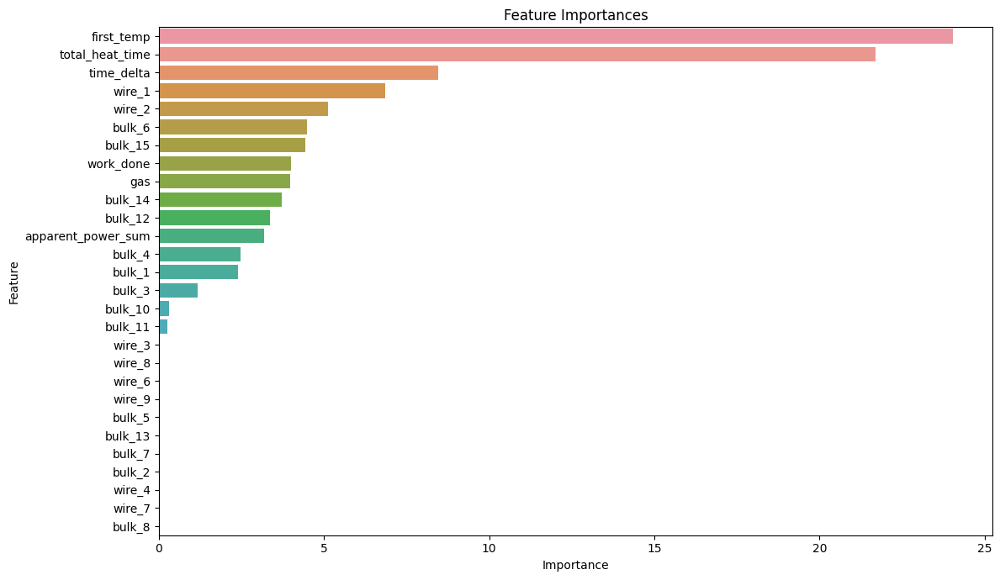

[I 2023-08-21 21:01:26,770] Trial 43 finished with value: 5.963263057251519 and parameters: {'depth': 7, 'iterations': 887, 'learning_rate': 0.375, 'l2_leaf_reg': 48, 'random_strength': 24, 'bootstrap_type': 'Bayesian', 'border_count': 114, 'bagging_temperature': 3.676411231420012}. Best is trial 14 with value: 5.793887755949863.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1276593	test: 7.6423326	best: 7.6423326 (0)	total: 14.5ms	remaining: 12s
100:	learn: 6.4507572	test: 6.2475047	best: 6.2475047 (100)	total: 1.26s	remaining: 9.1s
200:	learn: 5.7653826	test: 5.7496814	best: 5.7496814 (200)	total: 2.54s	remaining: 7.92s
300:	learn: 5.3760270	test: 5.5300594	best: 5.5300594 (300)	total: 3.84s	remaining: 6.73s
400:	learn: 5.0934316	test: 5.3892308	best: 5.3891972 (397)	total: 5.16s	remaining: 5.49s
500:	learn: 4.9159501	test: 5.3147228	best: 5.3147228 (500)	total: 6.48s	remaining: 4.23s
600:	learn: 4.7651336	test: 5.2865291	best: 5.2855039 (597)	total: 7.76s	remaining: 2.93s
700:	learn: 4.6009548	test: 5.2727883	best: 5.2720629 (699)	total: 9s	remaining: 1.63s
800:	learn: 4.4630661	test: 5.2683252	best: 5.2658926 (786)	total: 10.2s	remaining: 344ms
827:	learn: 4.4185334	test: 5.2644931	best: 5.2639213 (825)	total: 10.6s	remaining: 0us
bestTest = 5.263921262
bestIteration = 825
Shrink model to first 826 iterations.
Split 1, MAE : 5.2638140532382

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9717848	test: 8.2446079	best: 8.2446079 (0)	total: 9.61ms	remaining: 7.95s
100:	learn: 6.3770988	test: 6.7623637	best: 6.7623637 (100)	total: 1.15s	remaining: 8.25s
200:	learn: 5.7012559	test: 6.1539191	best: 6.1539191 (200)	total: 2.41s	remaining: 7.52s
300:	learn: 5.3166073	test: 5.8982486	best: 5.8982486 (300)	total: 3.58s	remaining: 6.28s
400:	learn: 5.0372120	test: 5.7527758	best: 5.7527758 (400)	total: 4.86s	remaining: 5.17s
500:	learn: 4.8300077	test: 5.6738904	best: 5.6733577 (499)	total: 6.21s	remaining: 4.05s
600:	learn: 4.6404243	test: 5.6361245	best: 5.6361245 (600)	total: 7.47s	remaining: 2.82s
700:	learn: 4.5007293	test: 5.5988574	best: 5.5988574 (700)	total: 8.78s	remaining: 1.59s
800:	learn: 4.3737716	test: 5.5813069	best: 5.5798497 (798)	total: 10.1s	remaining: 339ms
827:	learn: 4.3440428	test: 5.5800267	best: 5.5798361 (826)	total: 10.4s	remaining: 0us
bestTest = 5.579836083
bestIteration = 826
Shrink model to first 827 iterations.
Split 2, MAE : 5.5797606

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9975978	test: 8.1598317	best: 8.1598317 (0)	total: 11.3ms	remaining: 9.38s
100:	learn: 6.2742032	test: 6.9093951	best: 6.9093951 (100)	total: 1.16s	remaining: 8.38s
200:	learn: 5.5338305	test: 6.4312839	best: 6.4312839 (200)	total: 2.38s	remaining: 7.44s
300:	learn: 5.1516355	test: 6.2142058	best: 6.2142058 (300)	total: 3.72s	remaining: 6.52s
400:	learn: 4.9029812	test: 6.1218199	best: 6.1218199 (400)	total: 5.1s	remaining: 5.43s
500:	learn: 4.6949454	test: 6.0566420	best: 6.0552793 (497)	total: 6.39s	remaining: 4.17s
600:	learn: 4.5076395	test: 6.0295067	best: 6.0295067 (600)	total: 7.68s	remaining: 2.9s
700:	learn: 4.3501187	test: 5.9928863	best: 5.9928863 (700)	total: 8.98s	remaining: 1.63s
800:	learn: 4.2052799	test: 5.9725898	best: 5.9725898 (800)	total: 10.3s	remaining: 346ms
827:	learn: 4.1780391	test: 5.9713971	best: 5.9688339 (815)	total: 10.6s	remaining: 0us
bestTest = 5.968833945
bestIteration = 815
Shrink model to first 816 iterations.
Split 3, MAE : 5.968819422

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0845724	test: 7.8106661	best: 7.8106661 (0)	total: 13.6ms	remaining: 11.3s
100:	learn: 6.3800095	test: 6.4879880	best: 6.4879880 (100)	total: 1.18s	remaining: 8.47s
200:	learn: 5.6303693	test: 6.0039554	best: 6.0039554 (200)	total: 2.39s	remaining: 7.46s
300:	learn: 5.2104576	test: 5.7993925	best: 5.7993925 (300)	total: 3.72s	remaining: 6.52s
400:	learn: 4.9308114	test: 5.7253225	best: 5.7240688 (398)	total: 5s	remaining: 5.33s
500:	learn: 4.7368707	test: 5.7042068	best: 5.6993861 (482)	total: 6.23s	remaining: 4.06s
600:	learn: 4.5668791	test: 5.6828020	best: 5.6809598 (597)	total: 7.51s	remaining: 2.84s
700:	learn: 4.4132679	test: 5.6847685	best: 5.6704859 (656)	total: 8.79s	remaining: 1.59s
bestTest = 5.670485924
bestIteration = 656
Shrink model to first 657 iterations.
Split 4, MAE : 5.67044453675579

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9668781	test: 8.2973198	best: 8.2973198 (0)	total: 14.8ms	remaining: 12.2s
100:	learn: 6.2499020	test: 6.9351014	best: 6.9351014 (100)	total: 1.33s	remaining: 9.55s
200:	learn: 5.4764683	test: 6.4780659	best: 6.4780659 (200)	total: 2.73s	remaining: 8.52s
300:	learn: 5.0753444	test: 6.3156324	best: 6.3156324 (300)	total: 4.15s	remaining: 7.27s
400:	learn: 4.8388063	test: 6.2894540	best: 6.2853197 (384)	total: 5.58s	remaining: 5.94s
bestTest = 6.285319712
bestIteration = 384
Shrink model to first 385 iterations.
Split 5, MAE : 6.285260881797826
Average MAE: 5.753619916542549


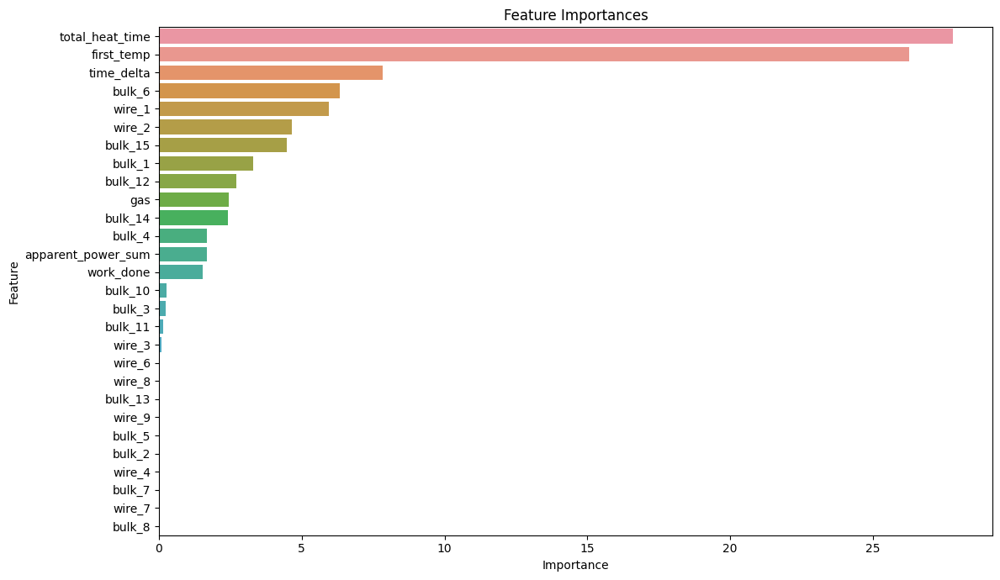

[I 2023-08-21 21:02:16,069] Trial 44 finished with value: 5.753619916542549 and parameters: {'depth': 6, 'iterations': 828, 'learning_rate': 0.475, 'l2_leaf_reg': 20, 'random_strength': 10, 'bootstrap_type': 'Bernoulli', 'border_count': 90, 'subsample': 0.17}. Best is trial 44 with value: 5.753619916542549.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1355523	test: 7.6509552	best: 7.6509552 (0)	total: 13.4ms	remaining: 9.82s
100:	learn: 7.2265863	test: 6.8694925	best: 6.8694925 (100)	total: 1.27s	remaining: 7.95s
200:	learn: 6.6393493	test: 6.4266536	best: 6.4266536 (200)	total: 2.56s	remaining: 6.8s
300:	learn: 6.2913358	test: 6.1704158	best: 6.1704158 (300)	total: 3.88s	remaining: 5.59s
400:	learn: 6.0640580	test: 6.0223931	best: 6.0223931 (400)	total: 5.21s	remaining: 4.33s
500:	learn: 5.8691669	test: 5.8877925	best: 5.8875918 (499)	total: 6.52s	remaining: 3.05s
600:	learn: 5.7098411	test: 5.8014654	best: 5.8014654 (600)	total: 7.83s	remaining: 1.75s
700:	learn: 5.5687146	test: 5.7157874	best: 5.7157874 (700)	total: 9.12s	remaining: 442ms
734:	learn: 5.5327527	test: 5.6936434	best: 5.6936434 (734)	total: 9.56s	remaining: 0us
bestTest = 5.69364339
bestIteration = 734
Split 1, MAE : 5.693619260710967

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9818586	test: 8.2580475	best: 8.2580475 (0)	total: 13.7ms	remaining: 10s
100:	learn: 7.0806757	test: 7.4097841	best: 7.4097841 (100)	total: 1.25s	remaining: 7.86s
200:	learn: 6.5564179	test: 6.8951888	best: 6.8951888 (200)	total: 2.54s	remaining: 6.74s
300:	learn: 6.2170631	test: 6.5781418	best: 6.5781418 (300)	total: 3.84s	remaining: 5.54s
400:	learn: 5.9853460	test: 6.3857793	best: 6.3857793 (400)	total: 5.16s	remaining: 4.3s
500:	learn: 5.7817103	test: 6.2047339	best: 6.2047339 (500)	total: 6.47s	remaining: 3.02s
600:	learn: 5.6143559	test: 6.0767315	best: 6.0767315 (600)	total: 7.8s	remaining: 1.74s
700:	learn: 5.4700317	test: 5.9725919	best: 5.9725919 (700)	total: 9.08s	remaining: 440ms
734:	learn: 5.4256117	test: 5.9416357	best: 5.9409096 (732)	total: 9.53s	remaining: 0us
bestTest = 5.940909574
bestIteration = 732
Shrink model to first 733 iterations.
Split 2, MAE : 5.940928777114319

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0061620	test: 8.1664270	best: 8.1664270 (0)	total: 13.4ms	remaining: 9.82s
100:	learn: 7.0631347	test: 7.4935572	best: 7.4935572 (100)	total: 1.27s	remaining: 8s
200:	learn: 6.5019069	test: 7.0776045	best: 7.0776045 (200)	total: 2.56s	remaining: 6.8s
300:	learn: 6.1339453	test: 6.8359004	best: 6.8359004 (300)	total: 3.86s	remaining: 5.56s
400:	learn: 5.8712307	test: 6.6497540	best: 6.6497540 (400)	total: 5.16s	remaining: 4.29s
500:	learn: 5.6630516	test: 6.5046618	best: 6.5043945 (498)	total: 6.45s	remaining: 3.01s
600:	learn: 5.4953610	test: 6.4123458	best: 6.4123458 (600)	total: 7.71s	remaining: 1.72s
700:	learn: 5.3624910	test: 6.3388406	best: 6.3387182 (699)	total: 9.02s	remaining: 437ms
734:	learn: 5.3240240	test: 6.3203258	best: 6.3203258 (734)	total: 9.46s	remaining: 0us
bestTest = 6.320325791
bestIteration = 734
Split 3, MAE : 6.320363440827475

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0932159	test: 7.8160015	best: 7.8160015 (0)	total: 13.2ms	remaining: 9.66s
100:	learn: 7.1561415	test: 7.0447184	best: 7.0447184 (100)	total: 1.25s	remaining: 7.88s
200:	learn: 6.6163810	test: 6.6593039	best: 6.6593039 (200)	total: 2.54s	remaining: 6.75s
300:	learn: 6.2895224	test: 6.4103029	best: 6.4103029 (300)	total: 3.83s	remaining: 5.53s
400:	learn: 6.0056396	test: 6.2284904	best: 6.2284904 (400)	total: 5.13s	remaining: 4.27s
500:	learn: 5.8263924	test: 6.1211162	best: 6.1211162 (500)	total: 6.44s	remaining: 3.01s
600:	learn: 5.6664784	test: 6.0345698	best: 6.0345698 (600)	total: 7.71s	remaining: 1.72s
700:	learn: 5.5049066	test: 5.9447260	best: 5.9447260 (700)	total: 9s	remaining: 436ms
734:	learn: 5.4534698	test: 5.9195957	best: 5.9195957 (734)	total: 9.44s	remaining: 0us
bestTest = 5.919595653
bestIteration = 734
Split 4, MAE : 5.919610330123865

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9760249	test: 8.3031967	best: 8.3031967 (0)	total: 11ms	remaining: 8.09s
100:	learn: 7.0520007	test: 7.5608079	best: 7.5608079 (100)	total: 1.35s	remaining: 8.46s
200:	learn: 6.4924150	test: 7.1118697	best: 7.1118697 (200)	total: 2.63s	remaining: 6.98s
300:	learn: 6.1290428	test: 6.8655045	best: 6.8655045 (300)	total: 3.97s	remaining: 5.72s
400:	learn: 5.8469877	test: 6.6876684	best: 6.6876684 (400)	total: 5.3s	remaining: 4.41s
500:	learn: 5.6284799	test: 6.5629455	best: 6.5629455 (500)	total: 6.72s	remaining: 3.14s
600:	learn: 5.4530301	test: 6.4815646	best: 6.4815646 (600)	total: 8.08s	remaining: 1.8s
700:	learn: 5.3097152	test: 6.4119186	best: 6.4119186 (700)	total: 9.39s	remaining: 456ms
734:	learn: 5.2658833	test: 6.3980881	best: 6.3980881 (734)	total: 9.86s	remaining: 0us
bestTest = 6.398088126
bestIteration = 734
Split 5, MAE : 6.398038039066904
Average MAE: 6.054511969568706


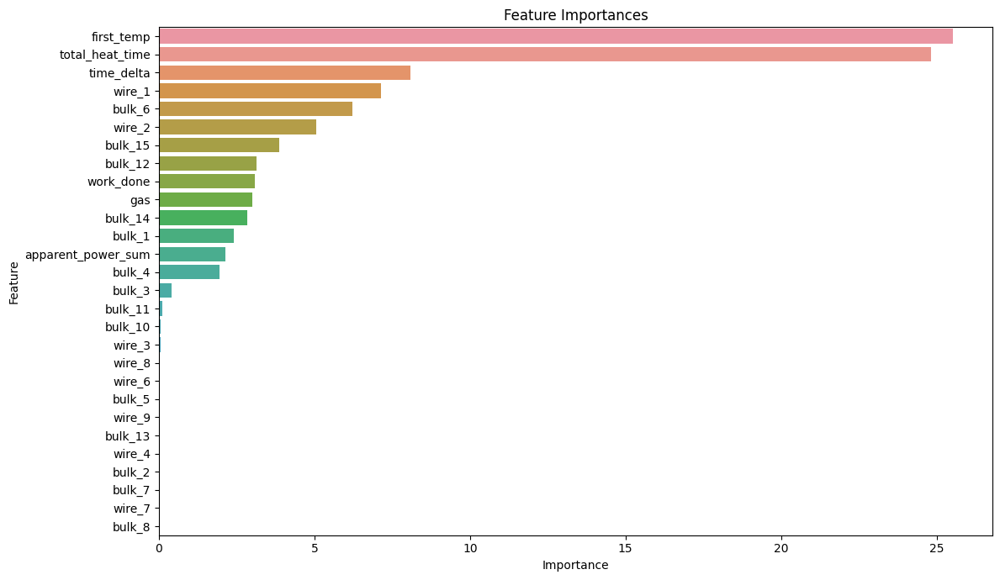

[I 2023-08-21 21:03:06,927] Trial 45 finished with value: 6.054511969568706 and parameters: {'depth': 6, 'iterations': 735, 'learning_rate': 0.485, 'l2_leaf_reg': 150, 'random_strength': 10, 'bootstrap_type': 'Bernoulli', 'border_count': 82, 'subsample': 0.13}. Best is trial 44 with value: 5.753619916542549.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1410257	test: 7.6559114	best: 7.6559114 (0)	total: 10.8ms	remaining: 8.84s
100:	learn: 6.7601986	test: 6.5080399	best: 6.5080399 (100)	total: 1.22s	remaining: 8.73s
200:	learn: 6.0855060	test: 6.0053522	best: 6.0053522 (200)	total: 2.44s	remaining: 7.54s
300:	learn: 5.6887515	test: 5.7215335	best: 5.7215335 (300)	total: 3.64s	remaining: 6.3s
400:	learn: 5.4401271	test: 5.5576000	best: 5.5576000 (400)	total: 4.92s	remaining: 5.16s
500:	learn: 5.2379786	test: 5.4436409	best: 5.4436409 (500)	total: 6.22s	remaining: 3.99s
600:	learn: 5.0594572	test: 5.3714491	best: 5.3714491 (600)	total: 7.54s	remaining: 2.77s
700:	learn: 4.9253578	test: 5.3301197	best: 5.3293922 (699)	total: 8.88s	remaining: 1.53s
800:	learn: 4.8037768	test: 5.3093052	best: 5.3075116 (794)	total: 10.2s	remaining: 267ms
821:	learn: 4.7782615	test: 5.3031254	best: 5.3031254 (821)	total: 10.5s	remaining: 0us
bestTest = 5.30312542
bestIteration = 821
Split 1, MAE : 5.303174335038707

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9884788	test: 8.2637978	best: 8.2637978 (0)	total: 12ms	remaining: 9.86s
100:	learn: 6.7110797	test: 7.0325581	best: 7.0325581 (100)	total: 1.23s	remaining: 8.81s
200:	learn: 6.0554875	test: 6.4178232	best: 6.4178232 (200)	total: 2.51s	remaining: 7.75s
300:	learn: 5.6632295	test: 6.1231350	best: 6.1231350 (300)	total: 3.81s	remaining: 6.59s
400:	learn: 5.3835579	test: 5.9360603	best: 5.9360603 (400)	total: 5.09s	remaining: 5.34s
500:	learn: 5.1753784	test: 5.8229092	best: 5.8229092 (500)	total: 6.33s	remaining: 4.06s
600:	learn: 5.0208998	test: 5.7245100	best: 5.7245100 (600)	total: 7.62s	remaining: 2.8s
700:	learn: 4.8848833	test: 5.7019232	best: 5.7008448 (695)	total: 8.92s	remaining: 1.54s
800:	learn: 4.7701712	test: 5.6797805	best: 5.6794444 (799)	total: 10.2s	remaining: 268ms
821:	learn: 4.7414842	test: 5.6722821	best: 5.6722821 (821)	total: 10.5s	remaining: 0us
bestTest = 5.672282134
bestIteration = 821
Split 2, MAE : 5.672310259389737

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0120886	test: 8.1717239	best: 8.1717239 (0)	total: 13.1ms	remaining: 10.7s
100:	learn: 6.5858646	test: 7.1060920	best: 7.1060920 (100)	total: 1.24s	remaining: 8.84s
200:	learn: 5.8281754	test: 6.5937864	best: 6.5937864 (200)	total: 2.51s	remaining: 7.74s
300:	learn: 5.4422578	test: 6.3499459	best: 6.3499459 (300)	total: 3.8s	remaining: 6.58s
400:	learn: 5.1819870	test: 6.2184366	best: 6.2184366 (400)	total: 5.15s	remaining: 5.41s
500:	learn: 4.9898494	test: 6.1485110	best: 6.1485110 (500)	total: 6.47s	remaining: 4.15s
600:	learn: 4.8291464	test: 6.0939067	best: 6.0927762 (599)	total: 7.84s	remaining: 2.88s
700:	learn: 4.6871280	test: 6.0505014	best: 6.0505014 (700)	total: 9.17s	remaining: 1.58s
800:	learn: 4.5596295	test: 6.0228051	best: 6.0216488 (798)	total: 10.5s	remaining: 275ms
821:	learn: 4.5354396	test: 6.0198069	best: 6.0198069 (821)	total: 10.8s	remaining: 0us
bestTest = 6.01980687
bestIteration = 821
Split 3, MAE : 6.019876304110259

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0980203	test: 7.8224172	best: 7.8224172 (0)	total: 11.9ms	remaining: 9.75s
100:	learn: 6.6835930	test: 6.6898348	best: 6.6898348 (100)	total: 1.26s	remaining: 9.01s
200:	learn: 5.9986307	test: 6.1773541	best: 6.1773541 (200)	total: 2.51s	remaining: 7.74s
300:	learn: 5.5734315	test: 5.9082158	best: 5.9082158 (300)	total: 3.81s	remaining: 6.59s
400:	learn: 5.3101780	test: 5.7840401	best: 5.7837051 (397)	total: 4.95s	remaining: 5.2s
500:	learn: 5.0767540	test: 5.7415705	best: 5.7399246 (496)	total: 6.24s	remaining: 4s
600:	learn: 4.8993679	test: 5.7354663	best: 5.7304852 (597)	total: 7.49s	remaining: 2.75s
bestTest = 5.730485237
bestIteration = 597
Shrink model to first 598 iterations.
Split 4, MAE : 5.730526629091045

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9738785	test: 8.3017241	best: 8.3017241 (0)	total: 14.8ms	remaining: 12.2s
100:	learn: 6.5945411	test: 7.1840645	best: 7.1840645 (100)	total: 1.24s	remaining: 8.88s
200:	learn: 5.8533697	test: 6.6839403	best: 6.6839403 (200)	total: 2.64s	remaining: 8.15s
300:	learn: 5.4338710	test: 6.4551791	best: 6.4551791 (300)	total: 4.09s	remaining: 7.07s
400:	learn: 5.1407076	test: 6.3346747	best: 6.3346747 (400)	total: 5.46s	remaining: 5.73s
500:	learn: 4.9317155	test: 6.3191549	best: 6.3151764 (495)	total: 6.87s	remaining: 4.4s
600:	learn: 4.7958253	test: 6.3093416	best: 6.3091311 (599)	total: 8.34s	remaining: 3.07s
700:	learn: 4.6972394	test: 6.3034759	best: 6.3019648 (692)	total: 9.81s	remaining: 1.69s
800:	learn: 4.5955929	test: 6.2907694	best: 6.2887258 (792)	total: 11.3s	remaining: 296ms
821:	learn: 4.5709369	test: 6.2947212	best: 6.2887258 (792)	total: 11.6s	remaining: 0us
bestTest = 6.288725754
bestIteration = 792
Shrink model to first 793 iterations.
Split 5, MAE : 6.28882559

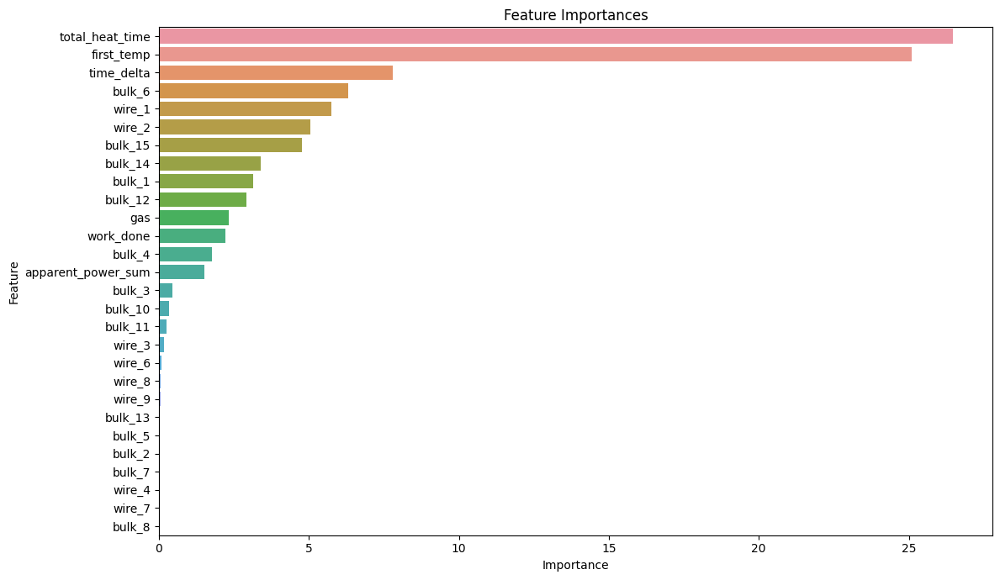

[I 2023-08-21 21:04:01,287] Trial 46 finished with value: 5.802942624310384 and parameters: {'depth': 6, 'iterations': 822, 'learning_rate': 0.41000000000000003, 'l2_leaf_reg': 29, 'random_strength': 39, 'bootstrap_type': 'Bernoulli', 'border_count': 32, 'subsample': 0.17}. Best is trial 44 with value: 5.753619916542549.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1402012	test: 7.6552559	best: 7.6552559 (0)	total: 11.5ms	remaining: 9.5s
100:	learn: 6.8590815	test: 6.5759200	best: 6.5759200 (100)	total: 1.15s	remaining: 8.31s
200:	learn: 6.2157678	test: 6.0658592	best: 6.0658592 (200)	total: 2.31s	remaining: 7.24s
300:	learn: 5.8617061	test: 5.7747366	best: 5.7747366 (300)	total: 3.47s	remaining: 6.09s
400:	learn: 5.6364900	test: 5.6193711	best: 5.6193711 (400)	total: 4.62s	remaining: 4.94s
500:	learn: 5.4479522	test: 5.4942466	best: 5.4942466 (500)	total: 5.76s	remaining: 3.79s
600:	learn: 5.2774317	test: 5.4294636	best: 5.4294636 (600)	total: 6.91s	remaining: 2.63s
700:	learn: 5.1534976	test: 5.3597160	best: 5.3597160 (700)	total: 8.1s	remaining: 1.49s
800:	learn: 5.0539015	test: 5.3217672	best: 5.3217672 (800)	total: 9.2s	remaining: 333ms
829:	learn: 5.0266348	test: 5.3110187	best: 5.3092559 (827)	total: 9.54s	remaining: 0us
bestTest = 5.309255868
bestIteration = 827
Shrink model to first 828 iterations.
Split 1, MAE : 5.3092934495

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9885271	test: 8.2676348	best: 8.2676348 (0)	total: 11.9ms	remaining: 9.9s
100:	learn: 6.8012254	test: 7.1088916	best: 7.1088916 (100)	total: 1.02s	remaining: 7.36s
200:	learn: 6.1599559	test: 6.4792508	best: 6.4792508 (200)	total: 2.05s	remaining: 6.43s
300:	learn: 5.8165141	test: 6.1656400	best: 6.1655721 (299)	total: 3.21s	remaining: 5.65s
400:	learn: 5.5644181	test: 5.9605975	best: 5.9605975 (400)	total: 4.36s	remaining: 4.66s
500:	learn: 5.3861982	test: 5.8397860	best: 5.8395265 (499)	total: 5.42s	remaining: 3.56s
600:	learn: 5.2368977	test: 5.7504120	best: 5.7504120 (600)	total: 6.56s	remaining: 2.5s
700:	learn: 5.1200941	test: 5.7068207	best: 5.7054888 (694)	total: 7.74s	remaining: 1.42s
800:	learn: 5.0103520	test: 5.6654200	best: 5.6654200 (800)	total: 8.89s	remaining: 322ms
829:	learn: 4.9878581	test: 5.6560870	best: 5.6560870 (829)	total: 9.25s	remaining: 0us
bestTest = 5.656087006
bestIteration = 829
Split 2, MAE : 5.656148884673965

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0115338	test: 8.1709880	best: 8.1709880 (0)	total: 12.7ms	remaining: 10.6s
100:	learn: 6.6931870	test: 7.2005577	best: 7.2005577 (100)	total: 1.19s	remaining: 8.59s
200:	learn: 6.0201575	test: 6.7416782	best: 6.7416782 (200)	total: 2.4s	remaining: 7.5s
300:	learn: 5.6470080	test: 6.5010003	best: 6.5002504 (299)	total: 3.58s	remaining: 6.3s
400:	learn: 5.3920667	test: 6.3606363	best: 6.3606363 (400)	total: 4.72s	remaining: 5.05s
500:	learn: 5.2042003	test: 6.2473459	best: 6.2473459 (500)	total: 5.87s	remaining: 3.86s
600:	learn: 5.0706684	test: 6.1776085	best: 6.1776085 (600)	total: 7.05s	remaining: 2.69s
700:	learn: 4.9636437	test: 6.1244145	best: 6.1244145 (700)	total: 8.25s	remaining: 1.52s
800:	learn: 4.8657514	test: 6.0962362	best: 6.0957108 (792)	total: 9.46s	remaining: 343ms
829:	learn: 4.8417829	test: 6.0858438	best: 6.0858438 (829)	total: 9.82s	remaining: 0us
bestTest = 6.085843761
bestIteration = 829
Split 3, MAE : 6.085886565038531

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0978061	test: 7.8215255	best: 7.8215255 (0)	total: 14ms	remaining: 11.6s
100:	learn: 6.7880754	test: 6.7428399	best: 6.7428399 (100)	total: 1.21s	remaining: 8.71s
200:	learn: 6.1718148	test: 6.2519826	best: 6.2519826 (200)	total: 2.42s	remaining: 7.56s
300:	learn: 5.7906250	test: 6.0011442	best: 6.0011442 (300)	total: 3.65s	remaining: 6.42s
400:	learn: 5.5158574	test: 5.8354141	best: 5.8354141 (400)	total: 4.89s	remaining: 5.23s
500:	learn: 5.3132494	test: 5.7619713	best: 5.7619713 (500)	total: 6.1s	remaining: 4s
600:	learn: 5.1466482	test: 5.7236868	best: 5.7206161 (594)	total: 7.36s	remaining: 2.8s
bestTest = 5.720616132
bestIteration = 594
Shrink model to first 595 iterations.
Split 4, MAE : 5.720637407791745

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9758786	test: 8.3030332	best: 8.3030332 (0)	total: 13.8ms	remaining: 11.4s
100:	learn: 6.7023466	test: 7.2336194	best: 7.2336194 (100)	total: 1.28s	remaining: 9.24s
200:	learn: 6.0038264	test: 6.7159634	best: 6.7159634 (200)	total: 2.59s	remaining: 8.1s
300:	learn: 5.5961848	test: 6.4834616	best: 6.4834616 (300)	total: 3.93s	remaining: 6.91s
400:	learn: 5.3362966	test: 6.3599924	best: 6.3599924 (400)	total: 5.27s	remaining: 5.64s
500:	learn: 5.1612525	test: 6.3028270	best: 6.3020918 (499)	total: 6.54s	remaining: 4.29s
600:	learn: 5.0128875	test: 6.2597670	best: 6.2597670 (600)	total: 7.85s	remaining: 2.99s
700:	learn: 4.8841167	test: 6.2529535	best: 6.2520275 (699)	total: 9.17s	remaining: 1.69s
800:	learn: 4.8019608	test: 6.2419181	best: 6.2405571 (793)	total: 10.5s	remaining: 379ms
829:	learn: 4.7756675	test: 6.2391147	best: 6.2389365 (828)	total: 10.9s	remaining: 0us
bestTest = 6.238936501
bestIteration = 828
Shrink model to first 829 iterations.
Split 5, MAE : 6.23894801

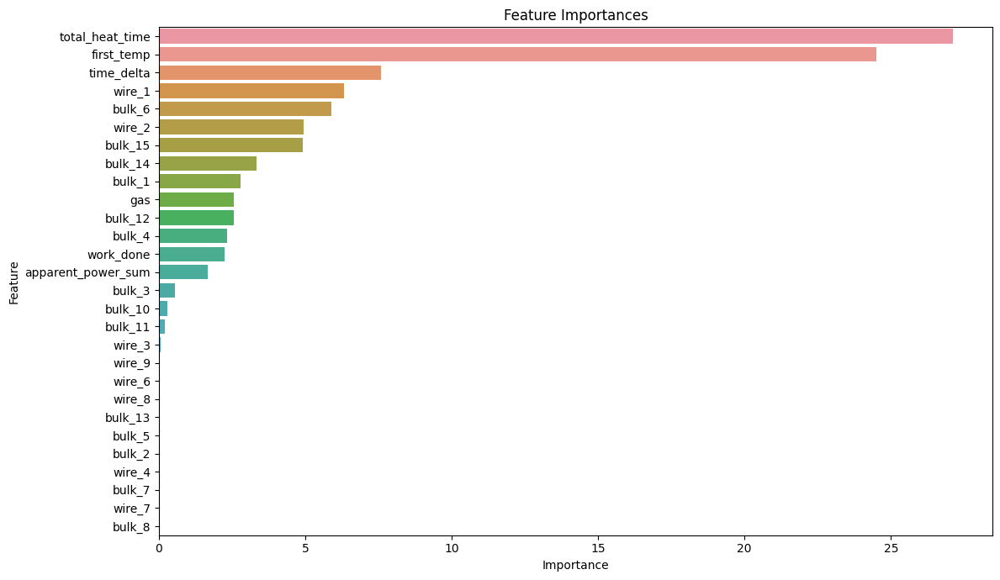

[I 2023-08-21 21:04:51,688] Trial 47 finished with value: 5.802182865003749 and parameters: {'depth': 5, 'iterations': 830, 'learning_rate': 0.475, 'l2_leaf_reg': 43, 'random_strength': 152, 'bootstrap_type': 'Bernoulli', 'border_count': 32, 'subsample': 0.12000000000000001}. Best is trial 44 with value: 5.753619916542549.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1425648	test: 7.6588901	best: 7.6588901 (0)	total: 15.1ms	remaining: 9.3s
100:	learn: 7.4449524	test: 7.0385211	best: 7.0385211 (100)	total: 1.21s	remaining: 6.17s
200:	learn: 6.9267746	test: 6.6318737	best: 6.6318737 (200)	total: 2.43s	remaining: 5.01s
300:	learn: 6.5835388	test: 6.3679017	best: 6.3679017 (300)	total: 3.67s	remaining: 3.83s
400:	learn: 6.3465340	test: 6.1882191	best: 6.1882191 (400)	total: 4.92s	remaining: 2.62s
500:	learn: 6.2031789	test: 6.0900606	best: 6.0900606 (500)	total: 6.16s	remaining: 1.4s
600:	learn: 6.0625266	test: 5.9978594	best: 5.9978594 (600)	total: 7.4s	remaining: 172ms
614:	learn: 6.0442795	test: 5.9932606	best: 5.9932606 (614)	total: 7.58s	remaining: 0us
bestTest = 5.993260599
bestIteration = 614
Split 1, MAE : 5.993220463341247

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9899521	test: 8.2673515	best: 8.2673515 (0)	total: 12.7ms	remaining: 7.77s
100:	learn: 7.3000078	test: 7.5985538	best: 7.5985538 (100)	total: 1.1s	remaining: 5.59s
200:	learn: 6.8347192	test: 7.0999997	best: 7.0999997 (200)	total: 2.32s	remaining: 4.79s
300:	learn: 6.5417491	test: 6.7920523	best: 6.7920523 (300)	total: 3.52s	remaining: 3.67s
400:	learn: 6.3182564	test: 6.5736829	best: 6.5736829 (400)	total: 4.76s	remaining: 2.54s
500:	learn: 6.1501636	test: 6.4069048	best: 6.4069048 (500)	total: 6s	remaining: 1.37s
600:	learn: 6.0124235	test: 6.2847169	best: 6.2847169 (600)	total: 7.17s	remaining: 167ms
614:	learn: 5.9933007	test: 6.2637041	best: 6.2637041 (614)	total: 7.33s	remaining: 0us
bestTest = 6.263704054
bestIteration = 614
Split 2, MAE : 6.263642134124888

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0133314	test: 8.1738288	best: 8.1738288 (0)	total: 12.8ms	remaining: 7.87s
100:	learn: 7.2511027	test: 7.6456183	best: 7.6456183 (100)	total: 1.13s	remaining: 5.75s
200:	learn: 6.7291237	test: 7.2816026	best: 7.2816026 (200)	total: 2.37s	remaining: 4.87s
300:	learn: 6.3958847	test: 7.0513066	best: 7.0513066 (300)	total: 3.61s	remaining: 3.77s
400:	learn: 6.1700045	test: 6.9035910	best: 6.9035910 (400)	total: 4.85s	remaining: 2.59s
500:	learn: 5.9766199	test: 6.7699692	best: 6.7699104 (499)	total: 6.09s	remaining: 1.39s
600:	learn: 5.8225648	test: 6.6789390	best: 6.6789390 (600)	total: 7.32s	remaining: 171ms
614:	learn: 5.8062974	test: 6.6712804	best: 6.6712804 (614)	total: 7.49s	remaining: 0us
bestTest = 6.671280388
bestIteration = 614
Split 3, MAE : 6.671193303619905

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1004137	test: 7.8229784	best: 7.8229784 (0)	total: 13.2ms	remaining: 8.12s
100:	learn: 7.3869967	test: 7.2112778	best: 7.2112778 (100)	total: 1.2s	remaining: 6.11s
200:	learn: 6.8765786	test: 6.8081658	best: 6.8081658 (200)	total: 2.42s	remaining: 4.98s
300:	learn: 6.5849154	test: 6.5848669	best: 6.5848669 (300)	total: 3.66s	remaining: 3.82s
400:	learn: 6.3671987	test: 6.4166119	best: 6.4166119 (400)	total: 4.9s	remaining: 2.61s
500:	learn: 6.1891773	test: 6.2888927	best: 6.2888927 (500)	total: 6.13s	remaining: 1.4s
600:	learn: 6.0504536	test: 6.1916925	best: 6.1916925 (600)	total: 7.37s	remaining: 172ms
614:	learn: 6.0346284	test: 6.1818721	best: 6.1818721 (614)	total: 7.54s	remaining: 0us
bestTest = 6.181872138
bestIteration = 614
Split 4, MAE : 6.181875028677673

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9843141	test: 8.3110899	best: 8.3110899 (0)	total: 7.51ms	remaining: 4.61s
100:	learn: 7.2694556	test: 7.7191892	best: 7.7191892 (100)	total: 1.2s	remaining: 6.11s
200:	learn: 6.7657062	test: 7.2879498	best: 7.2879498 (200)	total: 2.51s	remaining: 5.17s
300:	learn: 6.4363743	test: 7.0405975	best: 7.0405975 (300)	total: 3.83s	remaining: 4s
400:	learn: 6.1705386	test: 6.8430688	best: 6.8430688 (400)	total: 5.19s	remaining: 2.77s
500:	learn: 5.9749874	test: 6.7241281	best: 6.7241281 (500)	total: 6.54s	remaining: 1.49s
600:	learn: 5.8150769	test: 6.6287014	best: 6.6287014 (600)	total: 7.88s	remaining: 184ms
614:	learn: 5.7953577	test: 6.6174274	best: 6.6174274 (614)	total: 8.07s	remaining: 0us
bestTest = 6.617427431
bestIteration = 614
Split 5, MAE : 6.617462444439506
Average MAE: 6.345478674840644


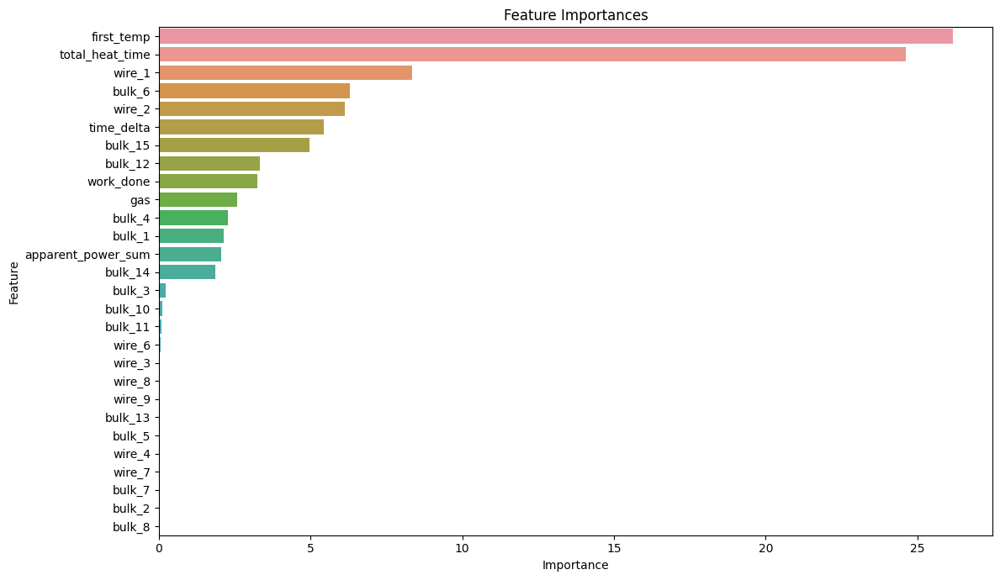

[I 2023-08-21 21:05:32,819] Trial 48 finished with value: 6.345478674840644 and parameters: {'depth': 5, 'iterations': 615, 'learning_rate': 0.47, 'l2_leaf_reg': 200, 'random_strength': 136, 'bootstrap_type': 'Bernoulli', 'border_count': 16, 'subsample': 0.1}. Best is trial 44 with value: 5.753619916542549.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1411350	test: 7.6568586	best: 7.6568586 (0)	total: 12.9ms	remaining: 10.5s
100:	learn: 6.9482632	test: 6.6201787	best: 6.6201787 (100)	total: 1.17s	remaining: 8.29s
200:	learn: 6.3281937	test: 6.1315148	best: 6.1315148 (200)	total: 2.33s	remaining: 7.16s
300:	learn: 5.9918169	test: 5.8598021	best: 5.8598021 (300)	total: 3.5s	remaining: 6.02s
400:	learn: 5.7396841	test: 5.6842258	best: 5.6842258 (400)	total: 4.68s	remaining: 4.86s
500:	learn: 5.5588635	test: 5.5465259	best: 5.5465259 (500)	total: 5.86s	remaining: 3.71s
600:	learn: 5.4137210	test: 5.4426913	best: 5.4426497 (599)	total: 7.1s	remaining: 2.56s
700:	learn: 5.2908223	test: 5.3657363	best: 5.3655562 (698)	total: 8.27s	remaining: 1.38s
800:	learn: 5.1769638	test: 5.3303016	best: 5.3301411 (784)	total: 9.46s	remaining: 201ms
817:	learn: 5.1543886	test: 5.3273373	best: 5.3272173 (815)	total: 9.66s	remaining: 0us
bestTest = 5.327217343
bestIteration = 815
Shrink model to first 816 iterations.
Split 1, MAE : 5.327246570

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9885517	test: 8.2655907	best: 8.2655907 (0)	total: 11.9ms	remaining: 9.72s
100:	learn: 6.8645871	test: 7.1801702	best: 7.1801702 (100)	total: 1.16s	remaining: 8.24s
200:	learn: 6.2430702	test: 6.5812282	best: 6.5812282 (200)	total: 2.29s	remaining: 7.03s
300:	learn: 5.8860609	test: 6.2698915	best: 6.2698915 (300)	total: 3.45s	remaining: 5.93s
400:	learn: 5.6456784	test: 6.0787133	best: 6.0787133 (400)	total: 4.62s	remaining: 4.81s
500:	learn: 5.4490447	test: 5.9619295	best: 5.9619295 (500)	total: 5.81s	remaining: 3.68s
600:	learn: 5.2901287	test: 5.8750637	best: 5.8750637 (600)	total: 7.02s	remaining: 2.53s
700:	learn: 5.1523921	test: 5.7634396	best: 5.7634396 (700)	total: 8.25s	remaining: 1.38s
800:	learn: 5.0514201	test: 5.7278822	best: 5.7278822 (800)	total: 9.52s	remaining: 202ms
817:	learn: 5.0365440	test: 5.7203883	best: 5.7203883 (817)	total: 9.72s	remaining: 0us
bestTest = 5.72038833
bestIteration = 817
Split 2, MAE : 5.720417069500243

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0123696	test: 8.1733580	best: 8.1733580 (0)	total: 12.6ms	remaining: 10.3s
100:	learn: 6.7922416	test: 7.2637600	best: 7.2637600 (100)	total: 1.2s	remaining: 8.54s
200:	learn: 6.0667390	test: 6.7134950	best: 6.7134950 (200)	total: 2.44s	remaining: 7.49s
300:	learn: 5.6761301	test: 6.4610172	best: 6.4610172 (300)	total: 3.61s	remaining: 6.21s
400:	learn: 5.4282248	test: 6.3176836	best: 6.3176836 (400)	total: 4.86s	remaining: 5.05s
500:	learn: 5.2636796	test: 6.2212306	best: 6.2212306 (500)	total: 6.11s	remaining: 3.87s
600:	learn: 5.1360981	test: 6.1532553	best: 6.1532553 (600)	total: 7.33s	remaining: 2.65s
700:	learn: 5.0303705	test: 6.1150189	best: 6.1150189 (700)	total: 8.51s	remaining: 1.42s
800:	learn: 4.9320539	test: 6.0747238	best: 6.0743622 (797)	total: 9.71s	remaining: 206ms
817:	learn: 4.9209198	test: 6.0716458	best: 6.0709575 (813)	total: 9.91s	remaining: 0us
bestTest = 6.070957479
bestIteration = 813
Shrink model to first 814 iterations.
Split 3, MAE : 6.07088401

Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0985579	test: 7.8224859	best: 7.8224859 (0)	total: 9.36ms	remaining: 7.64s
100:	learn: 6.8845416	test: 6.8064140	best: 6.8064140 (100)	total: 1.13s	remaining: 8.05s
200:	learn: 6.2979860	test: 6.3242594	best: 6.3242594 (200)	total: 2.31s	remaining: 7.08s
300:	learn: 5.9036682	test: 6.0358129	best: 6.0358129 (300)	total: 3.5s	remaining: 6.01s
400:	learn: 5.6065430	test: 5.8599075	best: 5.8596356 (396)	total: 4.69s	remaining: 4.88s
500:	learn: 5.4096176	test: 5.7695137	best: 5.7695137 (500)	total: 5.88s	remaining: 3.72s
600:	learn: 5.2379876	test: 5.7236198	best: 5.7220203 (594)	total: 7.08s	remaining: 2.56s
700:	learn: 5.1047075	test: 5.7111809	best: 5.7109722 (692)	total: 8.29s	remaining: 1.38s
800:	learn: 5.0021635	test: 5.7099701	best: 5.7051185 (761)	total: 9.51s	remaining: 202ms
bestTest = 5.705118464
bestIteration = 761
Shrink model to first 762 iterations.
Split 4, MAE : 5.705192304762357

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9771855	test: 8.3052277	best: 8.3052277 (0)	total: 13.7ms	remaining: 11.2s
100:	learn: 6.7897247	test: 7.3189781	best: 7.3189781 (100)	total: 1.23s	remaining: 8.7s
200:	learn: 6.1281432	test: 6.8274501	best: 6.8274501 (200)	total: 2.48s	remaining: 7.6s
300:	learn: 5.6837128	test: 6.5428537	best: 6.5428537 (300)	total: 3.75s	remaining: 6.45s
400:	learn: 5.4320607	test: 6.4258781	best: 6.4256115 (398)	total: 5.05s	remaining: 5.25s
500:	learn: 5.2363064	test: 6.3506940	best: 6.3506940 (500)	total: 6.38s	remaining: 4.04s
600:	learn: 5.0869085	test: 6.3071710	best: 6.3071710 (600)	total: 7.69s	remaining: 2.78s
700:	learn: 4.9942575	test: 6.3013790	best: 6.3013790 (700)	total: 9s	remaining: 1.5s
bestTest = 6.298856889
bestIteration = 710
Shrink model to first 711 iterations.
Split 5, MAE : 6.299023182156021
Average MAE: 5.824552628937648


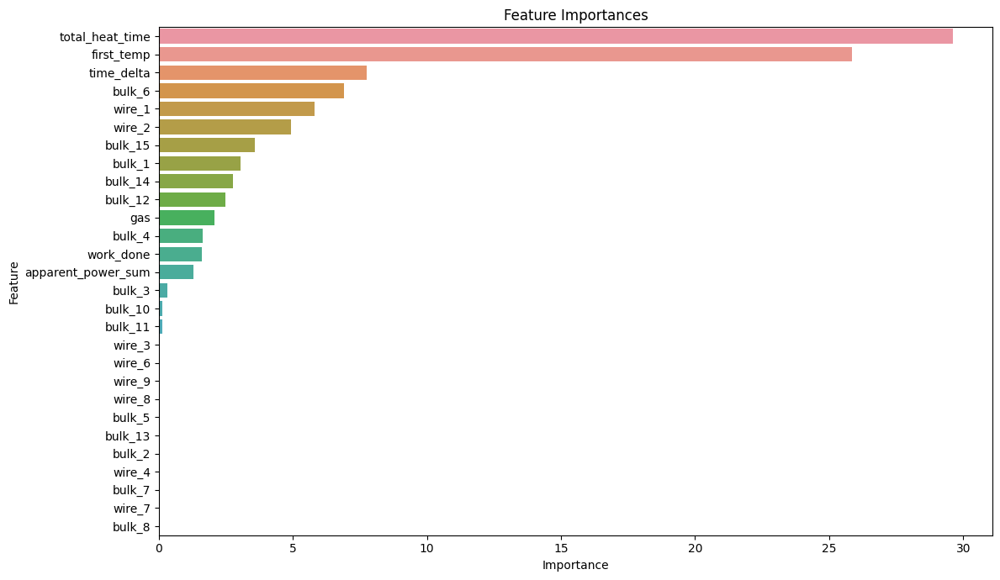

[I 2023-08-21 21:06:24,566] Trial 49 finished with value: 5.824552628937648 and parameters: {'depth': 5, 'iterations': 818, 'learning_rate': 0.41500000000000004, 'l2_leaf_reg': 52, 'random_strength': 149, 'bootstrap_type': 'Bernoulli', 'border_count': 37, 'subsample': 0.22}. Best is trial 44 with value: 5.753619916542549.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1404008	test: 7.6552315	best: 7.6552315 (0)	total: 11.8ms	remaining: 8.52s
100:	learn: 6.7458170	test: 6.4750543	best: 6.4750543 (100)	total: 1.13s	remaining: 6.94s
200:	learn: 6.1426370	test: 5.9897972	best: 5.9897972 (200)	total: 2.28s	remaining: 5.89s
300:	learn: 5.7971657	test: 5.7294520	best: 5.7294520 (300)	total: 3.43s	remaining: 4.79s
400:	learn: 5.5577212	test: 5.5956965	best: 5.5952963 (398)	total: 4.61s	remaining: 3.68s
500:	learn: 5.3432512	test: 5.4797975	best: 5.4790941 (499)	total: 5.78s	remaining: 2.54s
600:	learn: 5.2141078	test: 5.4441946	best: 5.4429424 (598)	total: 6.93s	remaining: 1.38s
700:	learn: 5.0918382	test: 5.3944865	best: 5.3934609 (688)	total: 8.09s	remaining: 231ms
720:	learn: 5.0713325	test: 5.3890028	best: 5.3886068 (719)	total: 8.32s	remaining: 0us
bestTest = 5.388606817
bestIteration = 719
Shrink model to first 720 iterations.
Split 1, MAE : 5.388564866779575

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9873719	test: 8.2645561	best: 8.2645561 (0)	total: 12.8ms	remaining: 9.2s
100:	learn: 6.6987536	test: 6.9812334	best: 6.9812334 (100)	total: 1.14s	remaining: 6.98s
200:	learn: 6.0722586	test: 6.3231114	best: 6.3231114 (200)	total: 2.29s	remaining: 5.92s
300:	learn: 5.7139372	test: 6.0186407	best: 6.0186407 (300)	total: 3.43s	remaining: 4.79s
400:	learn: 5.4621001	test: 5.8679248	best: 5.8679248 (400)	total: 4.64s	remaining: 3.7s
500:	learn: 5.2641560	test: 5.7472595	best: 5.7472595 (500)	total: 6.2s	remaining: 2.72s
600:	learn: 5.1242952	test: 5.6653101	best: 5.6653101 (600)	total: 7.5s	remaining: 1.5s
700:	learn: 5.0152250	test: 5.6368139	best: 5.6366033 (699)	total: 8.77s	remaining: 250ms
720:	learn: 4.9995502	test: 5.6336149	best: 5.6328601 (716)	total: 9.02s	remaining: 0us
bestTest = 5.632860069
bestIteration = 716
Shrink model to first 717 iterations.
Split 2, MAE : 5.632792390211788

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0113741	test: 8.1707942	best: 8.1707942 (0)	total: 12.1ms	remaining: 8.71s
100:	learn: 6.5706116	test: 7.0753611	best: 7.0753611 (100)	total: 1.25s	remaining: 7.67s
200:	learn: 5.8501008	test: 6.5534451	best: 6.5534451 (200)	total: 2.5s	remaining: 6.46s
300:	learn: 5.4820275	test: 6.3520690	best: 6.3520690 (300)	total: 3.77s	remaining: 5.26s
400:	learn: 5.2531321	test: 6.2145457	best: 6.2145457 (400)	total: 5.03s	remaining: 4.02s
500:	learn: 5.0945336	test: 6.1370937	best: 6.1367481 (498)	total: 6.36s	remaining: 2.79s
600:	learn: 4.9516602	test: 6.0932323	best: 6.0932323 (600)	total: 7.56s	remaining: 1.51s
700:	learn: 4.8362713	test: 6.0701943	best: 6.0701943 (700)	total: 8.76s	remaining: 250ms
720:	learn: 4.8148885	test: 6.0663069	best: 6.0658704 (714)	total: 9s	remaining: 0us
bestTest = 6.0658704
bestIteration = 714
Shrink model to first 715 iterations.
Split 3, MAE : 6.0659193832255145

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0973342	test: 7.8214224	best: 7.8214224 (0)	total: 11.9ms	remaining: 8.58s
100:	learn: 6.7112105	test: 6.6889606	best: 6.6889606 (100)	total: 1.16s	remaining: 7.13s
200:	learn: 6.0441112	test: 6.1659006	best: 6.1659006 (200)	total: 2.25s	remaining: 5.84s
300:	learn: 5.6410076	test: 5.9318806	best: 5.9318806 (300)	total: 3.42s	remaining: 4.78s
400:	learn: 5.3663425	test: 5.8238294	best: 5.8238294 (400)	total: 4.58s	remaining: 3.65s
500:	learn: 5.1806042	test: 5.7753987	best: 5.7735869 (493)	total: 5.74s	remaining: 2.52s
600:	learn: 5.0388987	test: 5.7771863	best: 5.7676942 (565)	total: 6.92s	remaining: 1.38s
bestTest = 5.767694232
bestIteration = 565
Shrink model to first 566 iterations.
Split 4, MAE : 5.767705121495254

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9762916	test: 8.3041810	best: 8.3041810 (0)	total: 13.6ms	remaining: 9.77s
100:	learn: 6.5925809	test: 7.1418359	best: 7.1418359 (100)	total: 1.25s	remaining: 7.66s
200:	learn: 5.9123866	test: 6.6470632	best: 6.6470632 (200)	total: 2.5s	remaining: 6.48s
300:	learn: 5.4966769	test: 6.4285861	best: 6.4267438 (298)	total: 3.79s	remaining: 5.29s
400:	learn: 5.2429737	test: 6.3686004	best: 6.3671159 (398)	total: 5.11s	remaining: 4.08s
500:	learn: 5.0778555	test: 6.3423855	best: 6.3418235 (476)	total: 6.39s	remaining: 2.81s
600:	learn: 4.9557047	test: 6.3366854	best: 6.3349806 (562)	total: 7.67s	remaining: 1.53s
700:	learn: 4.8619323	test: 6.3232366	best: 6.3207222 (670)	total: 9s	remaining: 257ms
720:	learn: 4.8464924	test: 6.3239564	best: 6.3207222 (670)	total: 9.26s	remaining: 0us
bestTest = 6.320722207
bestIteration = 670
Shrink model to first 671 iterations.
Split 5, MAE : 6.32065312579502
Average MAE: 5.83512697750143


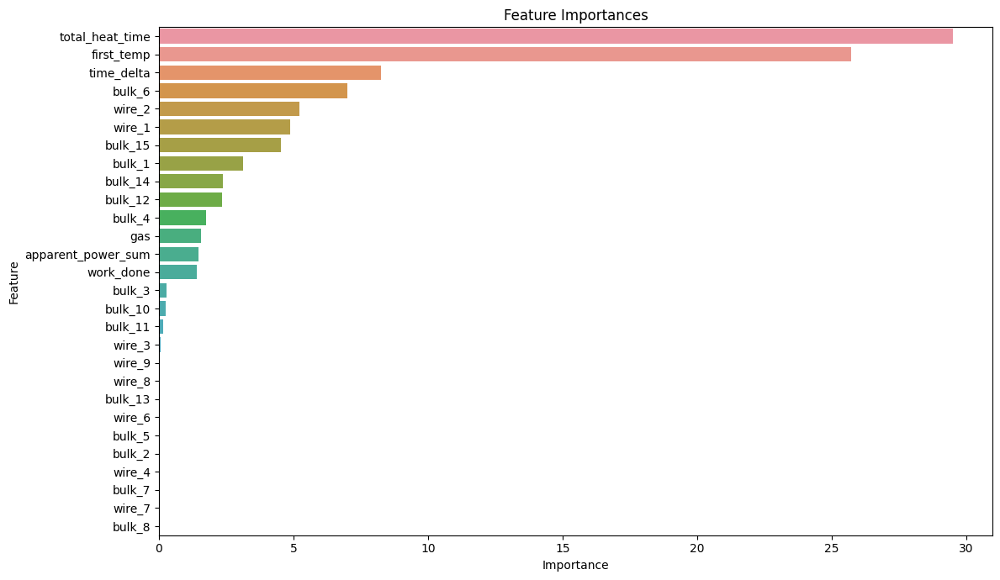

[I 2023-08-21 21:07:10,402] Trial 50 finished with value: 5.83512697750143 and parameters: {'depth': 5, 'iterations': 721, 'learning_rate': 0.485, 'l2_leaf_reg': 43, 'random_strength': 166, 'bootstrap_type': 'Bernoulli', 'border_count': 27, 'subsample': 0.26}. Best is trial 44 with value: 5.753619916542549.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1407042	test: 7.6549258	best: 7.6549258 (0)	total: 14.2ms	remaining: 11.1s
100:	learn: 6.6331677	test: 6.3753344	best: 6.3753344 (100)	total: 1.26s	remaining: 8.55s
200:	learn: 5.9454988	test: 5.8366755	best: 5.8366755 (200)	total: 2.55s	remaining: 7.4s
300:	learn: 5.5184983	test: 5.5494087	best: 5.5494087 (300)	total: 3.88s	remaining: 6.23s
400:	learn: 5.2153222	test: 5.4048145	best: 5.4048145 (400)	total: 5.18s	remaining: 4.95s
500:	learn: 5.0280005	test: 5.3323027	best: 5.3286143 (490)	total: 6.48s	remaining: 3.66s
600:	learn: 4.8289926	test: 5.3059114	best: 5.3044675 (577)	total: 7.82s	remaining: 2.38s
700:	learn: 4.6911905	test: 5.2733794	best: 5.2725484 (692)	total: 9.18s	remaining: 1.09s
783:	learn: 4.5755561	test: 5.2739573	best: 5.2702294 (741)	total: 10.3s	remaining: 0us
bestTest = 5.270229394
bestIteration = 741
Shrink model to first 742 iterations.
Split 1, MAE : 5.270235071490775

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9875863	test: 8.2650178	best: 8.2650178 (0)	total: 12.1ms	remaining: 9.49s
100:	learn: 6.5812733	test: 6.9628850	best: 6.9628850 (100)	total: 1.26s	remaining: 8.51s
200:	learn: 5.8544848	test: 6.2914731	best: 6.2914731 (200)	total: 2.56s	remaining: 7.43s
300:	learn: 5.4149385	test: 5.9691487	best: 5.9691487 (300)	total: 3.88s	remaining: 6.22s
400:	learn: 5.1045668	test: 5.7800716	best: 5.7800716 (400)	total: 5.2s	remaining: 4.96s
500:	learn: 4.9052871	test: 5.6665585	best: 5.6665585 (500)	total: 6.52s	remaining: 3.68s
600:	learn: 4.7240686	test: 5.6402259	best: 5.6360615 (575)	total: 7.87s	remaining: 2.4s
700:	learn: 4.5548027	test: 5.6275547	best: 5.6209885 (671)	total: 9.17s	remaining: 1.08s
bestTest = 5.620988469
bestIteration = 671
Shrink model to first 672 iterations.
Split 2, MAE : 5.621093137746471

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0117202	test: 8.1709117	best: 8.1709117 (0)	total: 13.7ms	remaining: 10.7s
100:	learn: 6.4595014	test: 6.9966975	best: 6.9966975 (100)	total: 1.26s	remaining: 8.56s
200:	learn: 5.6528587	test: 6.4166676	best: 6.4166676 (200)	total: 2.57s	remaining: 7.46s
300:	learn: 5.2514491	test: 6.2168095	best: 6.2168095 (300)	total: 3.92s	remaining: 6.3s
400:	learn: 4.9916341	test: 6.1027755	best: 6.1027755 (400)	total: 5.23s	remaining: 5s
500:	learn: 4.7440912	test: 6.0321972	best: 6.0315130 (499)	total: 6.57s	remaining: 3.71s
600:	learn: 4.5420479	test: 5.9782589	best: 5.9779126 (598)	total: 7.91s	remaining: 2.41s
700:	learn: 4.3684065	test: 5.9355993	best: 5.9355993 (700)	total: 9.26s	remaining: 1.1s
783:	learn: 4.2634043	test: 5.9054161	best: 5.9050748 (781)	total: 10.4s	remaining: 0us
bestTest = 5.905074767
bestIteration = 781
Shrink model to first 782 iterations.
Split 3, MAE : 5.905178160507762

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0977683	test: 7.8224691	best: 7.8224691 (0)	total: 12.5ms	remaining: 9.76s
100:	learn: 6.5730490	test: 6.6157956	best: 6.6157956 (100)	total: 1.28s	remaining: 8.66s
200:	learn: 5.7992075	test: 6.0557581	best: 6.0557581 (200)	total: 2.6s	remaining: 7.54s
300:	learn: 5.3576238	test: 5.8417832	best: 5.8417832 (300)	total: 3.89s	remaining: 6.24s
400:	learn: 5.0597453	test: 5.7445549	best: 5.7428722 (386)	total: 5.22s	remaining: 4.98s
bestTest = 5.737314158
bestIteration = 427
Shrink model to first 428 iterations.
Split 4, MAE : 5.737389039777617

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9754340	test: 8.3018715	best: 8.3018715 (0)	total: 15.9ms	remaining: 12.5s
100:	learn: 6.4787529	test: 7.1091049	best: 7.1091049 (100)	total: 1.3s	remaining: 8.77s
200:	learn: 5.6120422	test: 6.6106139	best: 6.6106139 (200)	total: 2.71s	remaining: 7.88s
300:	learn: 5.1954084	test: 6.4348565	best: 6.4348565 (300)	total: 4.15s	remaining: 6.66s
400:	learn: 4.9657062	test: 6.3976686	best: 6.3944976 (392)	total: 5.57s	remaining: 5.32s
500:	learn: 4.7863421	test: 6.3757366	best: 6.3757366 (500)	total: 7.03s	remaining: 3.97s
600:	learn: 4.6581296	test: 6.3626912	best: 6.3617883 (580)	total: 8.51s	remaining: 2.59s
700:	learn: 4.5414098	test: 6.3503530	best: 6.3495133 (697)	total: 9.98s	remaining: 1.18s
bestTest = 6.349513262
bestIteration = 697
Shrink model to first 698 iterations.
Split 5, MAE : 6.349709594779064
Average MAE: 5.776721000860338


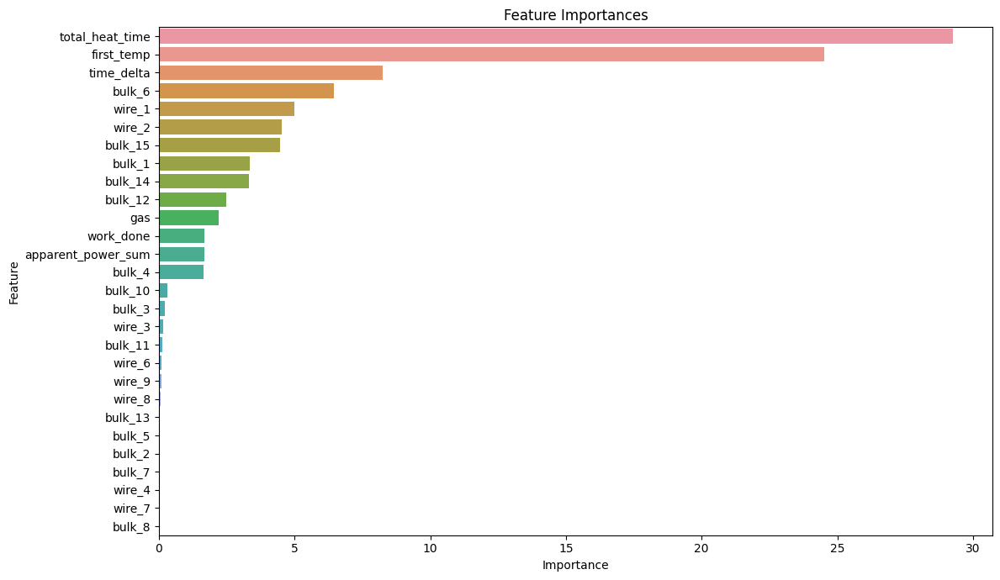

[I 2023-08-21 21:08:00,391] Trial 51 finished with value: 5.776721000860338 and parameters: {'depth': 6, 'iterations': 784, 'learning_rate': 0.41000000000000003, 'l2_leaf_reg': 20, 'random_strength': 200, 'bootstrap_type': 'Bernoulli', 'border_count': 72, 'subsample': 0.36}. Best is trial 44 with value: 5.753619916542549.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1402152	test: 7.6545445	best: 7.6545445 (0)	total: 13.3ms	remaining: 11.1s
100:	learn: 6.4016320	test: 6.1972922	best: 6.1972922 (100)	total: 1.26s	remaining: 9.27s
200:	learn: 5.6183861	test: 5.6235170	best: 5.6235170 (200)	total: 2.54s	remaining: 8.1s
300:	learn: 5.1353219	test: 5.3958048	best: 5.3951164 (297)	total: 3.8s	remaining: 6.82s
400:	learn: 4.8133869	test: 5.3147116	best: 5.3094112 (393)	total: 5.08s	remaining: 5.58s
500:	learn: 4.5780101	test: 5.2741871	best: 5.2741871 (500)	total: 6.39s	remaining: 4.35s
600:	learn: 4.3903385	test: 5.2362029	best: 5.2352897 (598)	total: 7.71s	remaining: 3.09s
700:	learn: 4.2061461	test: 5.2131946	best: 5.2107497 (661)	total: 9.04s	remaining: 1.82s
bestTest = 5.210749673
bestIteration = 661
Shrink model to first 662 iterations.
Split 1, MAE : 5.210735461141422

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9870714	test: 8.2648373	best: 8.2648373 (0)	total: 13.8ms	remaining: 11.6s
100:	learn: 6.3352762	test: 6.6952621	best: 6.6952621 (100)	total: 1.25s	remaining: 9.16s
200:	learn: 5.5657288	test: 6.0762271	best: 6.0762271 (200)	total: 2.52s	remaining: 8.02s
300:	learn: 5.0790066	test: 5.8342250	best: 5.8342250 (300)	total: 3.84s	remaining: 6.91s
400:	learn: 4.7723762	test: 5.7098766	best: 5.7098766 (400)	total: 5.15s	remaining: 5.66s
500:	learn: 4.5231142	test: 5.6497215	best: 5.6497215 (500)	total: 6.46s	remaining: 4.4s
600:	learn: 4.3279688	test: 5.6259710	best: 5.6219850 (592)	total: 7.8s	remaining: 3.13s
bestTest = 5.613755191
bestIteration = 646
Shrink model to first 647 iterations.
Split 2, MAE : 5.613903171289195

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0113510	test: 8.1706928	best: 8.1706928 (0)	total: 13.3ms	remaining: 11.2s
100:	learn: 6.2079069	test: 6.8020453	best: 6.8020453 (100)	total: 1.25s	remaining: 9.21s
200:	learn: 5.3741832	test: 6.2904084	best: 6.2904084 (200)	total: 2.54s	remaining: 8.11s
300:	learn: 4.9238558	test: 6.1040948	best: 6.1040948 (300)	total: 3.88s	remaining: 6.97s
400:	learn: 4.5927790	test: 5.9857503	best: 5.9857503 (400)	total: 5.21s	remaining: 5.73s
500:	learn: 4.3514224	test: 5.9368914	best: 5.9364591 (499)	total: 6.52s	remaining: 4.44s
600:	learn: 4.1493251	test: 5.9125207	best: 5.9090272 (598)	total: 7.85s	remaining: 3.15s
bestTest = 5.909027187
bestIteration = 598
Shrink model to first 599 iterations.
Split 3, MAE : 5.90901379798161

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0972488	test: 7.8221786	best: 7.8221786 (0)	total: 14.5ms	remaining: 12.2s
100:	learn: 6.2843288	test: 6.3884362	best: 6.3884362 (100)	total: 1.25s	remaining: 9.21s
200:	learn: 5.4132904	test: 5.8812950	best: 5.8812950 (200)	total: 2.54s	remaining: 8.1s
300:	learn: 5.0220532	test: 5.7418244	best: 5.7392708 (297)	total: 3.73s	remaining: 6.7s
400:	learn: 4.7480434	test: 5.6723170	best: 5.6723086 (399)	total: 4.99s	remaining: 5.49s
500:	learn: 4.5109326	test: 5.6559178	best: 5.6531014 (492)	total: 6.29s	remaining: 4.28s
bestTest = 5.653101428
bestIteration = 492
Shrink model to first 493 iterations.
Split 4, MAE : 5.653132469766729

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9843512	test: 8.3111579	best: 8.3111579 (0)	total: 9.4ms	remaining: 7.9s
100:	learn: 6.2091650	test: 6.9546207	best: 6.9546207 (100)	total: 1.36s	remaining: 9.96s
200:	learn: 5.3303140	test: 6.5055865	best: 6.5055865 (200)	total: 2.76s	remaining: 8.79s
300:	learn: 4.9746909	test: 6.3988248	best: 6.3956825 (296)	total: 4.2s	remaining: 7.54s
400:	learn: 4.6855441	test: 6.3672962	best: 6.3653333 (398)	total: 5.71s	remaining: 6.28s
bestTest = 6.361464226
bestIteration = 424
Shrink model to first 425 iterations.
Split 5, MAE : 6.361436311233209
Average MAE: 5.749644242282433


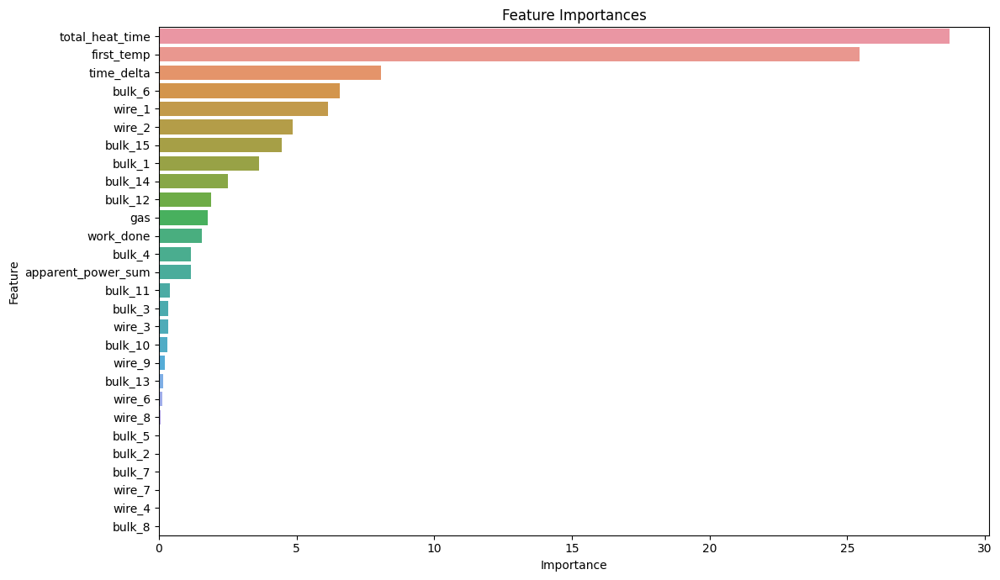

[I 2023-08-21 21:08:43,794] Trial 52 finished with value: 5.749644242282433 and parameters: {'depth': 6, 'iterations': 842, 'learning_rate': 0.41500000000000004, 'l2_leaf_reg': 6, 'random_strength': 185, 'bootstrap_type': 'Bernoulli', 'border_count': 72, 'subsample': 0.35}. Best is trial 52 with value: 5.749644242282433.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1397367	test: 7.6540534	best: 7.6540534 (0)	total: 13.7ms	remaining: 10.6s
100:	learn: 6.2570090	test: 6.1166195	best: 6.1166195 (100)	total: 1.29s	remaining: 8.68s
200:	learn: 5.4399085	test: 5.5566305	best: 5.5566305 (200)	total: 2.61s	remaining: 7.49s
300:	learn: 4.9870833	test: 5.3859674	best: 5.3859674 (300)	total: 3.95s	remaining: 6.26s
400:	learn: 4.6719181	test: 5.3228816	best: 5.3228816 (400)	total: 5.28s	remaining: 4.96s
500:	learn: 4.4310140	test: 5.3106224	best: 5.3035990 (467)	total: 6.55s	remaining: 3.62s
bestTest = 5.303599011
bestIteration = 467
Shrink model to first 468 iterations.
Split 1, MAE : 5.303621074301774

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9858146	test: 8.2639587	best: 8.2639587 (0)	total: 15ms	remaining: 11.6s
100:	learn: 6.2013708	test: 6.6119654	best: 6.6119654 (100)	total: 1.26s	remaining: 8.45s
200:	learn: 5.4285642	test: 6.0550023	best: 6.0550023 (200)	total: 2.58s	remaining: 7.41s
300:	learn: 4.9199800	test: 5.8120173	best: 5.8120173 (300)	total: 3.91s	remaining: 6.19s
400:	learn: 4.5974969	test: 5.7165944	best: 5.7165944 (400)	total: 5.24s	remaining: 4.92s
500:	learn: 4.3403037	test: 5.6702339	best: 5.6702339 (500)	total: 6.58s	remaining: 3.64s
600:	learn: 4.1266232	test: 5.6432847	best: 5.6432847 (600)	total: 7.93s	remaining: 2.33s
700:	learn: 3.9441366	test: 5.6220213	best: 5.6204631 (697)	total: 9.28s	remaining: 1.02s
777:	learn: 3.7976232	test: 5.6123565	best: 5.6115485 (730)	total: 10.3s	remaining: 0us
bestTest = 5.611548481
bestIteration = 730
Shrink model to first 731 iterations.
Split 2, MAE : 5.61147888196273

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0108858	test: 8.1702325	best: 8.1702325 (0)	total: 13.7ms	remaining: 10.6s
100:	learn: 6.0942173	test: 6.7331690	best: 6.7331690 (100)	total: 1.26s	remaining: 8.46s
200:	learn: 5.2467880	test: 6.2677236	best: 6.2677236 (200)	total: 2.56s	remaining: 7.34s
300:	learn: 4.7579792	test: 6.0968812	best: 6.0962320 (299)	total: 3.9s	remaining: 6.17s
400:	learn: 4.4302900	test: 6.0318740	best: 6.0312696 (399)	total: 5.23s	remaining: 4.91s
500:	learn: 4.1833594	test: 6.0049374	best: 6.0049374 (500)	total: 6.58s	remaining: 3.64s
600:	learn: 3.9378422	test: 5.9807374	best: 5.9807374 (600)	total: 7.88s	remaining: 2.32s
700:	learn: 3.7257653	test: 5.9575349	best: 5.9564520 (679)	total: 9.22s	remaining: 1.01s
bestTest = 5.956452028
bestIteration = 679
Shrink model to first 680 iterations.
Split 3, MAE : 5.956362880682958

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0969240	test: 7.8214153	best: 7.8214153 (0)	total: 13.7ms	remaining: 10.7s
100:	learn: 6.1640583	test: 6.3172755	best: 6.3172755 (100)	total: 1.28s	remaining: 8.58s
200:	learn: 5.3210633	test: 5.8080686	best: 5.8080686 (200)	total: 2.59s	remaining: 7.42s
300:	learn: 4.8853624	test: 5.6799474	best: 5.6785808 (299)	total: 3.92s	remaining: 6.21s
400:	learn: 4.5796696	test: 5.6353384	best: 5.6330451 (393)	total: 5.27s	remaining: 4.95s
500:	learn: 4.3056074	test: 5.6202649	best: 5.6170061 (454)	total: 6.59s	remaining: 3.64s
bestTest = 5.617006148
bestIteration = 454
Shrink model to first 455 iterations.
Split 4, MAE : 5.617009759852251

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9732443	test: 8.2986794	best: 8.2986794 (0)	total: 14.5ms	remaining: 11.3s
100:	learn: 6.0764827	test: 6.8625236	best: 6.8625236 (100)	total: 1.4s	remaining: 9.39s
200:	learn: 5.2549374	test: 6.4297822	best: 6.4297822 (200)	total: 2.85s	remaining: 8.18s
300:	learn: 4.8670569	test: 6.3210372	best: 6.3210372 (300)	total: 4.3s	remaining: 6.82s
400:	learn: 4.5424549	test: 6.3161839	best: 6.3132359 (352)	total: 5.76s	remaining: 5.42s
bestTest = 6.31323593
bestIteration = 352
Shrink model to first 353 iterations.
Split 5, MAE : 6.313214417463356
Average MAE: 5.760337402852615


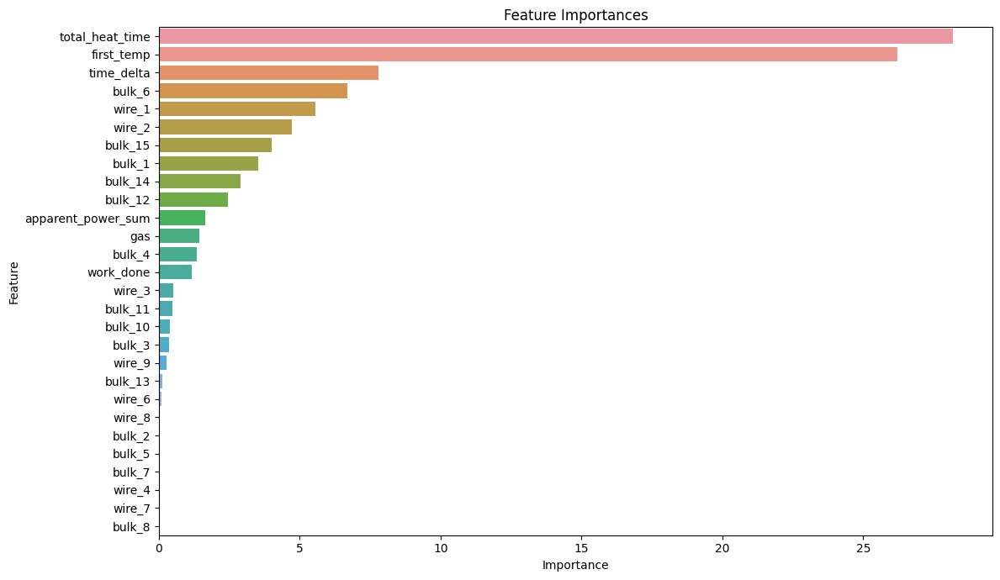

[I 2023-08-21 21:09:25,969] Trial 53 finished with value: 5.760337402852615 and parameters: {'depth': 6, 'iterations': 778, 'learning_rate': 0.44000000000000006, 'l2_leaf_reg': 4, 'random_strength': 198, 'bootstrap_type': 'Bernoulli', 'border_count': 92, 'subsample': 0.33999999999999997}. Best is trial 52 with value: 5.749644242282433.



Training on split 1/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.1393465	test: 7.6534875	best: 7.6534875 (0)	total: 13.6ms	remaining: 10.4s
100:	learn: 6.2549914	test: 6.1072456	best: 6.1072456 (100)	total: 1.28s	remaining: 8.49s
200:	learn: 5.5112480	test: 5.6472301	best: 5.6472301 (200)	total: 2.54s	remaining: 7.18s
300:	learn: 5.0481423	test: 5.4619770	best: 5.4619770 (300)	total: 3.88s	remaining: 6.02s
400:	learn: 4.7663791	test: 5.3933829	best: 5.3933829 (400)	total: 5.21s	remaining: 4.77s
500:	learn: 4.5029325	test: 5.3439361	best: 5.3407825 (492)	total: 6.54s	remaining: 3.49s
600:	learn: 4.2901210	test: 5.3396857	best: 5.3380365 (571)	total: 7.89s	remaining: 2.19s
bestTest = 5.336665025
bestIteration = 613
Shrink model to first 614 iterations.
Split 1, MAE : 5.336704057195346

Training on split 2/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9853291	test: 8.2635488	best: 8.2635488 (0)	total: 13.4ms	remaining: 10.3s
100:	learn: 6.1659147	test: 6.6089021	best: 6.6089021 (100)	total: 1.28s	remaining: 8.46s
200:	learn: 5.4226481	test: 6.0146344	best: 6.0138782 (199)	total: 2.59s	remaining: 7.32s
300:	learn: 4.9791832	test: 5.7874154	best: 5.7874154 (300)	total: 3.93s	remaining: 6.1s
400:	learn: 4.6686696	test: 5.7194128	best: 5.7194128 (400)	total: 5.26s	remaining: 4.82s
500:	learn: 4.4187583	test: 5.6686707	best: 5.6684560 (499)	total: 6.61s	remaining: 3.52s
600:	learn: 4.1952025	test: 5.6407009	best: 5.6379713 (592)	total: 7.93s	remaining: 2.2s
bestTest = 5.637971282
bestIteration = 592
Shrink model to first 593 iterations.
Split 2, MAE : 5.637928790927997

Training on split 3/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0105460	test: 8.1696973	best: 8.1696973 (0)	total: 13.9ms	remaining: 10.7s
100:	learn: 6.0407627	test: 6.6793629	best: 6.6793629 (100)	total: 1.31s	remaining: 8.64s
200:	learn: 5.2626620	test: 6.2390165	best: 6.2390165 (200)	total: 2.63s	remaining: 7.41s
300:	learn: 4.8187310	test: 6.0791170	best: 6.0783545 (295)	total: 3.97s	remaining: 6.16s
400:	learn: 4.4652760	test: 5.9588151	best: 5.9588151 (400)	total: 5.28s	remaining: 4.83s
500:	learn: 4.2366693	test: 5.9166228	best: 5.9121094 (479)	total: 6.58s	remaining: 3.51s
600:	learn: 4.0321425	test: 5.8922857	best: 5.8922857 (600)	total: 7.89s	remaining: 2.19s
bestTest = 5.886552259
bestIteration = 620
Shrink model to first 621 iterations.
Split 3, MAE : 5.886629334613282

Training on split 4/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 8.0962198	test: 7.8214153	best: 7.8214153 (0)	total: 13.2ms	remaining: 10.1s
100:	learn: 6.1570453	test: 6.2993332	best: 6.2993332 (100)	total: 1.26s	remaining: 8.29s
200:	learn: 5.3143261	test: 5.8282176	best: 5.8282176 (200)	total: 2.57s	remaining: 7.24s
300:	learn: 4.9249769	test: 5.6995271	best: 5.6986515 (299)	total: 3.89s	remaining: 6.04s
400:	learn: 4.6448974	test: 5.6807216	best: 5.6781567 (361)	total: 5.21s	remaining: 4.77s
500:	learn: 4.4088685	test: 5.6575317	best: 5.6524357 (494)	total: 6.54s	remaining: 3.48s
bestTest = 5.652435654
bestIteration = 494
Shrink model to first 495 iterations.
Split 4, MAE : 5.652486431548551

Training on split 5/5


Default metric period is 5 because MAE is/are not implemented for GPU


0:	learn: 7.9720584	test: 8.2994637	best: 8.2994637 (0)	total: 14.4ms	remaining: 11.1s
100:	learn: 6.0235915	test: 6.8251041	best: 6.8251041 (100)	total: 1.37s	remaining: 9.07s
200:	learn: 5.1877163	test: 6.4255834	best: 6.4255834 (200)	total: 2.71s	remaining: 7.66s
300:	learn: 4.8151441	test: 6.3583655	best: 6.3560581 (273)	total: 4.09s	remaining: 6.35s
400:	learn: 4.5778443	test: 6.3306885	best: 6.3305538 (398)	total: 5.5s	remaining: 5.04s
500:	learn: 4.3572364	test: 6.3208057	best: 6.3171260 (487)	total: 6.98s	remaining: 3.72s
bestTest = 6.317126044
bestIteration = 487
Shrink model to first 488 iterations.
Split 5, MAE : 6.317191915721991
Average MAE: 5.766188106001434


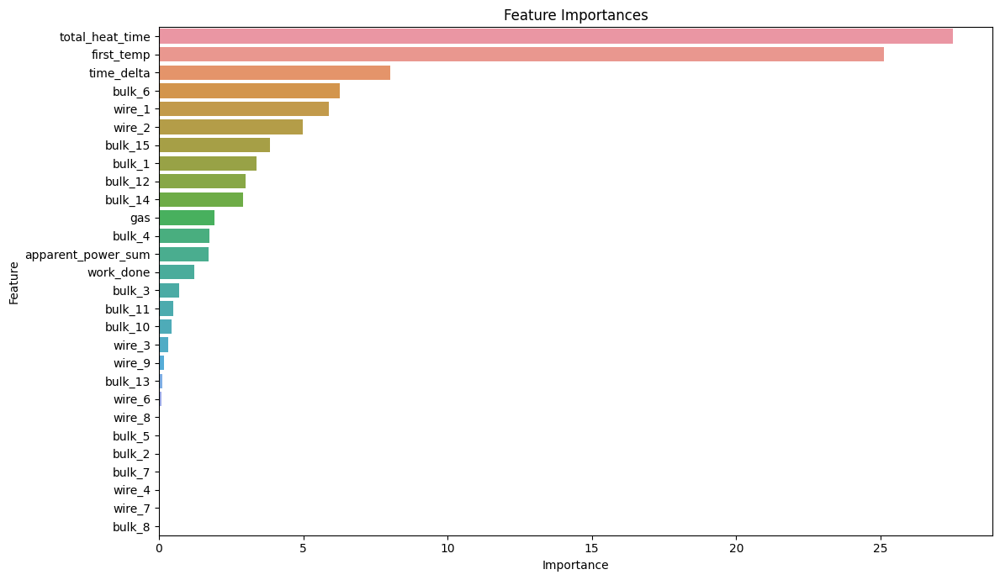

[I 2023-08-21 21:10:09,578] Trial 54 finished with value: 5.766188106001434 and parameters: {'depth': 6, 'iterations': 768, 'learning_rate': 0.475, 'l2_leaf_reg': 7, 'random_strength': 200, 'bootstrap_type': 'Bernoulli', 'border_count': 91, 'subsample': 0.35}. Best is trial 52 with value: 5.749644242282433.


CPU times: total: 20min 27s
Wall time: 42min 8s


In [126]:
%%time
# Время исполнения на GPU NVIDIA 3080TI: 45 min.

def catboostuna(trial):

    param_cb = {
        "depth":               trial.suggest_int("depth", 2, 7),
        "iterations":          trial.suggest_int("iterations", 100, 1000),
        "learning_rate":       trial.suggest_float("learning_rate", 0.1, 0.5, step=0.005),
        
        "l2_leaf_reg":         trial.suggest_int("l2_leaf_reg", 0, 200.0),
        "random_strength":     trial.suggest_int("random_strength", 0, 200.0),
        "bootstrap_type":      trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli"]),
        "border_count":        trial.suggest_int("border_count", 1, 255),
        
        "random_seed":         RANDOM_STATE,
        "loss_function":       "MAE",
        "task_type":           'GPU',
        "devices":             '0:1',
        "verbose":             False
    }
    if param_cb["bootstrap_type"] == "Bayesian":
        param_cb["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0.01, 50.0)
    elif param_cb["bootstrap_type"] in ["Bernoulli","Poisson"]:
        param_cb["subsample"] = trial.suggest_float("subsample", 0.1, 1, step=0.01)

    classifier_obj = CatBoostRegressor(**param_cb)
    
    # Initializing KFold Cross-Validation
    mae_scores = []
    n_splits = 5
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=RANDOM_STATE)

    # Training with KFold Cross-Validation 
    for split, (train_idx, val_idx) in enumerate(kf.split(x_train)):
        print(f'\nОбучение на сплите: {split+1}/{n_splits}')

        X_train, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
        Y_train, Y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        #----------------Scaling Data--------------------#
        scaler = RobustScaler()
        X_train = scaler.fit_transform(X_train)
        X_val = scaler.transform(X_val)
        #------------------------------------------------#

        classifier_obj.fit(X_train, Y_train,
                           eval_set = (X_val, Y_val),
                           early_stopping_rounds=50, verbose=100)

        # Predictions on the validation set
        Y_pred = classifier_obj.predict(X_val)

        # Computing MAE for each fold
        mae = mean_absolute_error(Y_val, Y_pred)
        mae_scores.append(mae)

        print(f'Split {split+1}, MAE : {mae}')

    # Printing average MAE value per KFold cycle
    avg_mae = np.mean(mae_scores)
    print(f'Average MAE: {avg_mae}')
    
    # ------------------------Feature Importances-------------------------------#    
    importance_df = pd.DataFrame({'Feature':    x_train.columns,\
                                  'Importance': classifier_obj.feature_importances_})
    importance_df = importance_df.sort_values(by='Importance', ascending=False)
    plt.figure(figsize=(12, 7))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.xlabel("Importance")
    plt.ylabel("Feature")
    plt.title("Feature Importances")
    plt.tight_layout()
    plt.show()
    # --------------------------------------------------------------------------#     
    return  avg_mae

# Optuna Sampler
sampler = optuna.samplers.TPESampler(seed=123)

# Creating study object
study = optuna.create_study(direction="minimize", sampler=sampler)

# Running optimization with Optuna
study.optimize(catboostuna, n_trials=55, show_progress_bar=False)

Best hyperparameters found by Optuna:

In [153]:
optuna_study_info(study)

Study name: no-name-3c8cfa89-aa6d-4407-9c79-e05cba2c407a
Number of finished trials: 55
Best trial:
  Value:  5.749644242282433
  Params: 
    depth: 6
    iterations: 842
    learning_rate: 0.41500000000000004
    l2_leaf_reg: 6
    random_strength: 185
    bootstrap_type: Bernoulli
    border_count: 72
    subsample: 0.35


## Analyzing model's effectivenes

In [161]:
models_df = pd.DataFrame({'Ridge':[5.90], 'RandomForestRegressor': [6.17], 'CatBoostRegressor':[5.75]}, index=['Train MAE'])
display(models_df)

,Ridge,RandomForestRegressor,CatBoostRegressor
Train MAE,5.9,6.17,5.75


Among the three models considered during cross-validation, the CatBoostRegressor model showed the highest accuracy of predictions. The LinearRegression Ridge model trains the fastest and also showed a good result.

The learning rate of the Ridge model can be useful in a situation where there is a need to quickly check how the model predictions change when new information is added: for example, when new elements are added to a workflow.

But, since our goal is to build a stable model that is resistant to outliers and is able to process the incoming data in the most detailed way, we will opt for the CatBoostRegressor model. It is also worth noting that boosting models, which include CatBoost, are currently one of the most advanced solutions in the field of machine learning, and when working with tabular data and categorical features, they often even outperform Deep Learning models.

## Evaluation of CatBoostRegressor model predictions on test data and feature importance analysis.

First, we scale the training and test sets.
We are doing this now because we only scaled data in `pipeline` and inside `kfold` before.

In [47]:
scaler = RobustScaler()
x_train_norm = scaler.fit_transform(x_train)
x_test_norm = scaler.transform(x_test)

Let's conduct the final training of the model with the best hyperparameters on all training data.

**Note:**
When searching for optimal hyperparameters using Optuna, we built a relatively small number of trees in order to speed up the selection. Now, for the final training of the model on the entire set of training data, we will use 2000 iterations. In case of overfitting, CatBoost's built-in mechanisms will stop training the model (<u>*in our case with only 10 failed iterations*</u>) - thereby protecting the model from overfitting.

In [48]:
# Final training of CatBoostRegressor model
model = CatBoostRegressor(depth=6,
                          iterations=2000,
                          learning_rate=0.475,
                          l2_leaf_reg=6,
                          random_strength=191,
                          bootstrap_type='Bernoulli',
                          border_count=173,
                          subsample=0.35,
                          random_state=RANDOM_STATE,
                          loss_function='MAE',
                          task_type='GPU',
                          devices='0:1' 
)
model.fit(x_train_norm, y_train, early_stopping_rounds=10, verbose=0,)

Default metric period is 5 because MAE is/are not implemented for GPU


Predictions by the CatBoostRegressor model on test data.

In [49]:
y_pred = model.predict(x_test_norm)
mae = mean_absolute_error(y_test, y_pred)

print(f'MAE CatBoostRegressor on test data: {mae}')

MAE модели CatBoost на тестовых данных: 5.88912198090371


As expected, the difference between the efficiency of boosting model predictions on training ($\text{MAE = } 5.75$) and test data ($\text{MAE = } 5.88$) differs minimally. This indicates the absence of retraining and the adequate ability of the model to predict on new, previously unseen data.

In [12]:
# ------------------------Feature Importance-------------------------------#    
importance_df = pd.DataFrame({'Feature':    x_train.columns,\
                              'Importance': model.feature_importances_})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(12, 7))
sns.barplot(data=importance_df, x='Importance', y='Feature')
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Feature Importance Analysis")
plt.tight_layout()
plt.show()

NameError: name 'x_train' is not defined

- The attributes `first_temp`, `total_heat_time` and `time_delta` are of the greatest importance for model predictions: the initial temperature of the alloy and the total time of heating by the electrodes and the total time spent on the ladle, respectively.
- Gross power and some of the bulk materials also have a significant impact on predictions.
- As we saw in the heat map of correlations earlier, among wire materials, `wire_1` (having a high positive correlation with the final temperature) is of the greatest importance in predictions.

# Анализ влияния признаков на предсказания финальной температуры моделью с помощью библиотеки `Shap`.

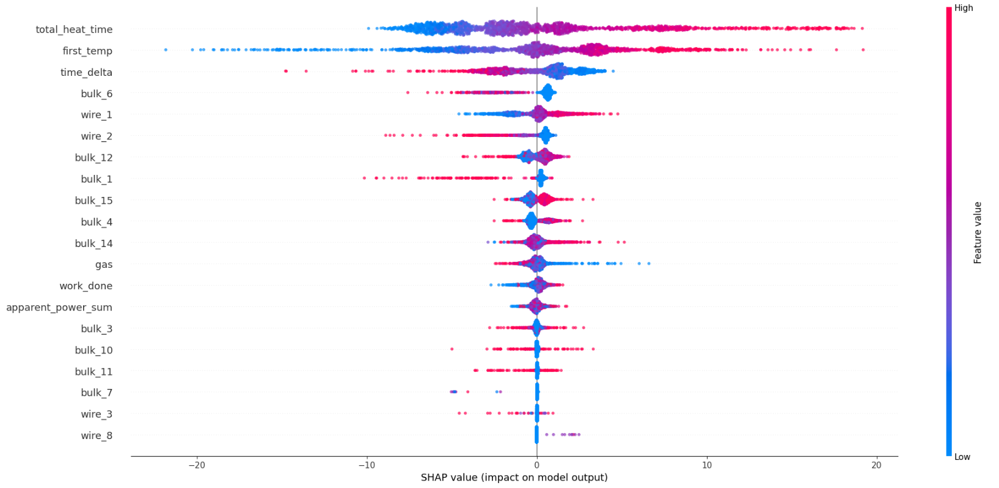

As in the graph of the importance of features, on the graph of the influence of features on model predictions, it can be seen that the features `total_heat_time` and `first_temp`, as well as `time_delta` have the strongest influence on predictions, while:
- Increasing the value of `total_heat_time` significantly shifts model predictions towards increasing temperature values. At the same time, a decrease in the values of this feature leads to a decrease in the values of the final temperature predictions.
- The final temperature value predicted by the model significantly depends on the value of the initial temperature `first_temp`.
- The value of the `time_delta` attribute has a negative correlation with the final temperature: with an increase in the time spent on the ladle, the final temperature decreases and vice versa.
- The situation is the same with the sign `gas`. Increasing the amount of gas supply - reduces the final temperature of the alloy and vice versa - the less gas is used, the higher the final temperature of the alloy.
- Increasing the feed volumes `bulk_6`, `wire_2`, `bulk_12` and `bulk_1` leads to a decrease in the final temperature of the alloy.
- `wire_1` has a strong and uniform effect on the final temperature of the alloy: with a decrease or increase in the supply of this material, the final temperature decreases or increases accordingly.

# Final Report.

In the course of solving the problem of predicting the final temperature of the alloy in the ladle during steelmaking, the following work was done:

**Key steps in solving the problem:**
The main difficulties in creating a model for predicting the final temperature in a steelmaking ladle were:
- <u>Disaggregation of the data provided:</u> To solve the problem, the customer provided data from the production in 7 tables. We were faced with the task of isolating the modeling object (ladle) and the target feature (final temperature) from the provided data.
- <u>Anomalous values:</u> The processing of anomalous values, or rather, its absence, required special attention. Despite the fact that there were a lot of anomalous values ​​in the data, we decided not to process the anomalies, since according to the information from the customer, this is the real data of the production process.
- <u>Data gaps:</u> During data preprocessing, many missing values ​​were found in several tables. We made the decision to replace the missing values ​​with $0$ based on the assumption that at this stage there was no adding certain elements to the bucket.
- <u>Missing information on simulation objects:</u> Some simulation objects (ladles) were missing temperature measurement values. We decided to exclude these objects from the modeling process.

**During pre-processing of data were:**

- Excluded from the analysis are observations in which the temperature was less than 1500 degrees - the melting temperature of steel.
- Fixed erroneous values in the "reactive power" column.
- Emissions were not processed on the assumption that the data provided contains real information about the production process.
- Missing values have been replaced with 0, guided by the fact that if there is a gap in the data, then this material was not added during the production process.

**Based on the data provided, additional features were created to improve the predictive ability of the models:**
- *Apparent Power*: full power
- *Total heat time*: total heating time of the alloy by the electrodes
- *Time delta*: time between first and last bucket temperature reading
- *Work*: Work - as the product of full power and heating time

The data were combined into a final table containing information on each research object (ladle).
- On the training sample, with the help of cross-validation, 3 models were trained: Ridge Linear Regression, RandomForest Regressor and CatBoostRegressor boosting model.
Among these models, the best result was shown by the <u>CatBoostRegressor</u> model with an average absolute error on the test data = $5.89$    

**The CatBoostRegressor model is recommended for implementation**.

The depth of tree construction ($depth$), it is also - the complexity of the model is limited to $6$, which is the optimal value for our data. This depth is sufficient for the boosted model to be able to train well and not overfit. Depth greater than 6 leads to retraining of the model and a significant decrease in the quality of its predictions.
The number of iterations (trees) equal to $2000$ allows the model to find the necessary patterns in the data for more accurate predictions.

A little regularization ($6$) allows you to compensate for multicollinearity in the data and improves the learning process.

***
The MAE (Mean Absolute Error) of the model is $5.89$, which **indicates the excellent quality of the model within the scope of the task**. On average, the model will predict the final temperature with a deviation of $5.89$ degrees from the actual expected temperature.
***

This model can be used in production for:
- Prediction of the final temperature of the alloy in the ladle, based on the planned volume of supplied bulk materials, wire materials and the heating time of the alloy with electrodes.
- Determining the effect of adding new components to the alloy on the final temperature of the alloy. Based on the analysis of the importance of features.
- Analysis of the importance of attributes, to determine the components and stages of the technological process that have the greatest impact on the final temperature of the alloy, in order to control the production process, control the temperature of the alloy.
- Monitoring of the production process at its various stages. The model can signal that, for example, at the current stage of the production process, all the conditions were not met to achieve the optimal temperature at the time of casting the slabs (electrode failed, insufficient / excessive amount of bulk / wire materials was supplied), thereby helping to control the quality of the final product.
- Model predictions and feature importance analysis can be used together to optimize production time to improve performance.